# The task statement

##### The task is to group Youtube channels into categories (music, entertainment, education, etc) according to their uploads, video views and subscribers

# Libraries

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 30)
import matplotlib.pyplot as plt
import seaborn as sb
import missingno as msno
import random as rd

In [2]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans, DBSCAN
#from sklearn.cluster import MiniBatchKMeans, MeanShift, AgglomerativeClustering, Birch
#from sklearn.cluster import OPTICS, SpectralClustering, AffinityPropagation
from sklearn.metrics import silhouette_samples, silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import rand_score, adjusted_rand_score
from sklearn.metrics import mutual_info_score, adjusted_mutual_info_score, normalized_mutual_info_score
from sklearn.metrics import homogeneity_completeness_v_measure, fowlkes_mallows_score
from sklearn.metrics.cluster import contingency_matrix, pair_confusion_matrix

In [3]:
import warnings
warnings.filterwarnings("ignore", category = FutureWarning)
warnings.filterwarnings("ignore", category = UserWarning)

# Dataset

In [4]:
dataset = pd.read_csv('_datasets/Global_YouTube_Statistics.csv', encoding = 'unicode_escape')
dataset

,rank,Youtuber,subscribers,video views,category,Title,uploads,Country,Abbreviation,channel_type,video_views_rank,country_rank,channel_type_rank,video_views_for_the_last_30_days,lowest_monthly_earnings,highest_monthly_earnings,lowest_yearly_earnings,highest_yearly_earnings,subscribers_for_last_30_days,created_year,created_month,created_date,Gross tertiary education enrollment (%),Population,Unemployment rate,Urban_population,Latitude,Longitude
0,1,T-Series,245000000,2.280000e+11,Music,T-Series,20082,India,IN,Music,1.0,1.0,1.0,2.258000e+09,564600.0,9000000.00,6800000.00,1.084000e+08,2000000.0,2006.0,Mar,13.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880
1,2,YouTube Movies,170000000,0.000000e+00,Film & Animation,youtubemovies,1,United States,US,Games,4055159.0,7670.0,7423.0,1.200000e+01,0.0,0.05,0.04,5.800000e-01,NaN,2006.0,Mar,5.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
2,3,MrBeast,166000000,2.836884e+10,Entertainment,MrBeast,741,United States,US,Entertainment,48.0,1.0,1.0,1.348000e+09,337000.0,5400000.00,4000000.00,6.470000e+07,8000000.0,2012.0,Feb,20.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
3,4,Cocomelon - Nursery Rhymes,162000000,1.640000e+11,Education,Cocomelon - Nursery Rhymes,966,United States,US,Education,2.0,2.0,1.0,1.975000e+09,493800.0,7900000.00,5900000.00,9.480000e+07,1000000.0,2006.0,Sep,1.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
4,5,SET India,159000000,1.480000e+11,Shows,SET India,116536,India,IN,Entertainment,3.0,2.0,2.0,1.824000e+09,455900.0,7300000.00,5500000.00,8.750000e+07,1000000.0,2006.0,Sep,20.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
990,991,Natan por Aï¿,12300000,9.029610e+09,Sports,Natan por Aï¿,1200,Brazil,BR,Entertainment,525.0,55.0,172.0,5.525130e+08,138100.0,2200000.00,1700000.00,2.650000e+07,700000.0,2017.0,Feb,12.0,51.3,2.125594e+08,12.08,183241641.0,-14.235004,-51.925280
991,992,Free Fire India Official,12300000,1.674410e+09,People & Blogs,Free Fire India Official,1500,India,IN,Games,6141.0,125.0,69.0,6.473500e+07,16200.0,258900.00,194200.00,3.100000e+06,300000.0,2018.0,Sep,14.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880
992,993,Panda,12300000,2.214684e+09,NaN,HybridPanda,2452,United Kingdom,GB,Games,129005.0,867.0,1202.0,6.703500e+04,17.0,268.00,201.00,3.200000e+03,1000.0,2006.0,Sep,11.0,60.0,6.683440e+07,3.85,55908316.0,55.378051,-3.435973
993,994,RobTopGames,12300000,3.741235e+08,Gaming,RobTopGames,39,Sweden,SE,Games,35112.0,4.0,69.0,3.871000e+06,968.0,15500.00,11600.00,1.858000e+05,100000.0,2012.0,May,9.0,67.0,1.028545e+07,6.48,9021165.0,60.128161,18.643501


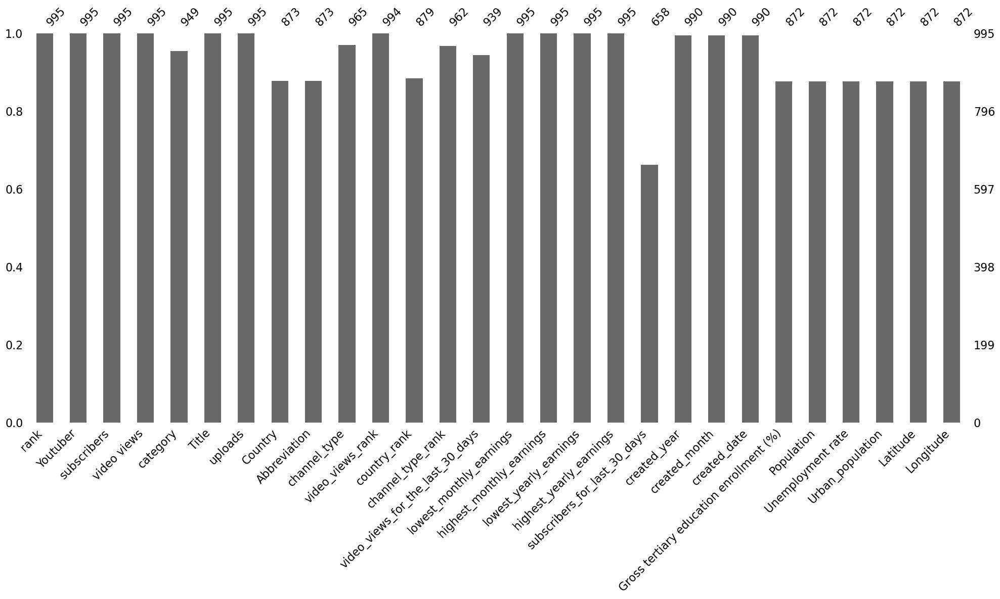

In [5]:
msno.bar(dataset)
plt.show()

In [6]:
dataset.drop(inplace = True, columns = [
    'rank',
    'Youtuber',
    'Title',
    'Country',
    'Abbreviation',
    'channel_type',
    'video_views_rank',
    'country_rank',
    'channel_type_rank',
    'lowest_monthly_earnings',
    'highest_monthly_earnings',
    'lowest_yearly_earnings',
    'highest_yearly_earnings',
    'created_year',
    'created_month',
    'created_date',
    'Gross tertiary education enrollment (%)',
    'Population',
    'Unemployment rate',
    'Urban_population',
    'Latitude',
    'Longitude'
])
dataset

,subscribers,video views,category,uploads,video_views_for_the_last_30_days,subscribers_for_last_30_days
0,245000000,2.280000e+11,Music,20082,2.258000e+09,2000000.0
1,170000000,0.000000e+00,Film & Animation,1,1.200000e+01,NaN
2,166000000,2.836884e+10,Entertainment,741,1.348000e+09,8000000.0
3,162000000,1.640000e+11,Education,966,1.975000e+09,1000000.0
4,159000000,1.480000e+11,Shows,116536,1.824000e+09,1000000.0
...,...,...,...,...,...,...
990,12300000,9.029610e+09,Sports,1200,5.525130e+08,700000.0
991,12300000,1.674410e+09,People & Blogs,1500,6.473500e+07,300000.0
992,12300000,2.214684e+09,NaN,2452,6.703500e+04,1000.0
993,12300000,3.741235e+08,Gaming,39,3.871000e+06,100000.0


In [7]:
def dataset_lookup(df):
    print('Dataset info:')
    print(df.info())
    print()
    print('Dataset description:')
    print(df.describe())
    print()
    print('Amount of duplicates:')
    duplicates_amount = df.duplicated().sum()
    print(duplicates_amount)
    if (duplicates_amount > 0):
        print('Duplicates:')
        print(df[df.duplicated()])
    print()
    print('Amount of missing values:')
    print(df.isna().sum(axis = 0))
    print()
    print('Unique values in each column:')
    for column_name in list(df.columns.values):
        print(column_name)
        print(df[column_name].unique())
        print('------')

dataset_lookup(dataset)

Dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 995 entries, 0 to 994
Data columns (total 6 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   subscribers                       995 non-null    int64  
 1   video views                       995 non-null    float64
 2   category                          949 non-null    object 
 3   uploads                           995 non-null    int64  
 4   video_views_for_the_last_30_days  939 non-null    float64
 5   subscribers_for_last_30_days      658 non-null    float64
dtypes: float64(3), int64(2), object(1)
memory usage: 46.8+ KB
None

Dataset description:
        subscribers   video views        uploads   
count  9.950000e+02  9.950000e+02     995.000000  \
mean   2.298241e+07  1.103954e+10    9187.125628   
std    1.752611e+07  1.411084e+10   34151.352254   
min    1.230000e+07  0.000000e+00       0.000000   
25%    1.450000e+07  4.28814

In [8]:
dataset['category'] = dataset['category'].fillna('Other')
dataset['video_views_for_the_last_30_days'] = dataset['video_views_for_the_last_30_days'].fillna(dataset['video_views_for_the_last_30_days'].median())
dataset['subscribers_for_last_30_days'] = dataset['subscribers_for_last_30_days'].fillna(dataset['subscribers_for_last_30_days'].median())
dataset

,subscribers,video views,category,uploads,video_views_for_the_last_30_days,subscribers_for_last_30_days
0,245000000,2.280000e+11,Music,20082,2.258000e+09,2000000.0
1,170000000,0.000000e+00,Film & Animation,1,1.200000e+01,200000.0
2,166000000,2.836884e+10,Entertainment,741,1.348000e+09,8000000.0
3,162000000,1.640000e+11,Education,966,1.975000e+09,1000000.0
4,159000000,1.480000e+11,Shows,116536,1.824000e+09,1000000.0
...,...,...,...,...,...,...
990,12300000,9.029610e+09,Sports,1200,5.525130e+08,700000.0
991,12300000,1.674410e+09,People & Blogs,1500,6.473500e+07,300000.0
992,12300000,2.214684e+09,Other,2452,6.703500e+04,1000.0
993,12300000,3.741235e+08,Gaming,39,3.871000e+06,100000.0


In [9]:
print(dataset['category'].unique())
print(len(dataset['category'].unique()))

['Music' 'Film & Animation' 'Entertainment' 'Education' 'Shows' 'Other'
 'People & Blogs' 'Gaming' 'Sports' 'Howto & Style' 'News & Politics'
 'Comedy' 'Trailers' 'Nonprofits & Activism' 'Science & Technology'
 'Movies' 'Pets & Animals' 'Autos & Vehicles' 'Travel & Events']
19


In [10]:
dataset['category'] = dataset['category'].replace('Trailers', 'Entertainment')
dataset['category'] = dataset['category'].replace('Film & Animation', 'Entertainment')
dataset['category'] = dataset['category'].replace('Movies', 'Entertainment')
dataset['category'] = dataset['category'].replace('Comedy', 'Entertainment')
dataset['category'] = dataset['category'].replace('Autos & Vehicles', 'Science & Technology')
dataset['category'] = dataset['category'].replace('Shows', 'Entertainment')
dataset['category'] = dataset['category'].replace('Howto & Style', 'People & Blogs')
dataset['category'] = dataset['category'].replace('Nonprofits & Activism', 'People & Blogs')
dataset['category'] = dataset['category'].replace('Pets & Animals', 'People & Blogs')
dataset['category'] = dataset['category'].replace('Travel & Events', 'People & Blogs')

In [11]:
print(dataset['category'].unique())
print(len(dataset['category'].unique()))

['Music' 'Entertainment' 'Education' 'Other' 'People & Blogs' 'Gaming'
 'Sports' 'News & Politics' 'Science & Technology']
9


# Visual representation of the dataset

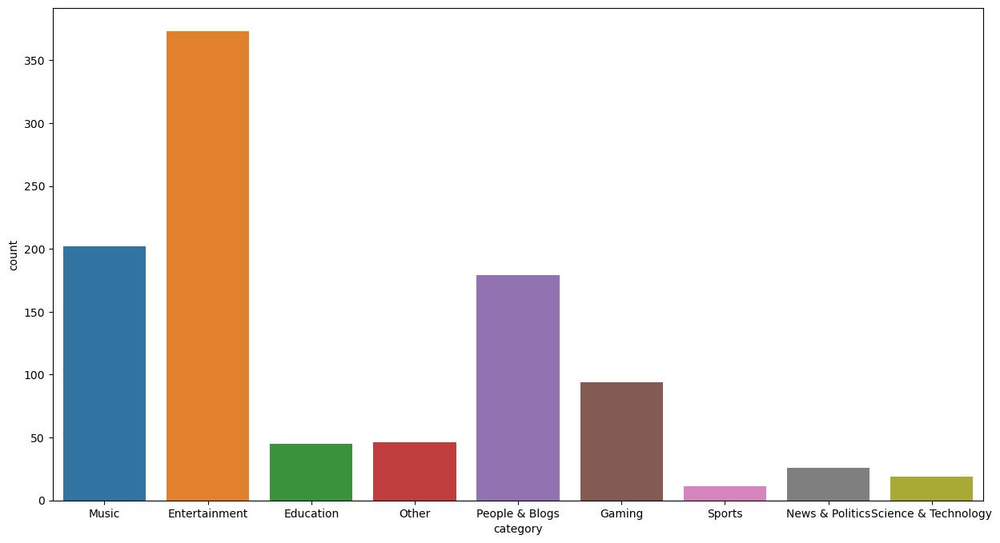

In [12]:
plt.figure(figsize = (15, 8))
sb.countplot(x = dataset['category'])
plt.show()

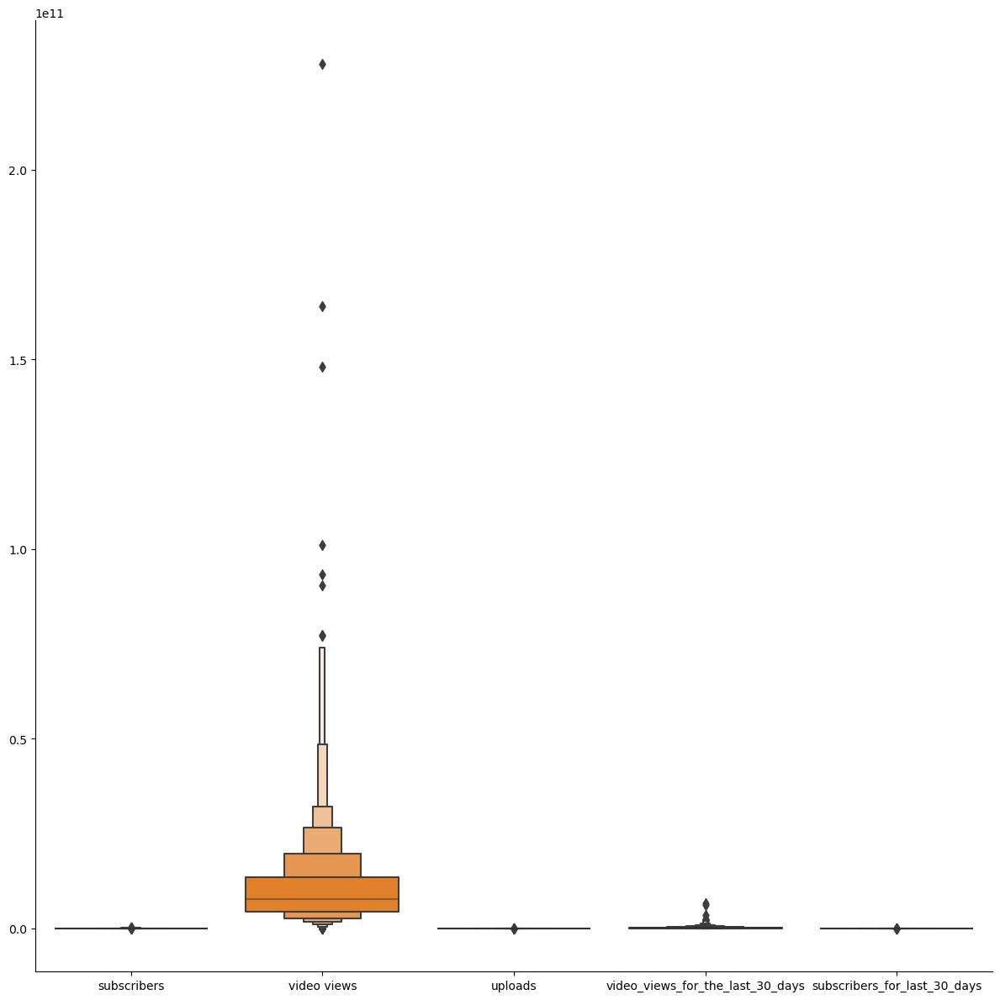

In [16]:
sb.catplot(dataset, kind = 'boxen', height = 12)
plt.show()

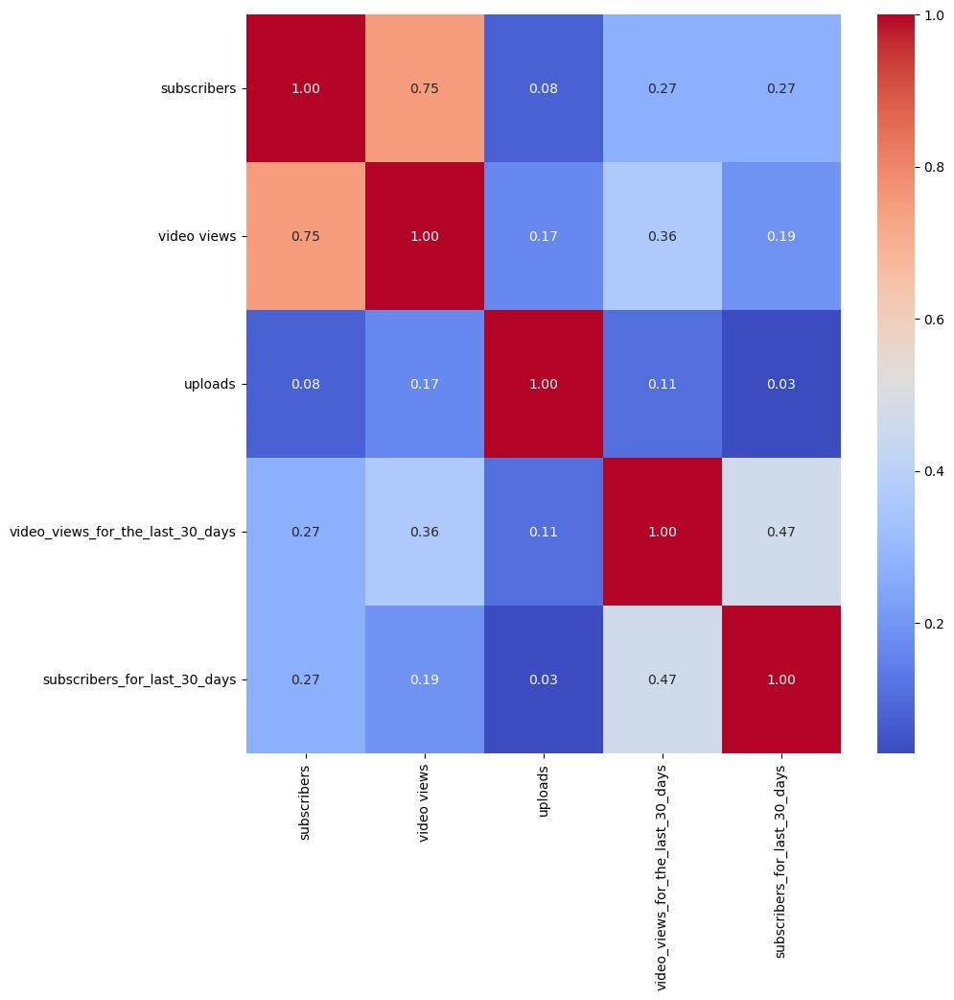

In [17]:
plt.figure(figsize = (10, 10))
sb.heatmap(dataset.drop(columns = ['category']).corr(), annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.show()

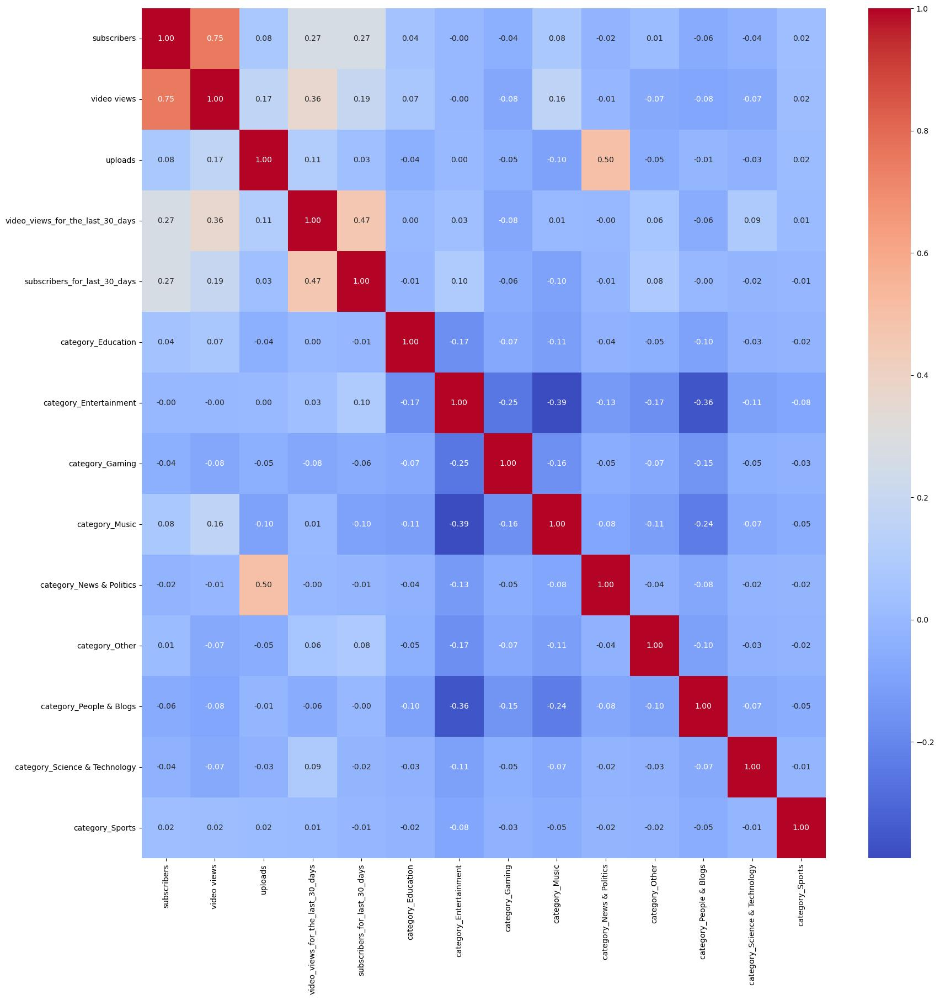

In [18]:
plt.figure(figsize = (20, 20))
sb.heatmap(pd.get_dummies(dataset, columns = ['category']).corr(), annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.show()

<Figure size 2000x2000 with 0 Axes>

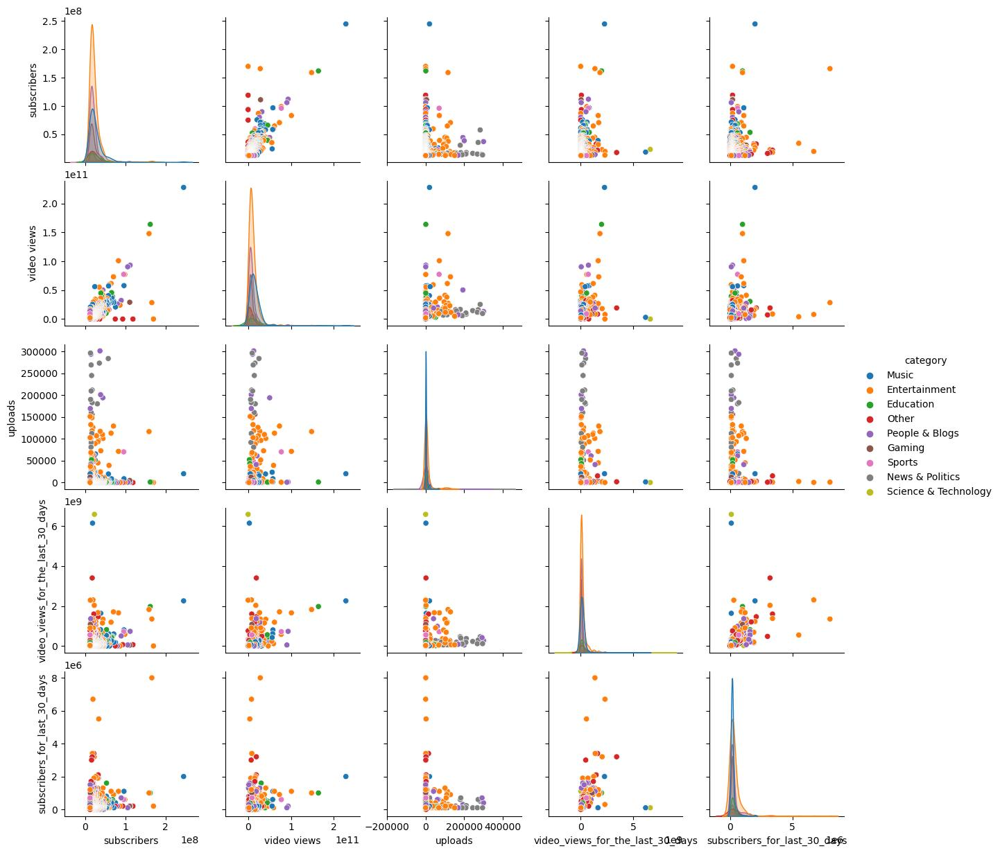

In [19]:
plt.figure(figsize = (20, 20))
sb.pairplot(dataset, palette = 'tab10', hue = 'category')
plt.show()

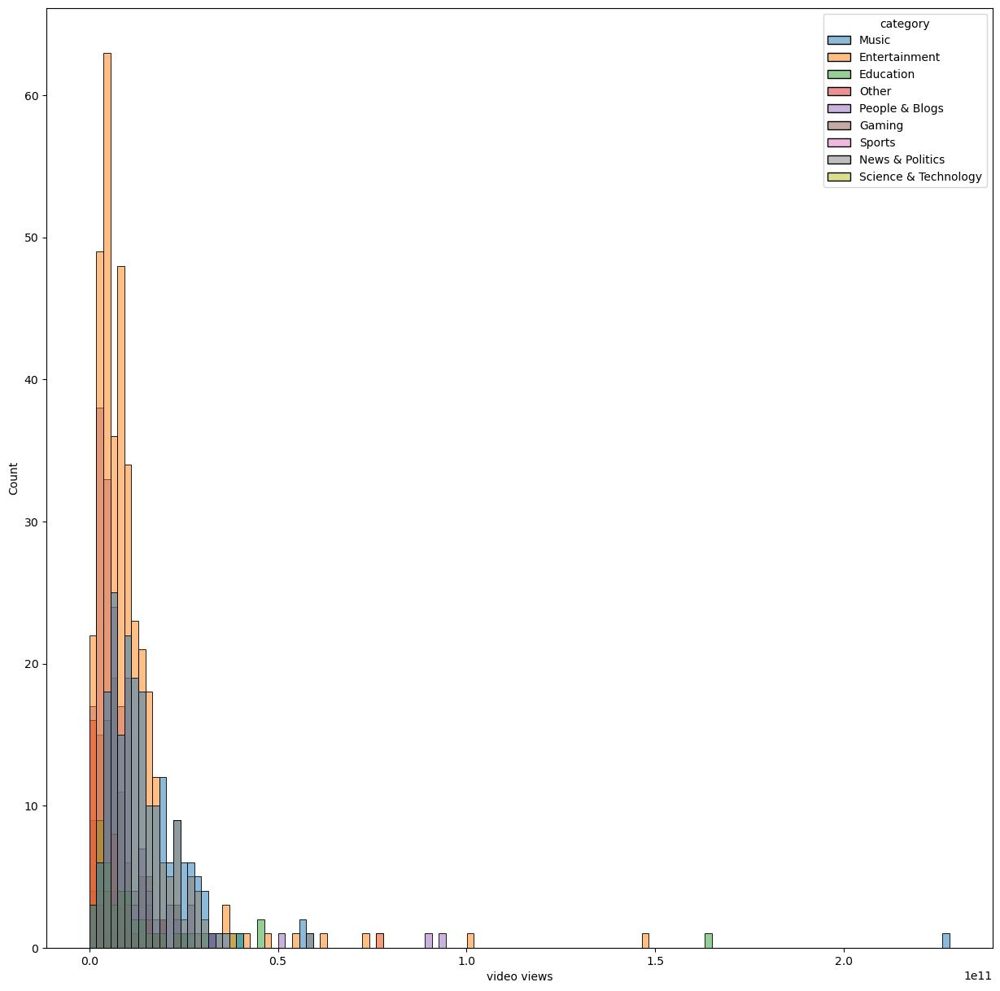

In [20]:
plt.figure(figsize = (15, 15))
sb.histplot(palette = 'tab10', data = dataset, x = dataset['video views'], hue = dataset['category'])
plt.show()

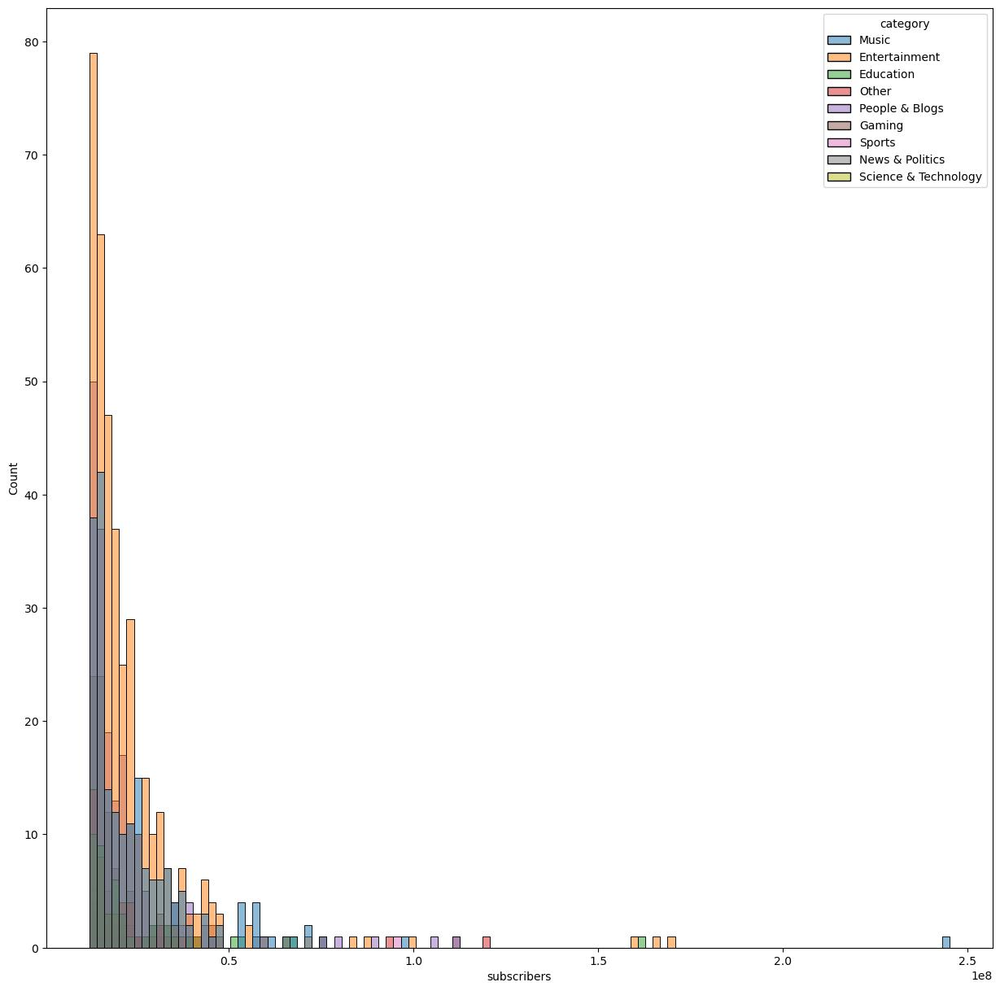

In [21]:
plt.figure(figsize = (15, 15))
sb.histplot(palette = 'tab10', data = dataset, x = dataset['subscribers'], hue = dataset['category'])
plt.show()

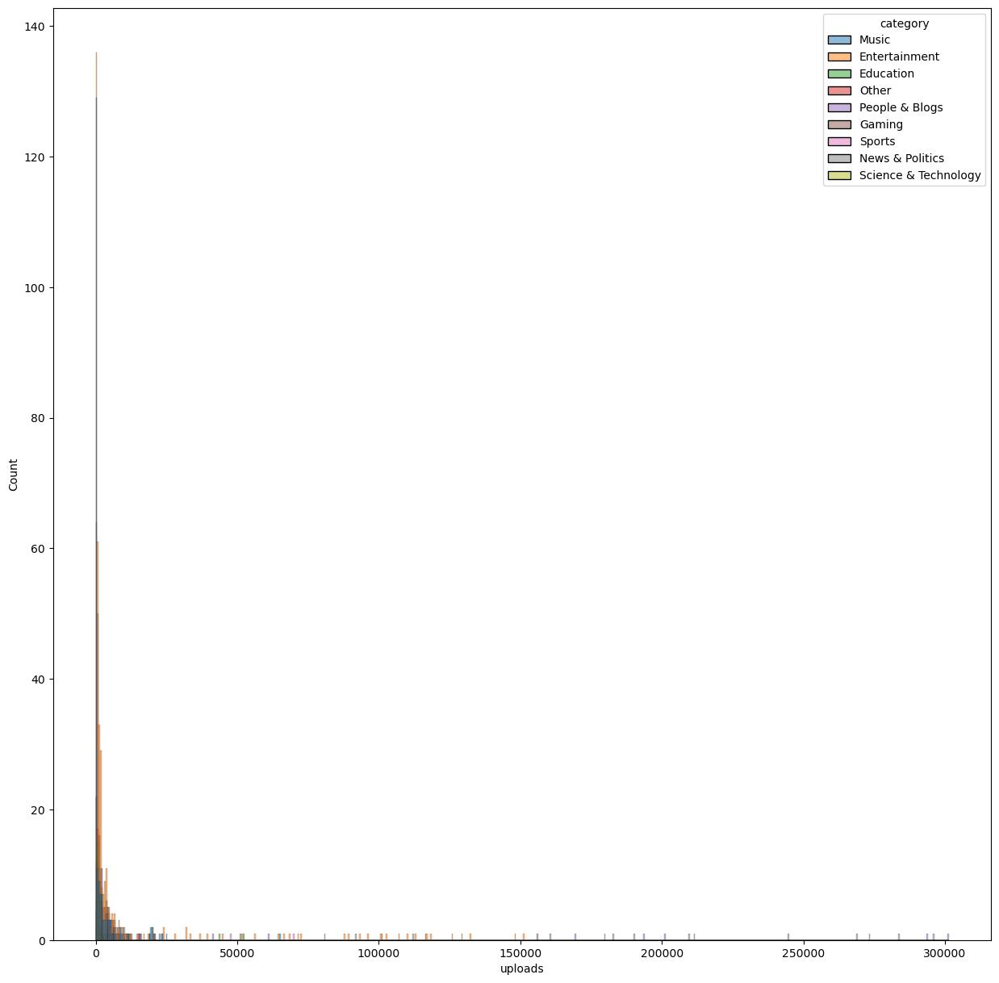

In [22]:
plt.figure(figsize = (15, 15))
sb.histplot(palette = 'tab10', data = dataset, x = dataset['uploads'], hue = dataset['category'])
plt.show()

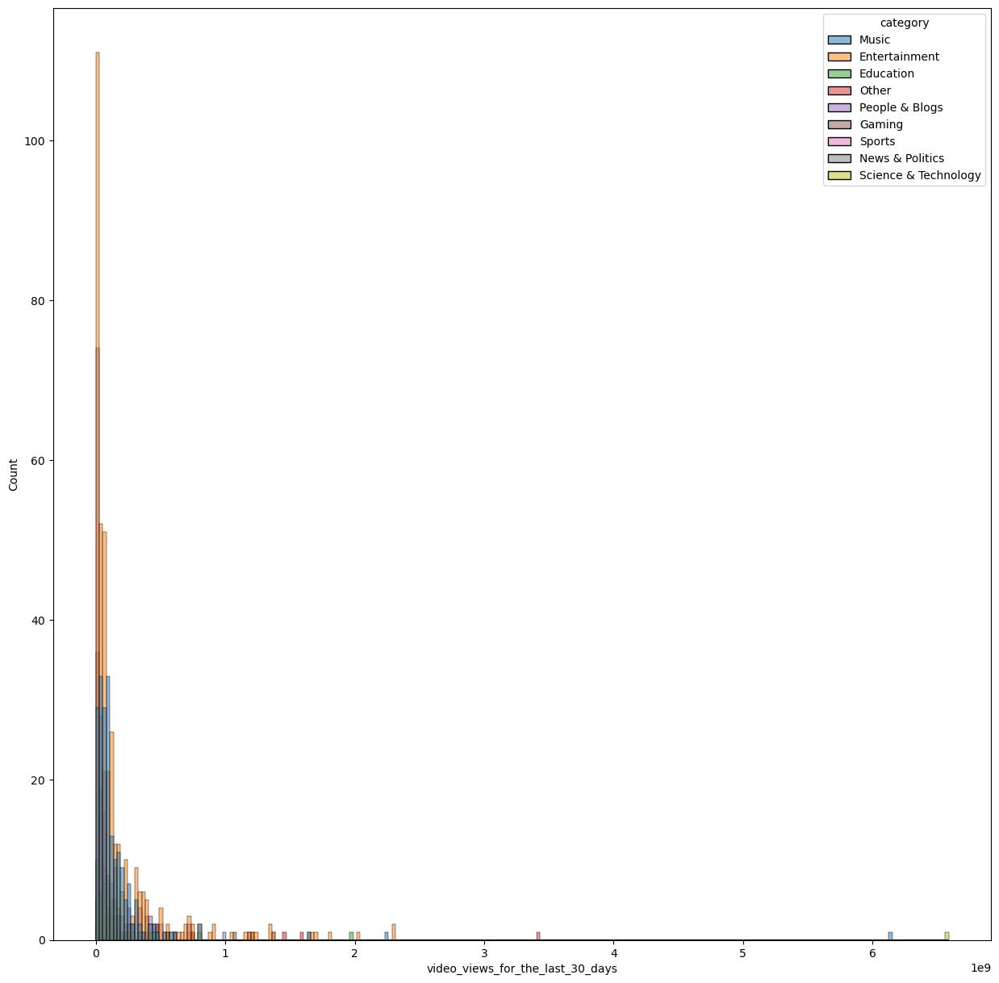

In [23]:
plt.figure(figsize = (15, 15))
sb.histplot(palette = 'tab10', data = dataset, x = dataset['video_views_for_the_last_30_days'], hue = dataset['category'])
plt.show()

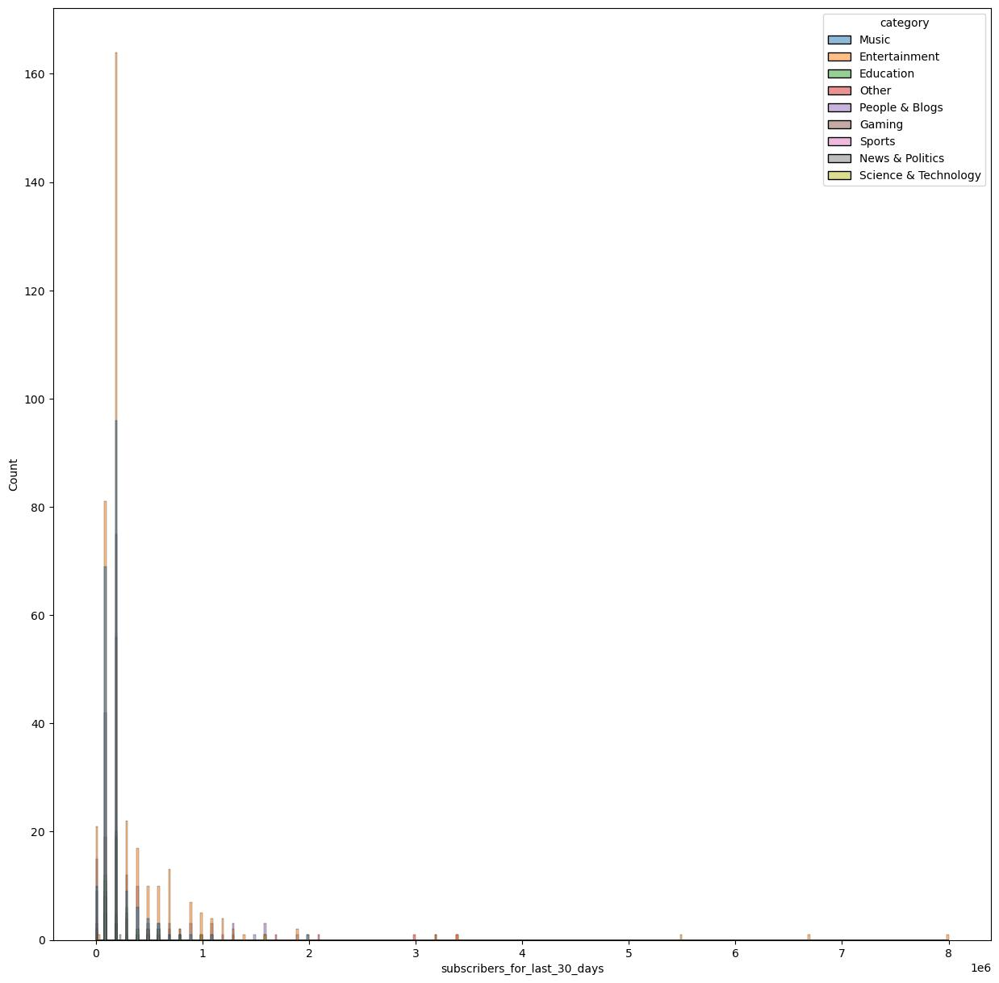

In [24]:
plt.figure(figsize = (15, 15))
sb.histplot(palette = 'tab10', data = dataset, x = dataset['subscribers_for_last_30_days'], hue = dataset['category'])
plt.show()

# Standardization

In [25]:
dataset_numerical_only = dataset.drop(
    columns = [
        'category'
    ])
dataset_numerical_only

,subscribers,video views,uploads,video_views_for_the_last_30_days,subscribers_for_last_30_days
0,245000000,2.280000e+11,20082,2.258000e+09,2000000.0
1,170000000,0.000000e+00,1,1.200000e+01,200000.0
2,166000000,2.836884e+10,741,1.348000e+09,8000000.0
3,162000000,1.640000e+11,966,1.975000e+09,1000000.0
4,159000000,1.480000e+11,116536,1.824000e+09,1000000.0
...,...,...,...,...,...
990,12300000,9.029610e+09,1200,5.525130e+08,700000.0
991,12300000,1.674410e+09,1500,6.473500e+07,300000.0
992,12300000,2.214684e+09,2452,6.703500e+04,1000.0
993,12300000,3.741235e+08,39,3.871000e+06,100000.0


In [28]:
scaler = StandardScaler()
dataset_standardized = pd.DataFrame(
    scaler.fit_transform(dataset_numerical_only),
    columns = [
        'subscribers',
        'video views',
        'uploads',
        'video_views_for_the_last_30_days',
        'subscribers_for_last_30_days'
    ])
dataset_standardized.insert(5, 'category', dataset['category'])
dataset_standardized

,subscribers,video views,uploads,video_views_for_the_last_30_days,subscribers_for_last_30_days,category
0,12.674193,15.383174,0.319178,5.156029,3.374616,Music
1,8.392710,-0.782738,-0.269118,-0.418012,-0.195539,Entertainment
2,8.164364,1.228702,-0.247439,2.909626,15.275134,Entertainment
3,7.936019,10.845374,-0.240847,4.457422,1.391196,Education
4,7.764759,9.710924,3.144908,4.084667,1.391196,Entertainment
...,...,...,...,...,...,...
990,-0.609821,-0.142510,-0.233992,0.945907,0.796170,Sports
991,-0.609821,-0.664017,-0.225203,-0.258209,0.002803,People & Blogs
992,-0.609821,-0.625710,-0.197313,-0.417847,-0.590240,Other
993,-0.609821,-0.756211,-0.268005,-0.408456,-0.393881,Gaming


# Non-numeric features encoding

In [30]:
label_encoder = LabelEncoder()
dataset_encoded = dataset_standardized.copy()
dataset_encoded['category'] = label_encoder.fit_transform(dataset_encoded['category'])
dataset_encoded

,subscribers,video views,uploads,video_views_for_the_last_30_days,subscribers_for_last_30_days,category
0,12.674193,15.383174,0.319178,5.156029,3.374616,3
1,8.392710,-0.782738,-0.269118,-0.418012,-0.195539,1
2,8.164364,1.228702,-0.247439,2.909626,15.275134,1
3,7.936019,10.845374,-0.240847,4.457422,1.391196,0
4,7.764759,9.710924,3.144908,4.084667,1.391196,1
...,...,...,...,...,...,...
990,-0.609821,-0.142510,-0.233992,0.945907,0.796170,8
991,-0.609821,-0.664017,-0.225203,-0.258209,0.002803,6
992,-0.609821,-0.625710,-0.197313,-0.417847,-0.590240,5
993,-0.609821,-0.756211,-0.268005,-0.408456,-0.393881,2


# Quick classification test

In [31]:
x = dataset_encoded.drop(columns = ['category'])
y = dataset_encoded['category']

In [32]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25, random_state = 42, shuffle = True)
print(f'x train: {x_train.shape}')
print(f'y train: {y_train.shape}')
print()
print(f'x test: {x_test.shape}')
print(f'y test: {y_test.shape}')

x train: (746, 5)
y train: (746,)

x test: (249, 5)
y test: (249,)


LR: mean - 0.408972972972973; std - 0.0384275622751076
LDA: mean - 0.3632972972972973; std - 0.030345150840470087
KNN: mean - 0.3874954954954955; std - 0.05039850607726608
CART: mean - 0.35390990990990995; std - 0.04486803418741671
NB: mean - 0.17967567567567572; std - 0.03661062632052616
SVM: mean - 0.425027027027027; std - 0.046899031918266144
RF: mean - 0.428954954954955; std - 0.045861929897369216


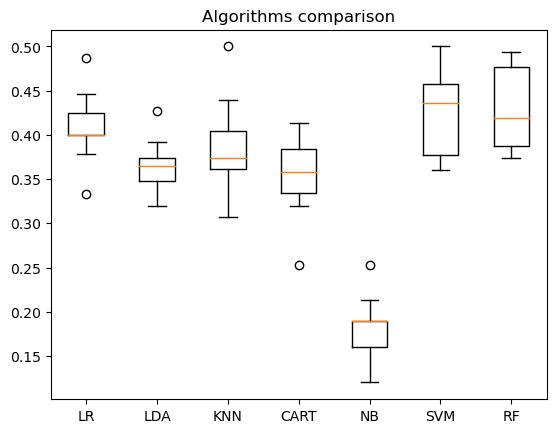

In [33]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score

models = []
models.append(('LR', LogisticRegression(random_state = 42, n_jobs = -1)))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier(n_neighbors = 20, n_jobs = -1)))
models.append(('CART', DecisionTreeClassifier(random_state = 42)))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(gamma = 'auto', random_state = 42)))
models.append(('RF', RandomForestClassifier(n_jobs = -1, random_state = 42)))
results = []
names = []
for name, model in models:
    kfold = StratifiedKFold(n_splits = 10, random_state = 42, shuffle = True)
    cv_results = cross_val_score(model, x_train, y_train, cv = kfold, scoring = 'accuracy')
    results.append(cv_results)
    names.append(name)
    print(f'{name}: mean - {cv_results.mean()}; std - {cv_results.std()}')
plt.boxplot(results, labels = names)
plt.title('Algorithms comparison')
plt.show()

# Pairplot for the processed dataset

<Figure size 2000x2000 with 0 Axes>

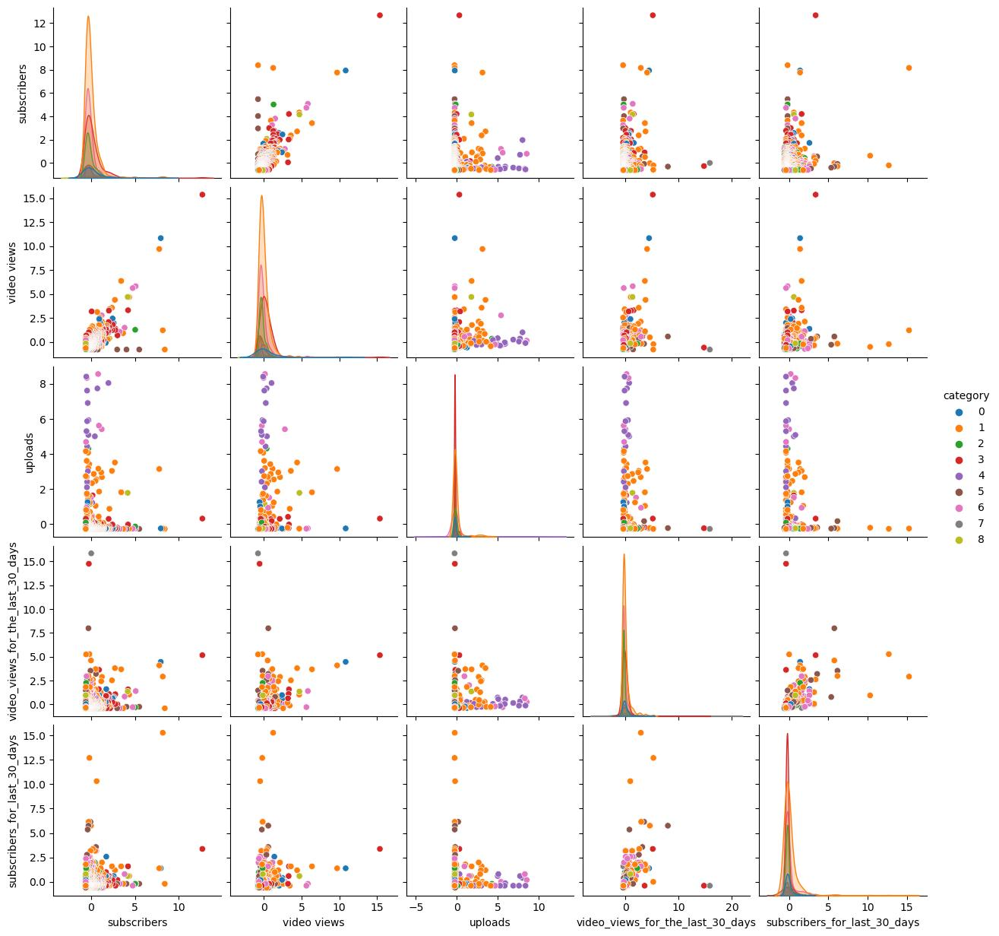

In [34]:
plt.figure(figsize = (20, 20))
sb.pairplot(dataset_encoded, palette = 'tab10', hue = 'category')
plt.show()

# K-Means clustering

In [35]:
dataset_clustering = dataset_encoded.drop(columns = ['category'])
dataset_clustering

,subscribers,video views,uploads,video_views_for_the_last_30_days,subscribers_for_last_30_days
0,12.674193,15.383174,0.319178,5.156029,3.374616
1,8.392710,-0.782738,-0.269118,-0.418012,-0.195539
2,8.164364,1.228702,-0.247439,2.909626,15.275134
3,7.936019,10.845374,-0.240847,4.457422,1.391196
4,7.764759,9.710924,3.144908,4.084667,1.391196
...,...,...,...,...,...
990,-0.609821,-0.142510,-0.233992,0.945907,0.796170
991,-0.609821,-0.664017,-0.225203,-0.258209,0.002803
992,-0.609821,-0.625710,-0.197313,-0.417847,-0.590240
993,-0.609821,-0.756211,-0.268005,-0.408456,-0.393881


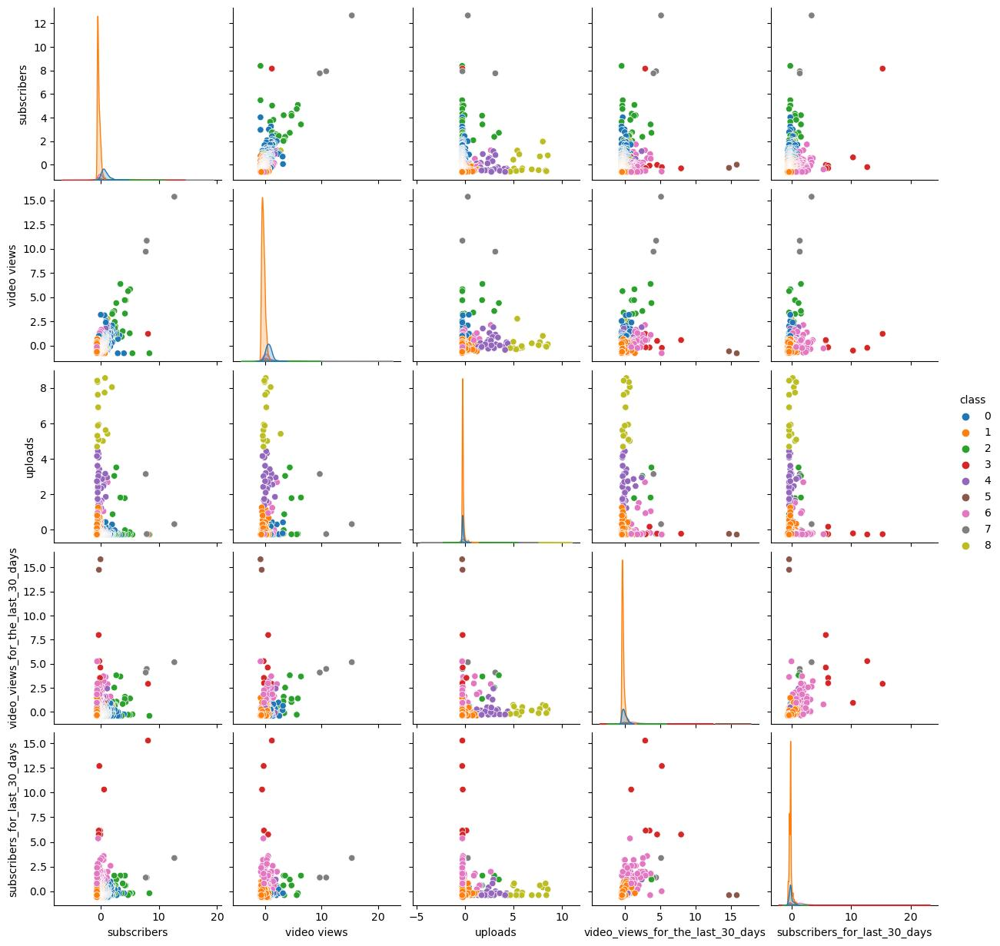

In [36]:
kmeans = KMeans(n_clusters = 9, random_state = 42)
dataset_labeled = dataset_clustering.copy()
dataset_labeled['class'] = kmeans.fit_predict(dataset_clustering.values)
sb.pairplot(dataset_labeled, hue = 'class', palette = 'tab10')
plt.show()

## Best clustering metric scores for K-Means

In [37]:
def print_best_coefficients(method_name, scores, find_max = True):
    sorted_scores = sorted(scores, key = lambda x: x[1], reverse = find_max)
    max_score = sorted_scores[0]
    print(f'{"Max." if find_max else "Min."} {method_name} score: {max_score[1]:.3f} (clusters: {max_score[0]})')

X = dataset_clustering.values
true_labels = dataset_encoded['category']

se = [] 
sil_scores = []
calinski_scores = []
davies_scores = []
rand_scores = []
adjusted_rand_scores = []
mutual_info_scores = []
adjusted_mutual_info_scores = []
normalized_mutual_info_scores = []
homogeneity_scores = []
completeness_scores = []
v_measure_scores = []
fowlkes_mallows_scores = []
contingency_matrices = []
pair_confusion_matrices = []

index = range(2, 21)
for i in index:
    kmeans = KMeans(n_clusters = i, random_state = 42)
    predicted_labels = kmeans.fit_predict(X)
    print(f'Intertia at K = {i}: {kmeans.inertia_:.3f}')
    se.append(kmeans.inertia_)
    
    sil_score = silhouette_score(X, predicted_labels)
    print(f'Silhouette coefficient: {sil_score:.3f}')
    sil_scores.append((i, sil_score))
    
    calinski_score = calinski_harabasz_score(X, predicted_labels)
    print(f'Calinski-Harabasz score: {calinski_score:.3f}')
    calinski_scores.append((i, calinski_score))
    
    davies_score = davies_bouldin_score(X, predicted_labels)
    print(f'Davies-Bouldin score: {davies_score:.3f}')
    davies_scores.append((i, davies_score))
    
    rand_score_result = rand_score(true_labels, predicted_labels)
    print(f'Rand score: {rand_score_result:.3f}')
    rand_scores.append((i, rand_score_result))
    
    adjusted_rand_score_result = adjusted_rand_score(true_labels, predicted_labels)
    print(f'Adjusted Rand score: {adjusted_rand_score_result:.3f}')
    adjusted_rand_scores.append((i, adjusted_rand_score_result))
    
    mutual_info_score_result = mutual_info_score(true_labels, predicted_labels)
    print(f'Mutual info score: {mutual_info_score_result:.3f}')
    mutual_info_scores.append((i, mutual_info_score_result))
    
    adjusted_mutual_info_score_result = adjusted_mutual_info_score(true_labels, predicted_labels)
    print(f'Adjusted mutual info score: {adjusted_mutual_info_score_result:.3f}')
    adjusted_mutual_info_scores.append((i, adjusted_mutual_info_score_result))
    
    normalized_mutual_info_score_result = normalized_mutual_info_score(true_labels, predicted_labels)
    print(f'Normalized mutual info score: {normalized_mutual_info_score_result:.3f}')
    normalized_mutual_info_scores.append((i, normalized_mutual_info_score_result))
    
    homogeneity_score, completeness_score, v_measure_score = homogeneity_completeness_v_measure(true_labels, predicted_labels)
    print(f'Homogeneity score: {homogeneity_score:.3f}')
    print(f'Completeness score: {completeness_score:.3f}')
    print(f'V-measure score: {v_measure_score:.3f}')
    homogeneity_scores.append((i, homogeneity_score))
    completeness_scores.append((i, completeness_score))
    v_measure_scores.append((i, v_measure_score))
    
    fowlkes_mallows_score_result = fowlkes_mallows_score(true_labels, predicted_labels)
    print(f'Fowlkes-Mallows score: {fowlkes_mallows_score_result:.3f}')
    fowlkes_mallows_scores.append((i, fowlkes_mallows_score_result))
    
    contingency_matrix_result = contingency_matrix(true_labels, predicted_labels)
    contingency_matrices.append((i, contingency_matrix_result))
    
    pair_confusion_matrix_result = pair_confusion_matrix(true_labels, predicted_labels)
    pair_confusion_matrices.append((i, pair_confusion_matrix_result))
    print()

print_best_coefficients('Silhouette', sil_scores)
print()
print_best_coefficients('Calinski-Harabasz', calinski_scores)
print()
print_best_coefficients('Davies-Bouldin', davies_scores, False)
print()
print_best_coefficients('Rand', rand_scores)
print()
print_best_coefficients('Adjusted Rand', adjusted_rand_scores)
print()
print_best_coefficients('Mutual info', mutual_info_scores)
print()
print_best_coefficients('Adjusted mutual info', adjusted_mutual_info_scores)
print()
print_best_coefficients('Normalized mutual info', normalized_mutual_info_scores)
print()
print_best_coefficients('Homogeneity', homogeneity_scores)
print()
print_best_coefficients('Completeness', completeness_scores)
print()
print_best_coefficients('V-measure', v_measure_scores)
print()
print_best_coefficients('Fowlkes-Mallows', fowlkes_mallows_scores)
print()

Intertia at K = 2: 3762.642
Silhouette coefficient: 0.771
Calinski-Harabasz score: 319.954
Davies-Bouldin score: 1.200
Rand score: 0.272
Adjusted Rand score: 0.002
Mutual info score: 0.006
Adjusted mutual info score: 0.001
Normalized mutual info score: 0.006
Homogeneity score: 0.003
Completeness score: 0.033
V-measure score: 0.006
Fowlkes-Mallows score: 0.459

Intertia at K = 3: 2990.250
Silhouette coefficient: 0.729
Calinski-Harabasz score: 329.215
Davies-Bouldin score: 1.110
Rand score: 0.288
Adjusted Rand score: 0.004
Mutual info score: 0.042
Adjusted mutual info score: 0.034
Normalized mutual info score: 0.043
Homogeneity score: 0.025
Completeness score: 0.168
V-measure score: 0.043
Fowlkes-Mallows score: 0.455

Intertia at K = 4: 2440.199
Silhouette coefficient: 0.727
Calinski-Harabasz score: 343.140
Davies-Bouldin score: 0.962
Rand score: 0.299
Adjusted Rand score: 0.004
Mutual info score: 0.053
Adjusted mutual info score: 0.040
Normalized mutual info score: 0.052
Homogeneity sco

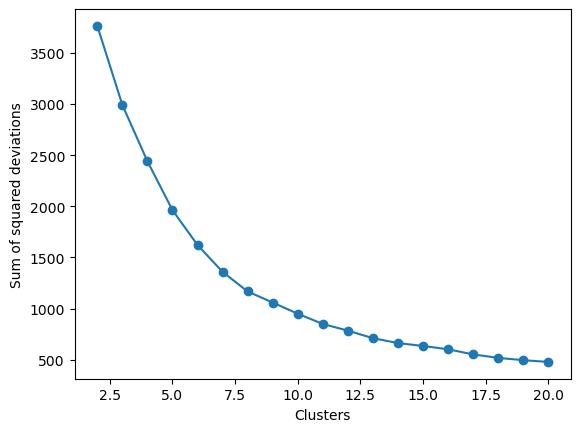

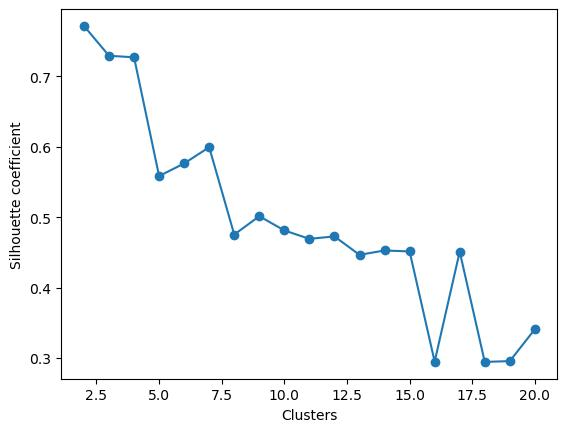

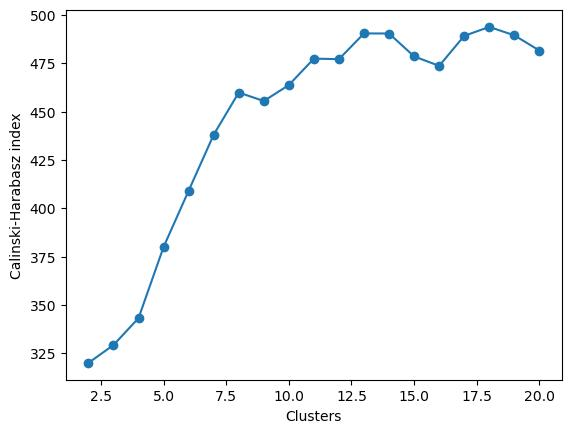

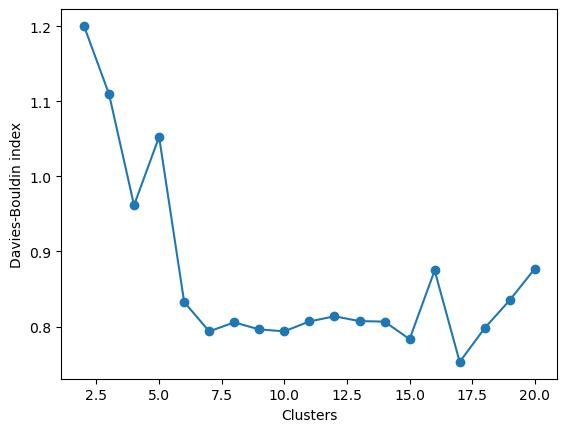

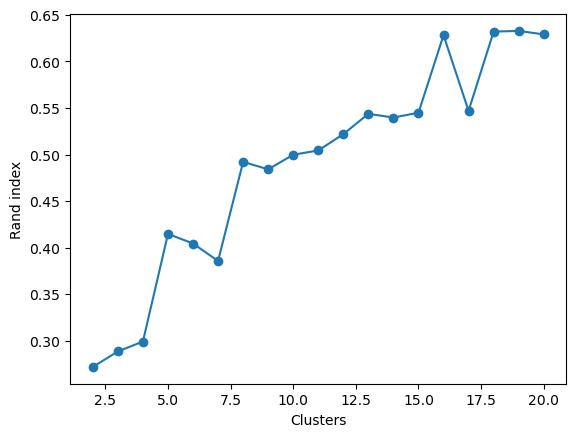

...

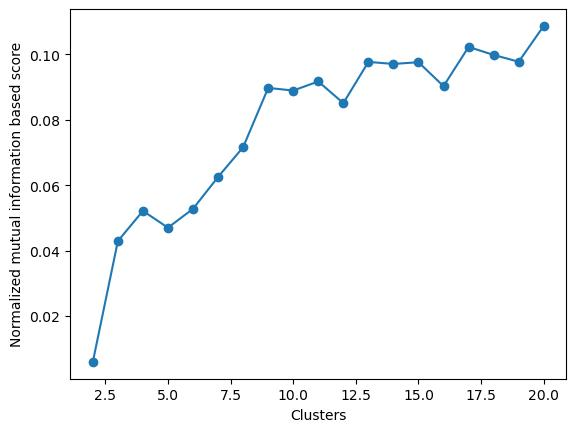

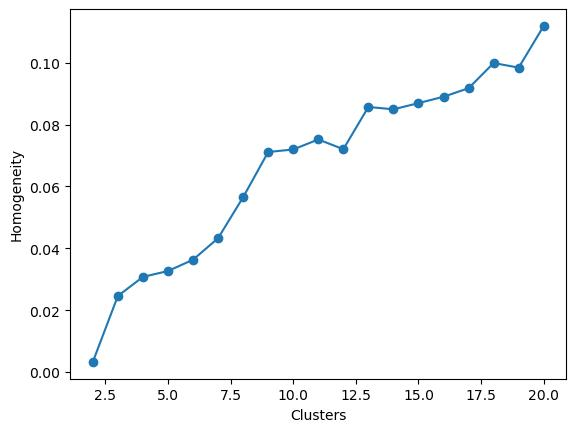

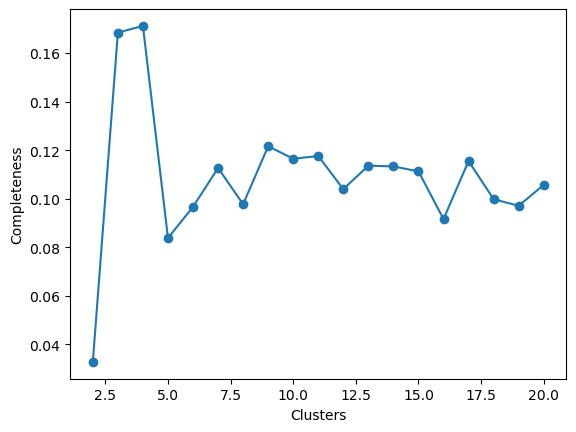

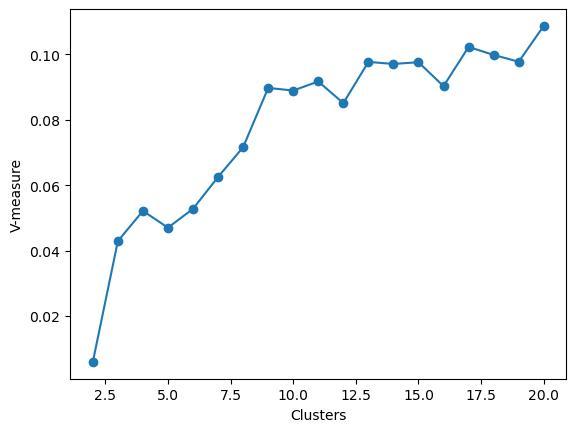

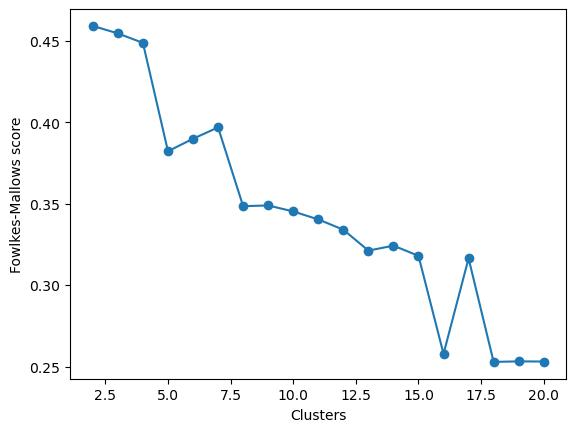

In [60]:
def plot_scores(indexes, scores, ylabel):
    plt.plot(indexes, scores, marker = 'o')
    plt.xlabel('Clusters')
    plt.ylabel(ylabel)
    plt.show()
    
def plot_scores_from_values(indexes, score_tuples, ylabel):
    _, scores = zip(*score_tuples)
    plt.plot(indexes, scores, marker = 'o')
    plt.xlabel('Clusters')
    plt.ylabel(ylabel)
    plt.show()

plot_scores(index, se, 'Sum of squared deviations')
plot_scores_from_values(index, sil_scores, 'Silhouette coefficient')
plot_scores_from_values(index, calinski_scores, 'Calinski-Harabasz index')
plot_scores_from_values(index, davies_scores, 'Davies-Bouldin index')
plot_scores_from_values(index, rand_scores, 'Rand index')
plot_scores_from_values(index, adjusted_rand_scores, 'Adjusted Rand index')
plot_scores_from_values(index, mutual_info_scores, 'Mutual information based score')
plot_scores_from_values(index, adjusted_mutual_info_scores, 'Adjusted mutual information based score')
plot_scores_from_values(index, normalized_mutual_info_scores, 'Normalized mutual information based score')
plot_scores_from_values(index, homogeneity_scores, 'Homogeneity')
plot_scores_from_values(index, completeness_scores, 'Completeness')
plot_scores_from_values(index, v_measure_scores, 'V-measure')
plot_scores_from_values(index, fowlkes_mallows_scores, 'Fowlkes-Mallows score')

№ of clusters: 2


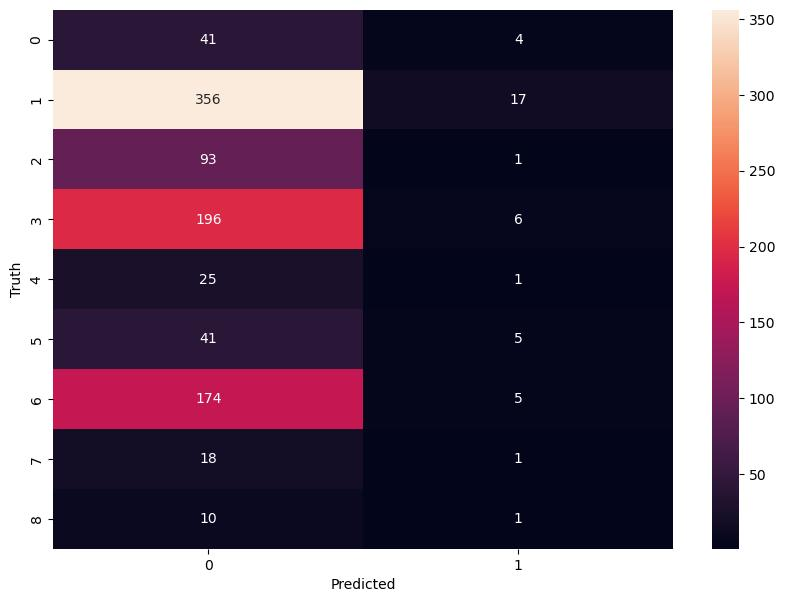

№ of clusters: 3


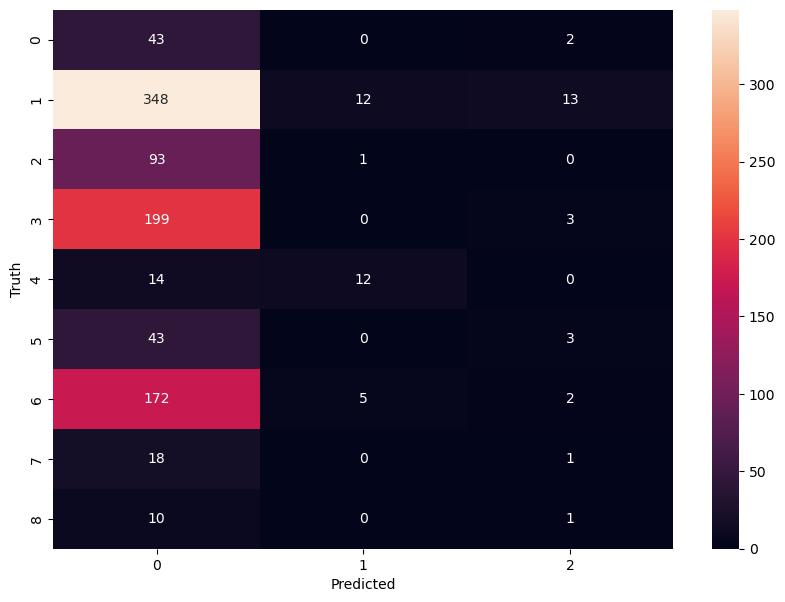

№ of clusters: 4


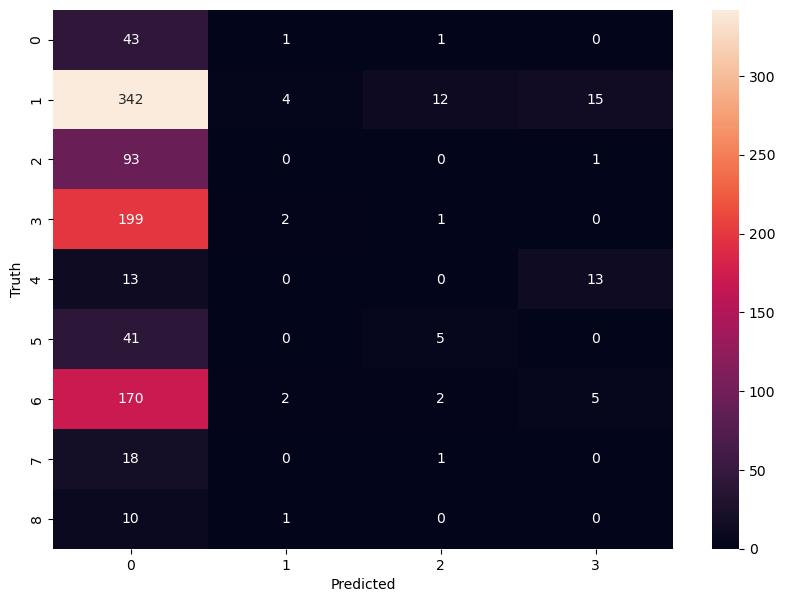

№ of clusters: 5


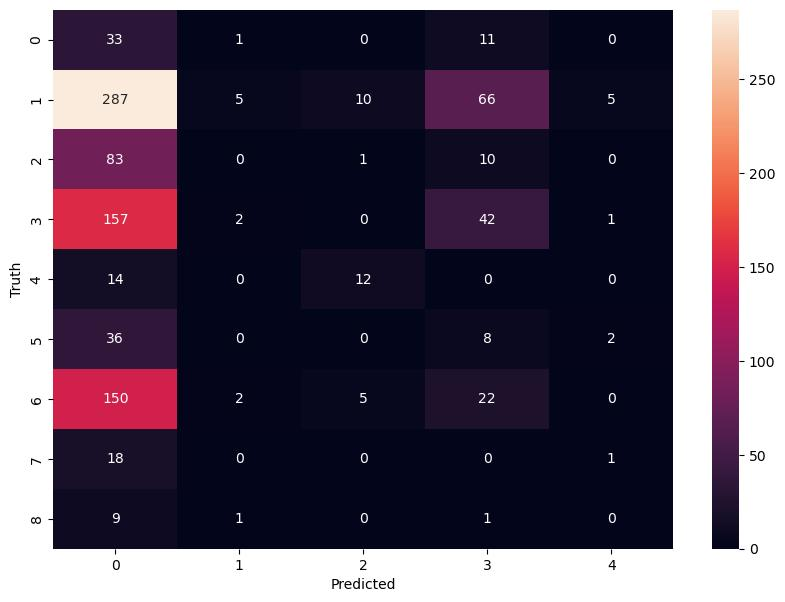

№ of clusters: 6


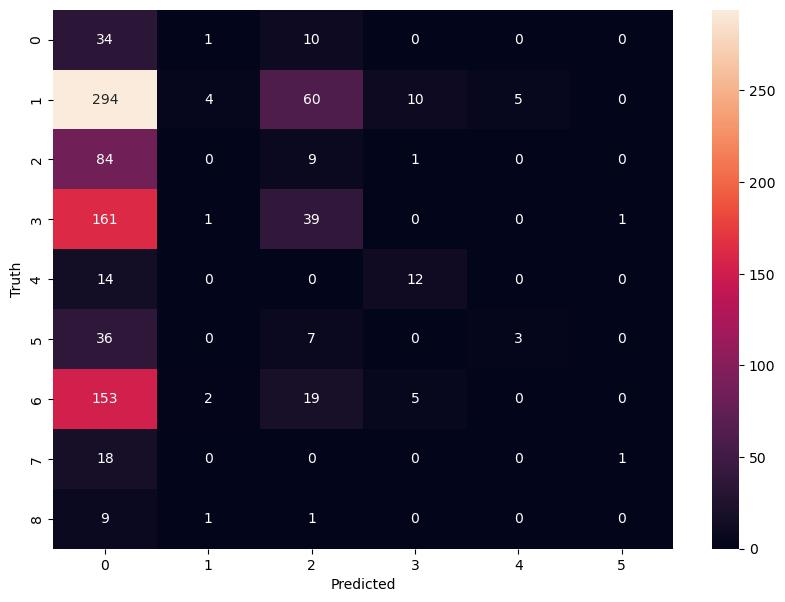

№ of clusters: 7


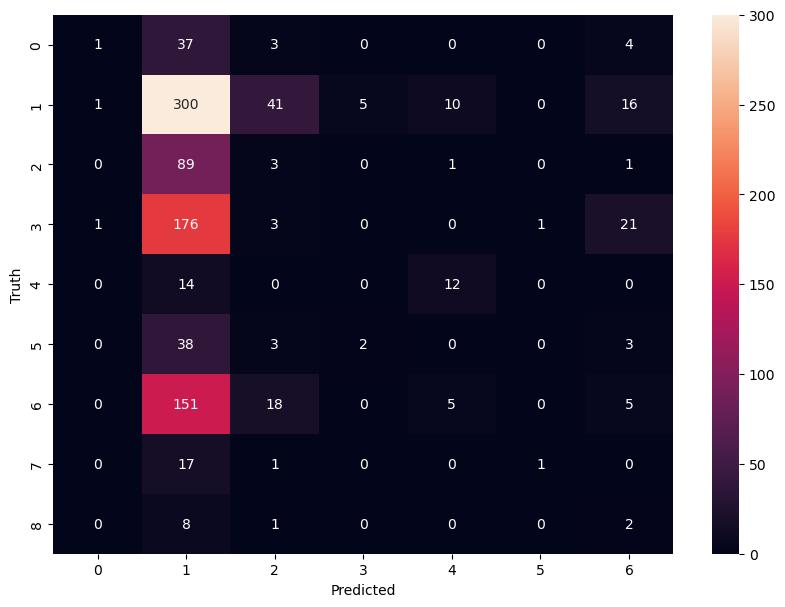

№ of clusters: 8


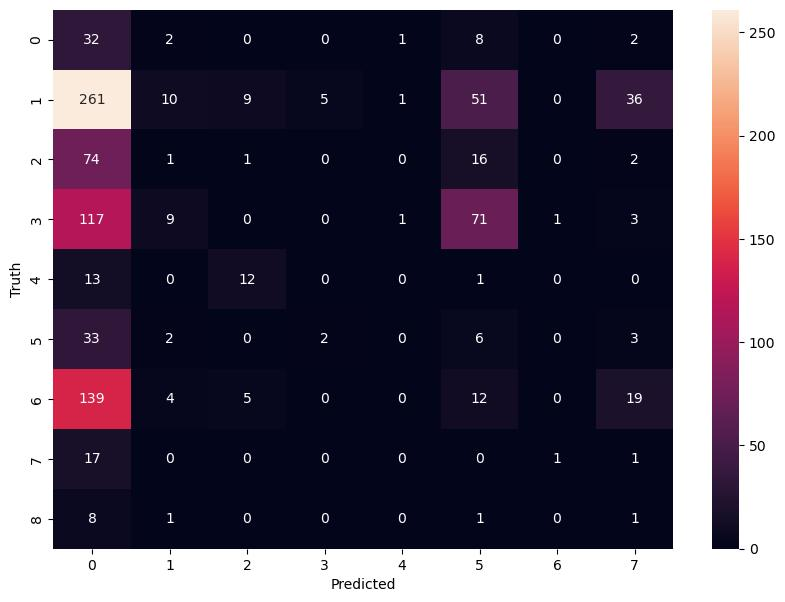

№ of clusters: 9


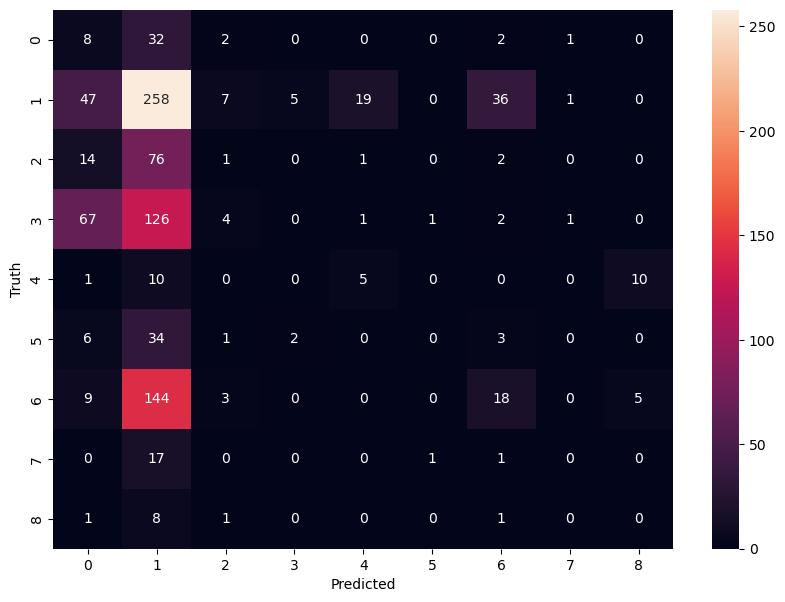

№ of clusters: 10


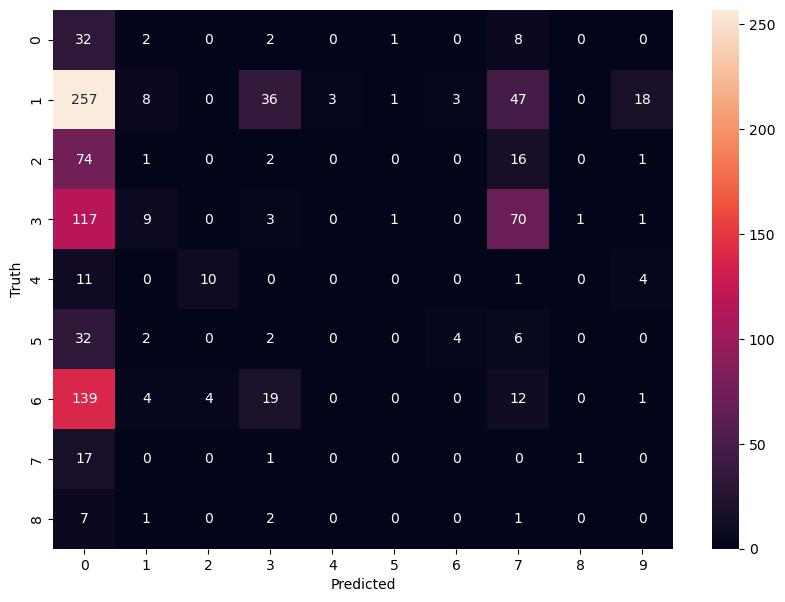

№ of clusters: 11


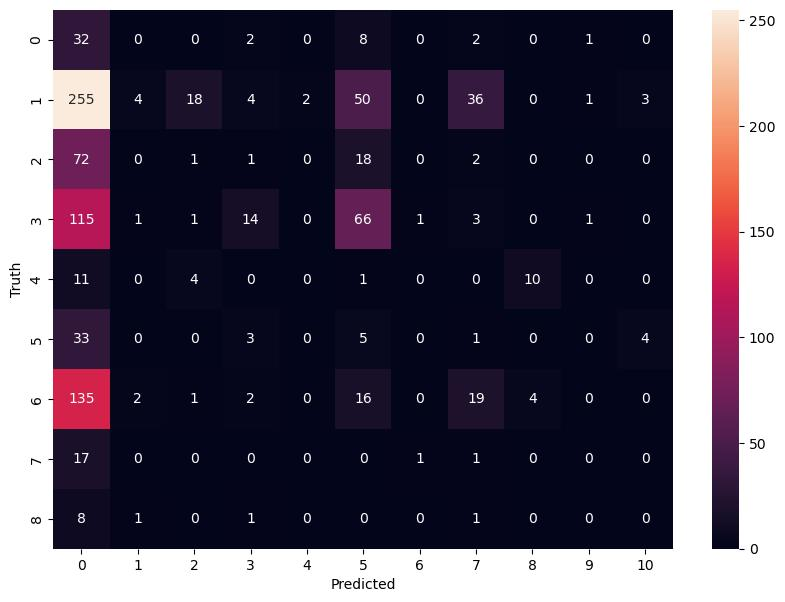

№ of clusters: 12


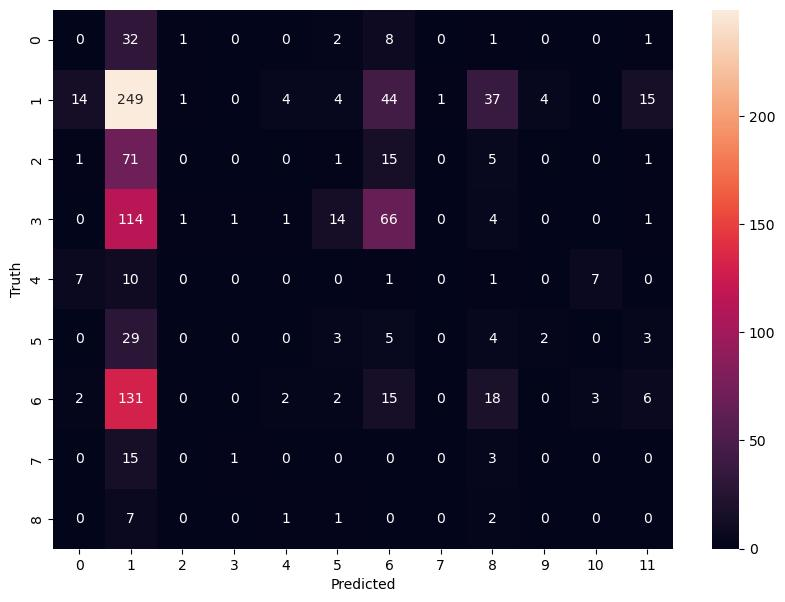

№ of clusters: 13


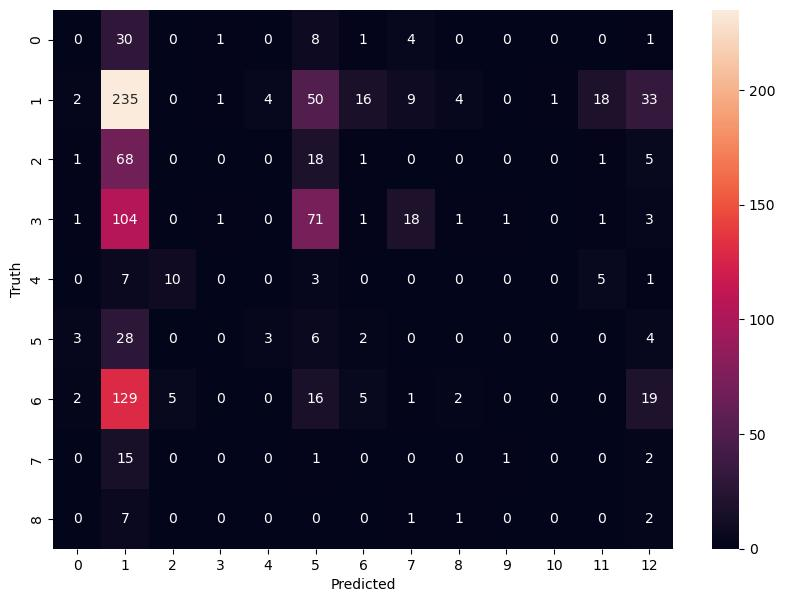

№ of clusters: 14


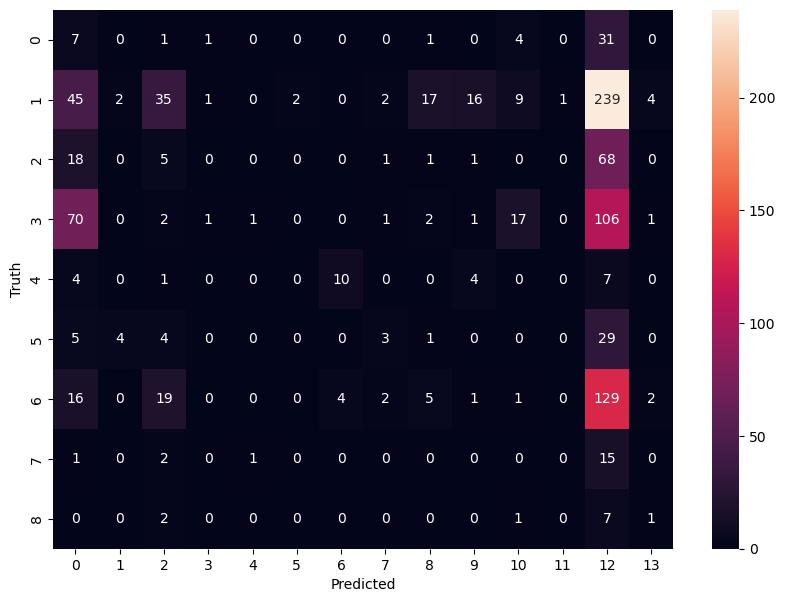

№ of clusters: 15


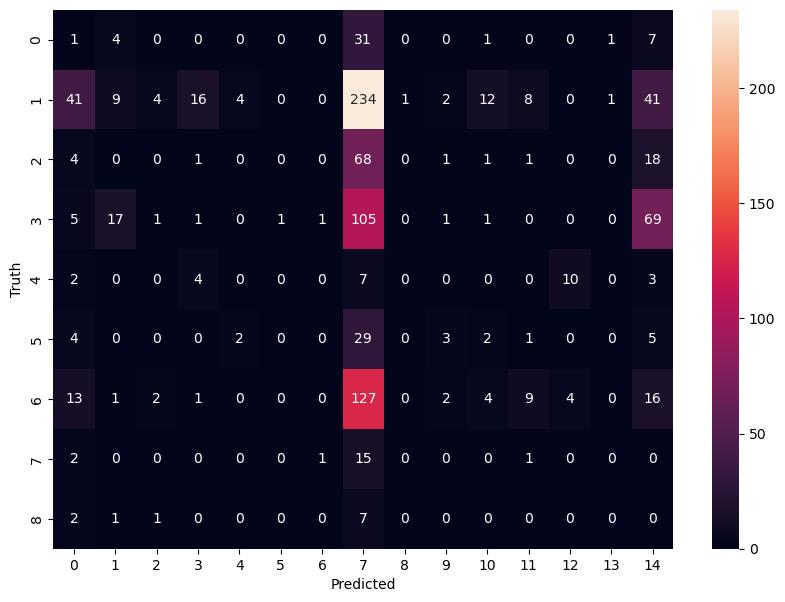

№ of clusters: 16


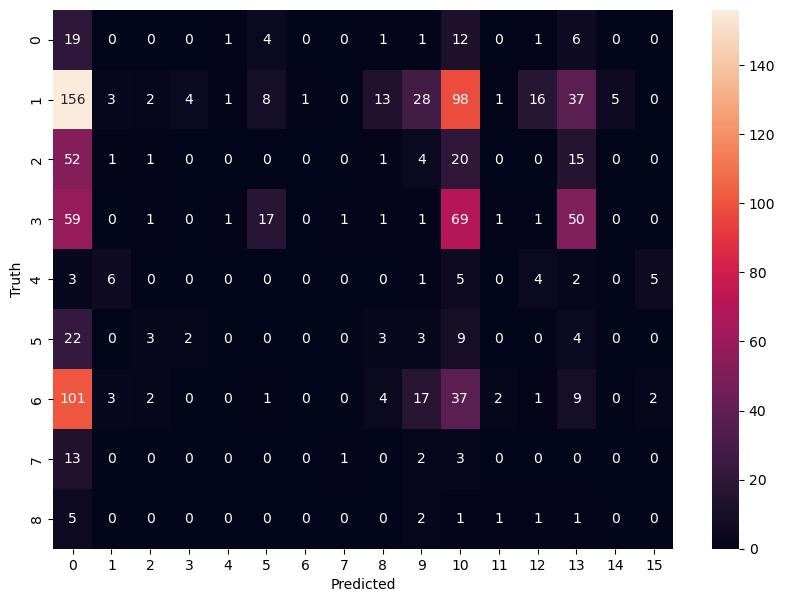

№ of clusters: 17


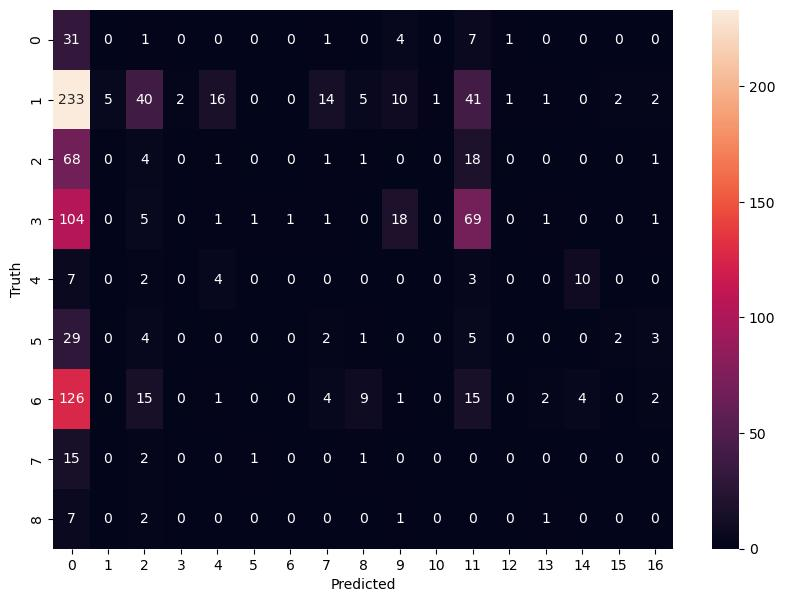

№ of clusters: 18


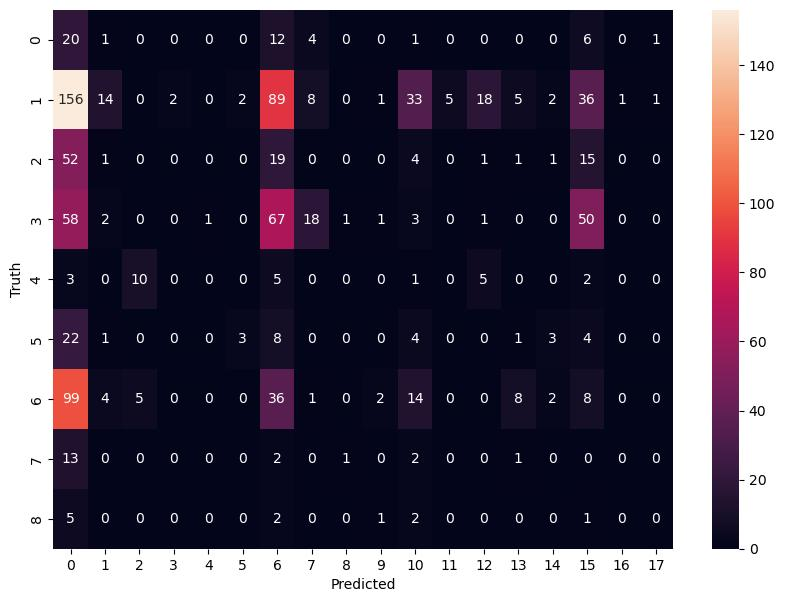

№ of clusters: 19


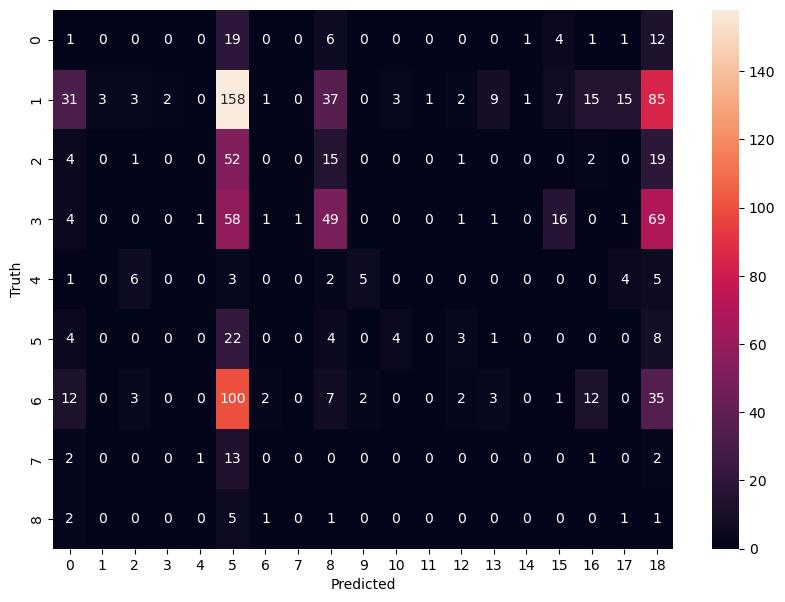

№ of clusters: 20


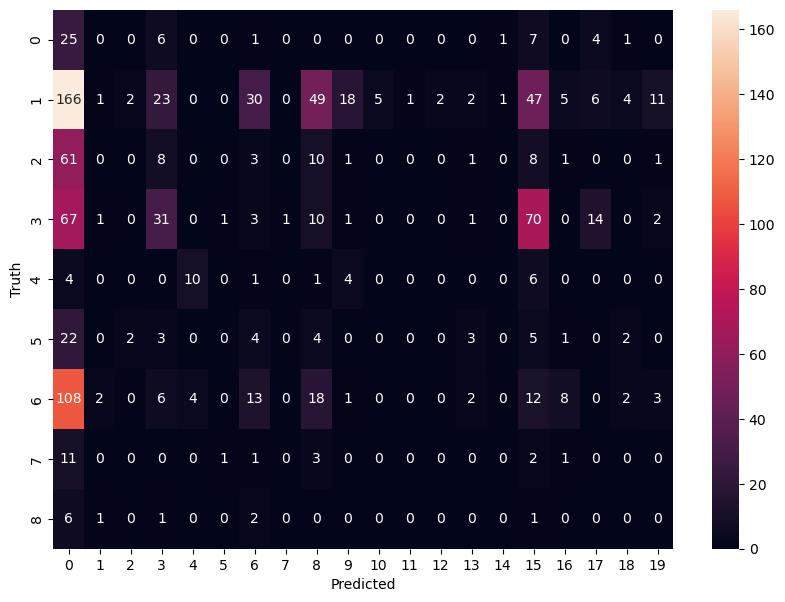

In [61]:
def show_contingency_matrix(contingency_matrix):
    plt.figure(figsize = (10, 7))
    sb.heatmap(contingency_matrix, annot = True, fmt = 'd')
    plt.xlabel('Predicted')
    plt.ylabel('Truth')
    plt.show()

for contingency_matrix_result in contingency_matrices:
    print(f'№ of clusters: {contingency_matrix_result[0]}')
    show_contingency_matrix(contingency_matrix_result[1])

№ of clusters: 2


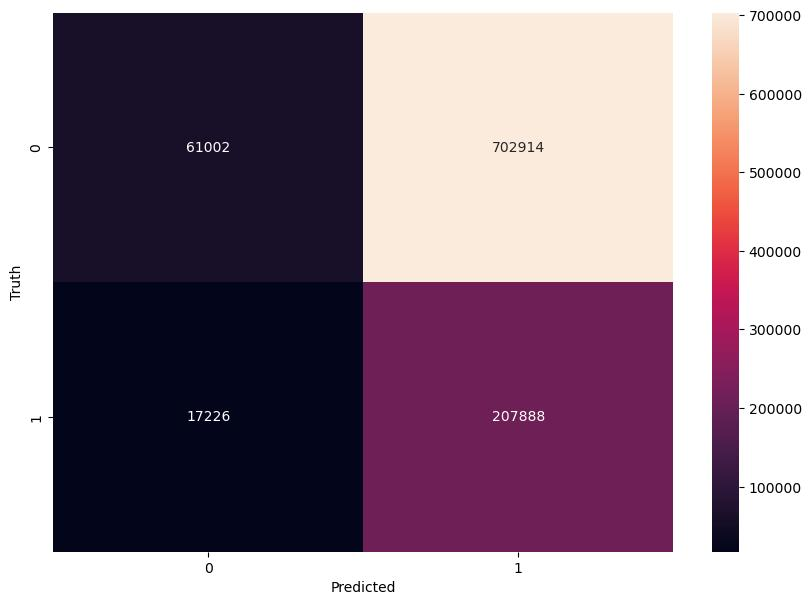

№ of clusters: 3


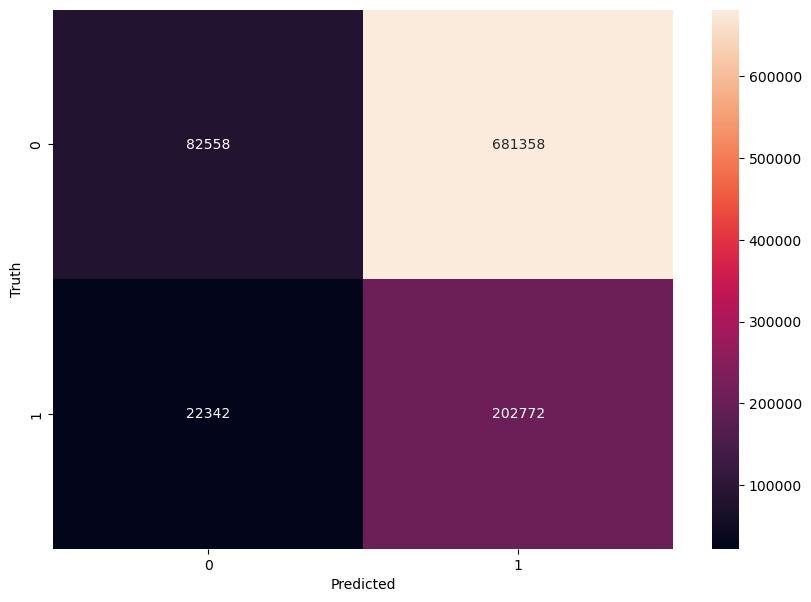

№ of clusters: 4


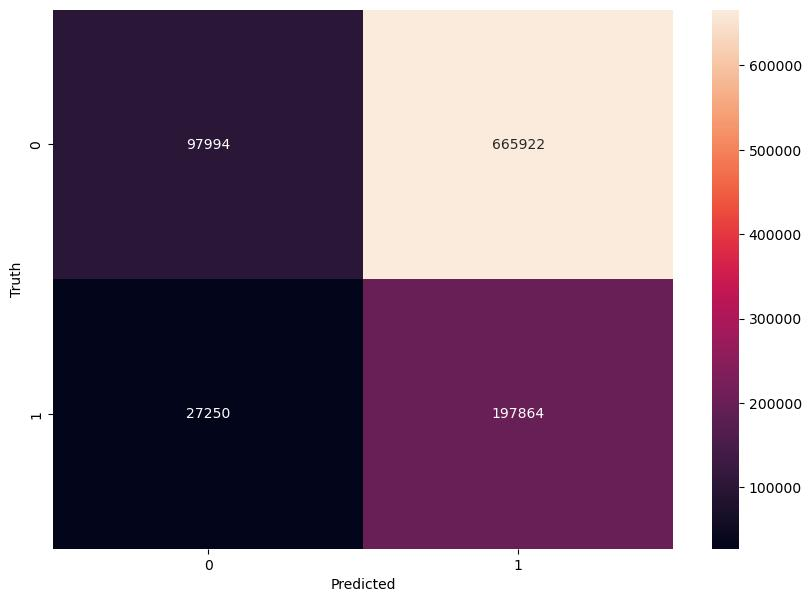

№ of clusters: 5


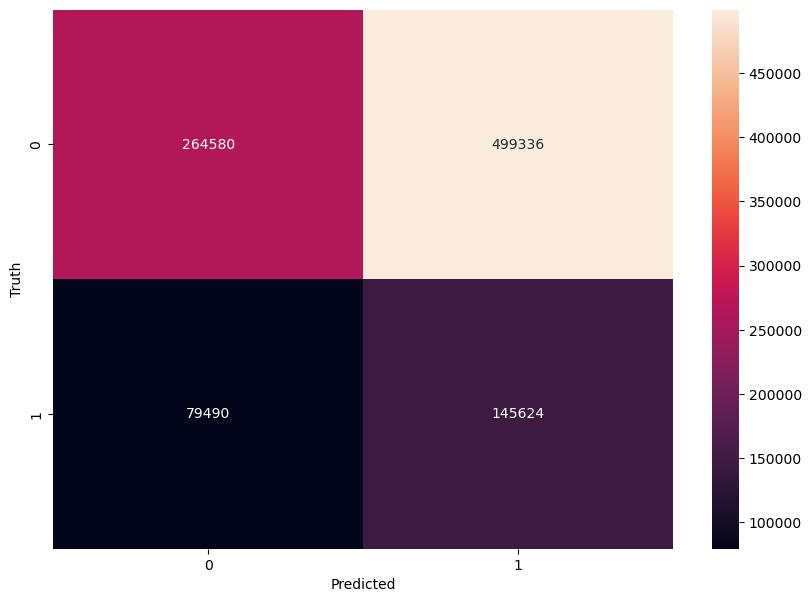

№ of clusters: 6


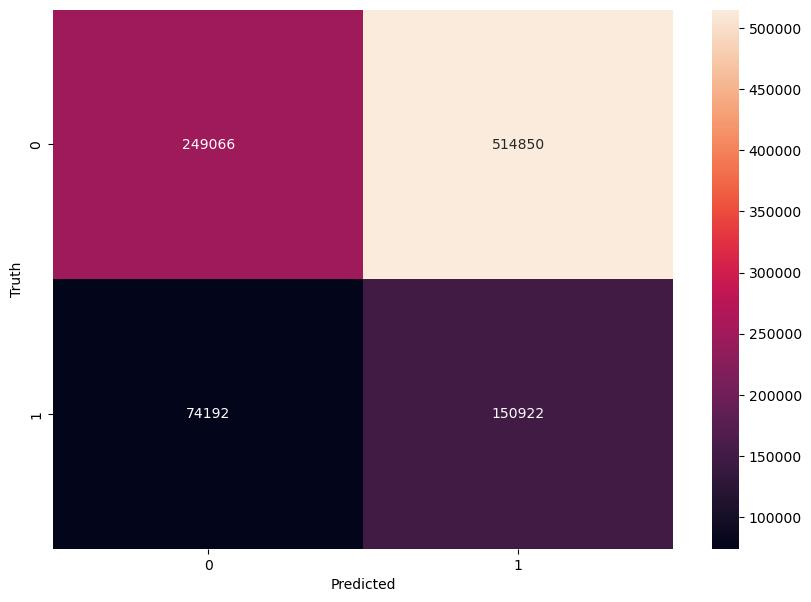

№ of clusters: 7


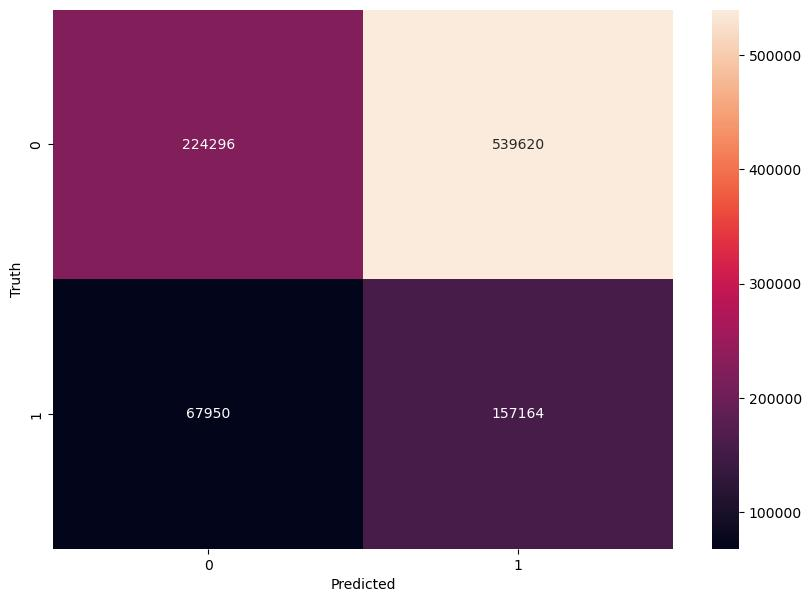

№ of clusters: 8


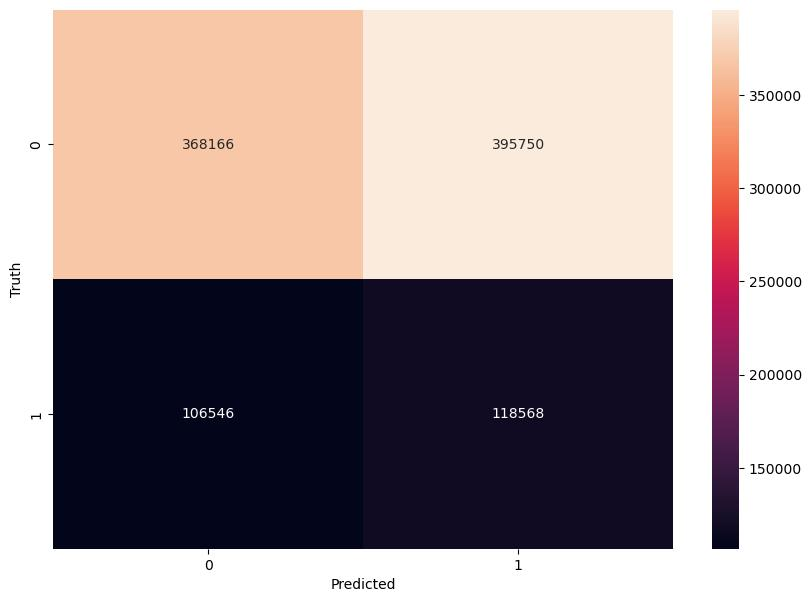

№ of clusters: 9


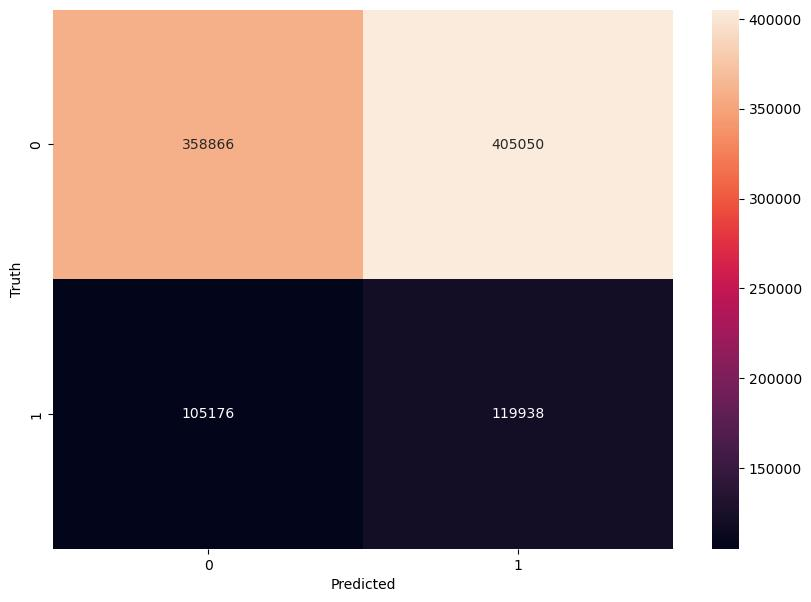

№ of clusters: 10


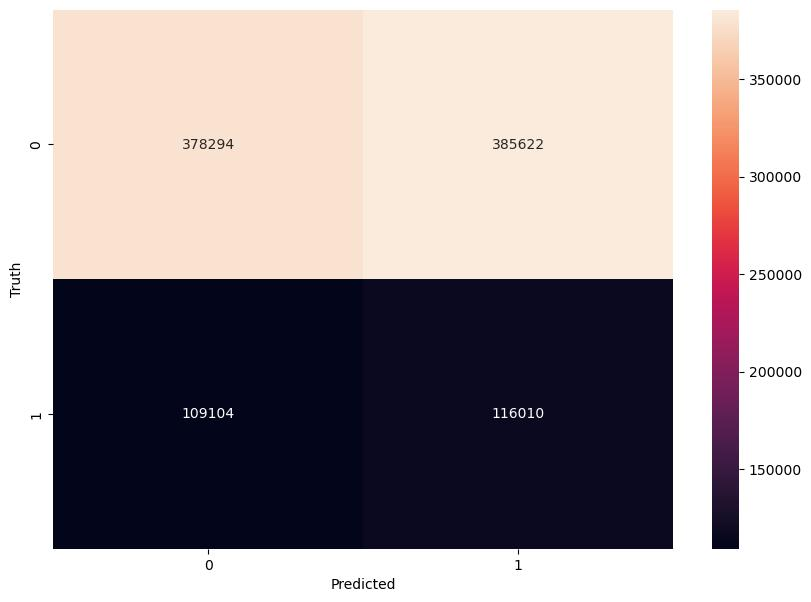

№ of clusters: 11


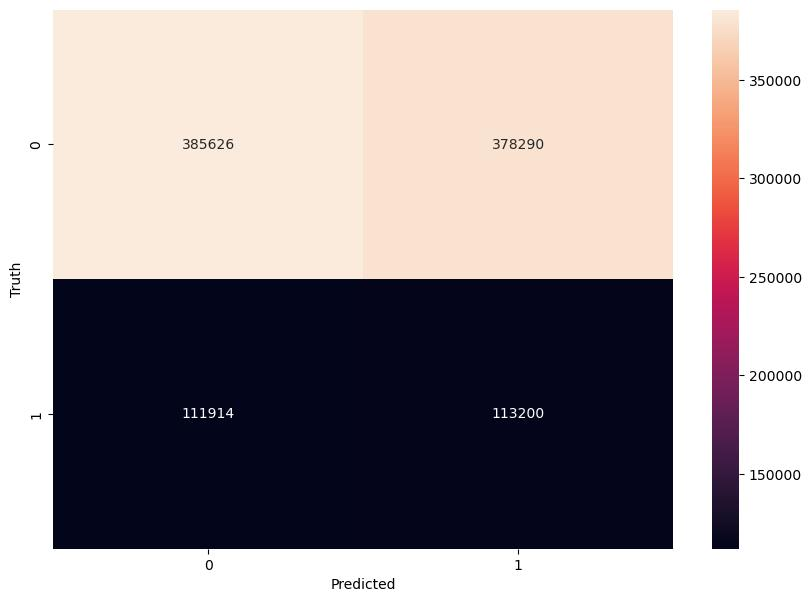

№ of clusters: 12


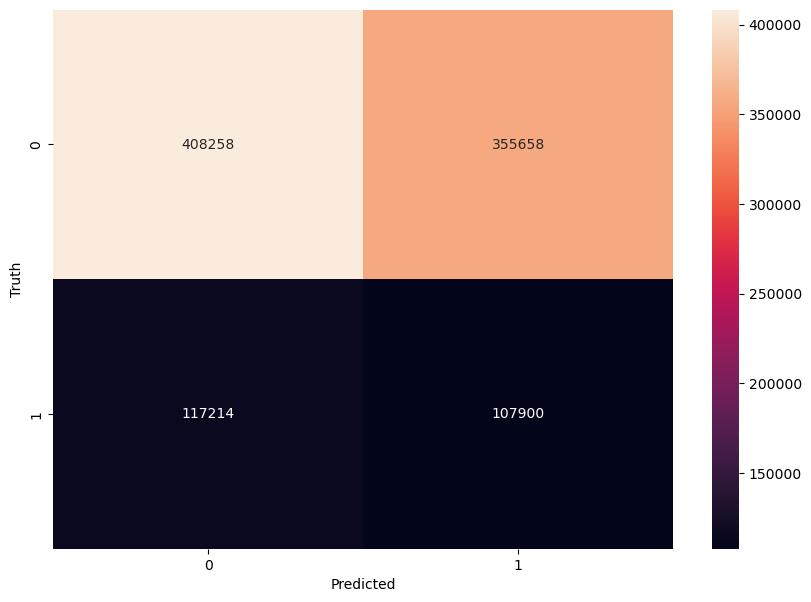

№ of clusters: 13


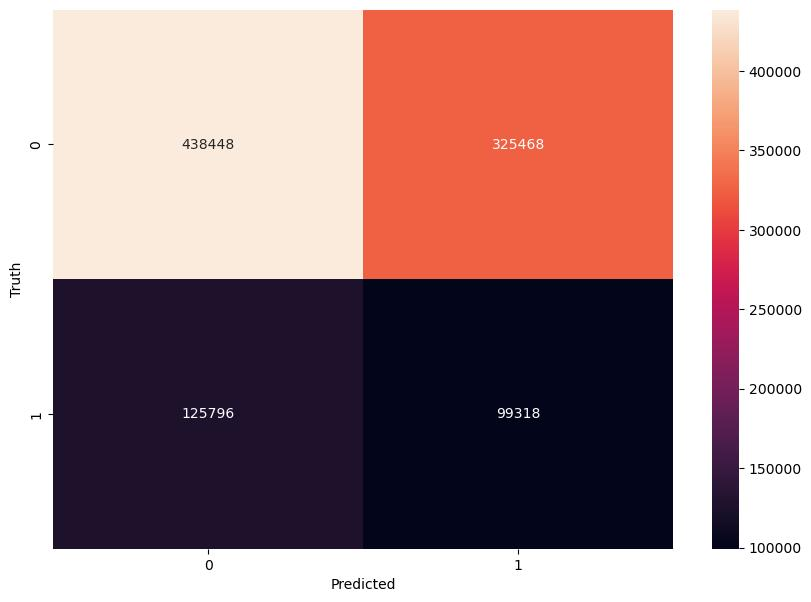

№ of clusters: 14


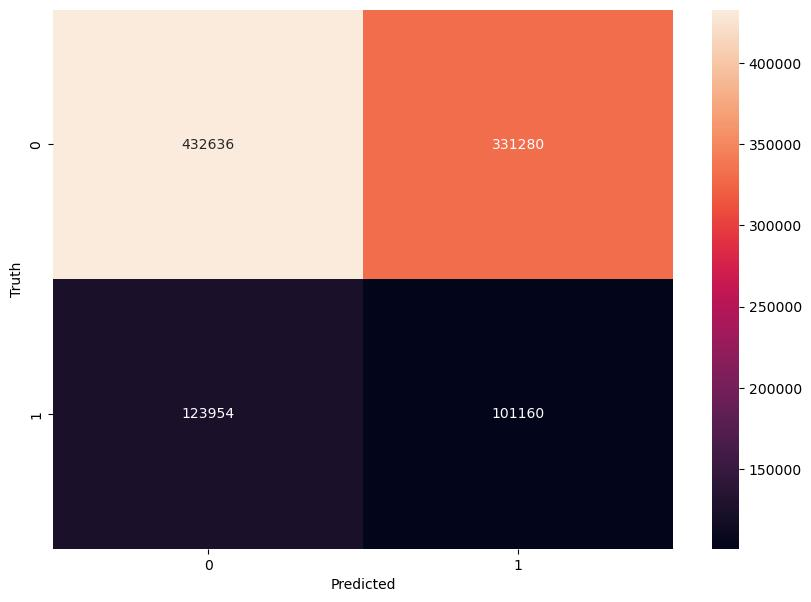

№ of clusters: 15


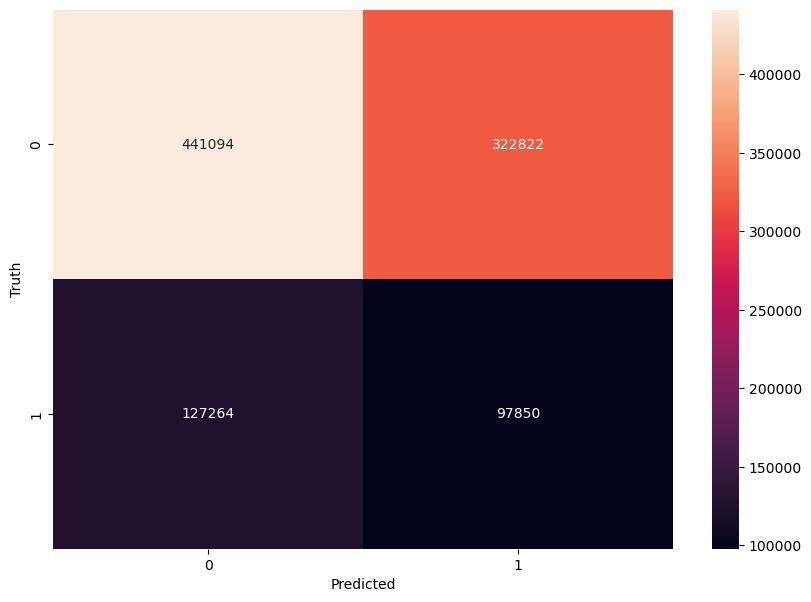

№ of clusters: 16


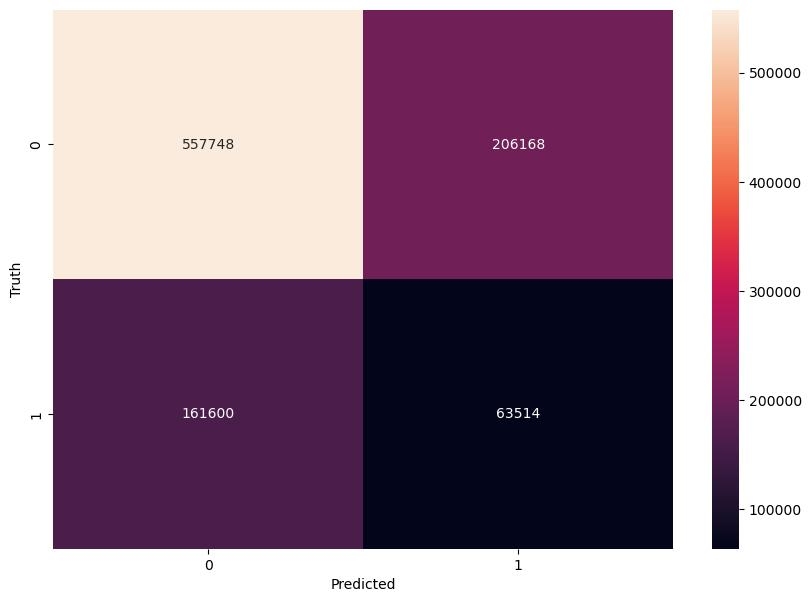

№ of clusters: 17


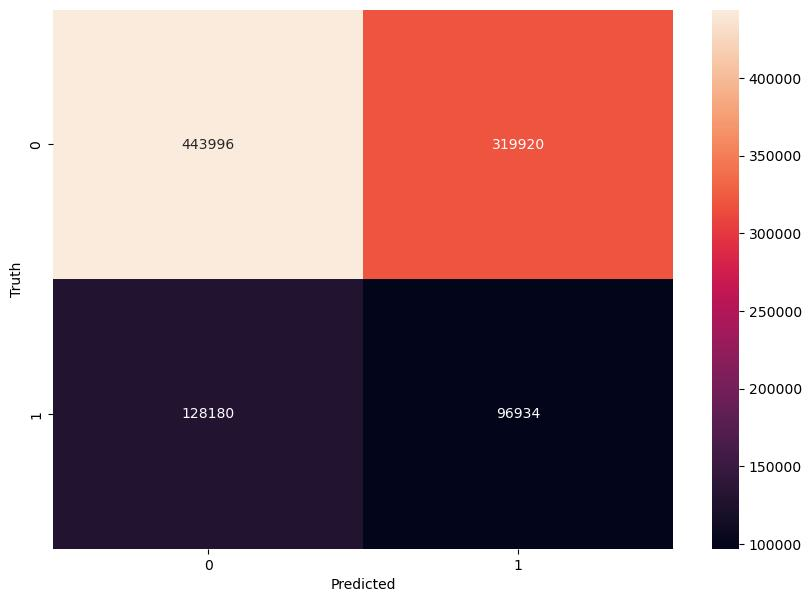

№ of clusters: 18


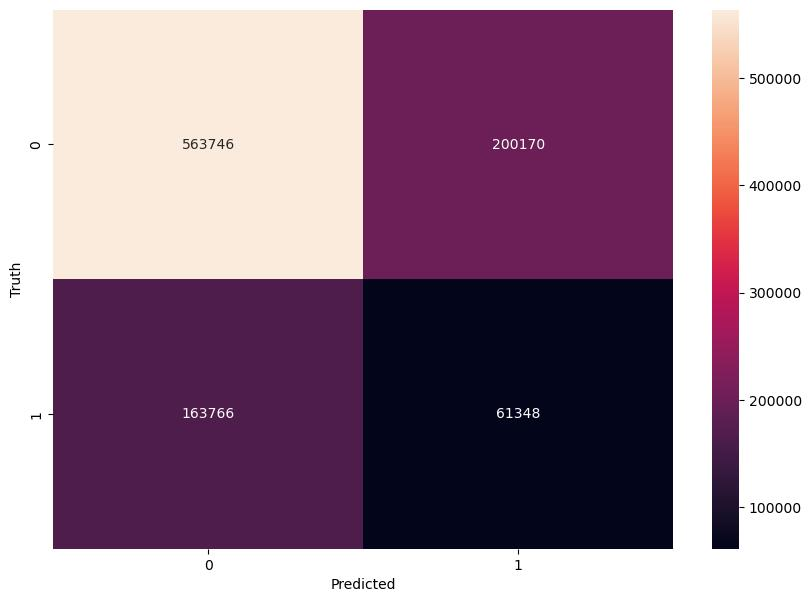

№ of clusters: 19


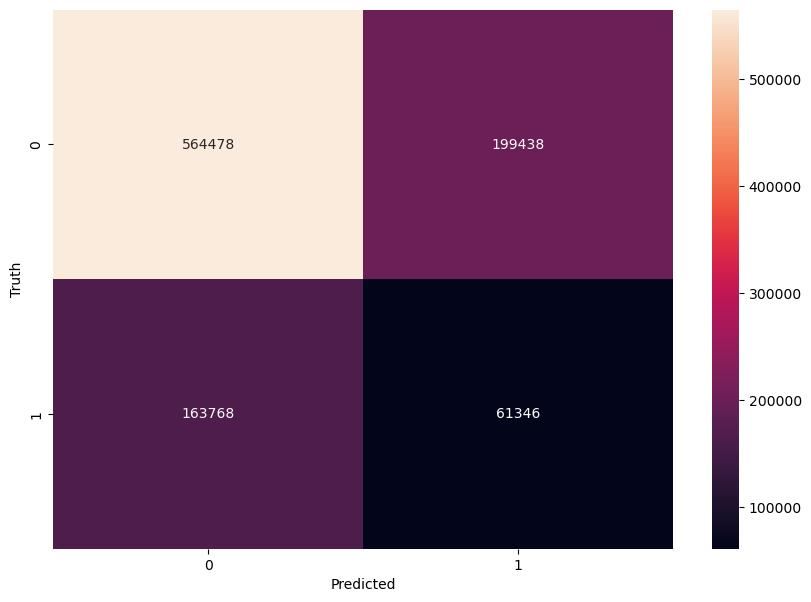

№ of clusters: 20


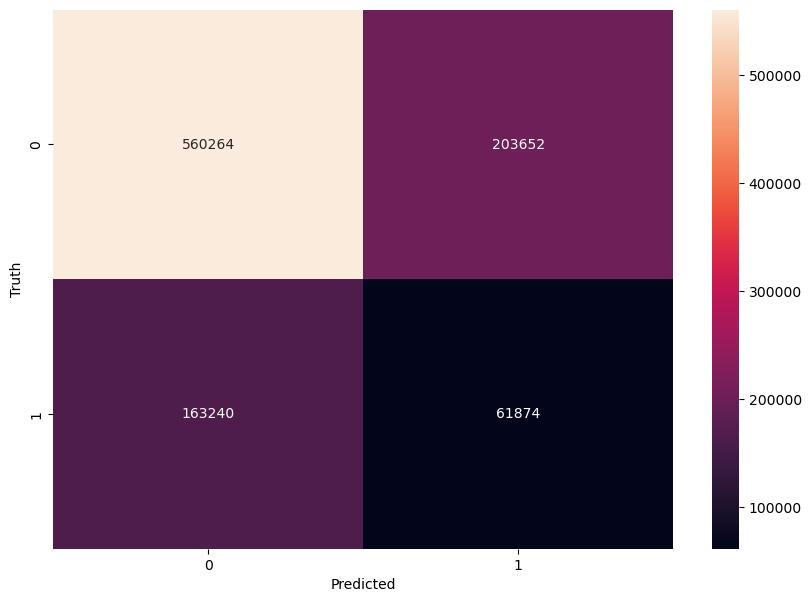

In [62]:
for pair_confusion_matrix_result in pair_confusion_matrices:
    print(f'№ of clusters: {pair_confusion_matrix_result[0]}')
    show_contingency_matrix(pair_confusion_matrix_result[1])

## Elbow rule

Amount of clusters: 2


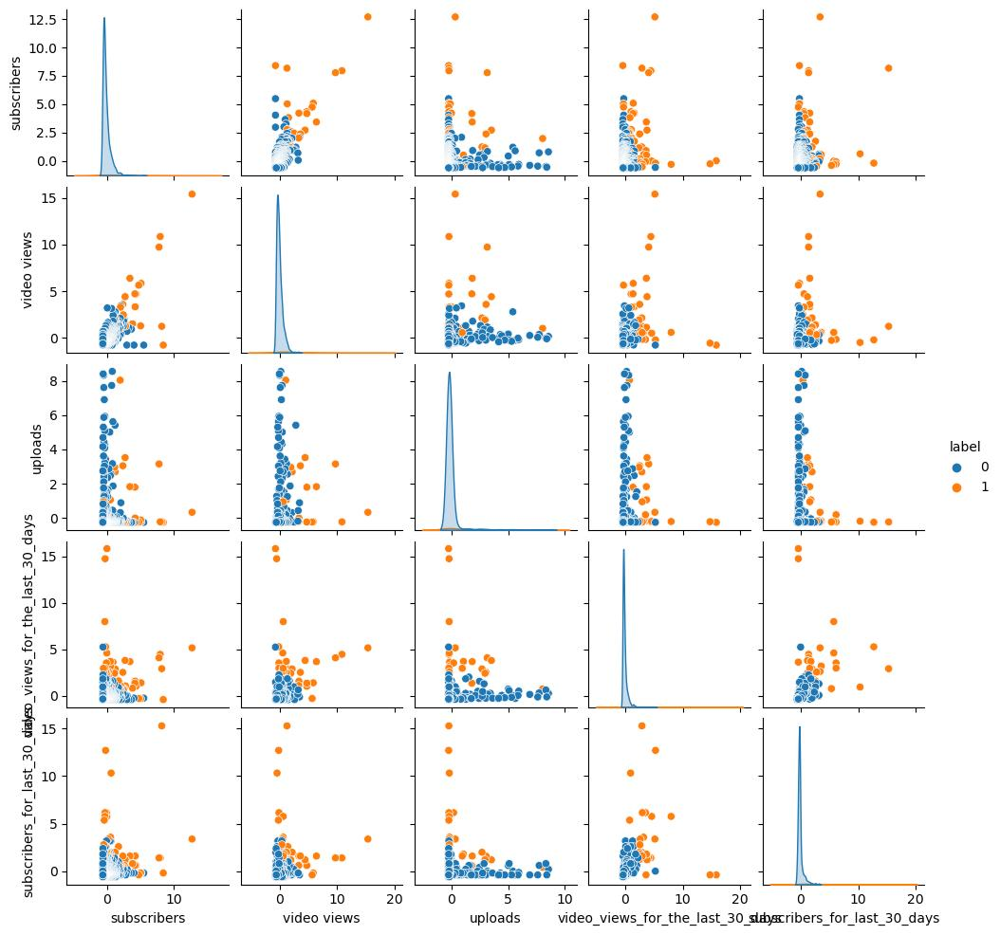

Amount of clusters: 3


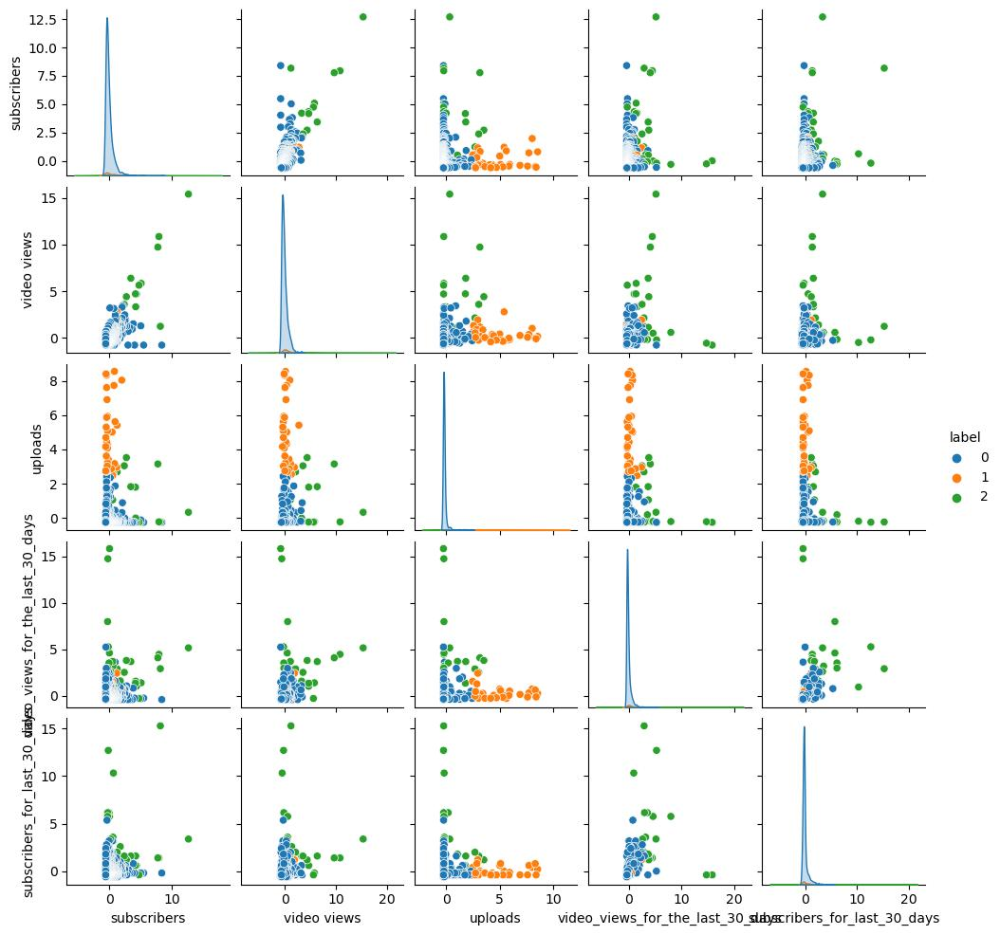

Amount of clusters: 4


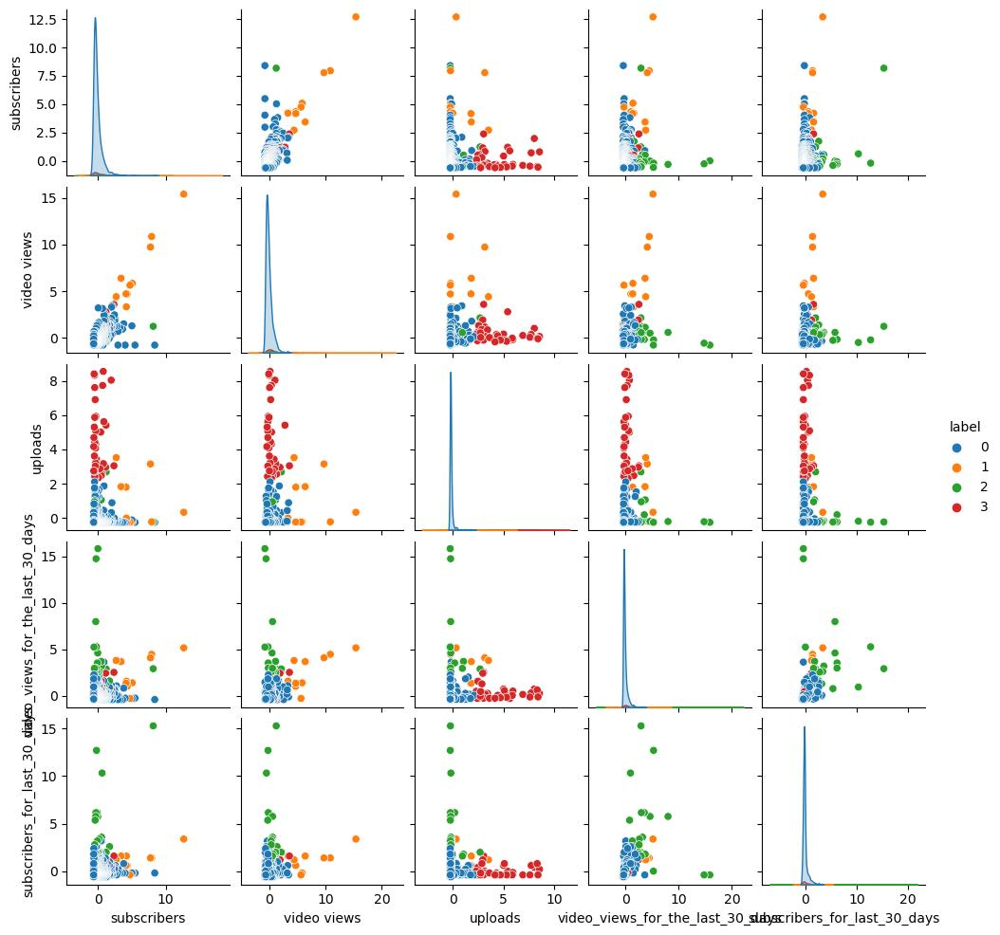

Amount of clusters: 5


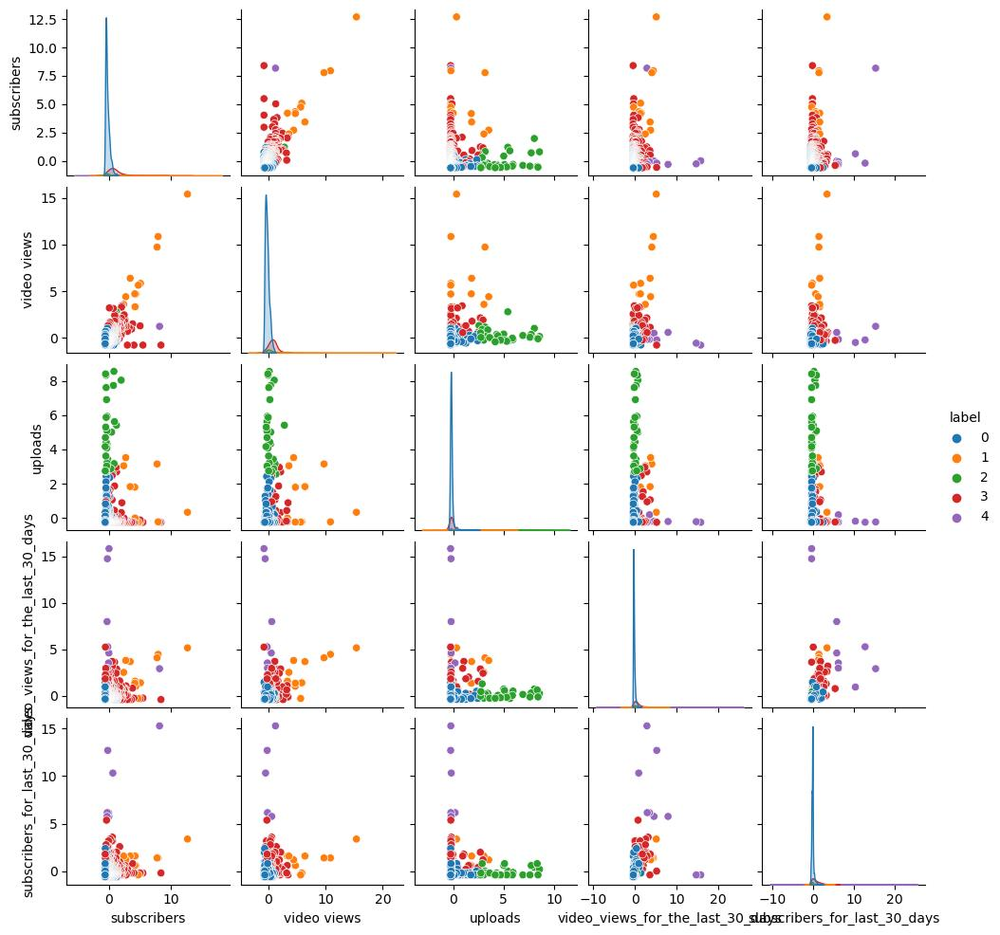

Amount of clusters: 6


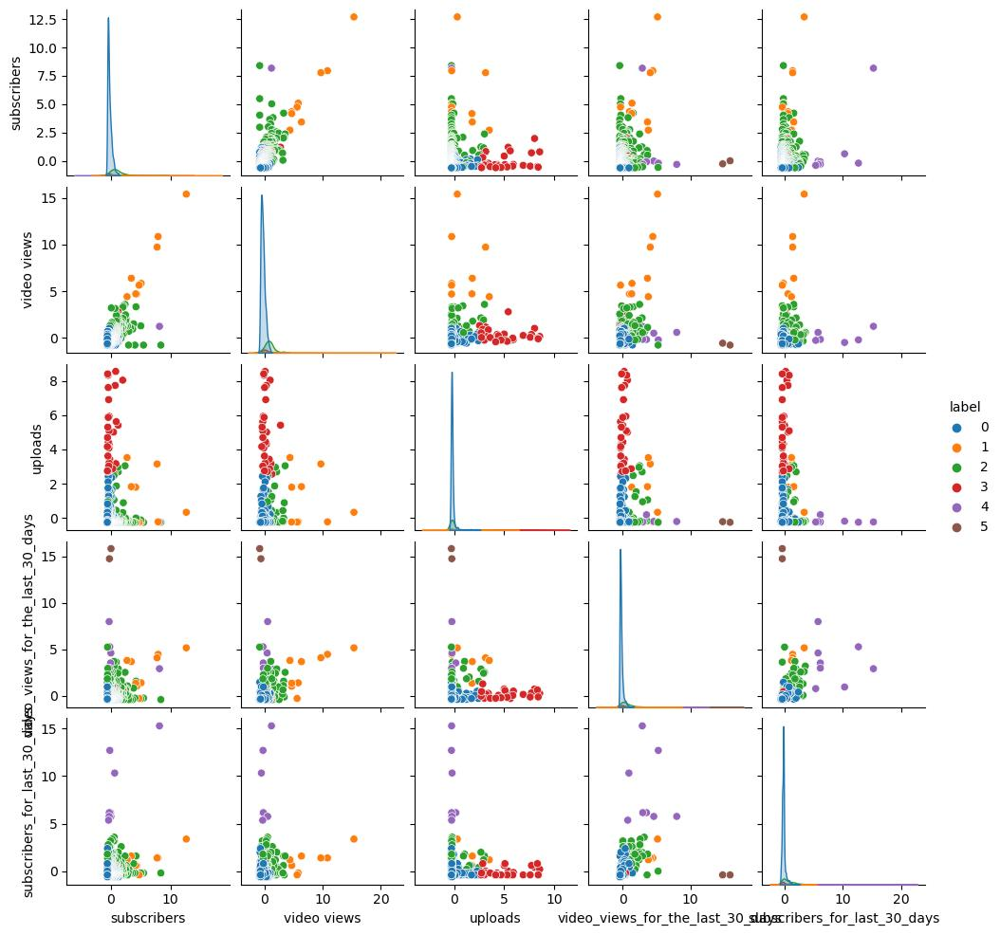

Amount of clusters: 7


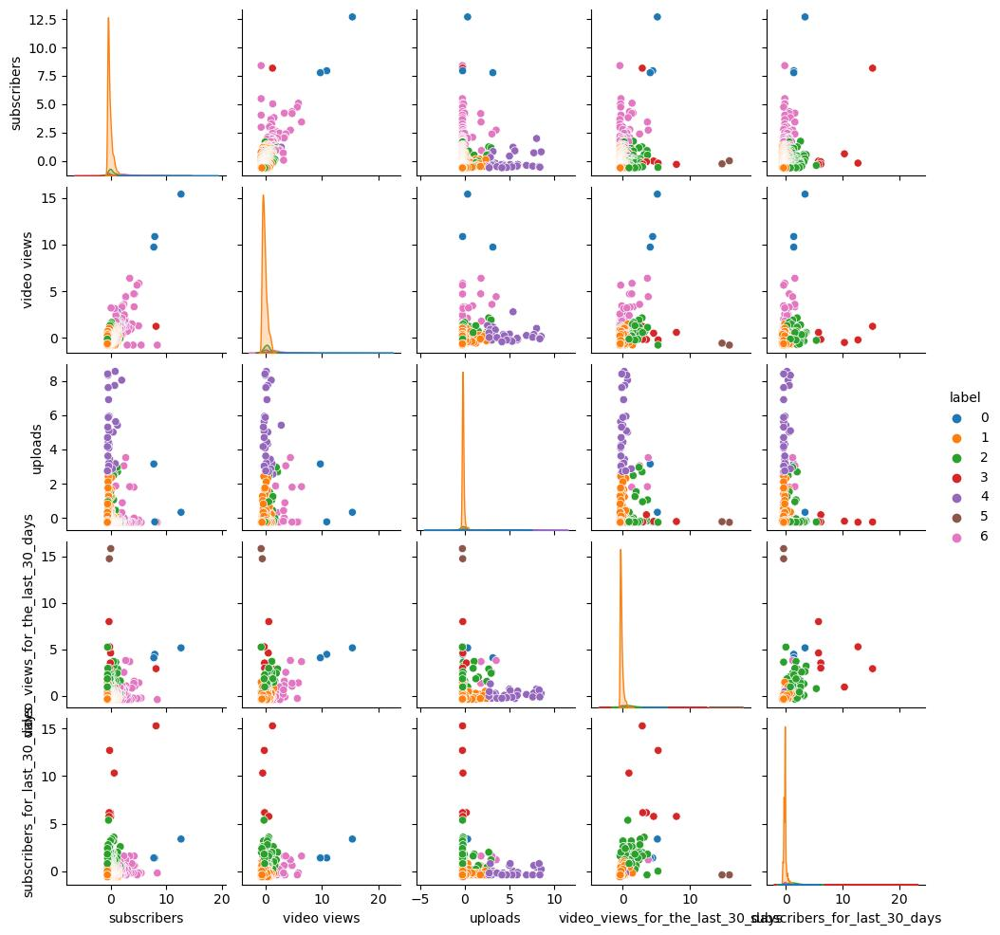

Amount of clusters: 8


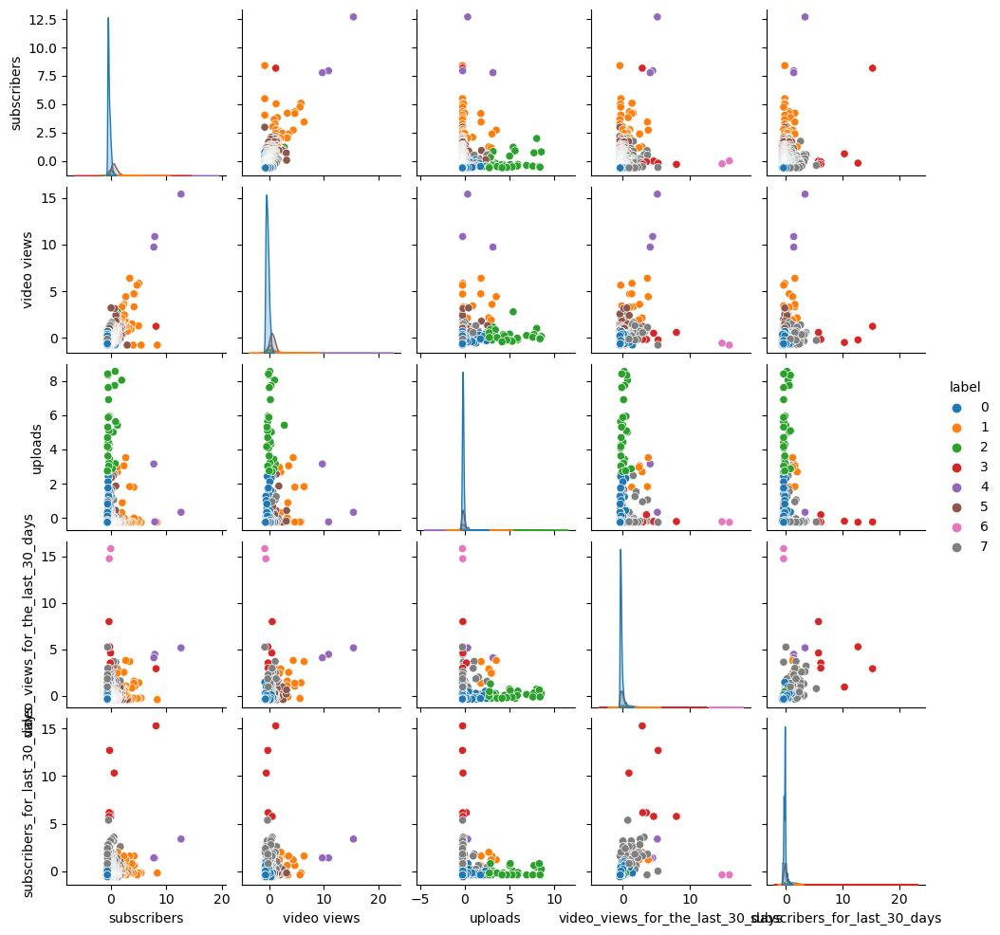

Amount of clusters: 9


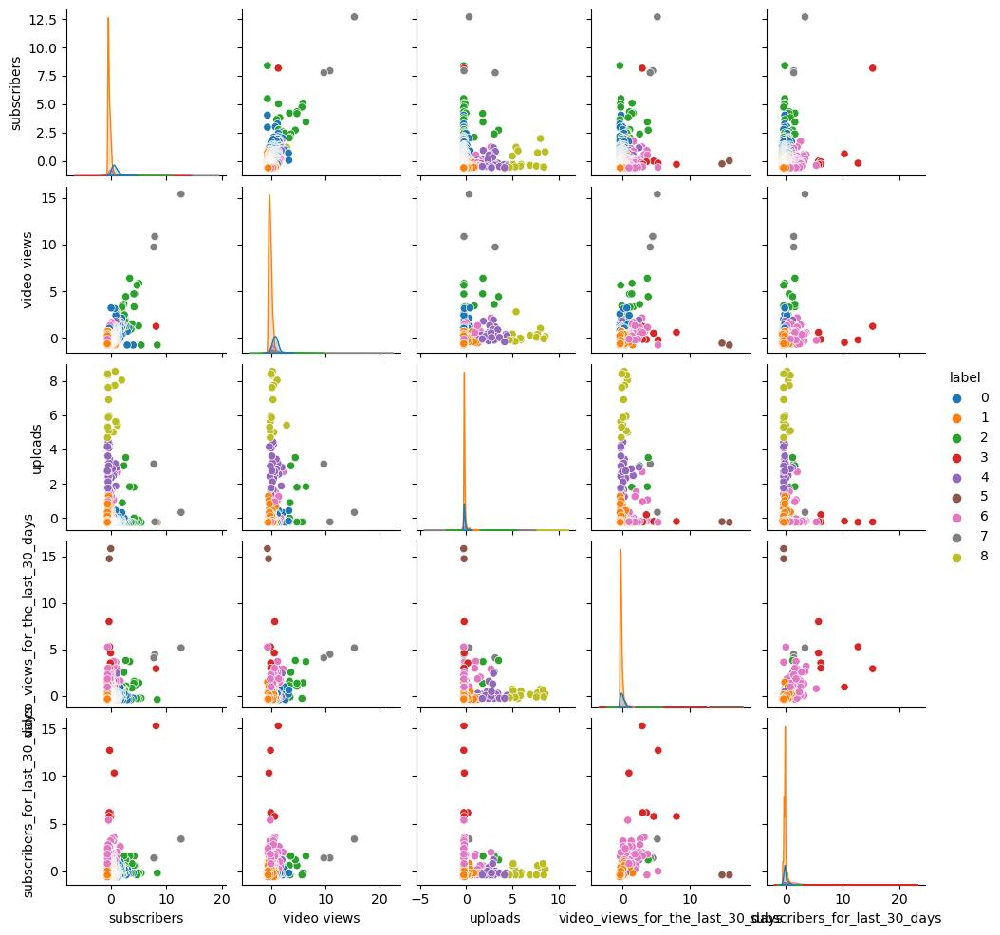

Amount of clusters: 10


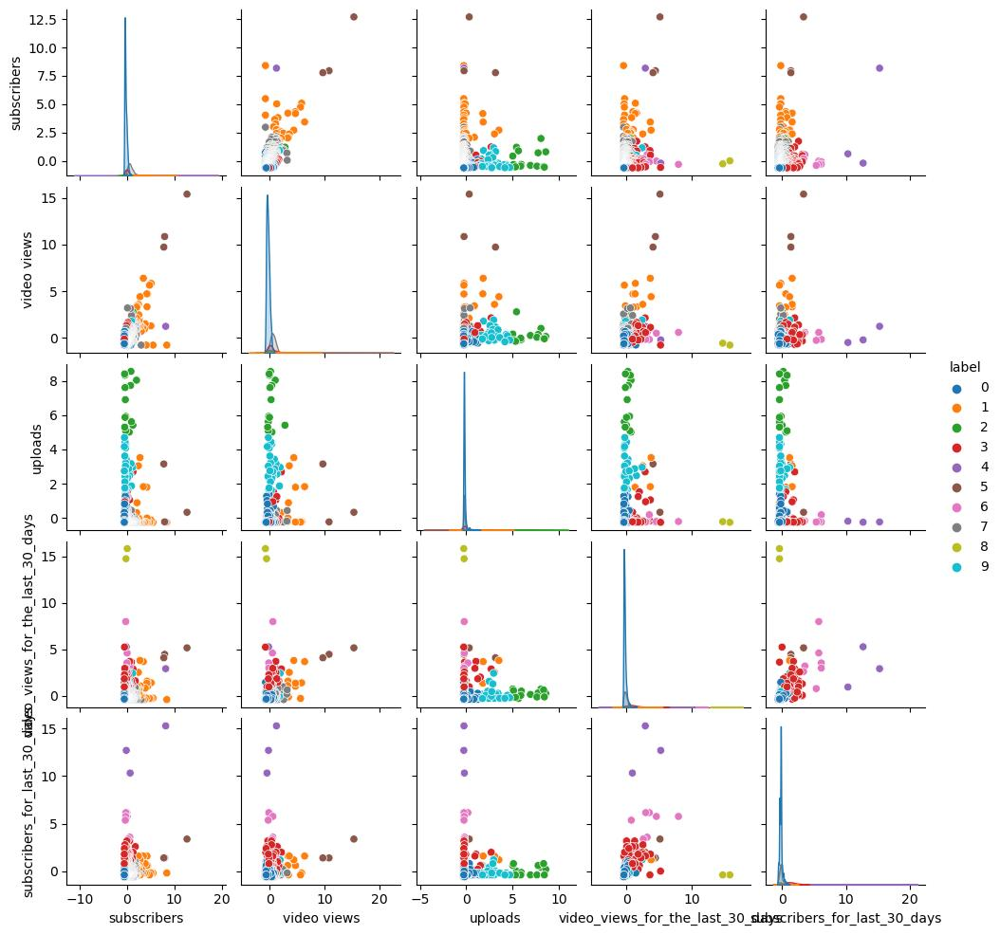

Amount of clusters: 11


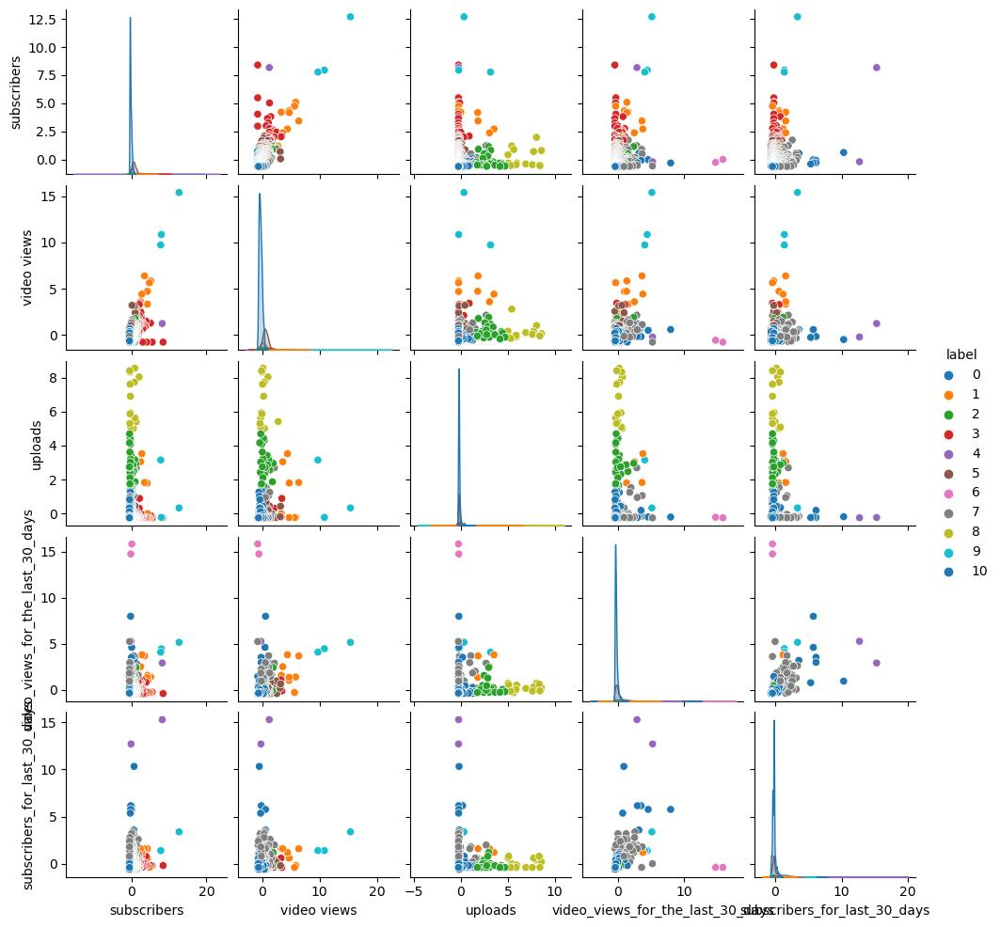

Amount of clusters: 12


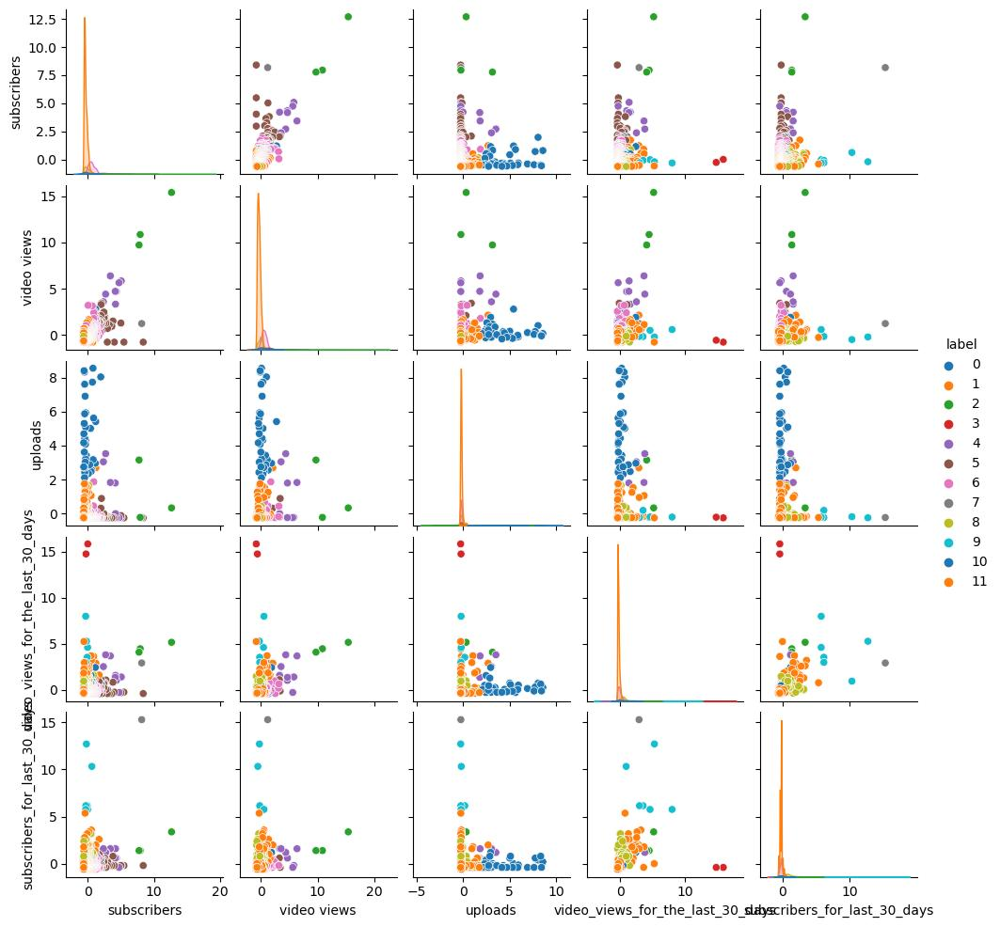

Amount of clusters: 13


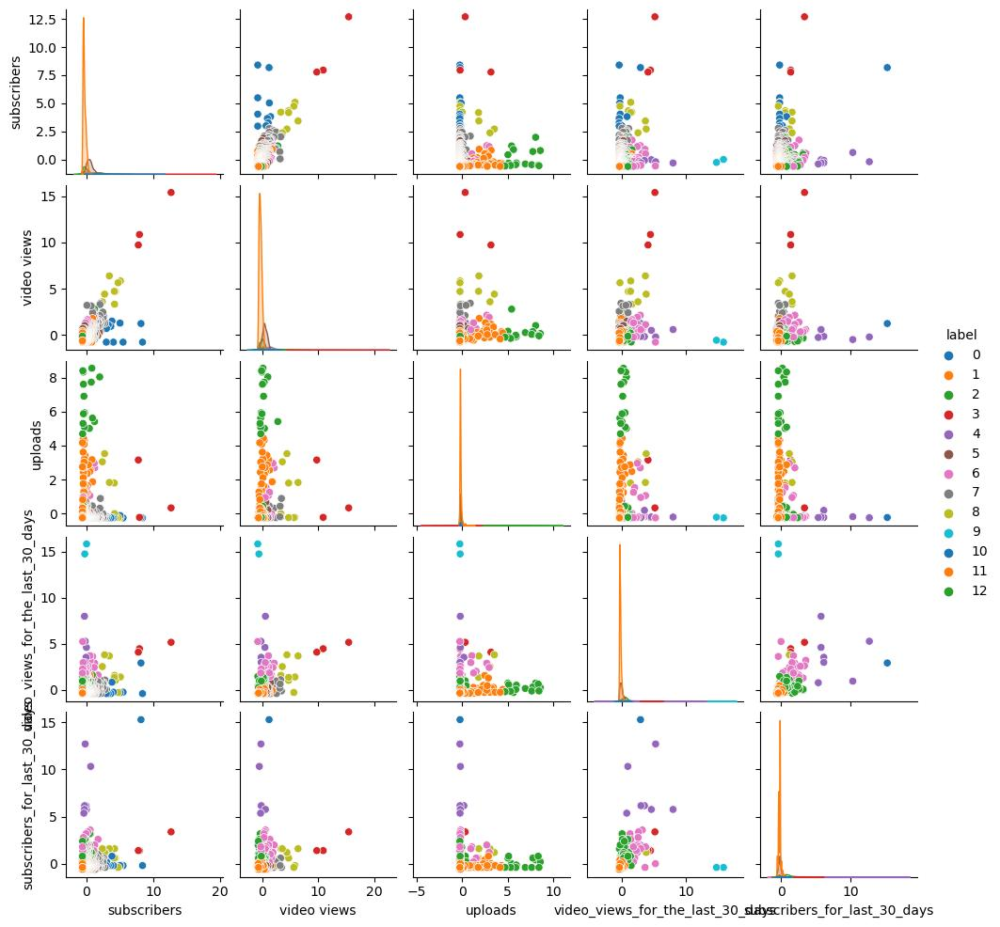

Amount of clusters: 14


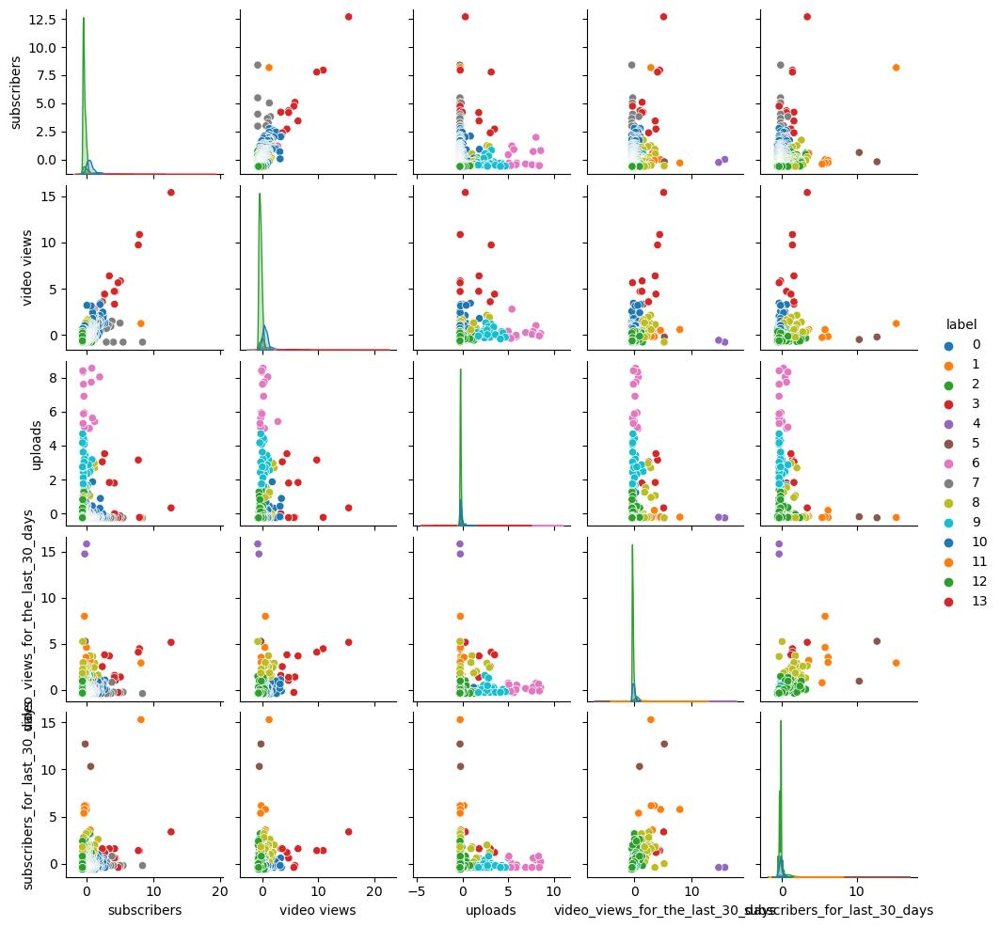

Amount of clusters: 15


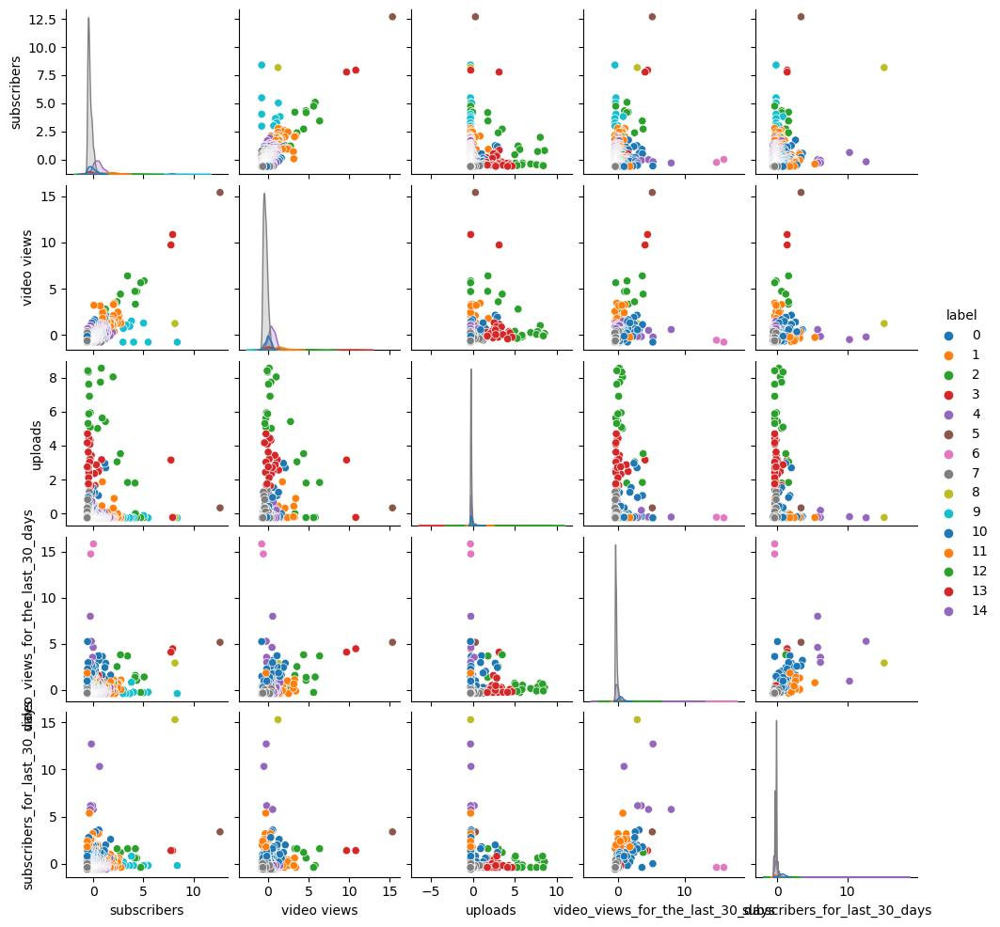

Amount of clusters: 16


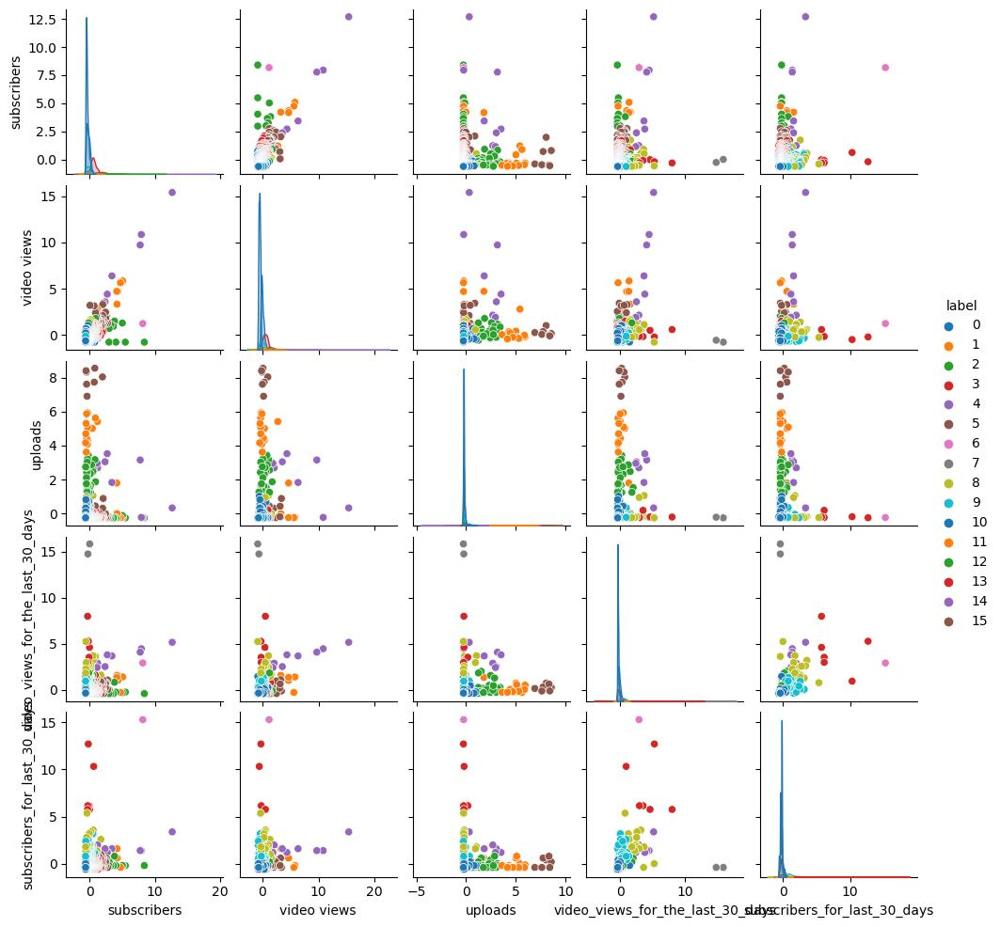

Amount of clusters: 17


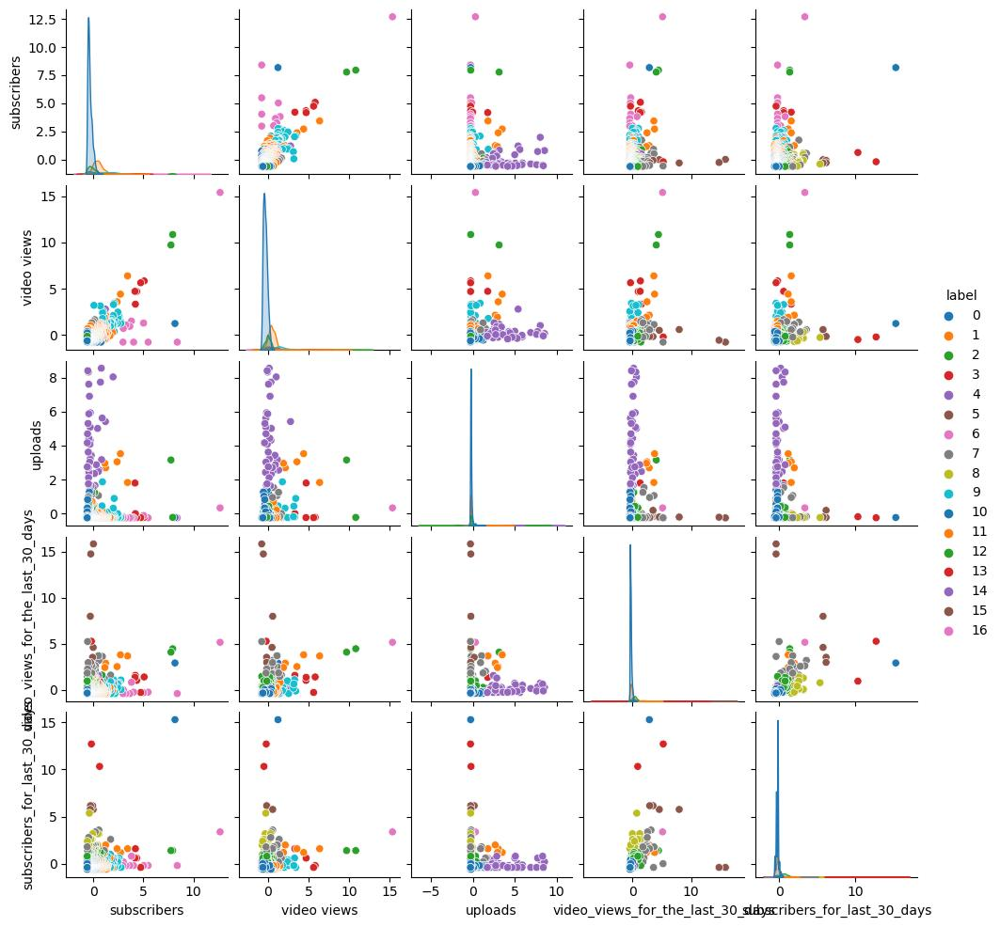

Amount of clusters: 18


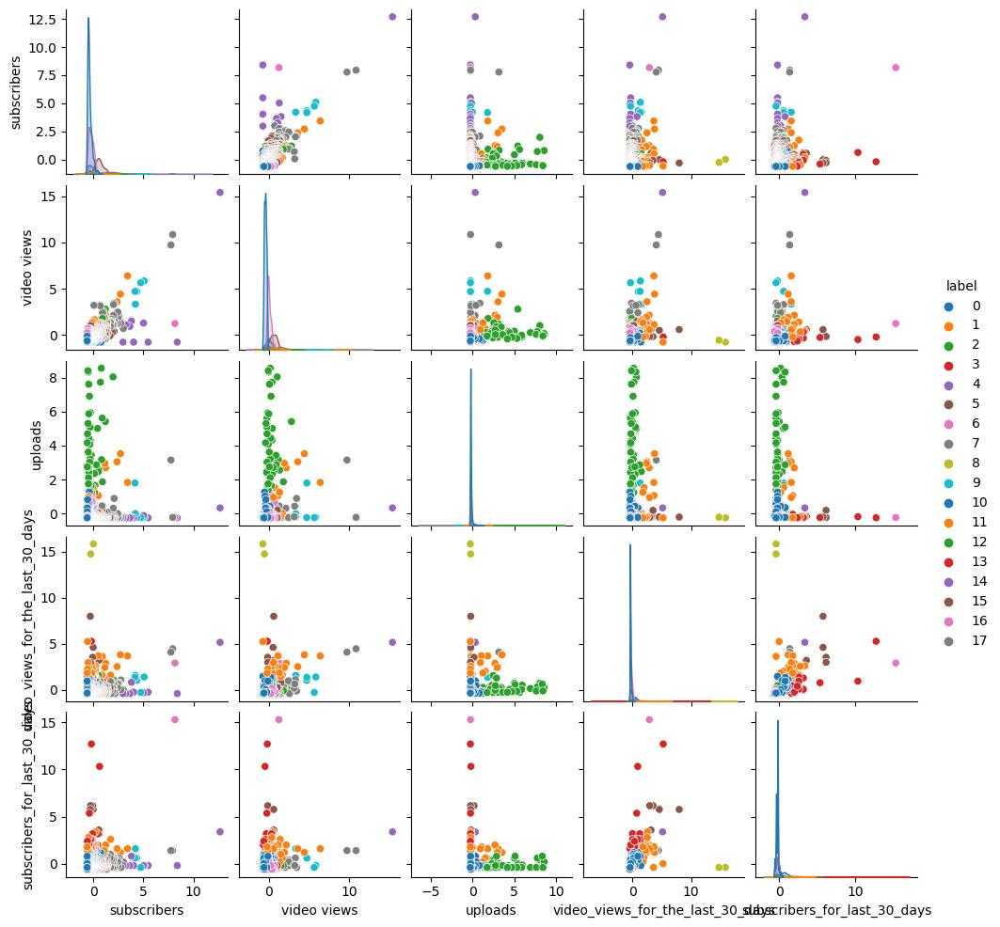

Amount of clusters: 19


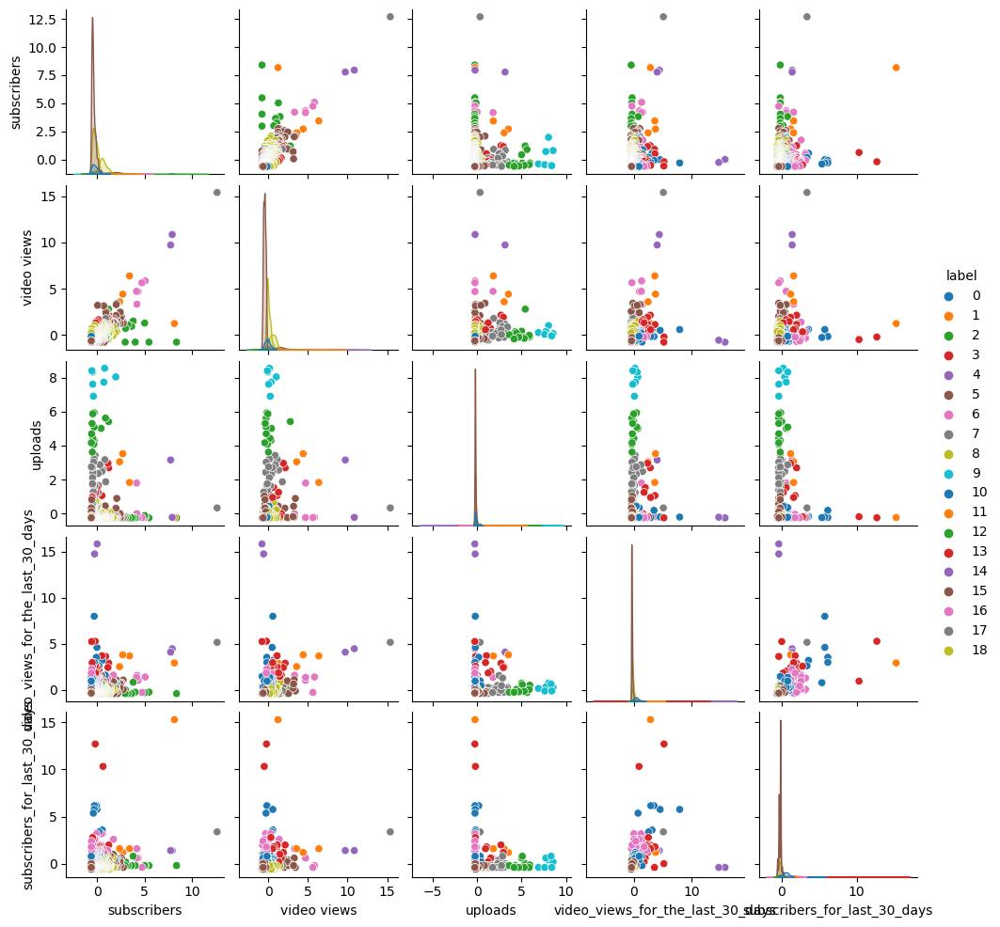

Amount of clusters: 20


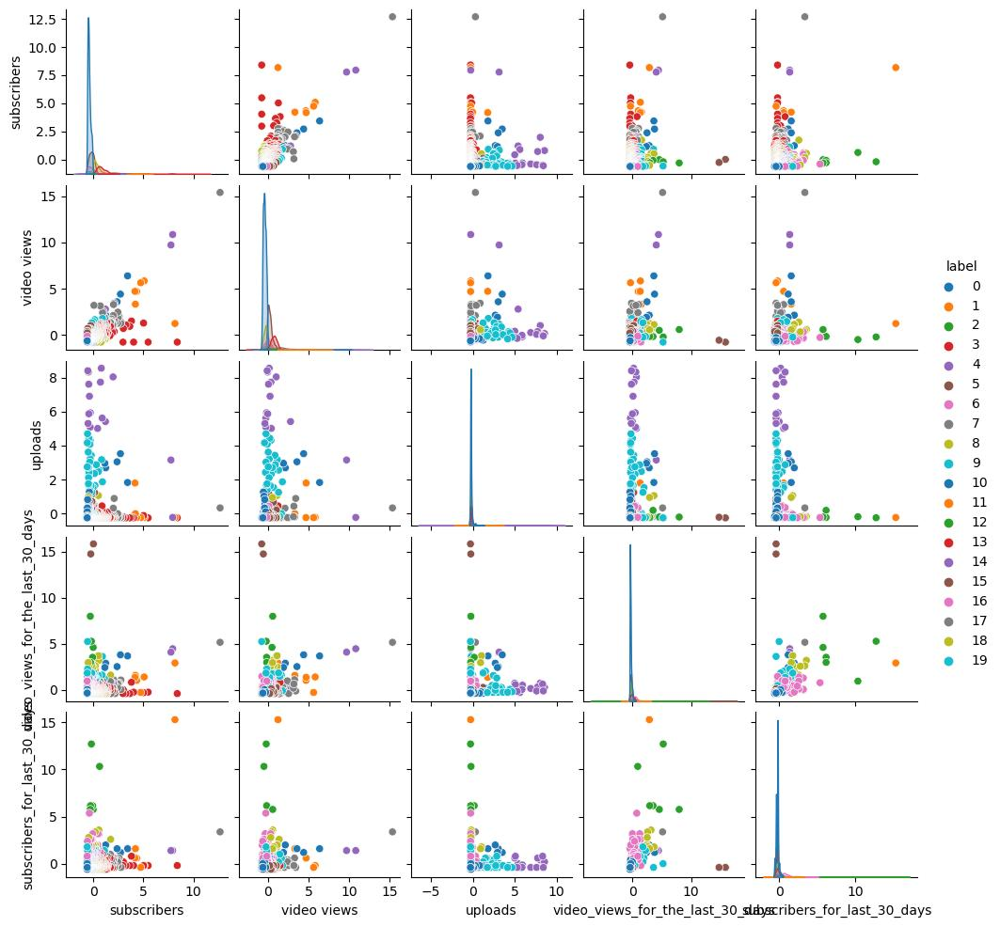

In [63]:
dataset_kmeans = dataset_clustering.copy()
squares = []
for i in range(2, 21):
    print(f'Amount of clusters: {i}')
    kmeans = KMeans(n_clusters = i, n_init = 10, random_state = 42)
    dataset_kmeans['label'] = kmeans.fit_predict(dataset_clustering.values)
    squares.append(kmeans.inertia_)
    sb.pairplot(dataset_kmeans, hue = 'label', palette = 'tab10', height = 2)     
    plt.show()

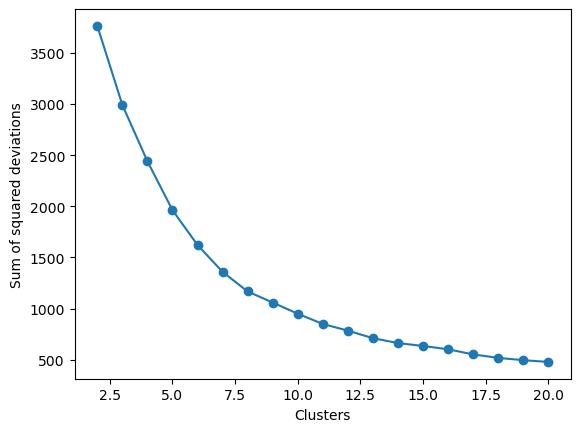

In [64]:
plot_scores(range(2, 21), squares, 'Sum of squared deviations')

## Silhouette method

In [65]:
def calculate_silhouettes(dataframe):
    dataframe['silh_c'] = silhouette_samples(dataframe.drop(columns = ['label']), dataframe['label'])
    n_clusters = len(np.unique(dataframe['label']))
    silh_c = []
    average = silhouette_score(dataframe.drop(columns = ['label']), dataframe['label'])
    for i in range(n_clusters):
        df_i = dataframe[dataframe['label'] == i]
        silh_c += [df_i['silh_c'].values.mean()]
    return n_clusters, silh_c, average

def plot_silhouettes(n_clusters, silh_c, average):
    plt.barh(range(1, n_clusters + 1), silh_c)
    plt.vlines(average, 0.5, n_clusters + 0.5, linestyles = '--', colors = 'black')
    plt.show()

Amount of clusters: 2
Avg. value: 0.77339


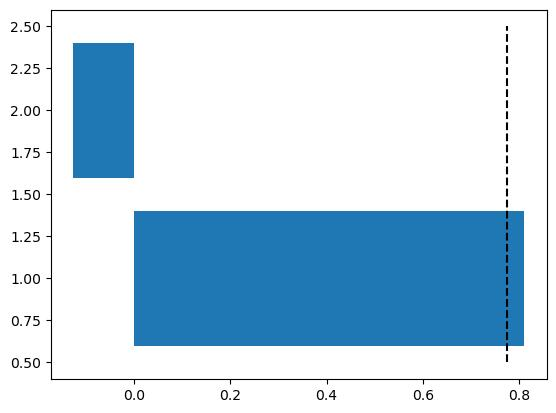


Amount of clusters: 3
Avg. value: 0.72915


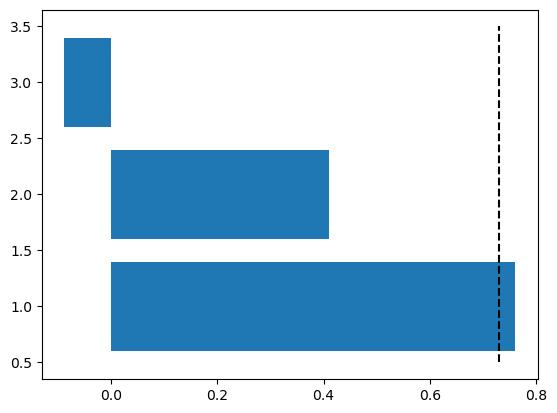


Amount of clusters: 4
Avg. value: 0.72751


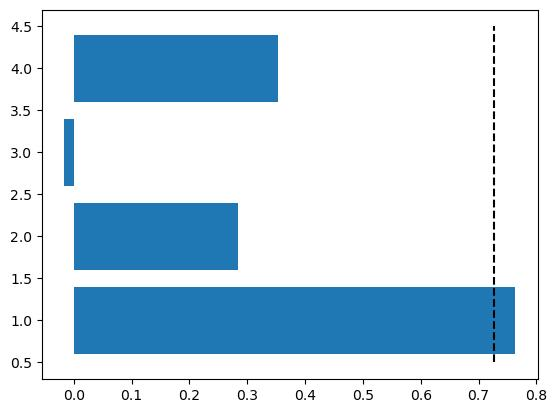


Amount of clusters: 5
Avg. value: 0.57424


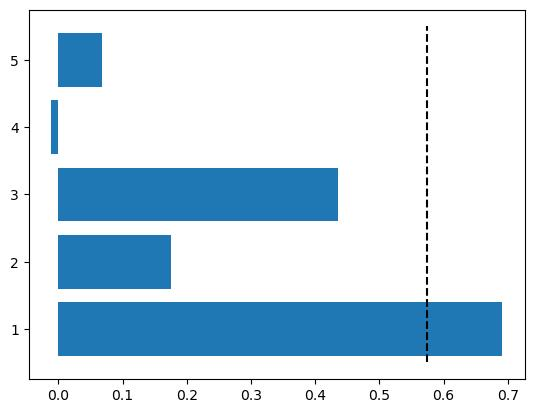


Amount of clusters: 6
Avg. value: 0.58645


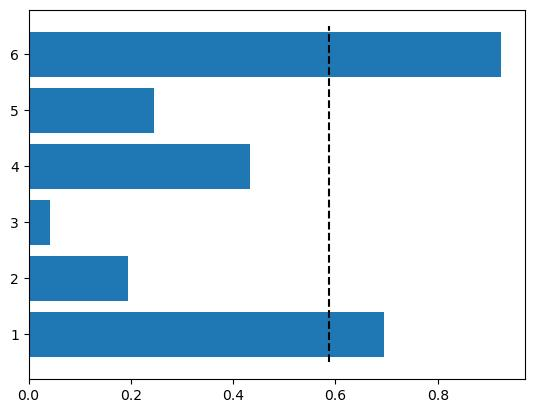


Amount of clusters: 7
Avg. value: 0.60291


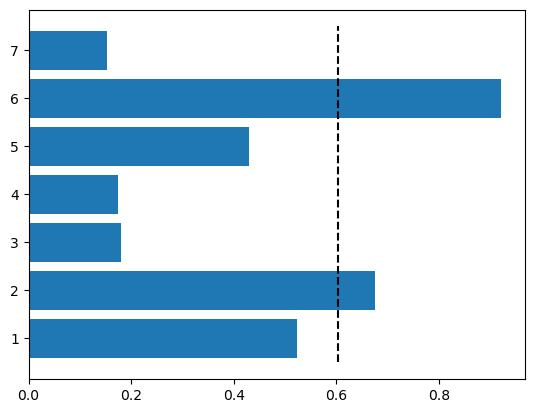


Amount of clusters: 8
Avg. value: 0.48339


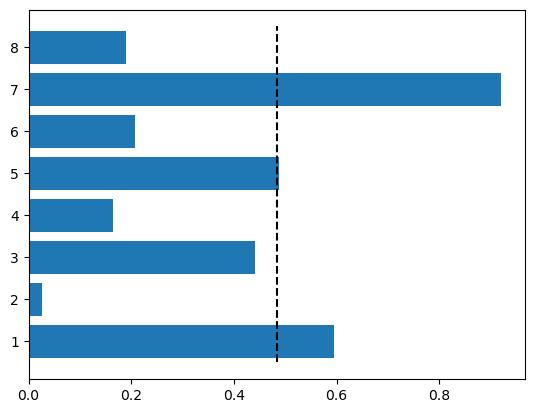


Amount of clusters: 9
Avg. value: 0.50326


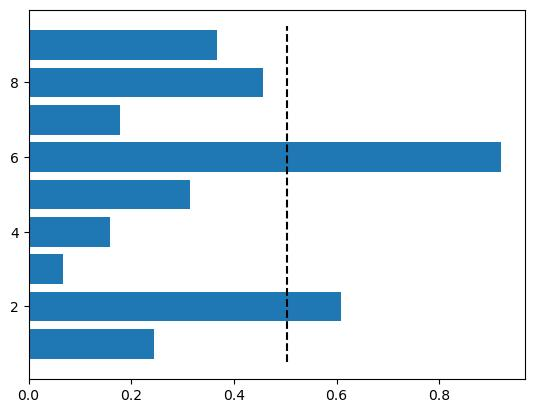


Amount of clusters: 10
Avg. value: 0.48152


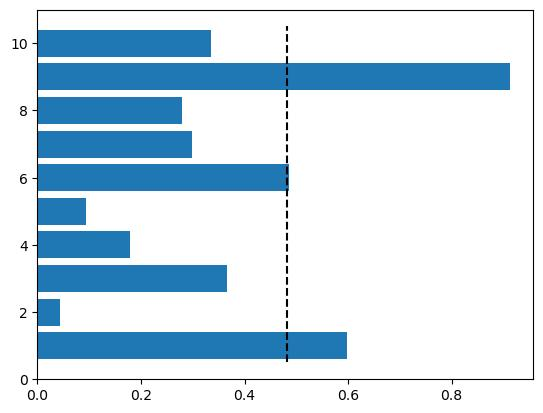


Amount of clusters: 11
Avg. value: 0.46743


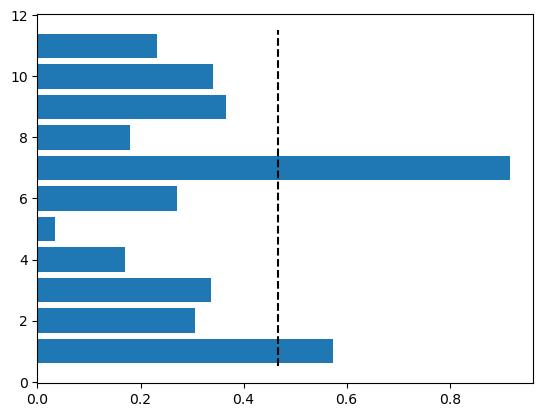


Amount of clusters: 12
Avg. value: 0.47137


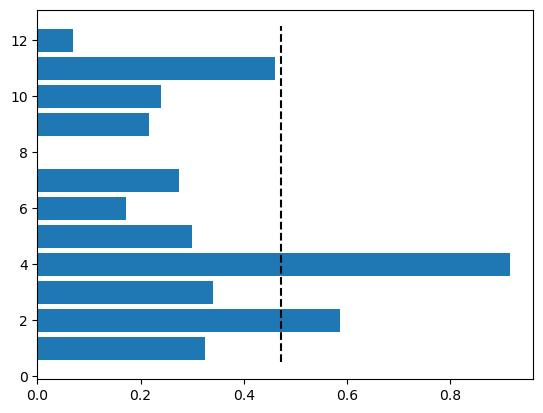


Amount of clusters: 13
Avg. value: 0.44590


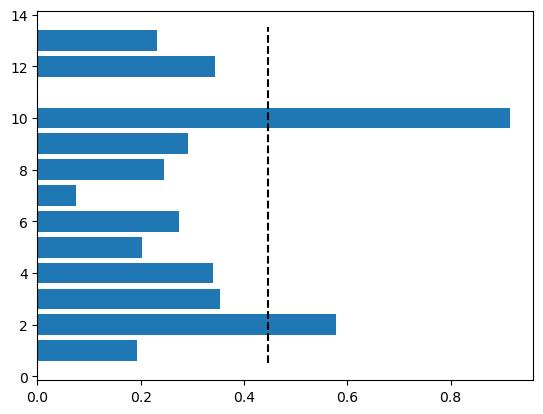


Amount of clusters: 14
Avg. value: 0.44842


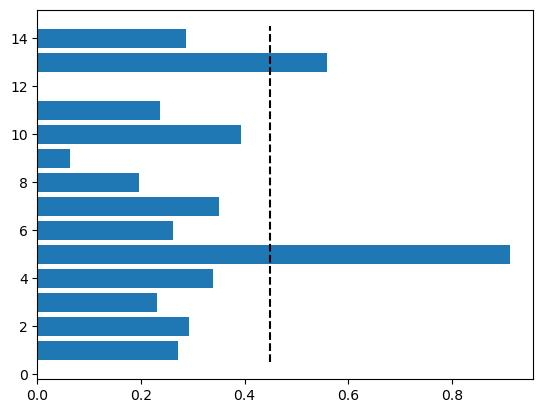


Amount of clusters: 15
Avg. value: 0.44613


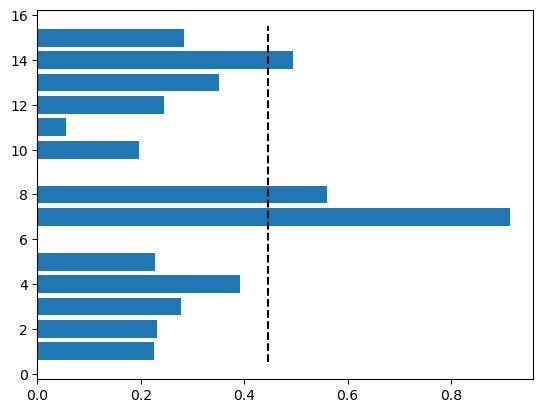


Amount of clusters: 16
Avg. value: 0.33240


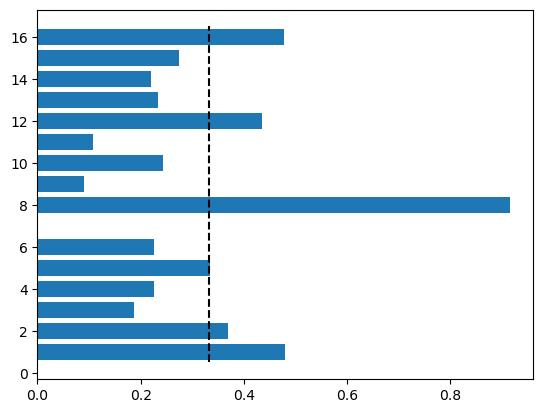


Amount of clusters: 17
Avg. value: 0.44578


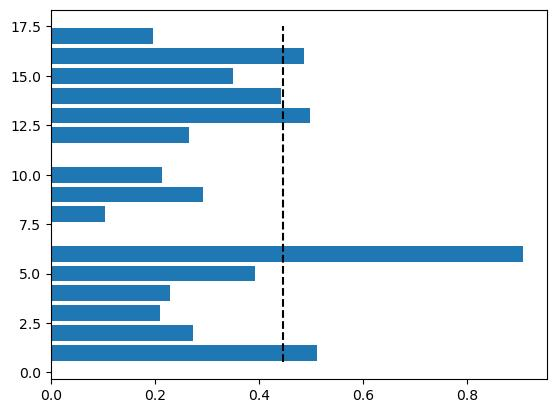


Amount of clusters: 18
Avg. value: 0.30854


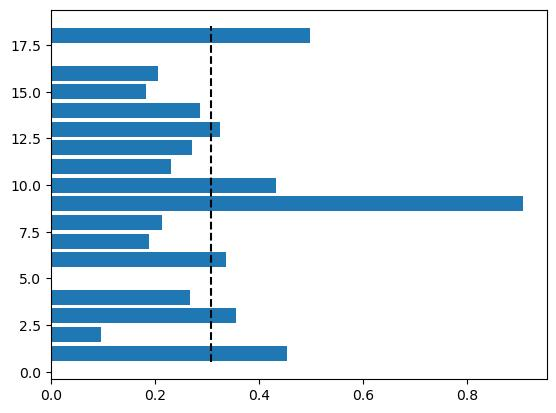


Amount of clusters: 19
Avg. value: 0.28937


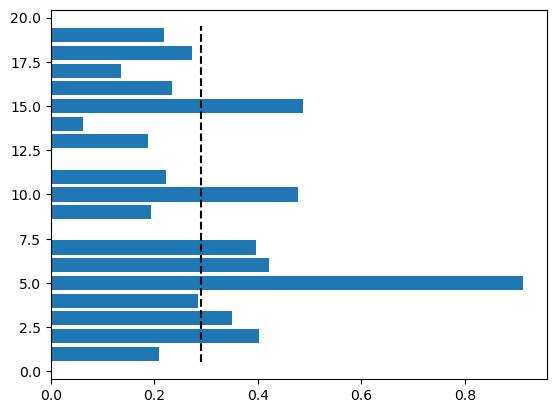


Amount of clusters: 20
Avg. value: 0.32564


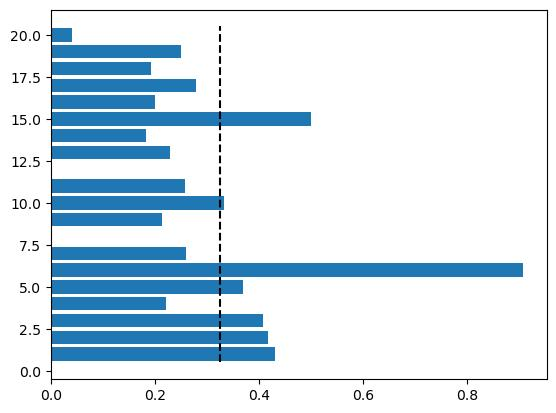



Max. silhouette coefficient: 0.7733934539664261 (amount of clusters: 2)


In [67]:
dataset_kmeans = dataset_clustering.copy()
averages = []
for i in range(2, 21):
    print(f'Amount of clusters: {i}')
    kmeans = KMeans(n_clusters = i, random_state = 42)
    dataset_kmeans['label'] = kmeans.fit_predict(dataset_clustering.values)
    n_clusters, silh_c, average = calculate_silhouettes(dataset_kmeans)
    averages.append((i, average))
    print(f'Avg. value: {average:.5f}')
    plot_silhouettes(n_clusters, silh_c, average)
    print('')

sorted_averages = sorted(averages, key = lambda x: x[1], reverse = True)
max_value = sorted_averages[0]
print('')
print(f'Max. silhouette coefficient: {max_value[1]} (amount of clusters: {max_value[0]})')

Amount of clusters: 2


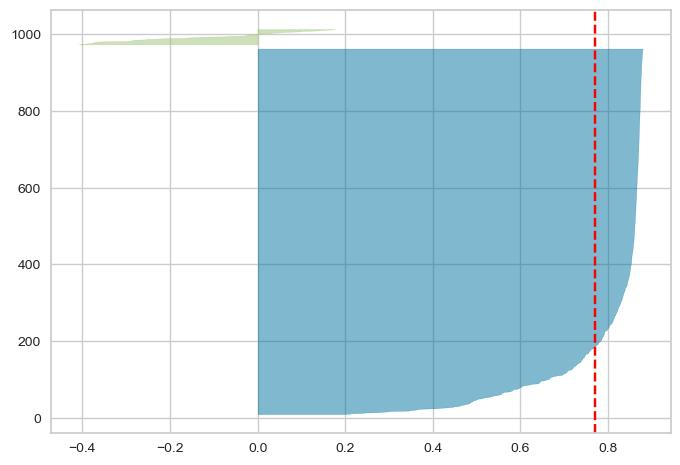

Amount of clusters: 3


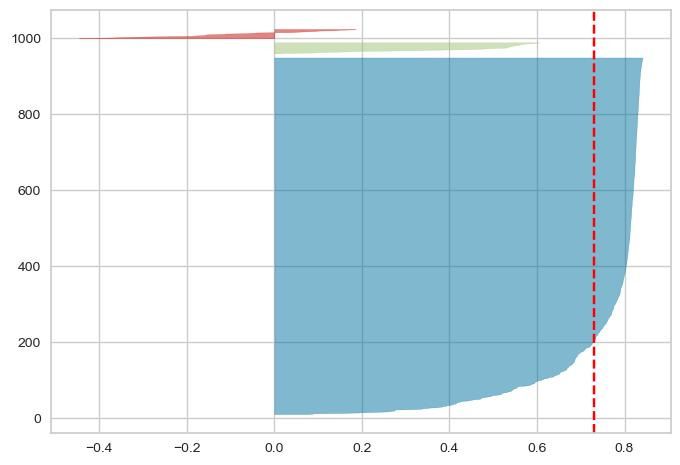

Amount of clusters: 4


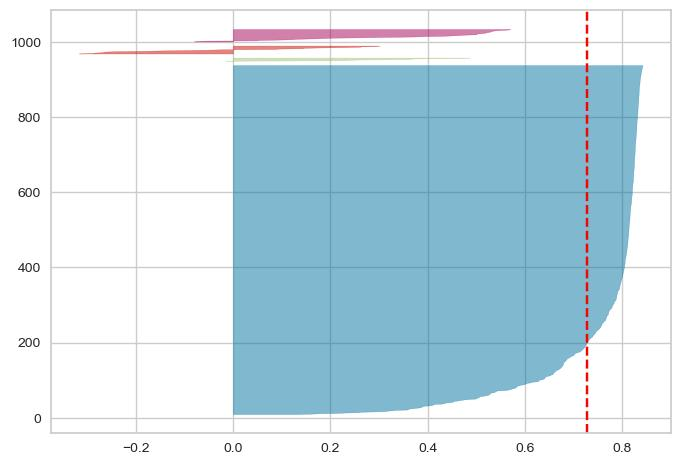

Amount of clusters: 5


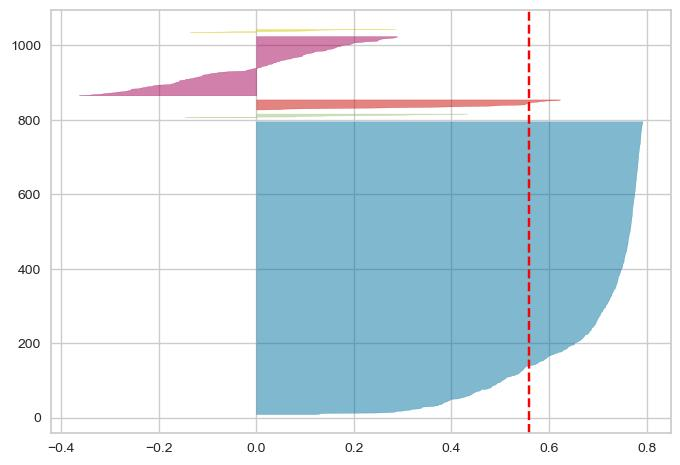

Amount of clusters: 6


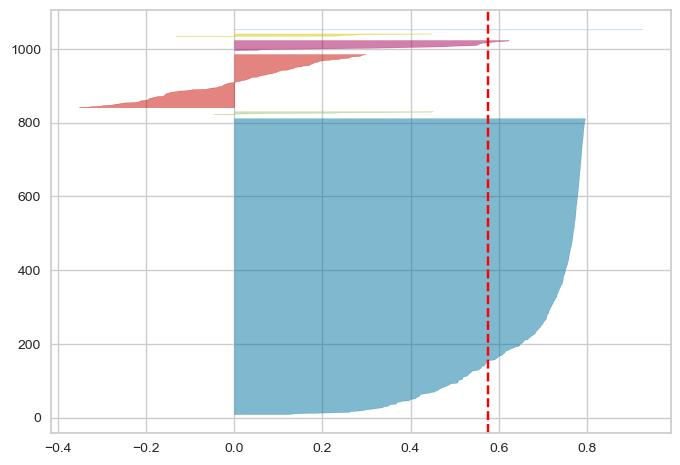

Amount of clusters: 7


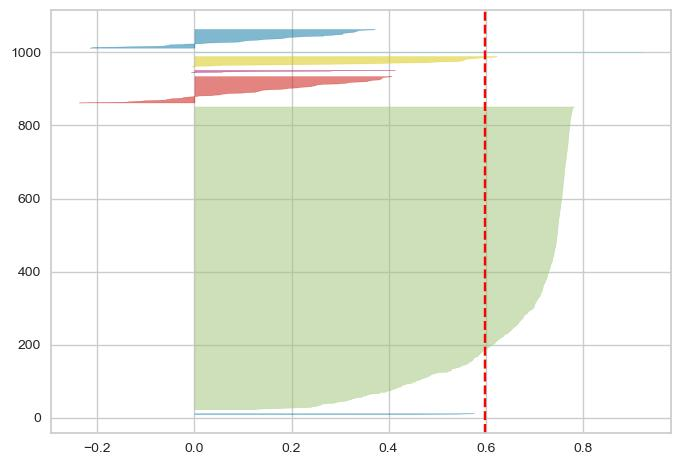

Amount of clusters: 8


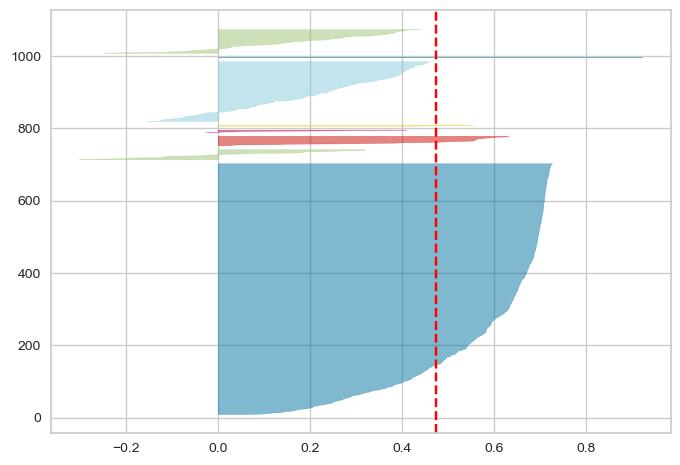

Amount of clusters: 9


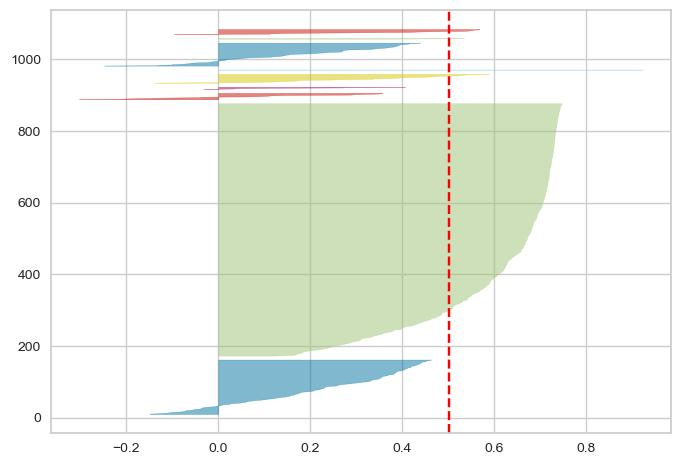

Amount of clusters: 10


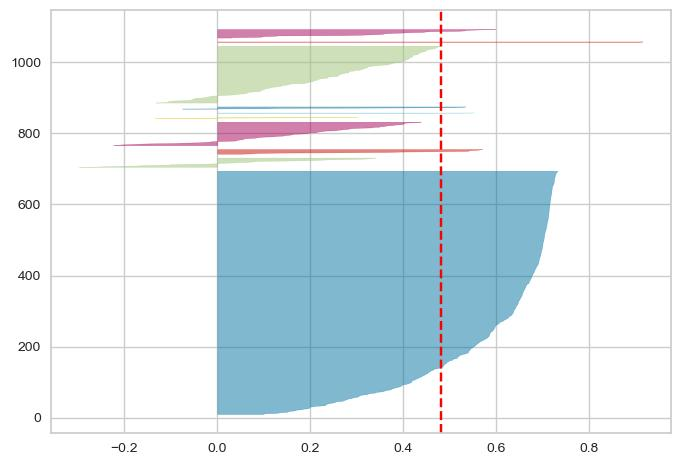

Amount of clusters: 11


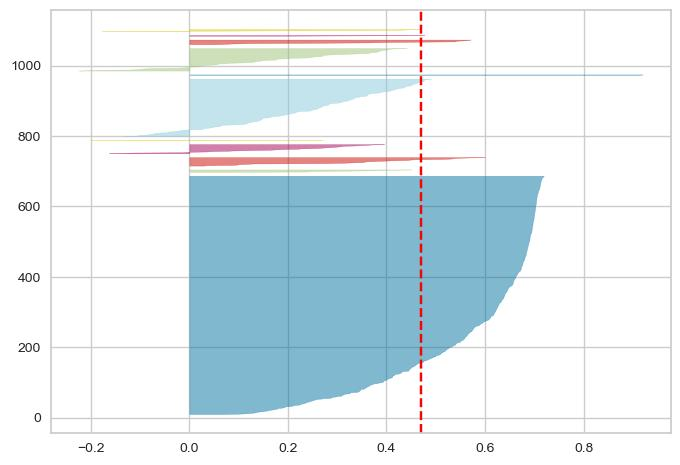

Amount of clusters: 12


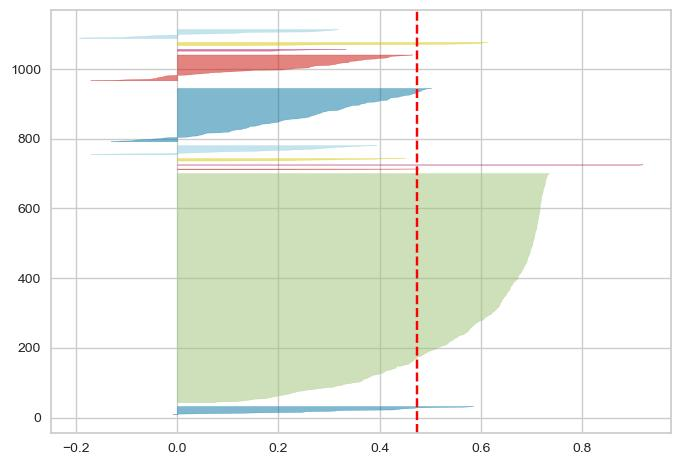

Amount of clusters: 13


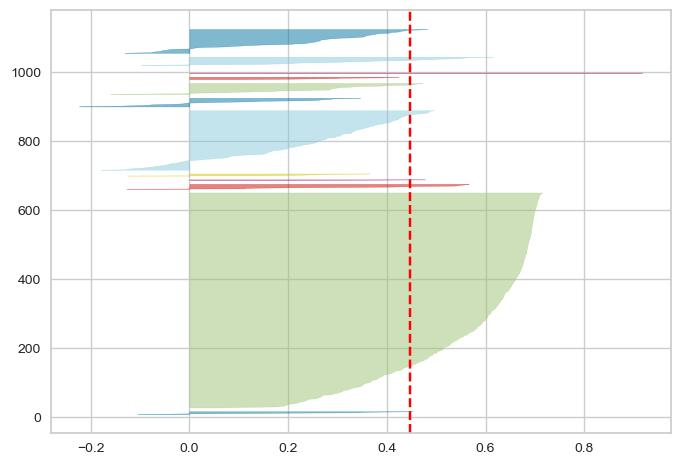

Amount of clusters: 14


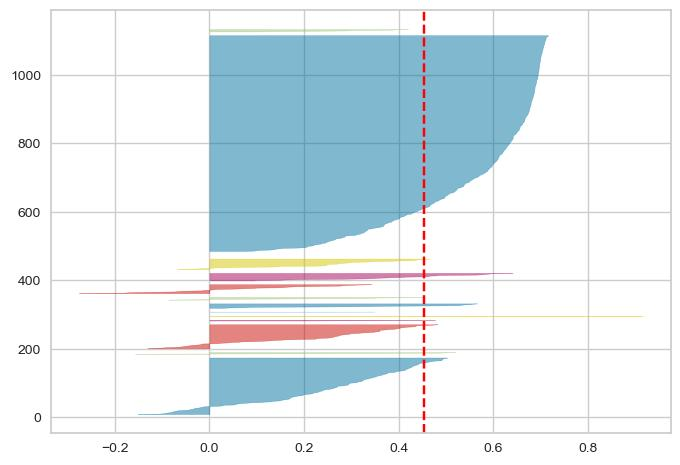

Amount of clusters: 15


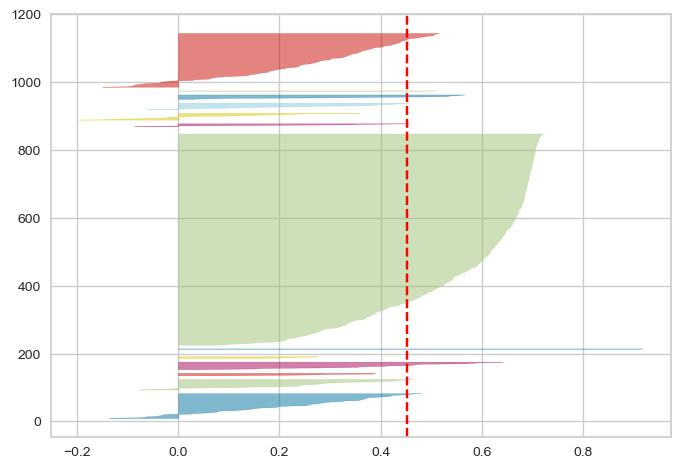

Amount of clusters: 16


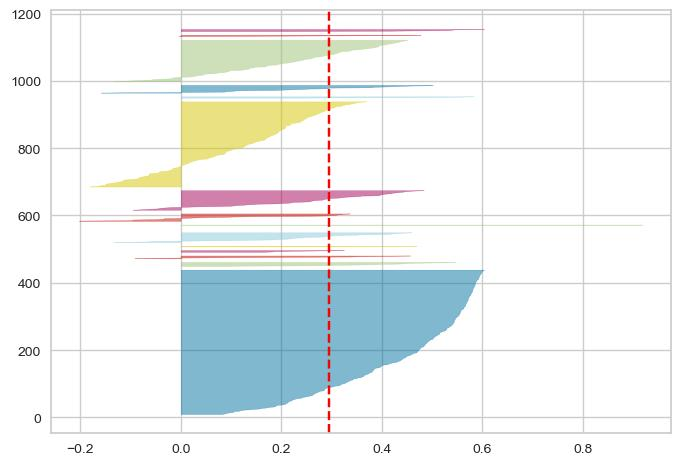

Amount of clusters: 17


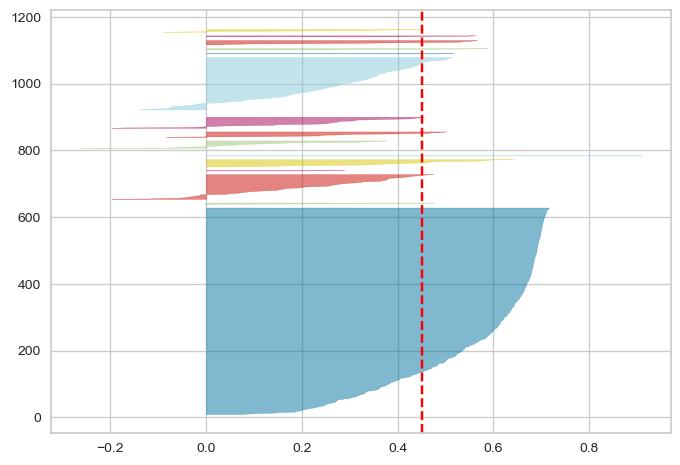

Amount of clusters: 18


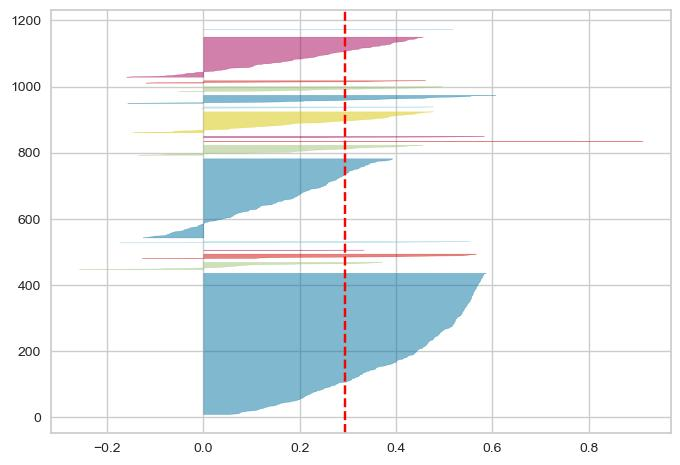

Amount of clusters: 19


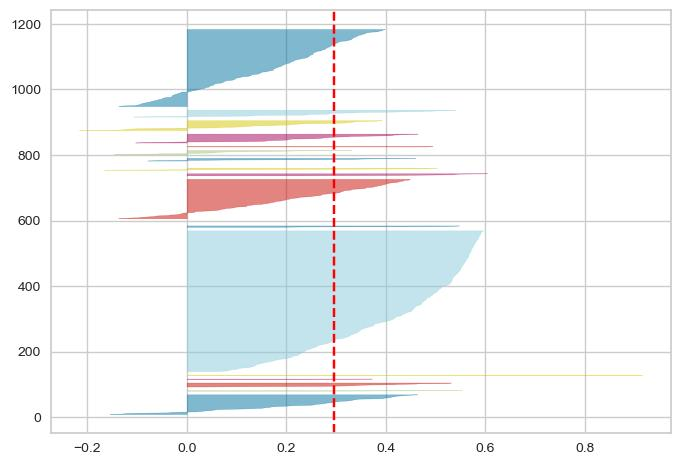

Amount of clusters: 20


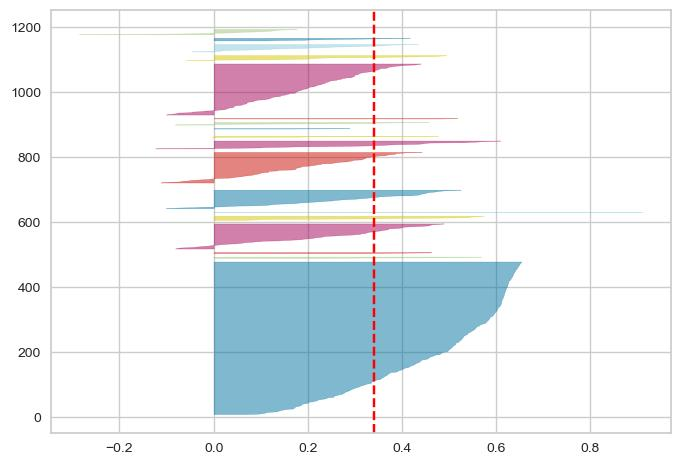

In [69]:
from yellowbrick.cluster import SilhouetteVisualizer
for i in range(2, 21):
    print(f'Amount of clusters: {i}')
    kmeans = KMeans(n_clusters = i, random_state = 42)
    visualizer = SilhouetteVisualizer(kmeans, colors = 'yellowbrick')
    visualizer.fit(X)
    plt.show()

## Graphical description of clustered data (K-Means)

In [74]:
def describe_clustered_data(df):
    sb.pairplot(df, hue = 'category', palette = 'tab10')
    plt.show()
    sb.countplot(x = df['category'])
    plt.show()
    sb.barplot(x = 'category', y = 'subscribers', data = df)
    plt.show()
    sb.barplot(x = 'category', y = 'video views', data = df)
    plt.show()
    sb.barplot(x = 'category', y = 'uploads', data = df)
    plt.show()
    sb.barplot(x = 'category', y = 'video_views_for_the_last_30_days', data = df)
    plt.show()
    sb.barplot(x = 'category', y = 'subscribers_for_last_30_days', data = df)
    plt.show()

In [75]:
print_best_coefficients('Silhouette', sil_scores)
print_best_coefficients('Calinski-Harabasz', calinski_scores)
print_best_coefficients('Davies-Bouldin', davies_scores, False)
print_best_coefficients('Rand', rand_scores)
print_best_coefficients('Adjusted Rand', adjusted_rand_scores)
print_best_coefficients('Mutual info', mutual_info_scores)
print_best_coefficients('Adjusted mutual info', adjusted_mutual_info_scores)
print_best_coefficients('Normalized mutual info', normalized_mutual_info_scores)
print_best_coefficients('Homogeneity', homogeneity_scores)
print_best_coefficients('Completeness', completeness_scores)
print_best_coefficients('V-measure', v_measure_scores)
print_best_coefficients('Fowlkes-Mallows', fowlkes_mallows_scores)

Max. Silhouette score: 0.771 (clusters: 2)
Max. Calinski-Harabasz score: 493.766 (clusters: 18)
Min. Davies-Bouldin score: 0.753 (clusters: 17)
Max. Rand score: 0.633 (clusters: 19)
Max. Adjusted Rand score: 0.012 (clusters: 14)
Max. Mutual info score: 0.193 (clusters: 20)
Max. Adjusted mutual info score: 0.074 (clusters: 20)
Max. Normalized mutual info score: 0.109 (clusters: 20)
Max. Homogeneity score: 0.112 (clusters: 20)
Max. Completeness score: 0.171 (clusters: 4)
Max. V-measure score: 0.109 (clusters: 20)
Max. Fowlkes-Mallows score: 0.459 (clusters: 2)


Amount of clusters: 2


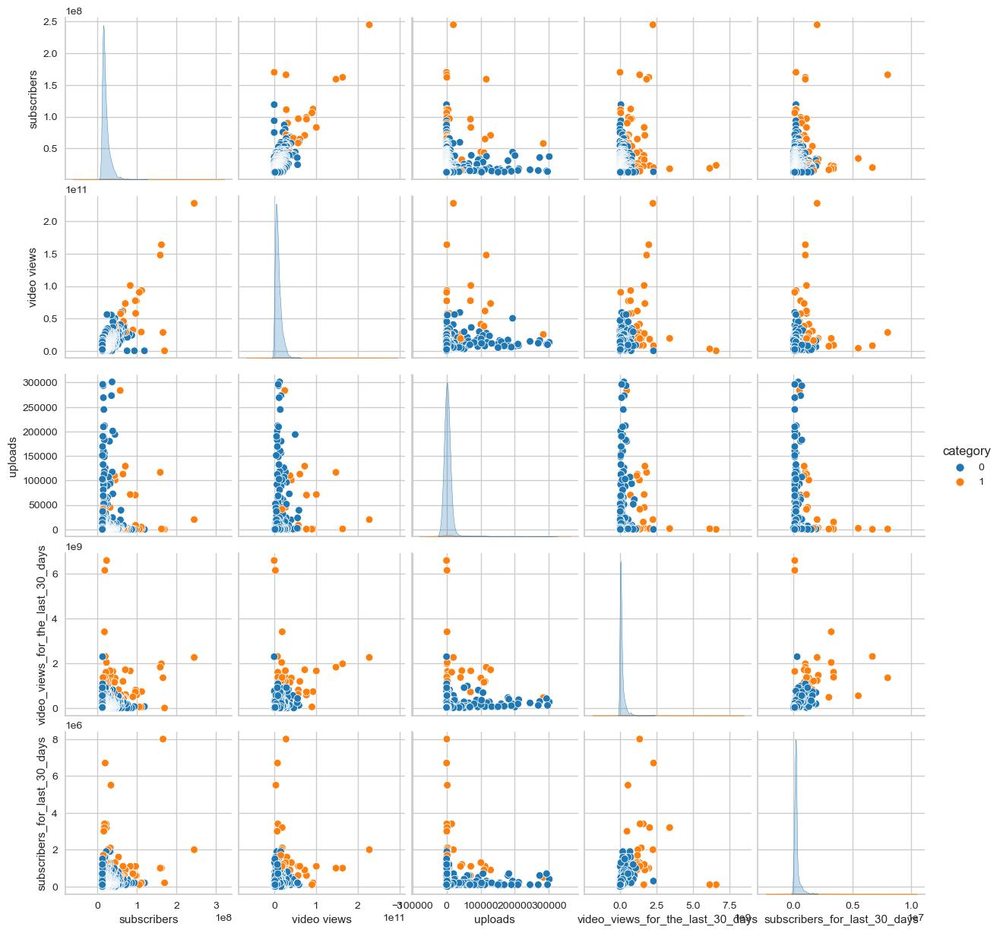

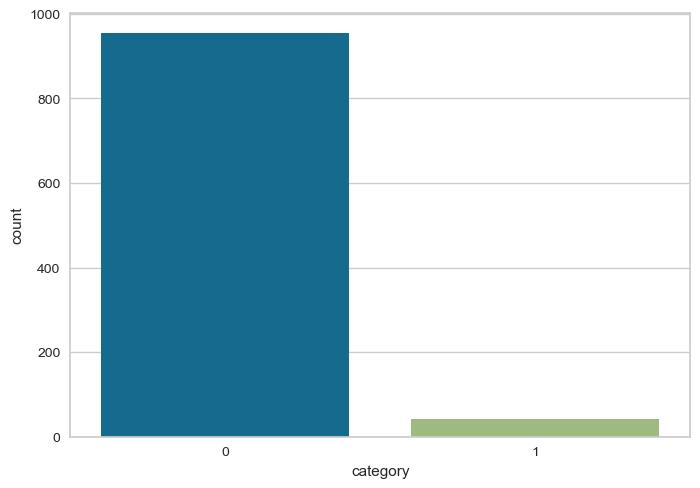

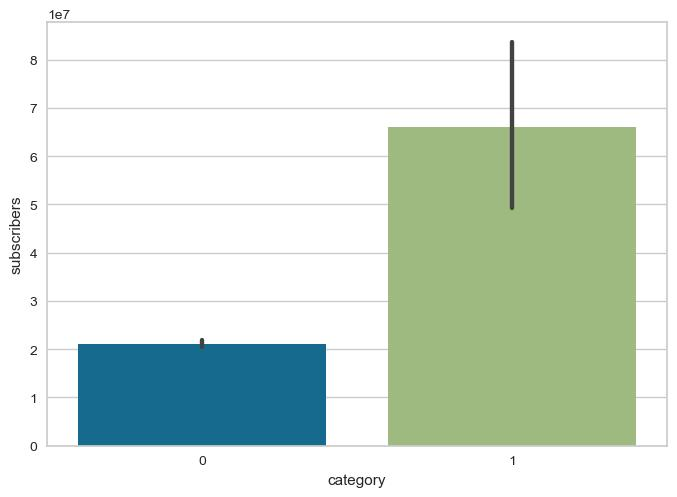

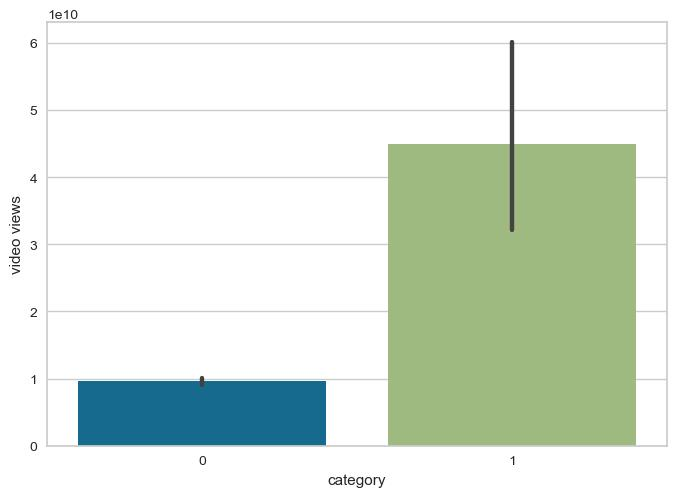

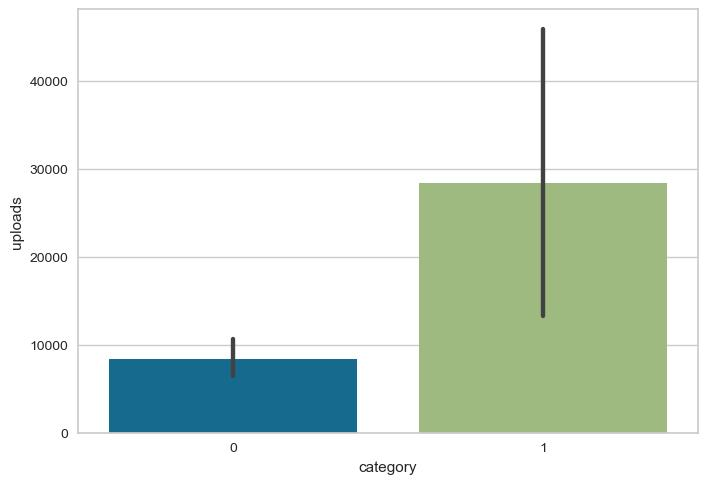

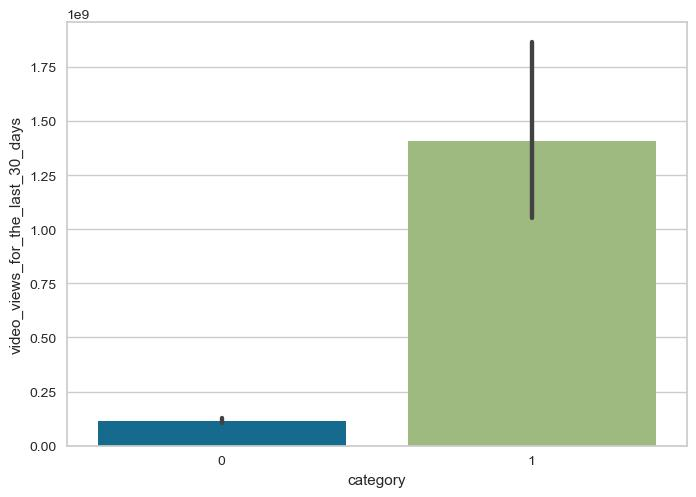

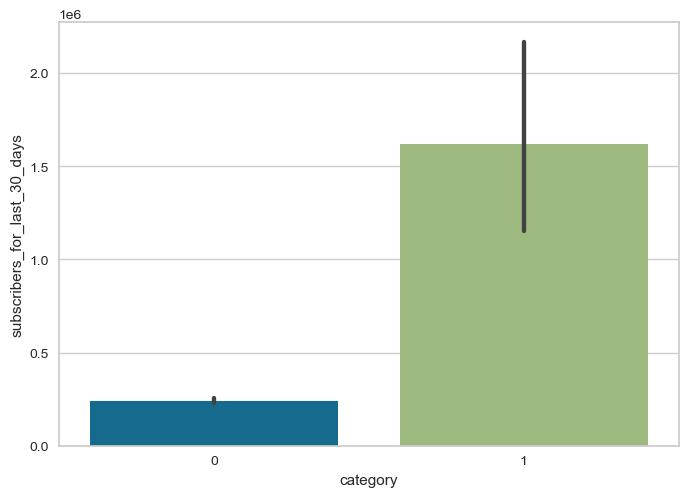


Amount of clusters: 4


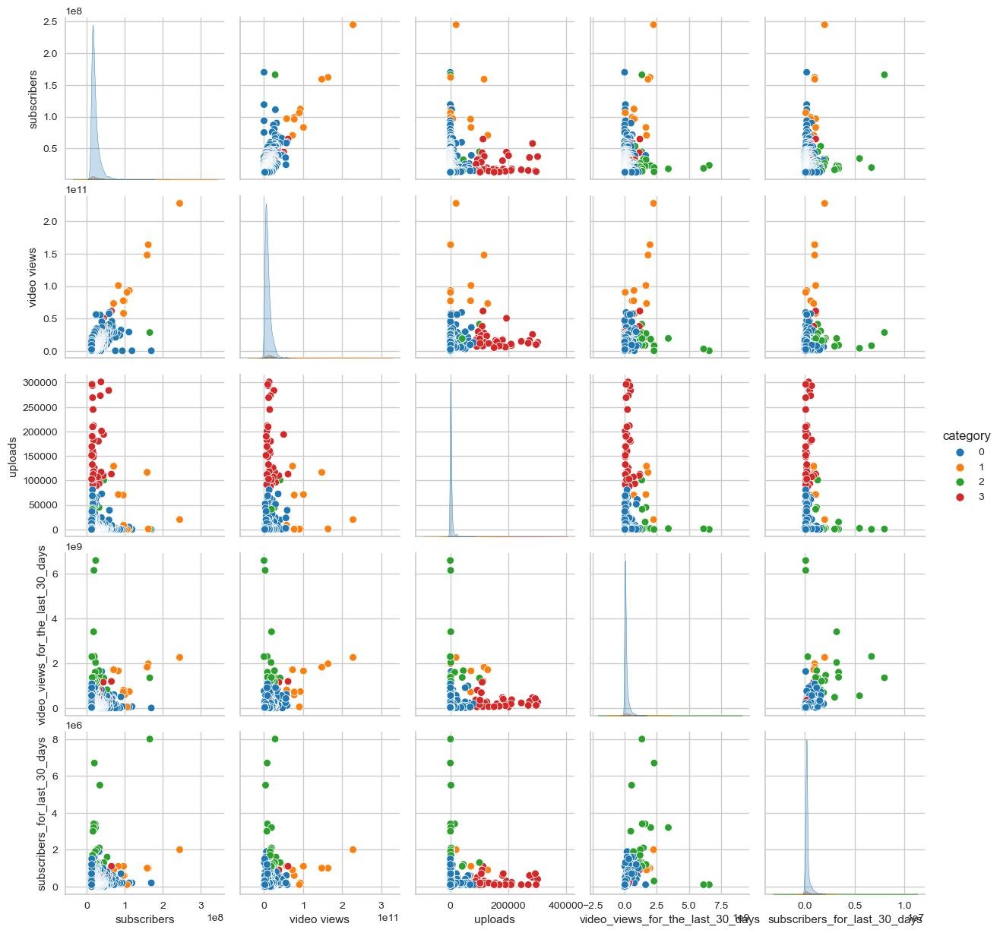

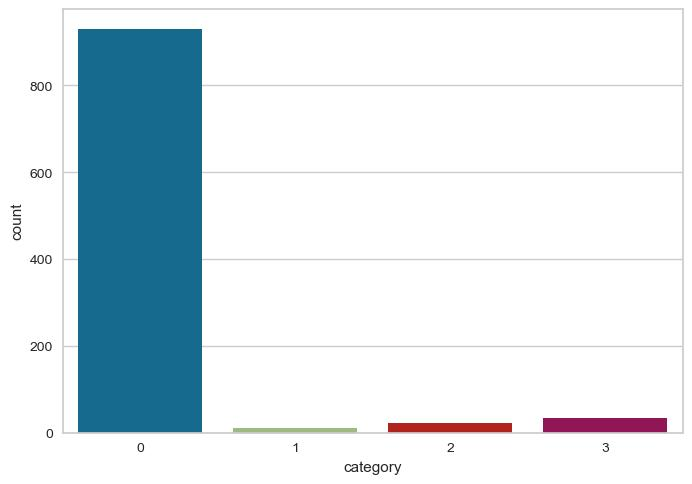

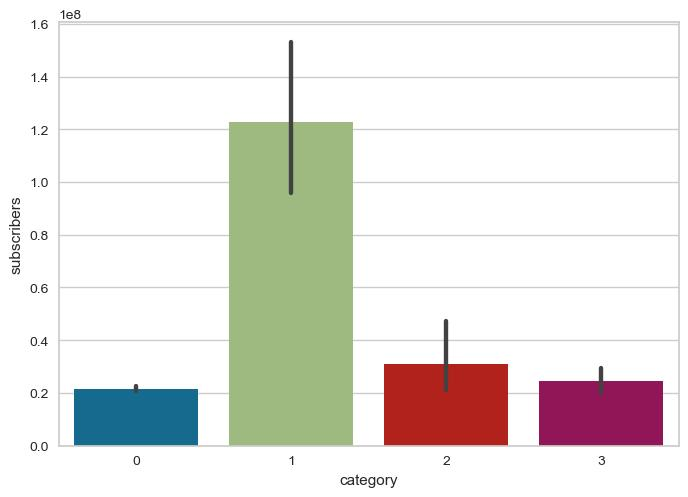

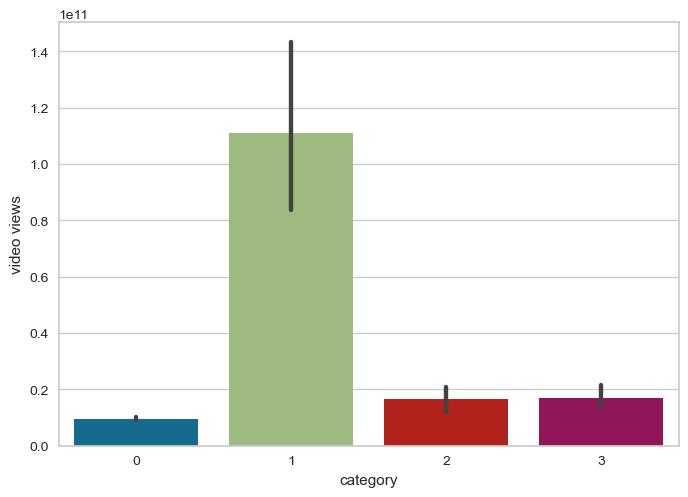

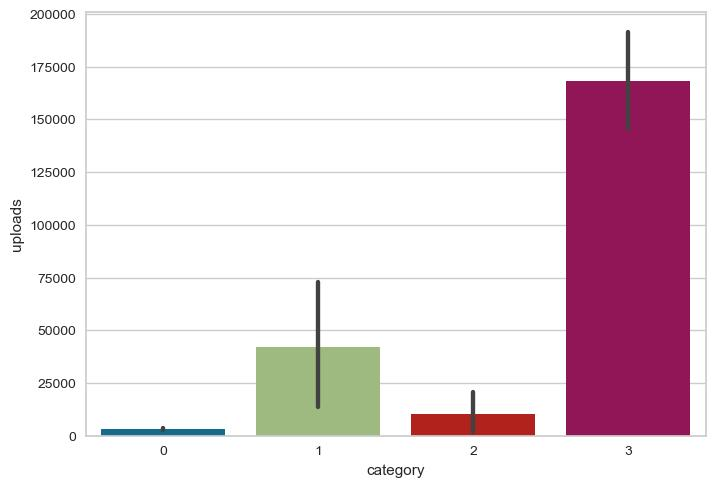

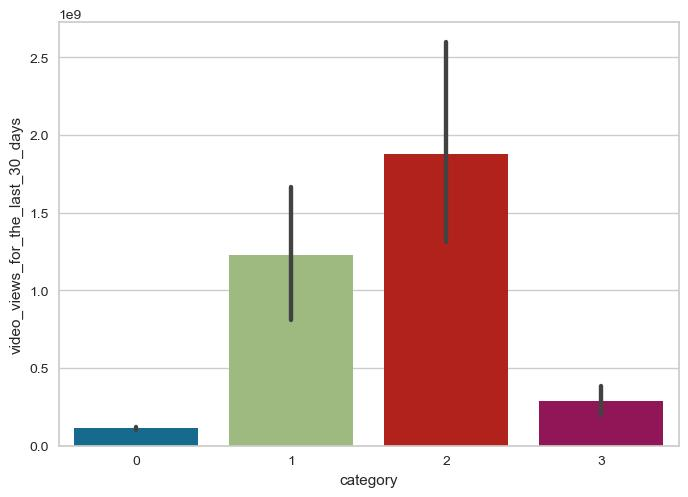

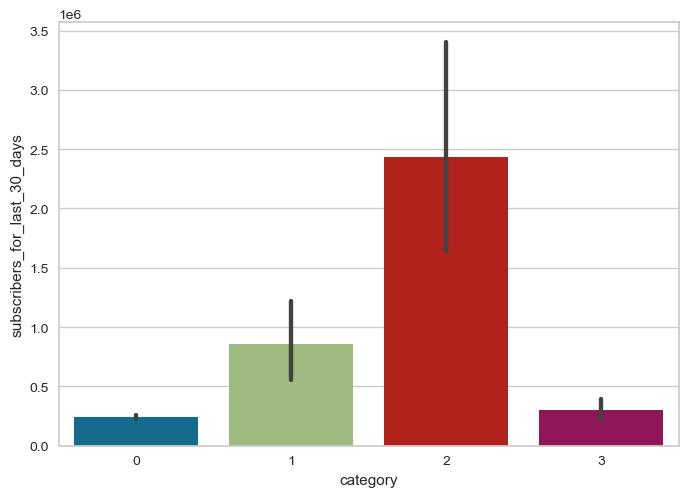


Amount of clusters: 14


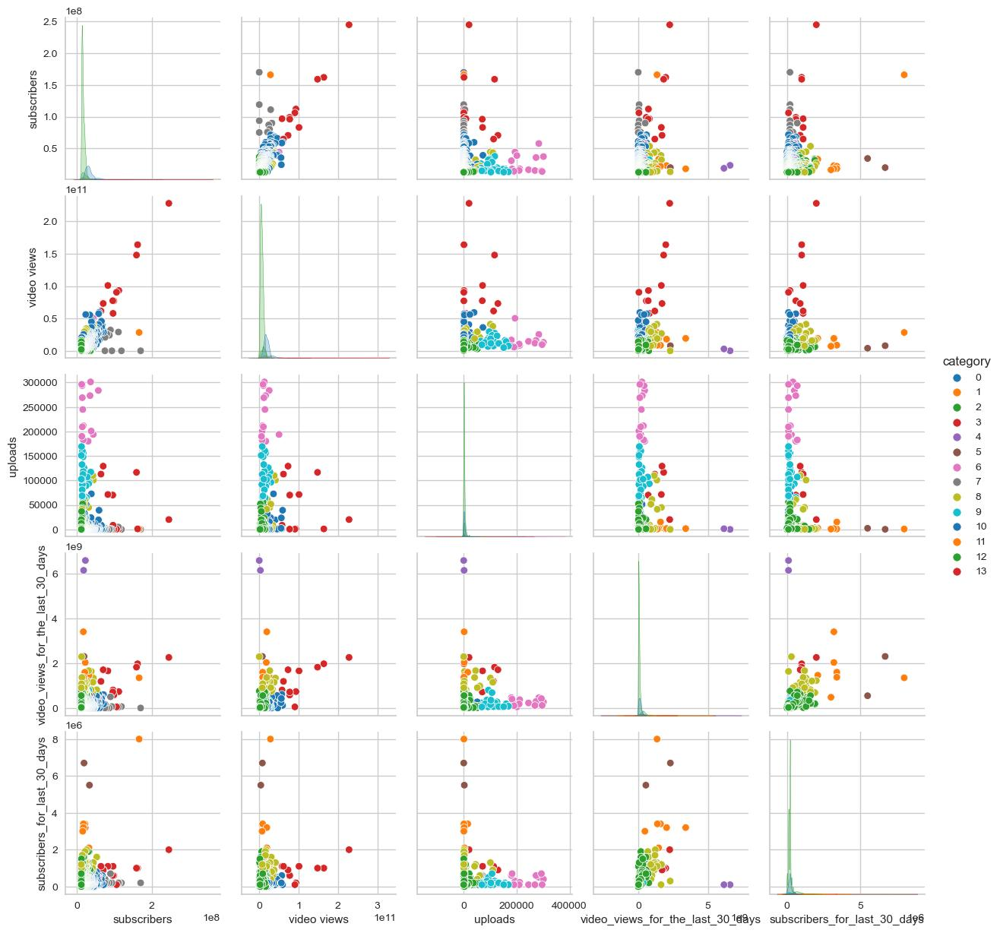

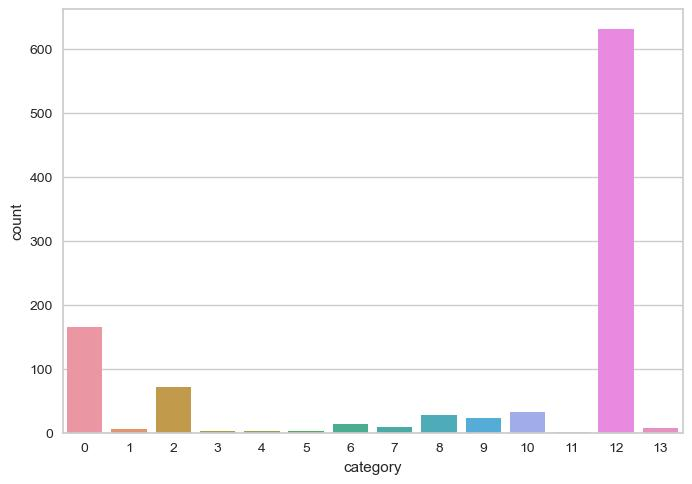

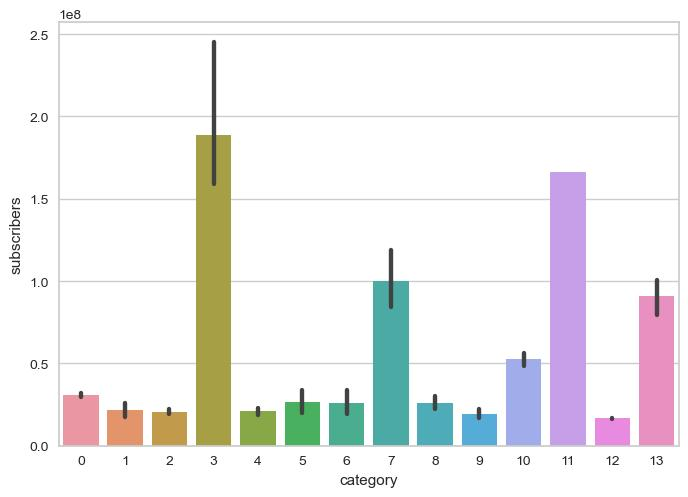

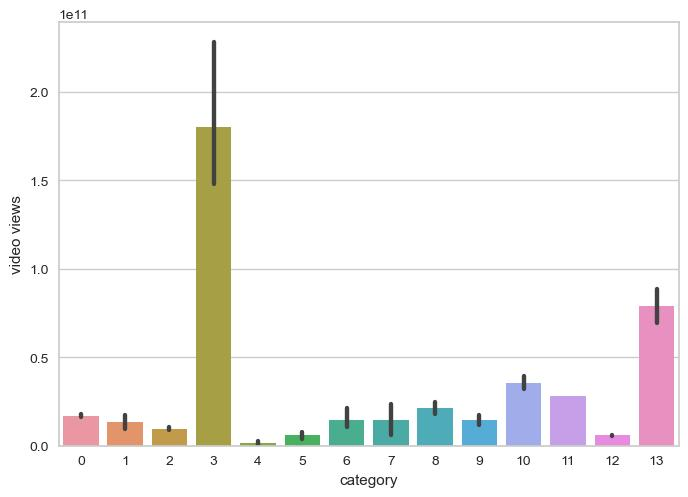

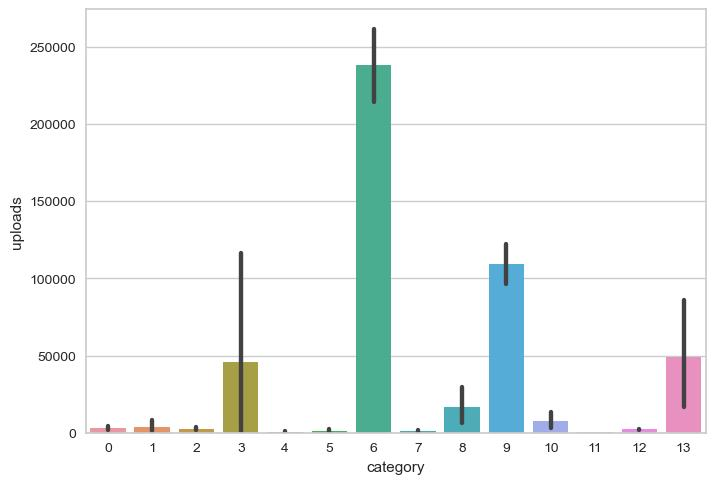

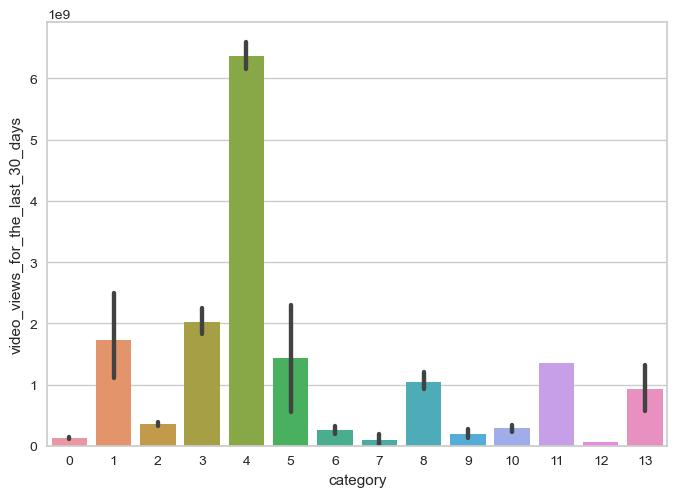

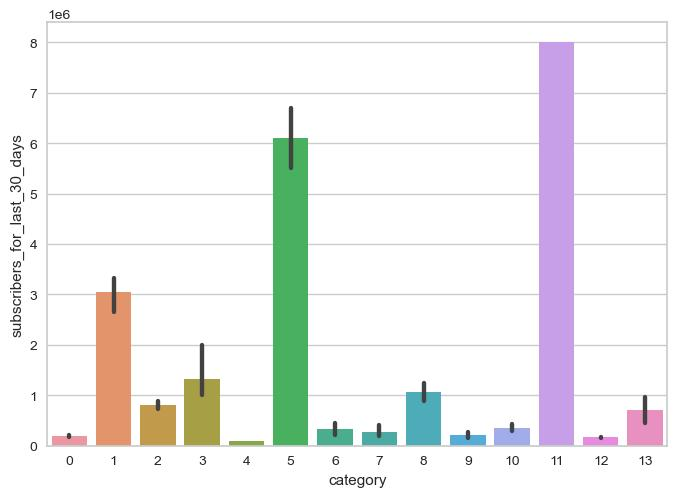


Amount of clusters: 17


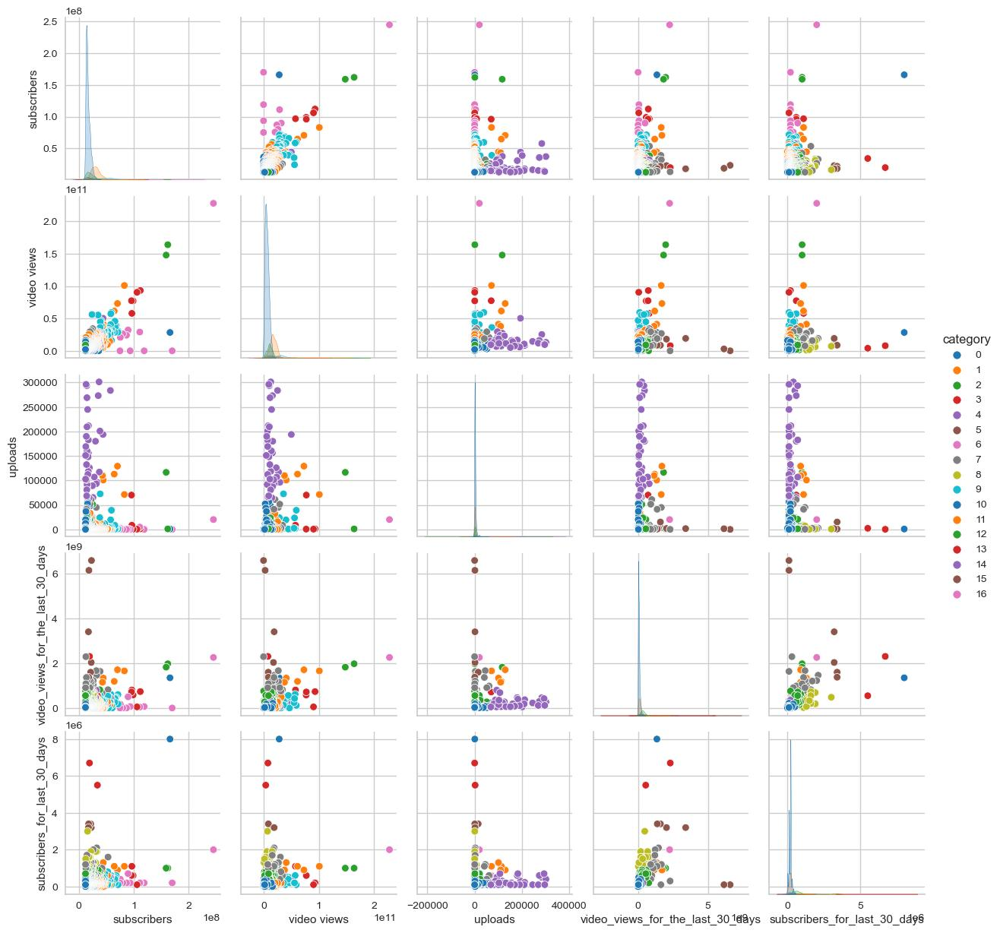

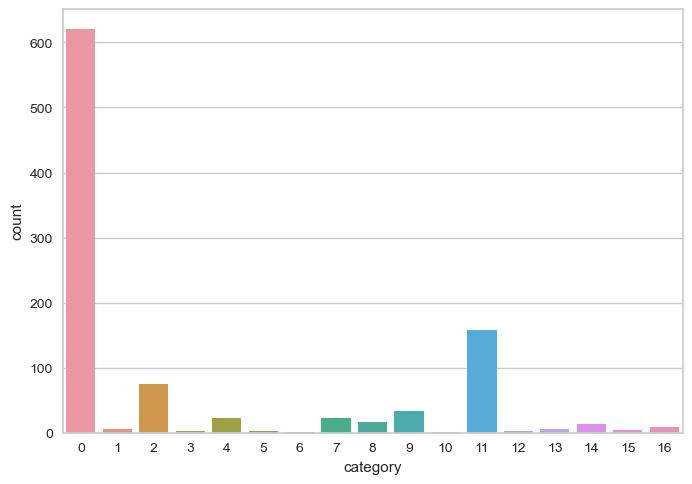

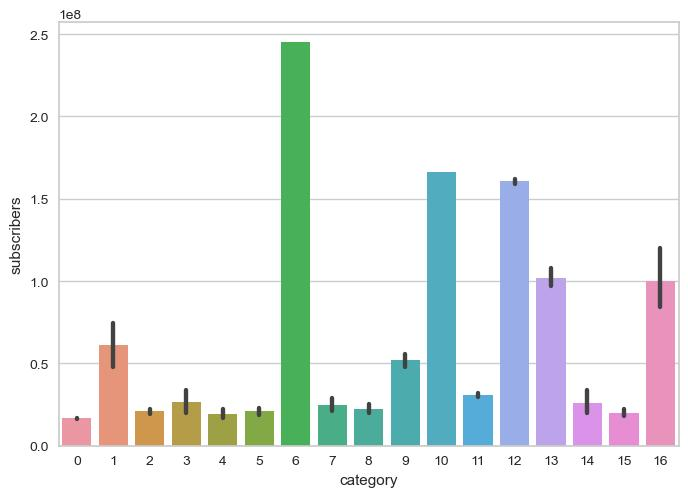

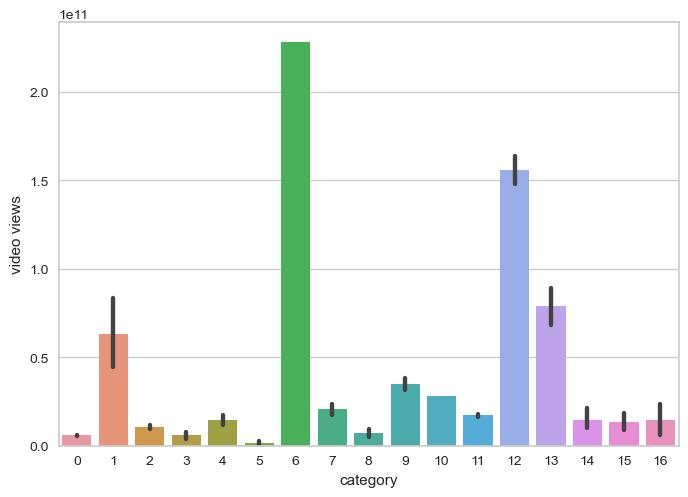

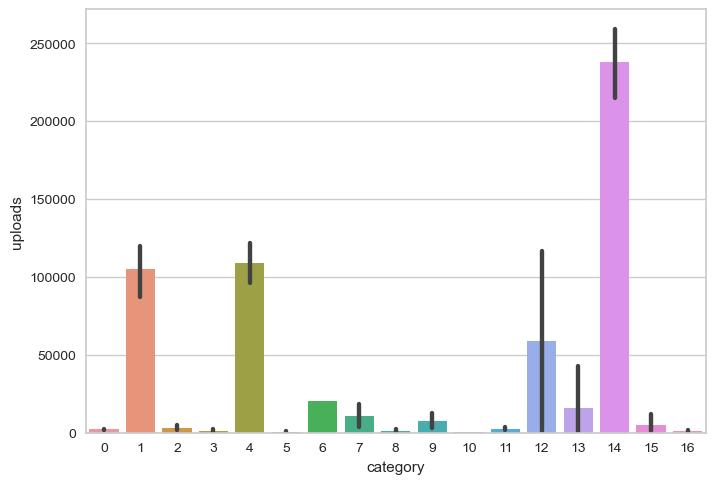

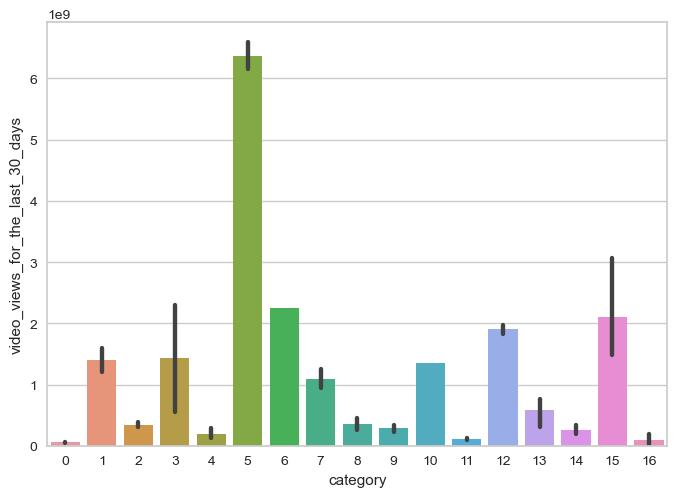

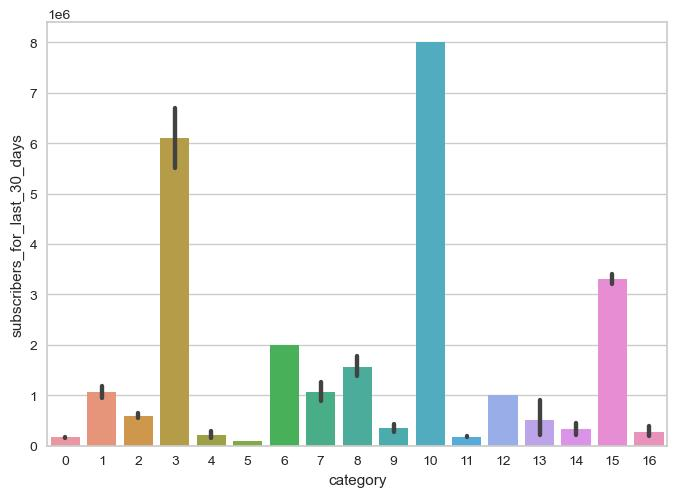


Amount of clusters: 18


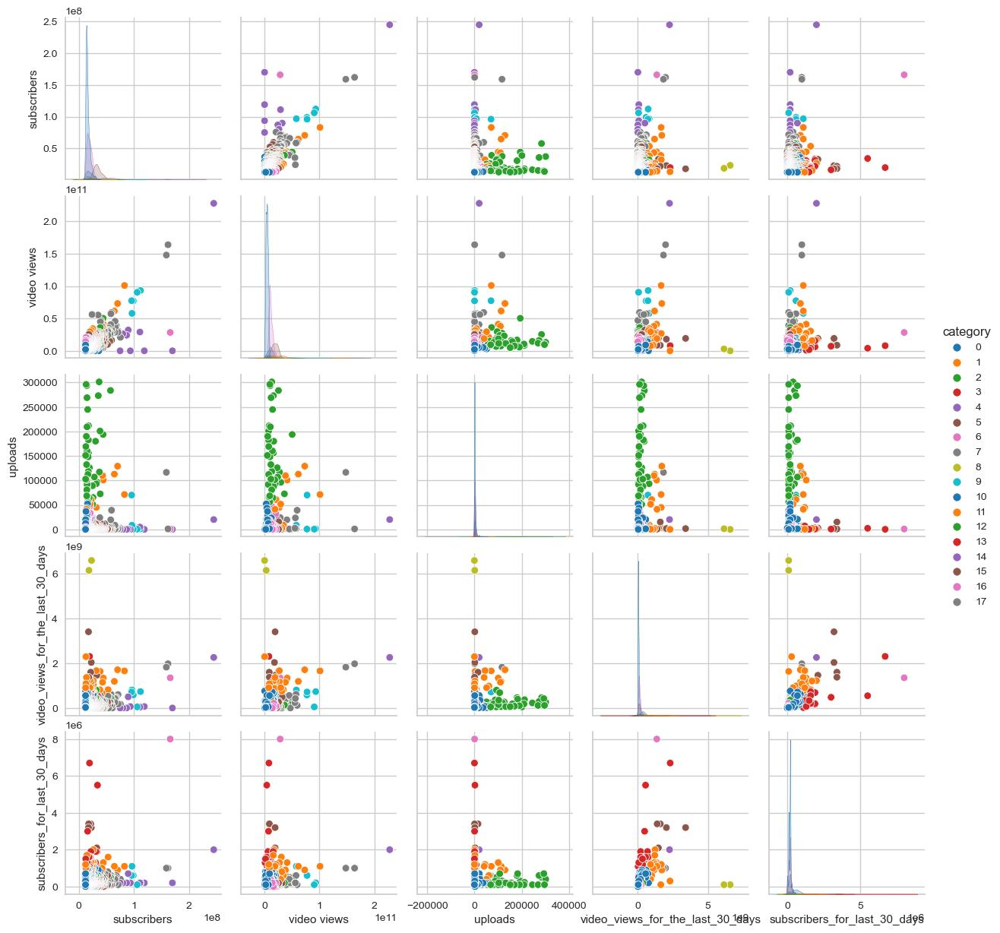

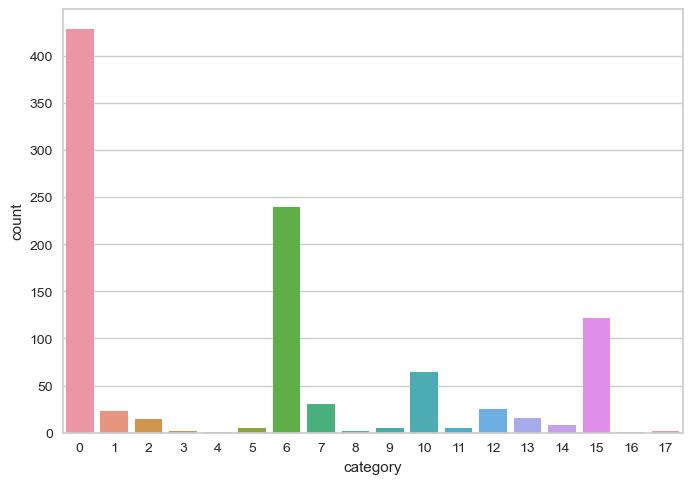

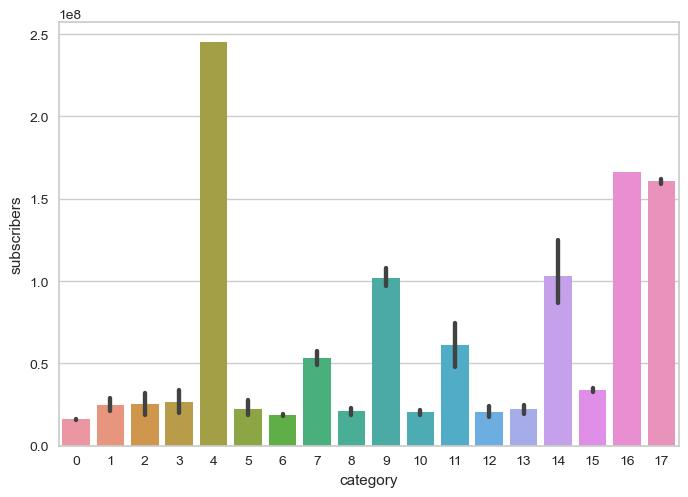

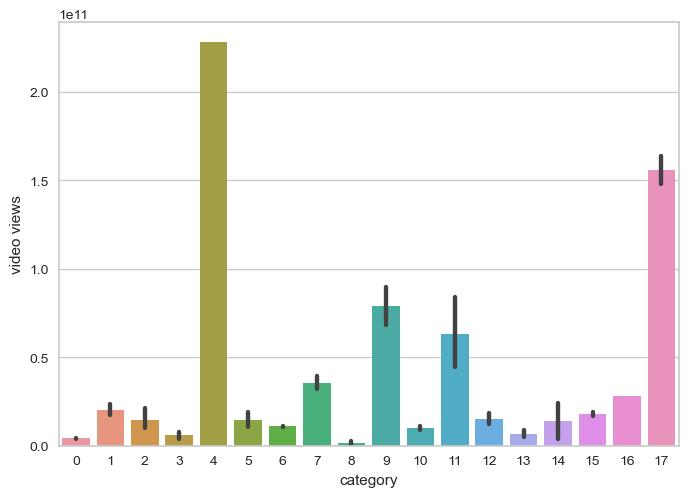

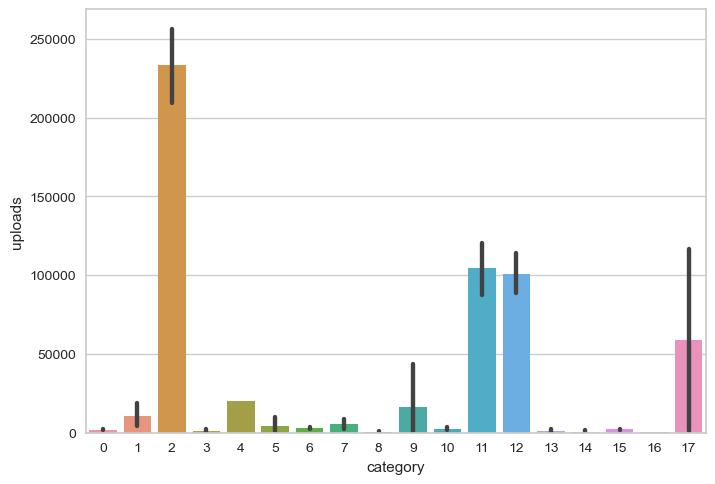

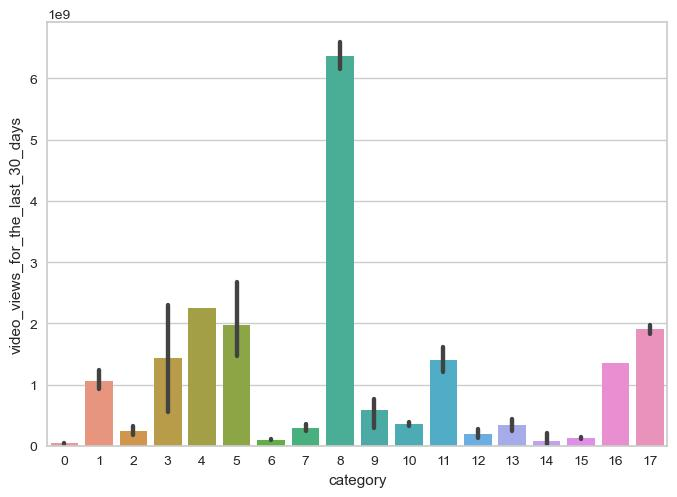

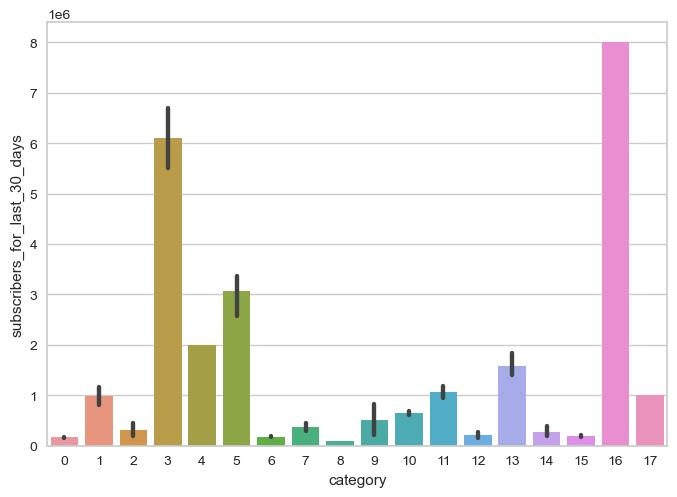


Amount of clusters: 19


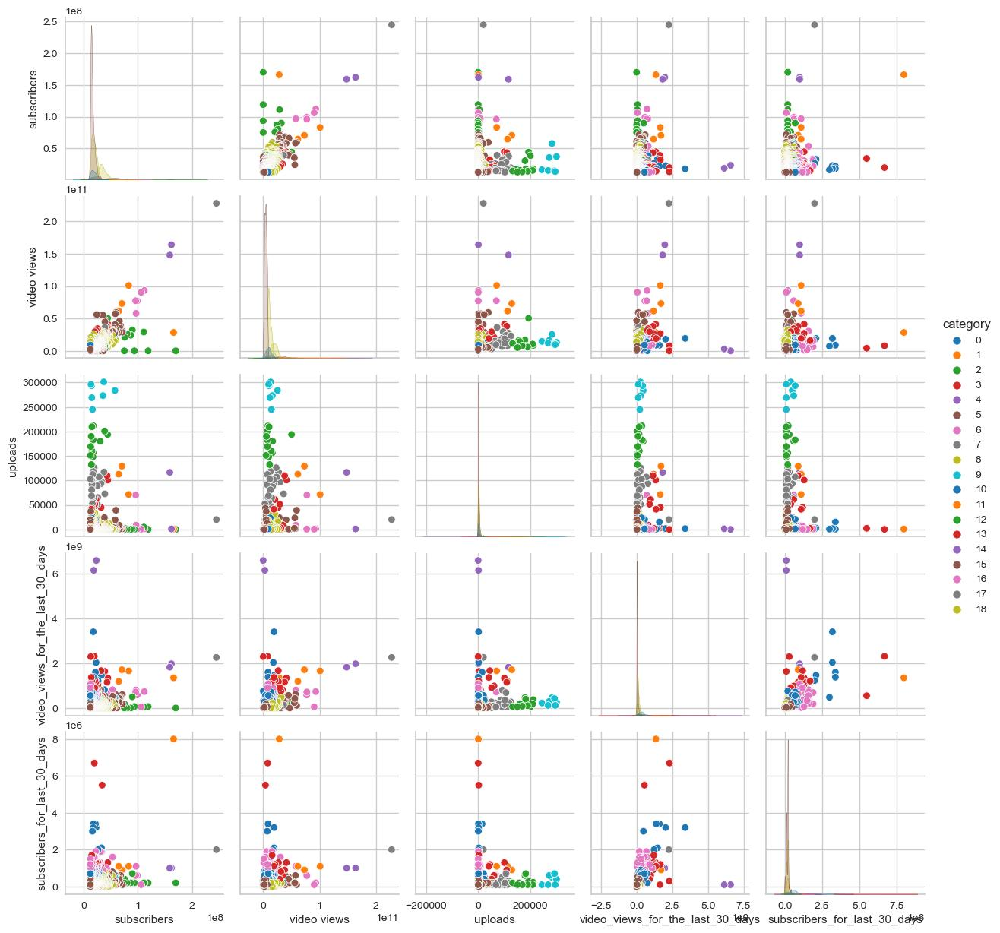

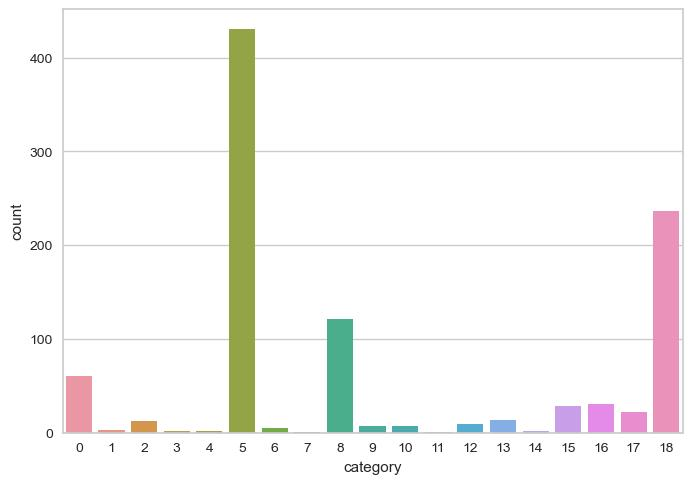

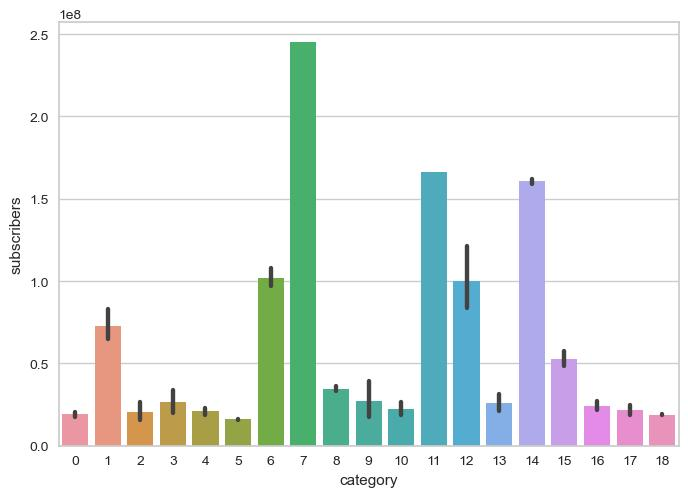

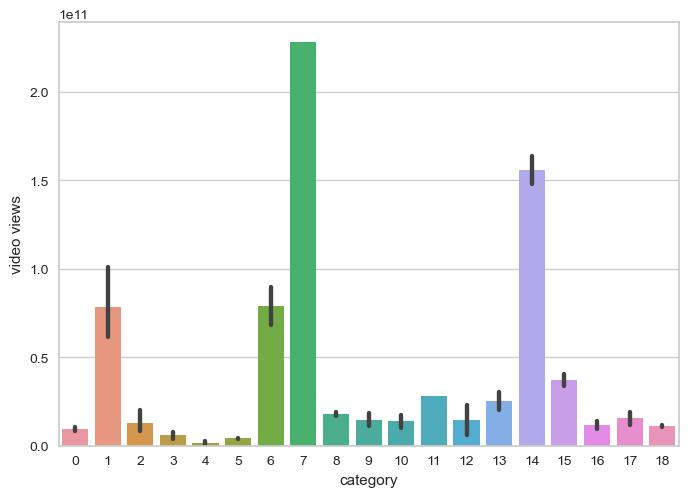

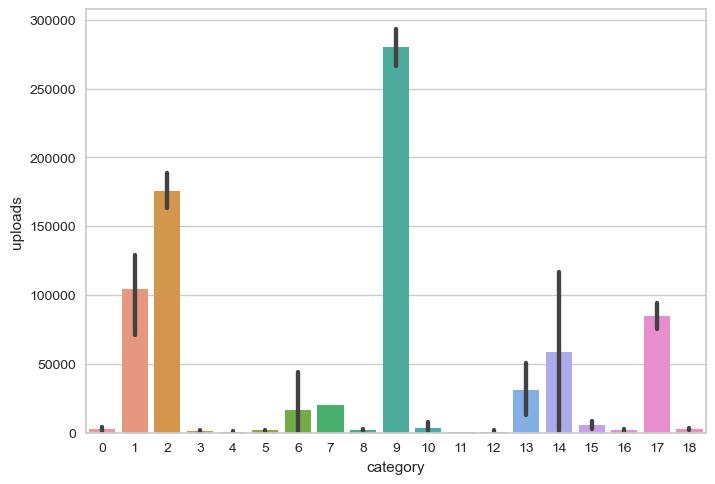

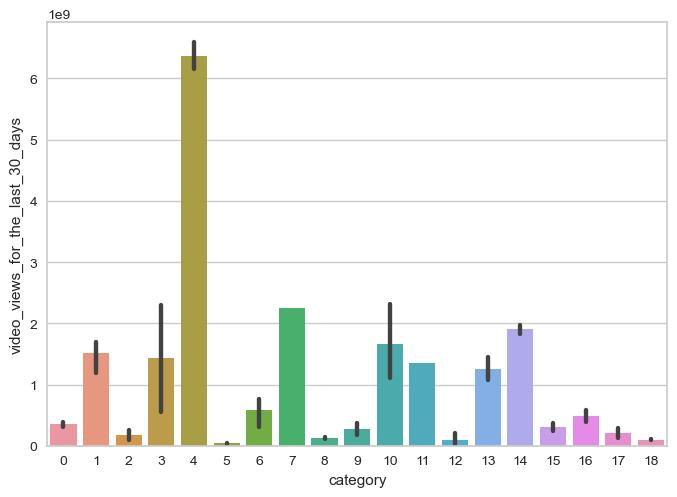

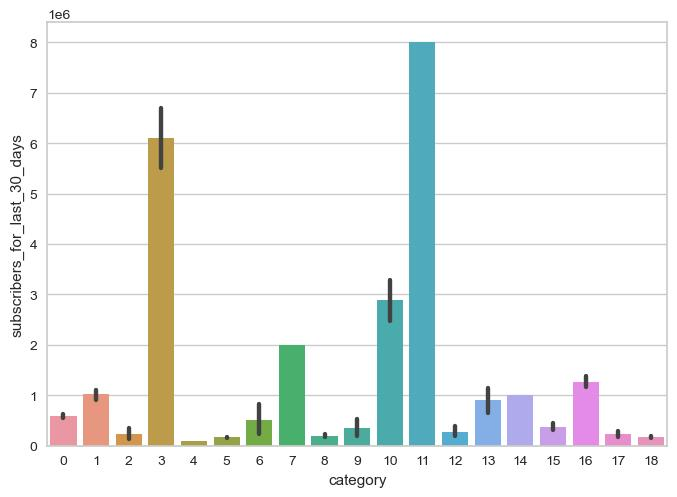


Amount of clusters: 20


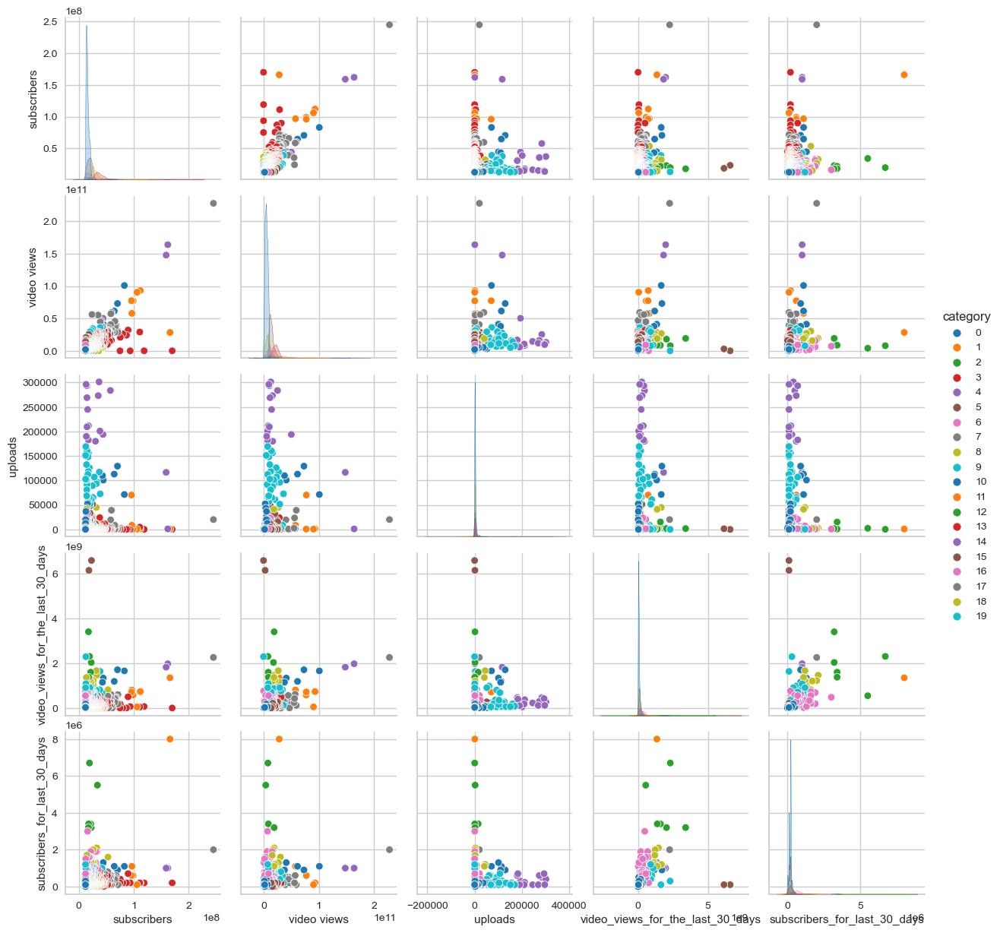

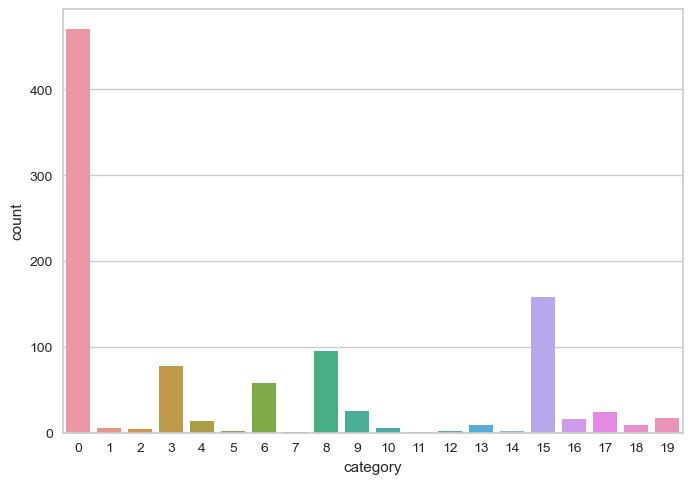

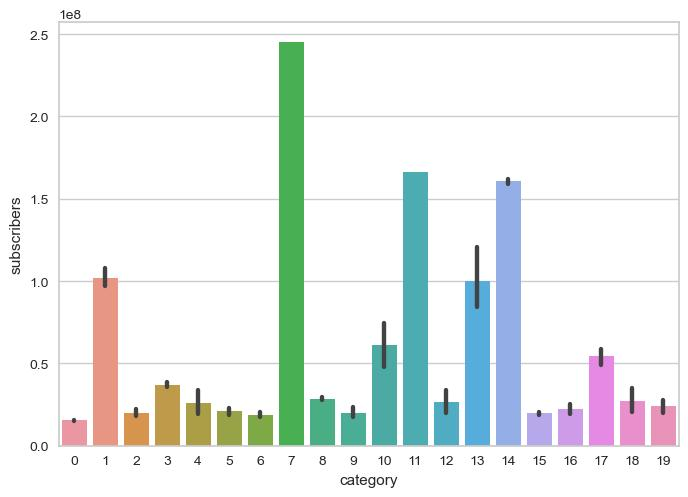

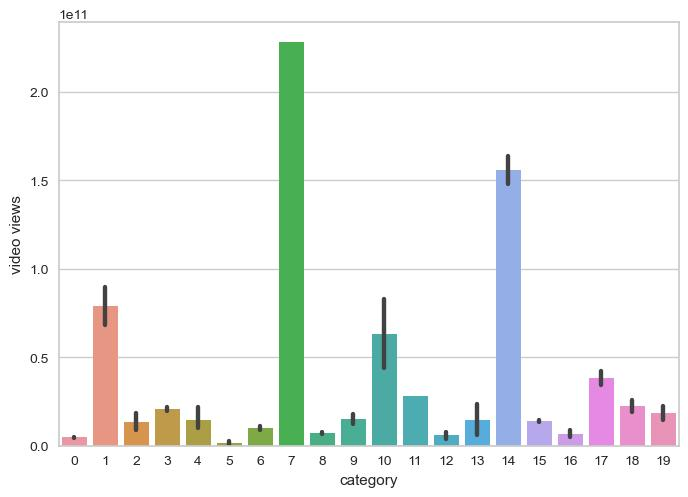

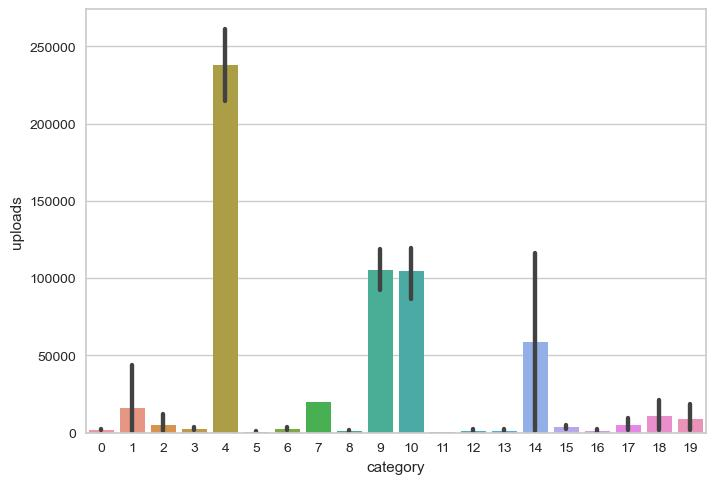

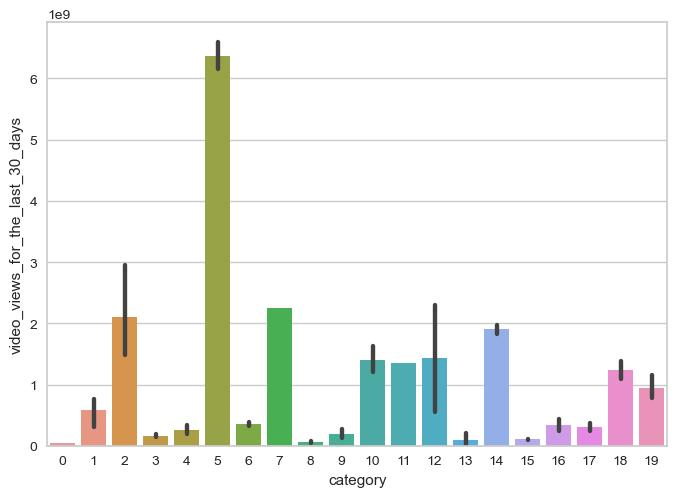

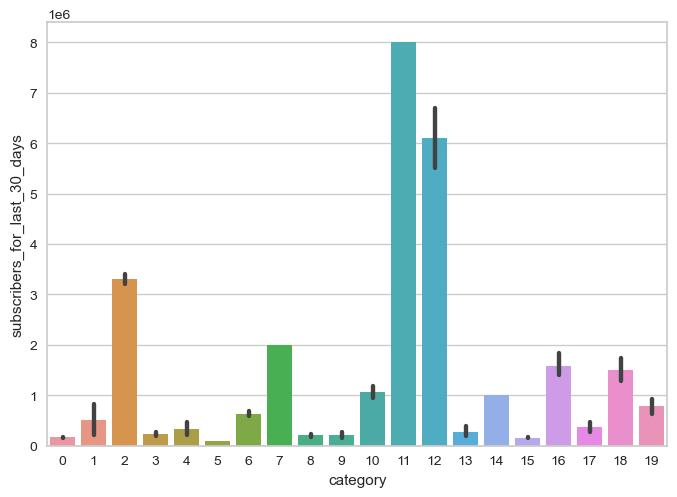

In [90]:
nums_of_clusters = [2, 4, 14, 17, 18, 19, 20]
for num_of_clusters in nums_of_clusters:
    print(f'Amount of clusters: {num_of_clusters}')
    kmeans = KMeans(n_clusters = num_of_clusters, random_state = 42)
    dataset_after_clustering = dataset_clustering.copy()
    categories = kmeans.fit_predict(dataset_clustering.values)
    dataset_after_clustering = pd.DataFrame(
        scaler.inverse_transform(dataset_after_clustering),
        columns = dataset_clustering.columns
    )
    dataset_after_clustering['category'] = categories
    describe_clustered_data(dataset_after_clustering)
    print('')

# DBSCAN clustering

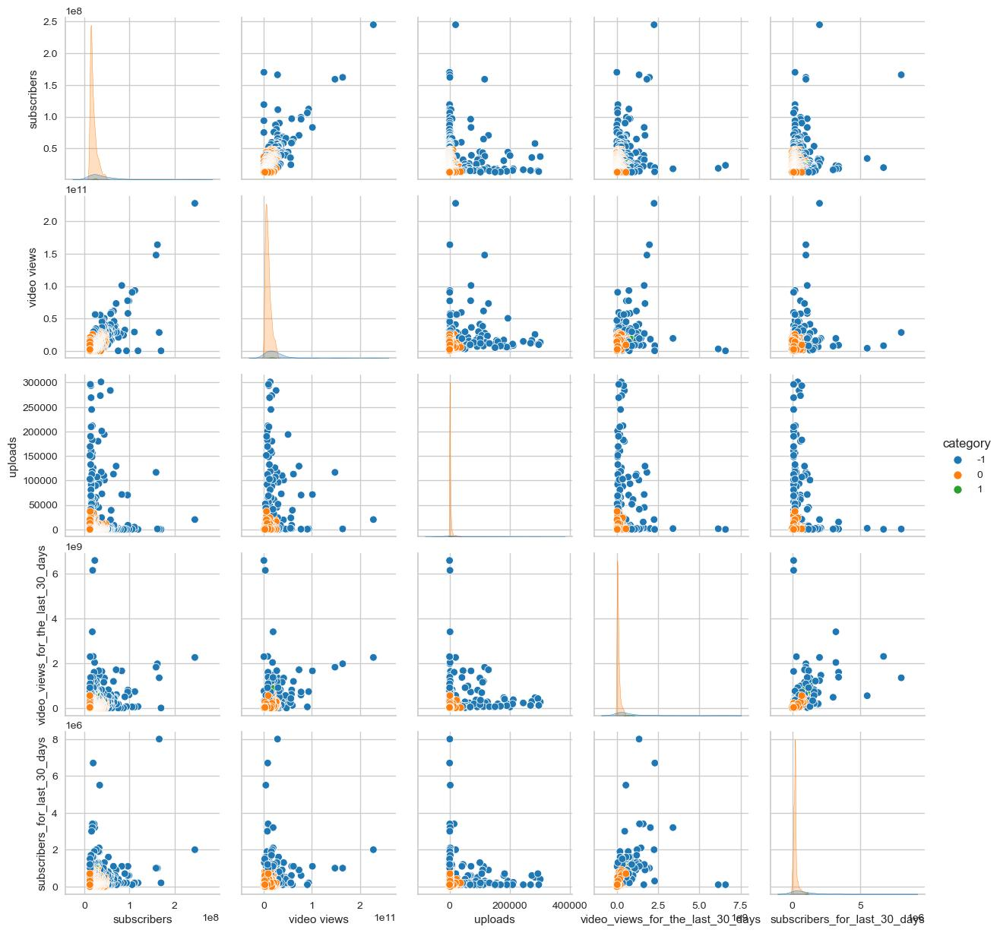

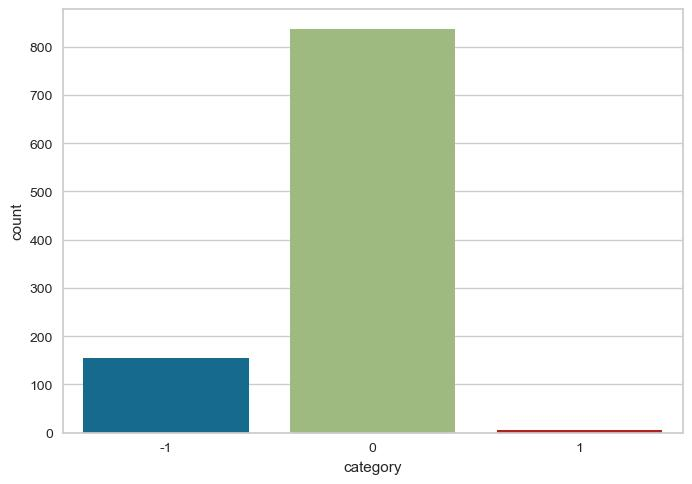

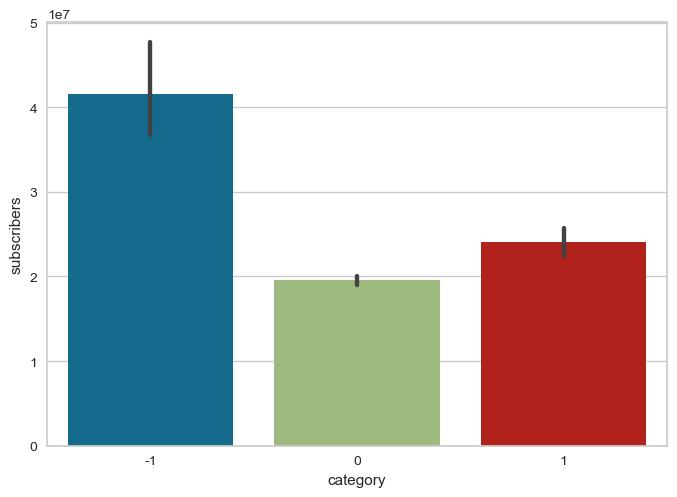

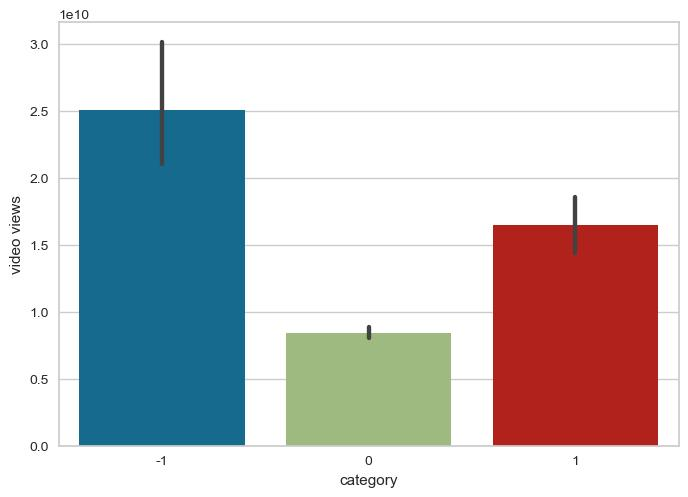

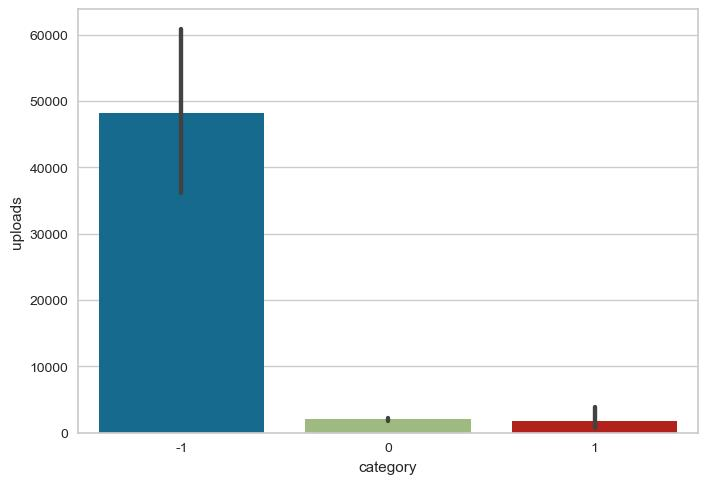

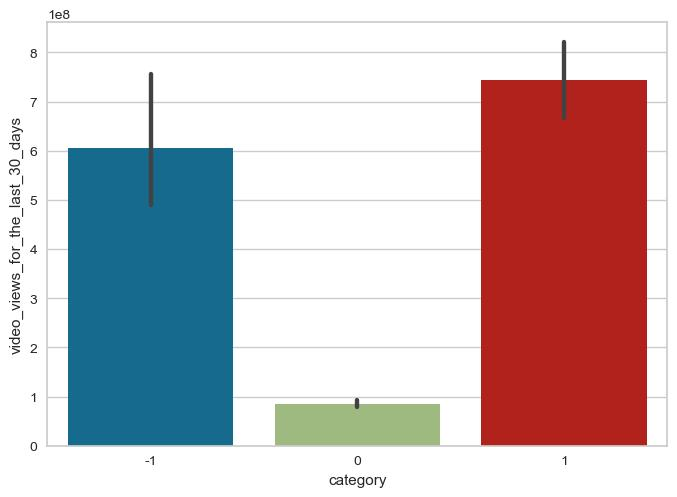

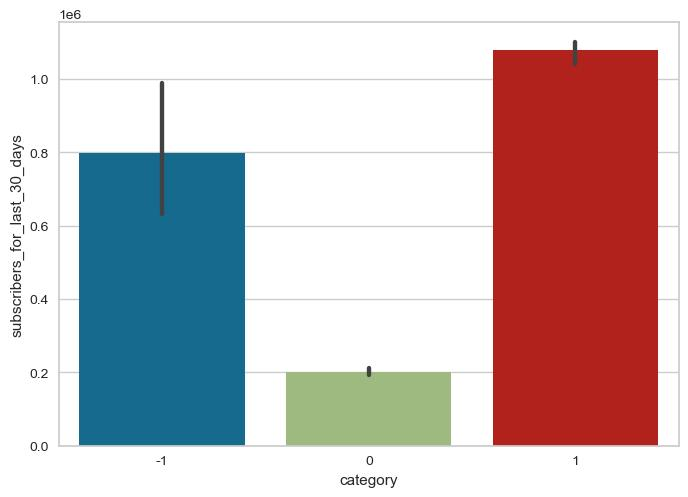

In [102]:
dbscan = DBSCAN()
dataset_after_clustering = dataset_clustering.copy()
categories = dbscan.fit_predict(dataset_clustering.values)
dataset_after_clustering = pd.DataFrame(
    scaler.inverse_transform(dataset_after_clustering),
    columns = dataset_clustering.columns
)
dataset_after_clustering['category'] = categories
describe_clustered_data(dataset_after_clustering)

## Best clustering metric scores for DBSCAN

In [123]:
def print_best_coefficients_dbscan(method_name, scores, find_max = True):
    sorted_scores = sorted(scores, key = lambda x: x[1], reverse = find_max)
    best_score = sorted_scores[0]
    print(f'{"Max." if find_max else "Min."} {method_name} score: {best_score[1]:.3f} (clusters: {best_score[2]}, eps.: {best_score[0]})')

sil_scores = []
calinski_scores = []
davies_scores = []
rand_scores = []
adjusted_rand_scores = []
mutual_info_scores = []
adjusted_mutual_info_scores = []
normalized_mutual_info_scores = []
homogeneity_scores = []
completeness_scores = []
v_measure_scores = []
fowlkes_mallows_scores = []
contingency_matrices = []
pair_confusion_matrices = []

eps_range = np.arange(0.1, 1.2, 0.05)
for eps in eps_range:
    dbscan = DBSCAN(eps = eps)
    predicted_labels = dbscan.fit_predict(X)
    num_of_clusters = np.unique(predicted_labels).shape[0]
    print(f'Eps.: {eps}, amount of clusters: {num_of_clusters}')
    
    sil_score = silhouette_score(X, predicted_labels)
    print(f'Silhouette coefficient: {sil_score:.3f}')
    sil_scores.append((eps, sil_score, num_of_clusters))
    
    calinski_score = calinski_harabasz_score(X, predicted_labels)
    print(f'Calinski-Harabasz score: {calinski_score:.3f}')
    calinski_scores.append((eps, calinski_score, num_of_clusters))
    
    davies_score = davies_bouldin_score(X, predicted_labels)
    print(f'Davies-Bouldin score: {davies_score:.3f}')
    davies_scores.append((eps, davies_score, num_of_clusters))
    
    rand_score_result = rand_score(true_labels, predicted_labels)
    print(f'Rand score: {rand_score_result:.3f}')
    rand_scores.append((eps, rand_score_result, num_of_clusters))
    
    adjusted_rand_score_result = adjusted_rand_score(true_labels, predicted_labels)
    print(f'Adjusted Rand score: {adjusted_rand_score_result:.3f}')
    adjusted_rand_scores.append((eps, adjusted_rand_score_result, num_of_clusters))
    
    mutual_info_score_result = mutual_info_score(true_labels, predicted_labels)
    print(f'Mutual info score: {mutual_info_score_result:.3f}')
    mutual_info_scores.append((eps, mutual_info_score_result, num_of_clusters))
    
    adjusted_mutual_info_score_result = adjusted_mutual_info_score(true_labels, predicted_labels)
    print(f'Adjusted mutual info score: {adjusted_mutual_info_score_result:.3f}')
    adjusted_mutual_info_scores.append((eps, adjusted_mutual_info_score_result, num_of_clusters))
    
    normalized_mutual_info_score_result = normalized_mutual_info_score(true_labels, predicted_labels)
    print(f'Normalized mutual info score: {normalized_mutual_info_score_result:.3f}')
    normalized_mutual_info_scores.append((eps, normalized_mutual_info_score_result, num_of_clusters))
    
    homogeneity_score, completeness_score, v_measure_score = homogeneity_completeness_v_measure(true_labels, predicted_labels)
    print(f'Homogeneity score: {homogeneity_score:.3f}')
    print(f'Completeness score: {completeness_score:.3f}')
    print(f'V-measure score: {v_measure_score:.3f}')
    homogeneity_scores.append((eps, homogeneity_score, num_of_clusters))
    completeness_scores.append((eps, completeness_score, num_of_clusters))
    v_measure_scores.append((eps, v_measure_score, num_of_clusters))
    
    fowlkes_mallows_score_result = fowlkes_mallows_score(true_labels, predicted_labels)
    print(f'Fowlkes-Mallows score: {fowlkes_mallows_score_result:.3f}')
    fowlkes_mallows_scores.append((eps, fowlkes_mallows_score_result, num_of_clusters))
    
    contingency_matrix_result = contingency_matrix(true_labels, predicted_labels)
    contingency_matrices.append((eps, contingency_matrix_result, num_of_clusters))
    
    pair_confusion_matrix_result = pair_confusion_matrix(true_labels, predicted_labels)
    pair_confusion_matrices.append((eps, pair_confusion_matrix_result, num_of_clusters))
    print()

print_best_coefficients_dbscan('Silhouette', sil_scores)
print()
print_best_coefficients_dbscan('Calinski-Harabasz', calinski_scores)
print()
print_best_coefficients_dbscan('Davies-Bouldin', davies_scores, False)
print()
print_best_coefficients_dbscan('Rand', rand_scores)
print()
print_best_coefficients_dbscan('Adjusted Rand', adjusted_rand_scores)
print()
print_best_coefficients_dbscan('Mutual info', mutual_info_scores)
print()
print_best_coefficients_dbscan('Adjusted mutual info', adjusted_mutual_info_scores)
print()
print_best_coefficients_dbscan('Normalized mutual info', normalized_mutual_info_scores)
print()
print_best_coefficients_dbscan('Homogeneity', homogeneity_scores)
print()
print_best_coefficients_dbscan('Completeness', completeness_scores)
print()
print_best_coefficients_dbscan('V-measure', v_measure_scores)
print()
print_best_coefficients_dbscan('Fowlkes-Mallows', fowlkes_mallows_scores)
print()

Eps.: 0.1, amount of clusters: 10
Silhouette coefficient: -0.324
Calinski-Harabasz score: 8.173
Davies-Bouldin score: 1.703
Rand score: 0.510
Adjusted Rand score: 0.001
Mutual info score: 0.044
Adjusted mutual info score: 0.009
Normalized mutual info score: 0.032
Homogeneity score: 0.026
Completeness score: 0.043
V-measure score: 0.032
Fowlkes-Mallows score: 0.332

Eps.: 0.15000000000000002, amount of clusters: 9
Silhouette coefficient: -0.262
Calinski-Harabasz score: 14.365
Davies-Bouldin score: 1.963
Rand score: 0.578
Adjusted Rand score: 0.014
Mutual info score: 0.056
Adjusted mutual info score: 0.018
Normalized mutual info score: 0.038
Homogeneity score: 0.032
Completeness score: 0.046
V-measure score: 0.038
Fowlkes-Mallows score: 0.299

Eps.: 0.20000000000000004, amount of clusters: 7
Silhouette coefficient: -0.231
Calinski-Harabasz score: 23.754
Davies-Bouldin score: 1.764
Rand score: 0.520
Adjusted Rand score: 0.005
Mutual info score: 0.043
Adjusted mutual info score: 0.017
Norm

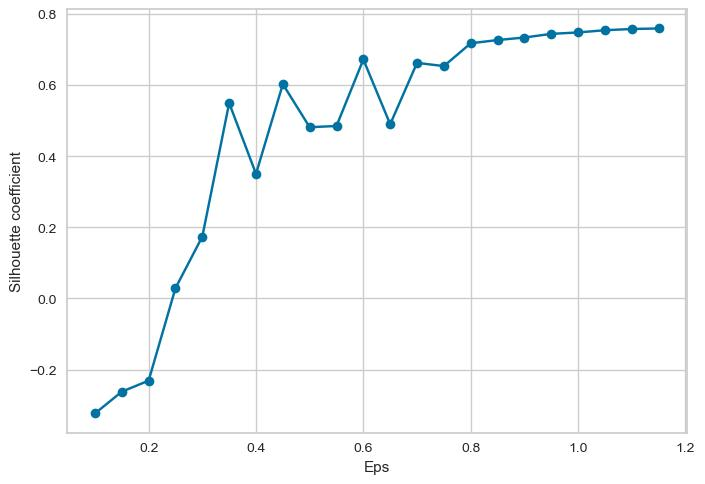

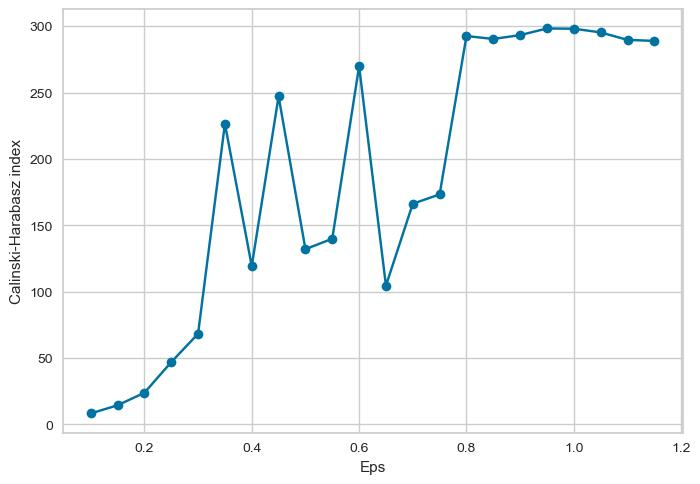

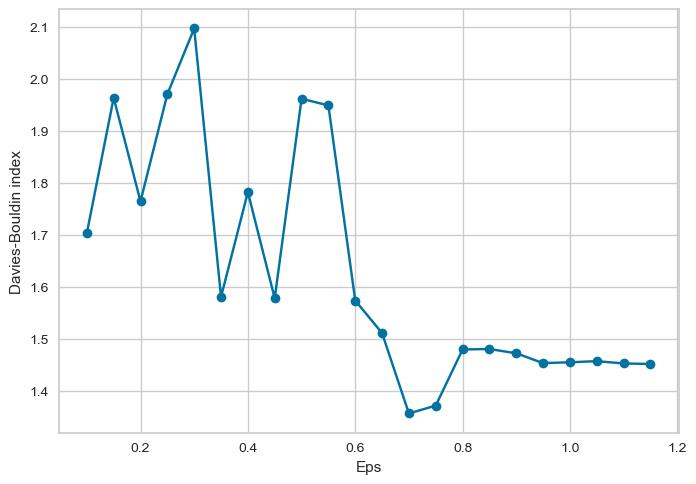

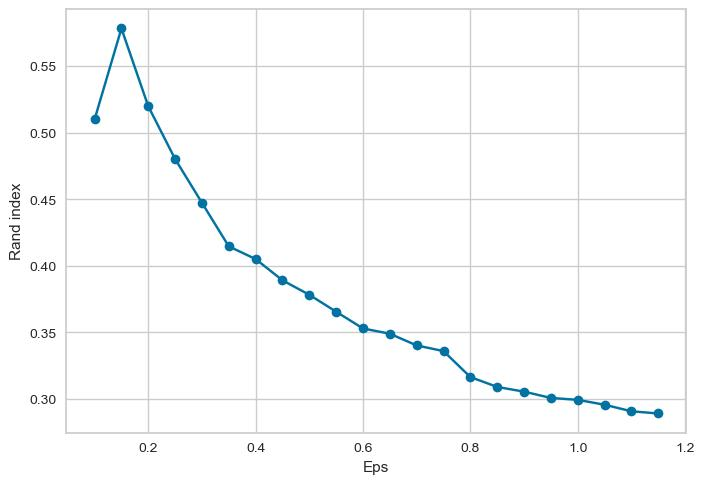

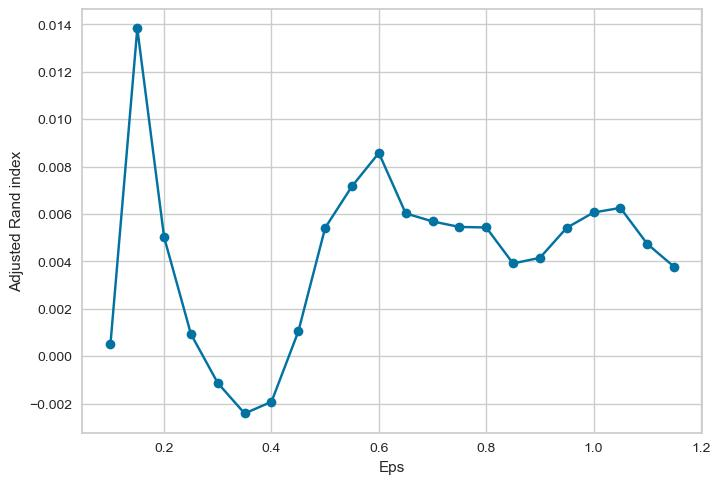

...

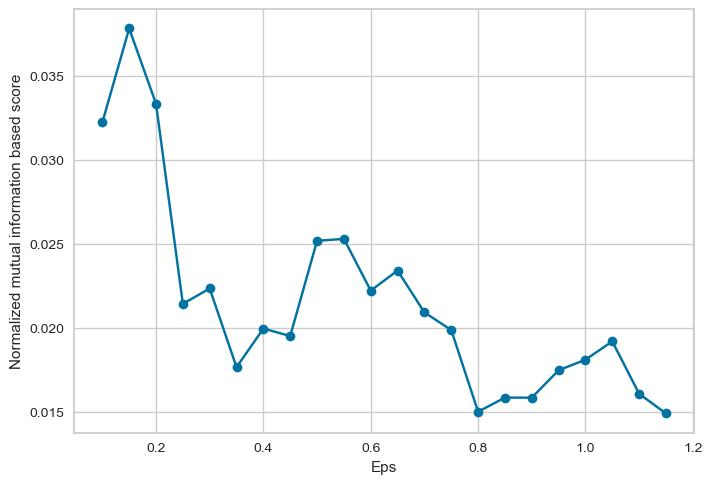

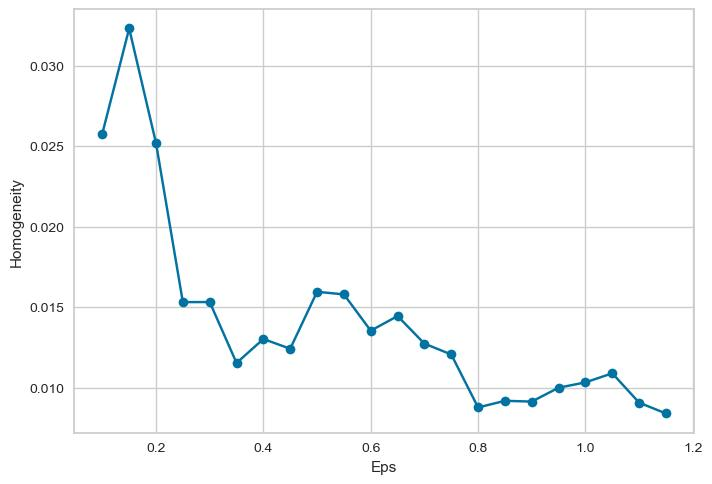

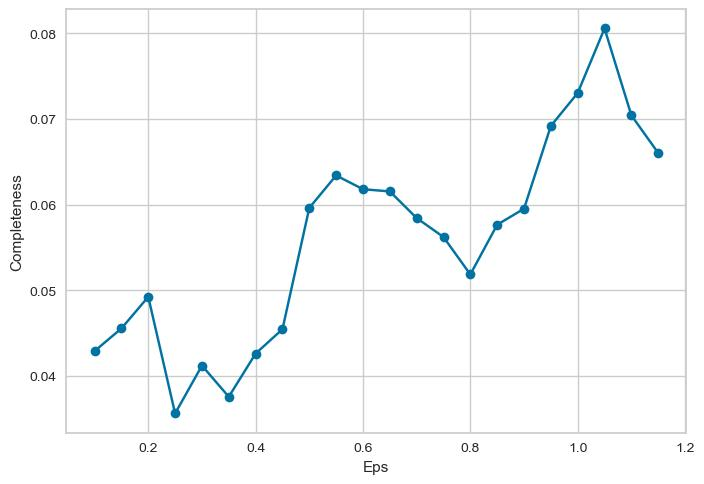

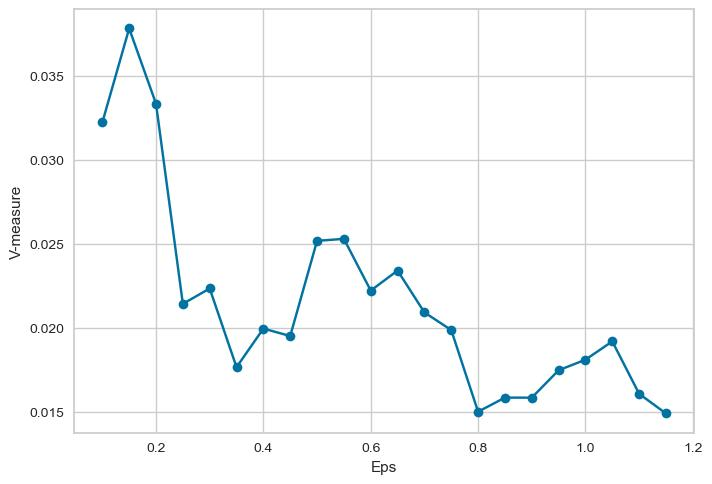

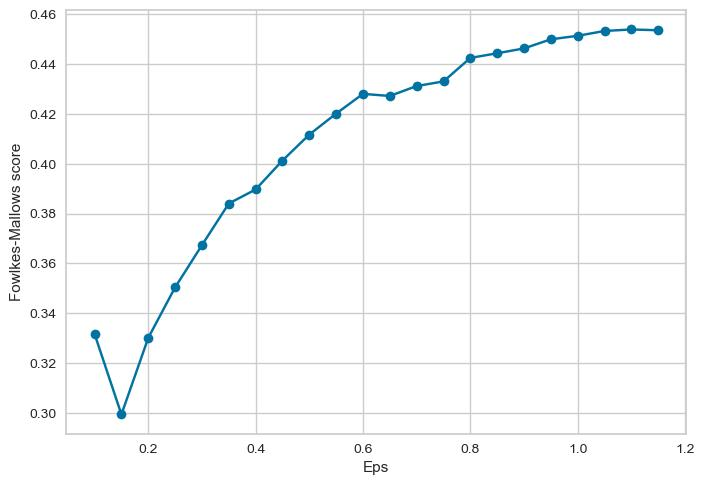

In [124]:
def plot_scores_from_values_dbscan(indexes, score_tuples, ylabel):
    _, scores, _ = zip(*score_tuples)
    plt.plot(indexes, scores, marker = 'o')
    plt.xlabel('Eps')
    plt.ylabel(ylabel)
    plt.show()

plot_scores_from_values_dbscan(eps_range, sil_scores, 'Silhouette coefficient')
plot_scores_from_values_dbscan(eps_range, calinski_scores, 'Calinski-Harabasz index')
plot_scores_from_values_dbscan(eps_range, davies_scores, 'Davies-Bouldin index')
plot_scores_from_values_dbscan(eps_range, rand_scores, 'Rand index')
plot_scores_from_values_dbscan(eps_range, adjusted_rand_scores, 'Adjusted Rand index')
plot_scores_from_values_dbscan(eps_range, mutual_info_scores, 'Mutual information based score')
plot_scores_from_values_dbscan(eps_range, adjusted_mutual_info_scores, 'Adjusted mutual information based score')
plot_scores_from_values_dbscan(eps_range, normalized_mutual_info_scores, 'Normalized mutual information based score')
plot_scores_from_values_dbscan(eps_range, homogeneity_scores, 'Homogeneity')
plot_scores_from_values_dbscan(eps_range, completeness_scores, 'Completeness')
plot_scores_from_values_dbscan(eps_range, v_measure_scores, 'V-measure')
plot_scores_from_values_dbscan(eps_range, fowlkes_mallows_scores, 'Fowlkes-Mallows score')

Clusters: 10, eps.: 0.1


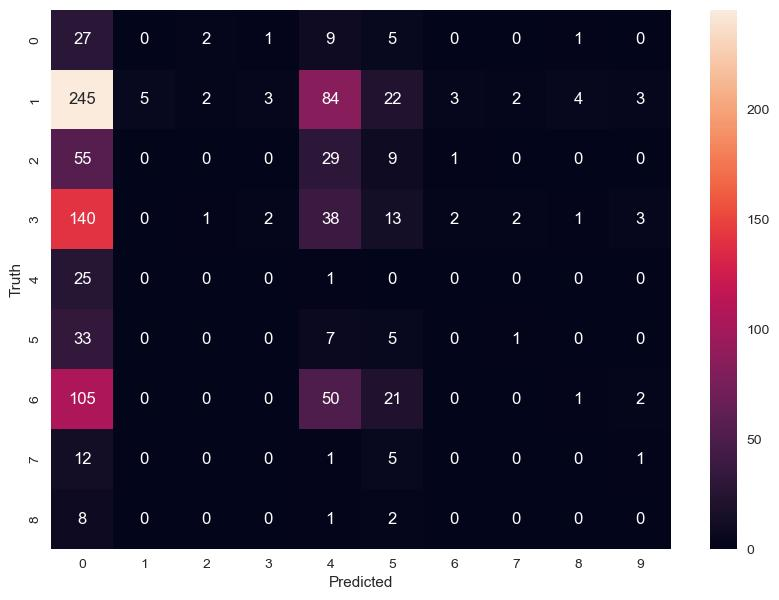

Clusters: 9, eps.: 0.15000000000000002


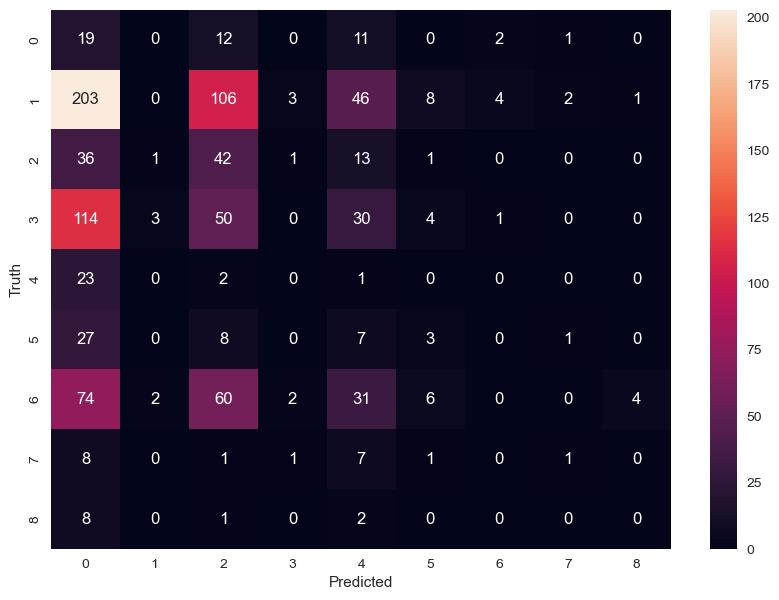

Clusters: 7, eps.: 0.20000000000000004


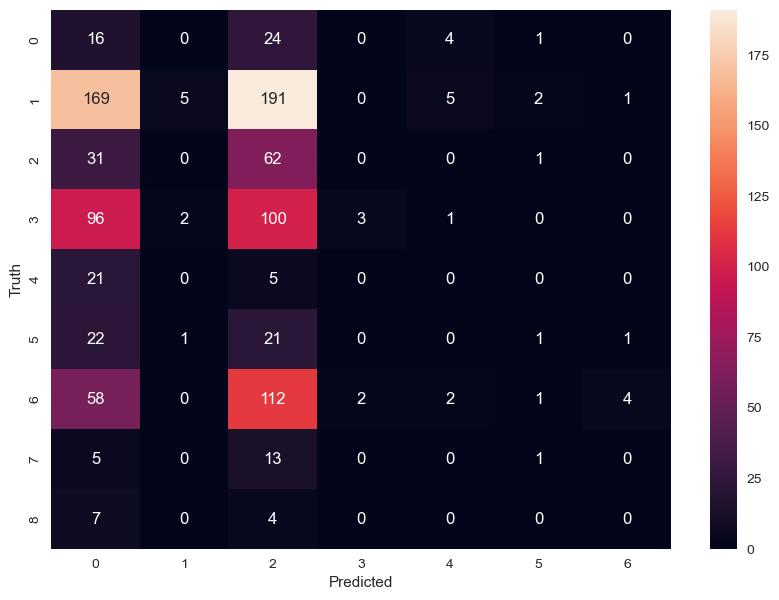

Clusters: 5, eps.: 0.25000000000000006


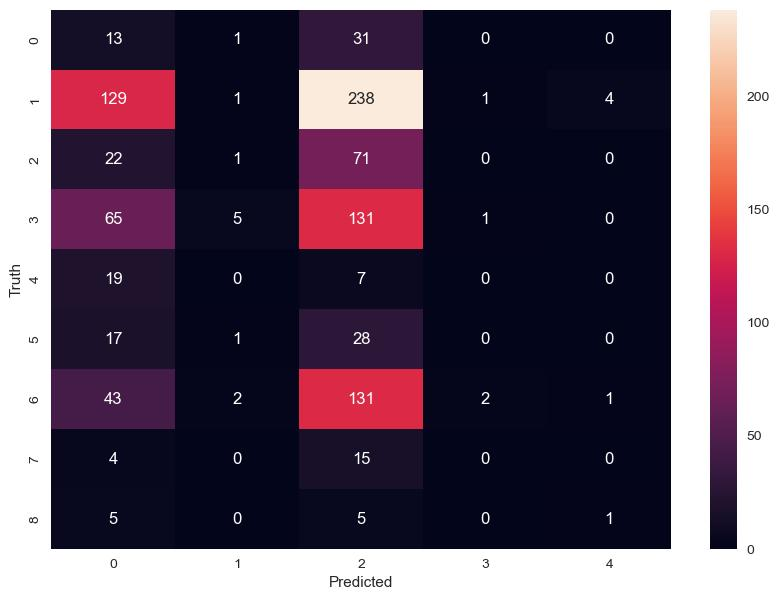

Clusters: 4, eps.: 0.30000000000000004


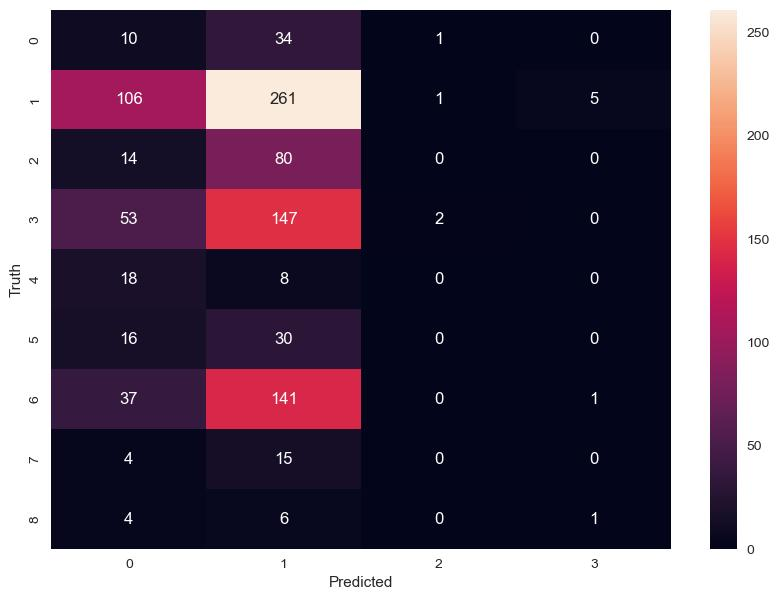

Clusters: 2, eps.: 0.3500000000000001


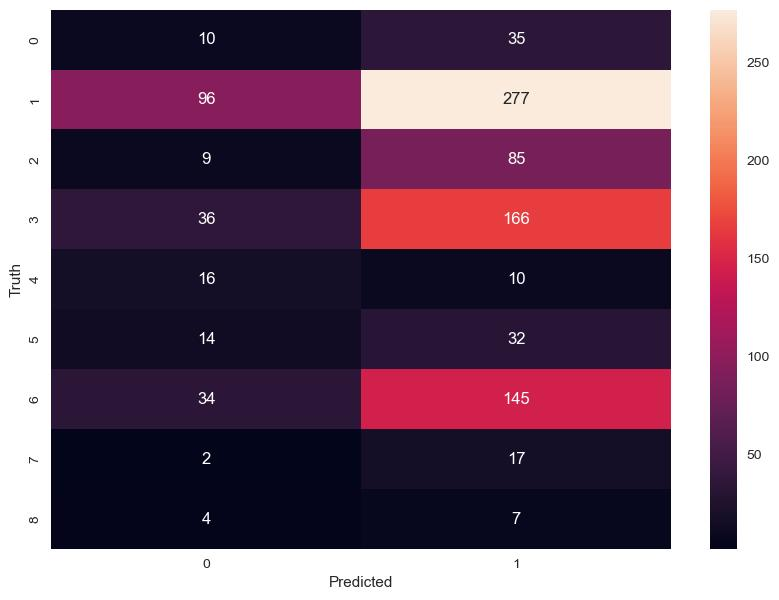

Clusters: 3, eps.: 0.40000000000000013


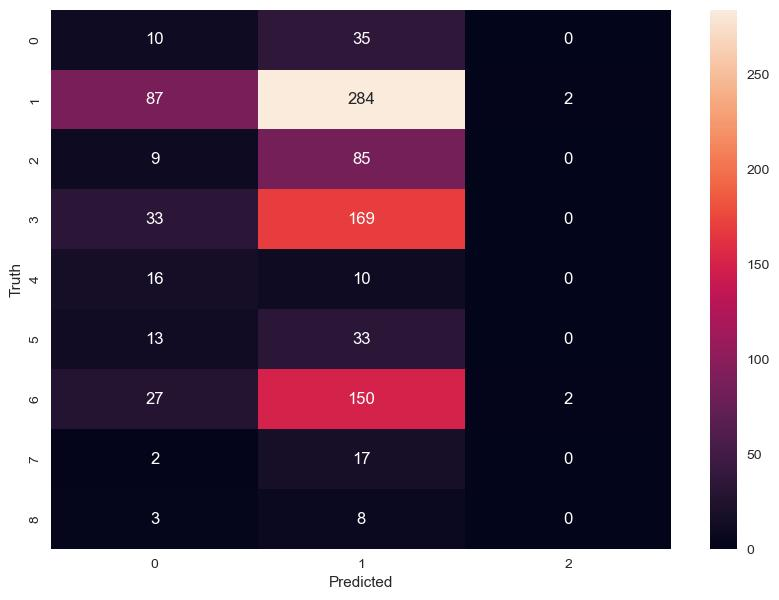

Clusters: 2, eps.: 0.45000000000000007


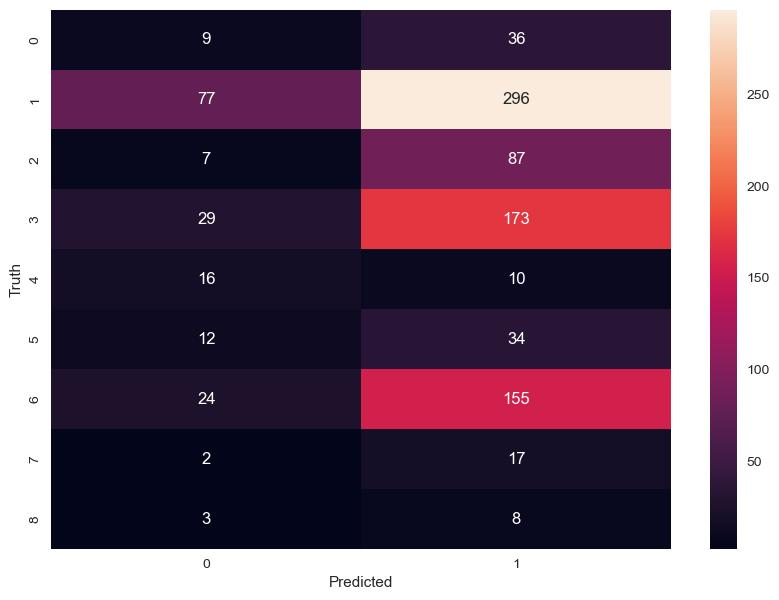

Clusters: 3, eps.: 0.5000000000000001


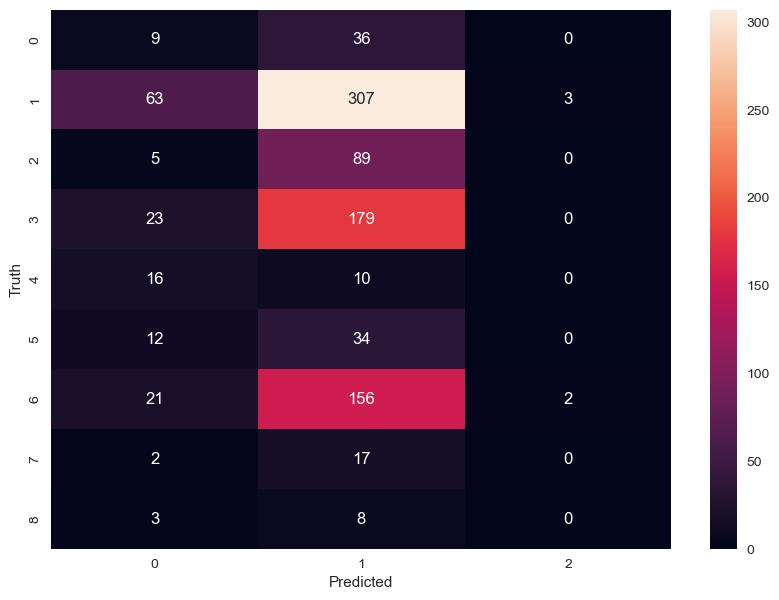

Clusters: 3, eps.: 0.5500000000000002


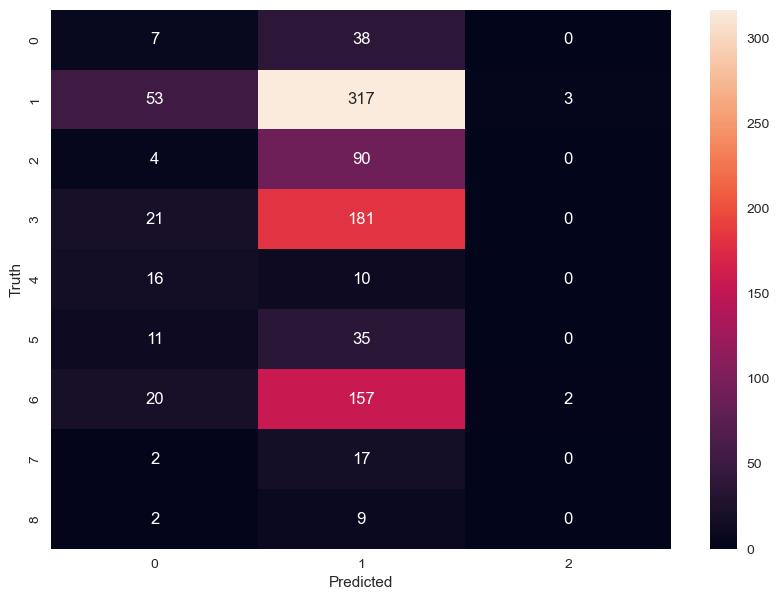

Clusters: 2, eps.: 0.6000000000000002


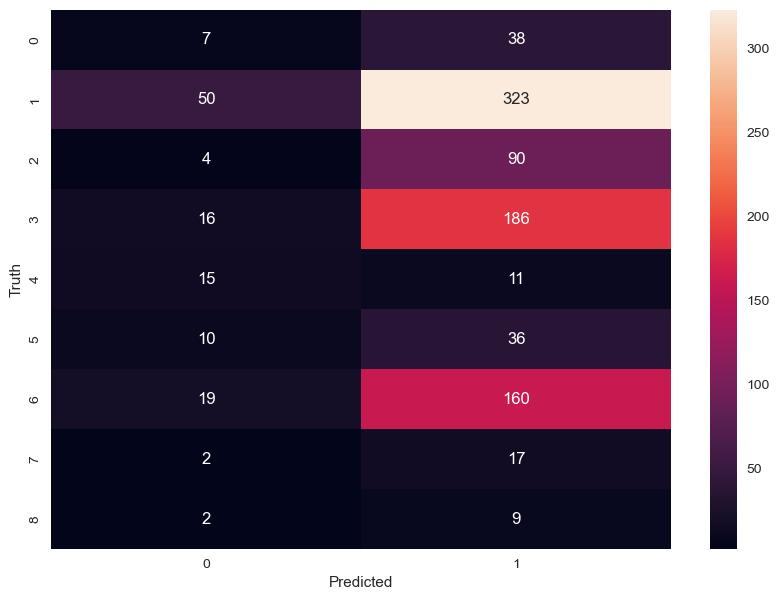

Clusters: 4, eps.: 0.6500000000000001


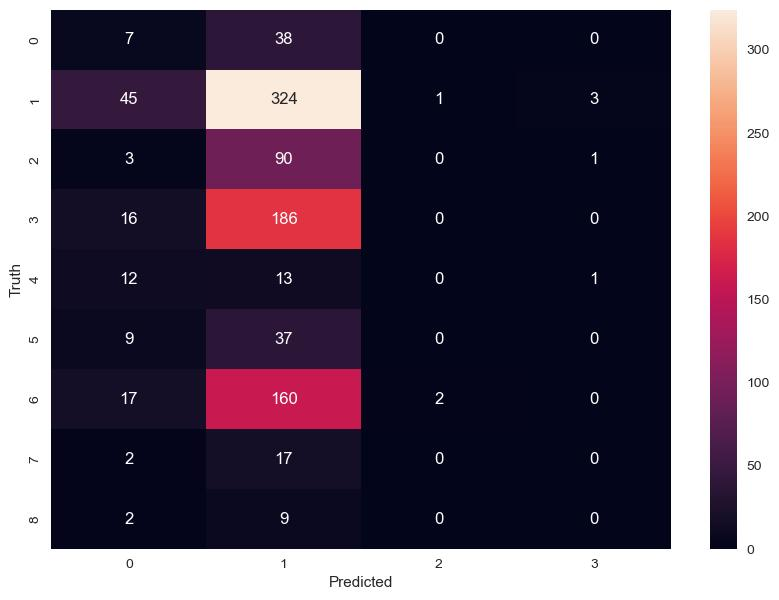

Clusters: 3, eps.: 0.7000000000000002


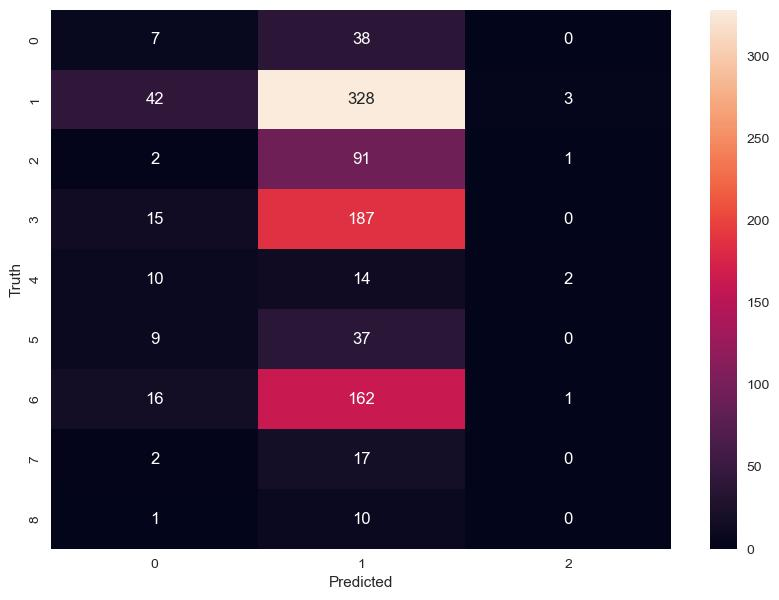

Clusters: 3, eps.: 0.7500000000000002


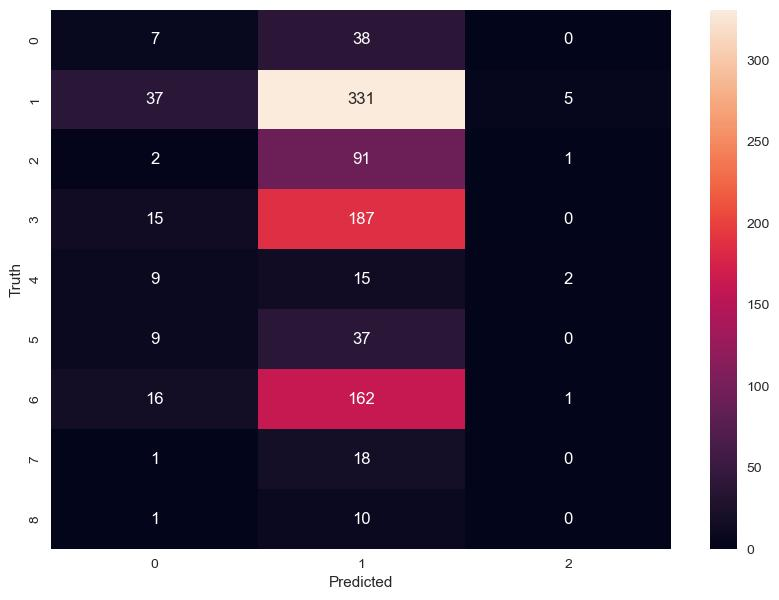

Clusters: 2, eps.: 0.8000000000000002


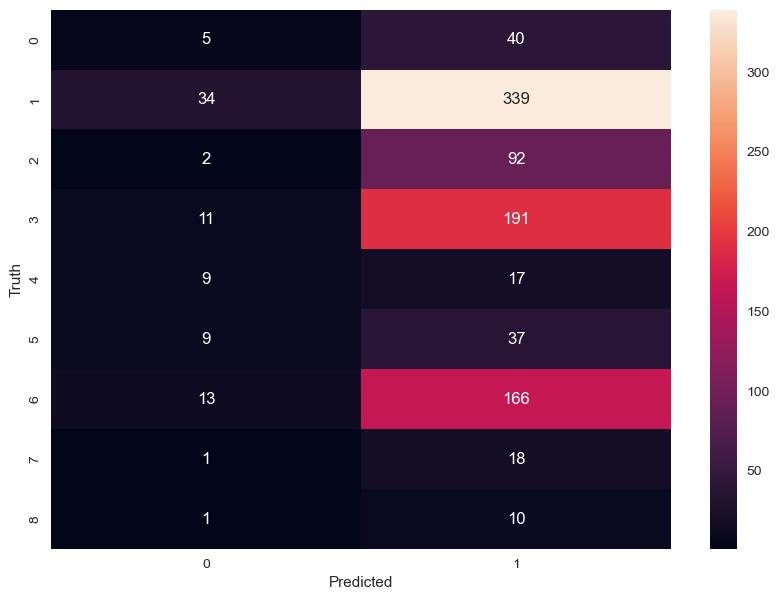

Clusters: 2, eps.: 0.8500000000000002


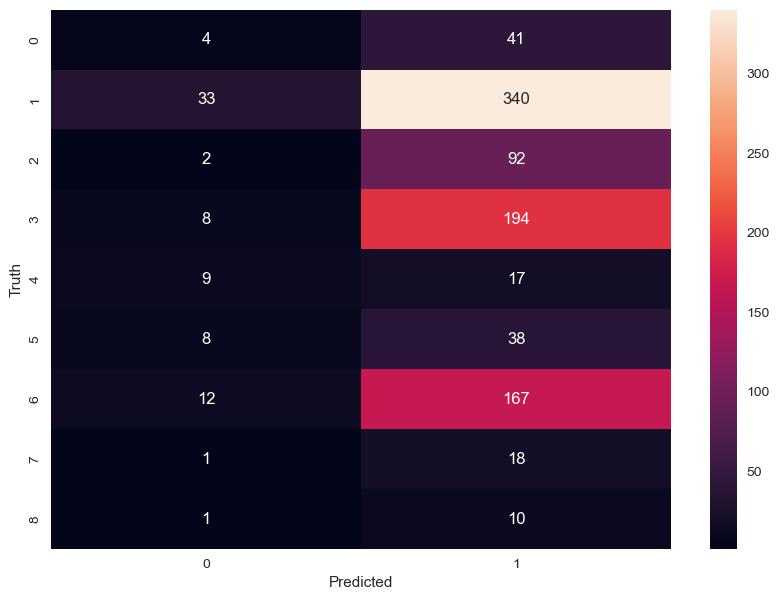

Clusters: 2, eps.: 0.9000000000000002


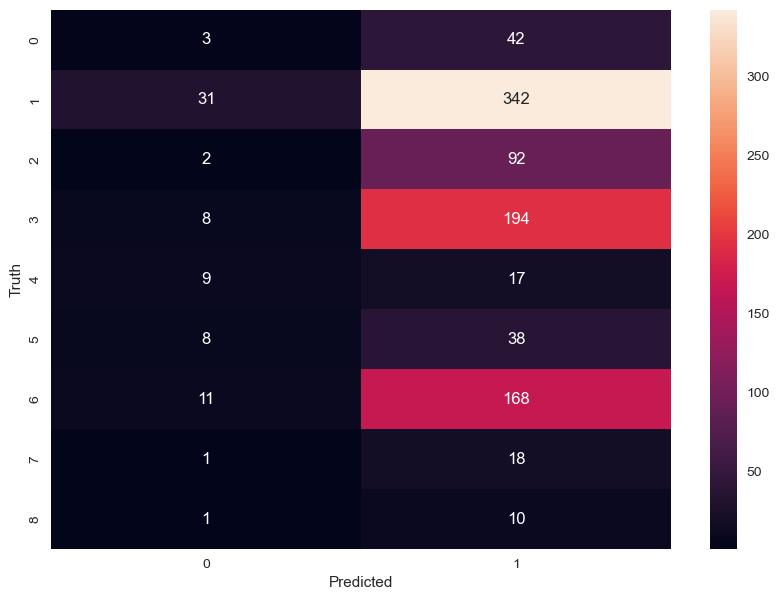

Clusters: 2, eps.: 0.9500000000000003


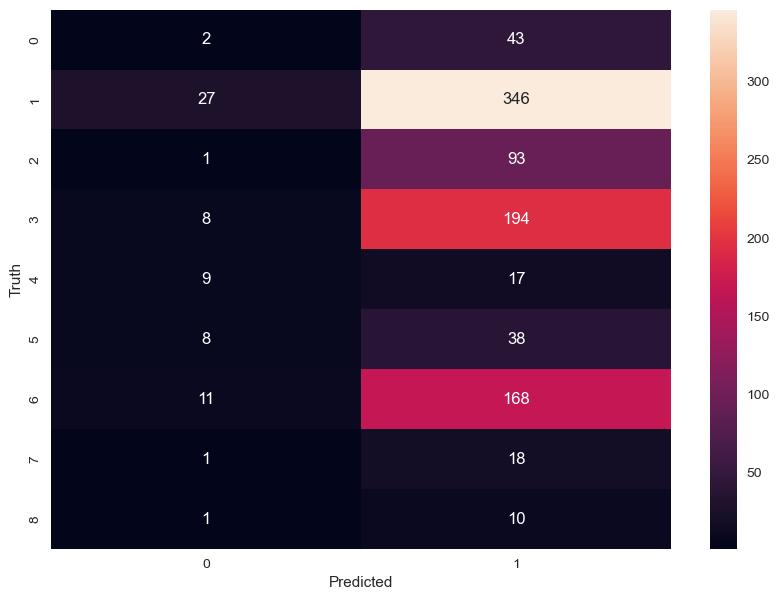

Clusters: 2, eps.: 1.0000000000000004


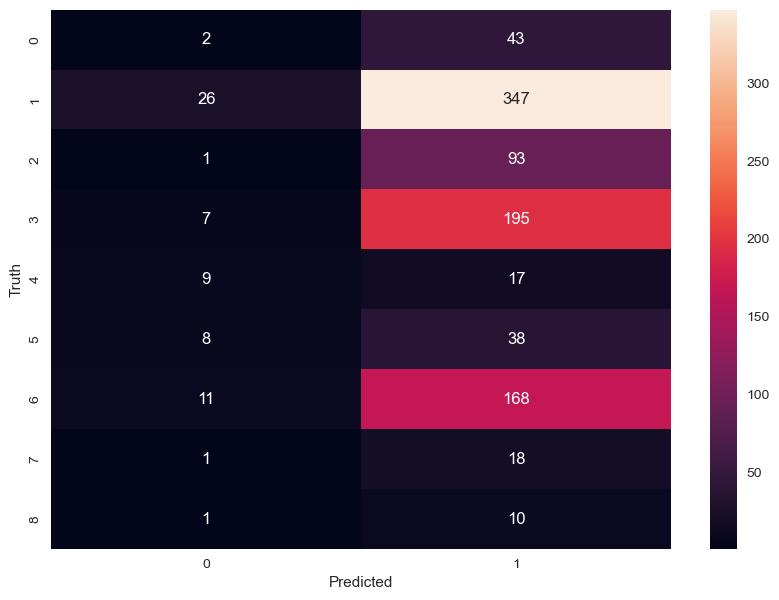

Clusters: 2, eps.: 1.0500000000000003


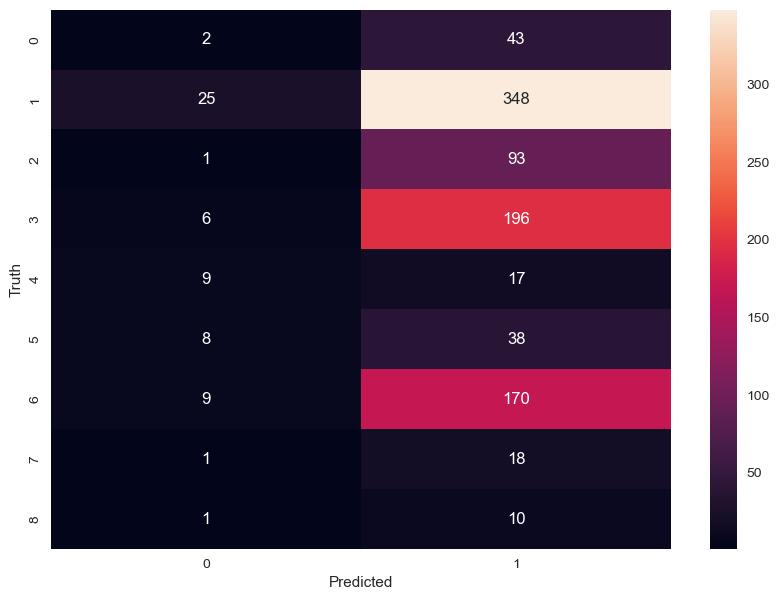

Clusters: 2, eps.: 1.1000000000000005


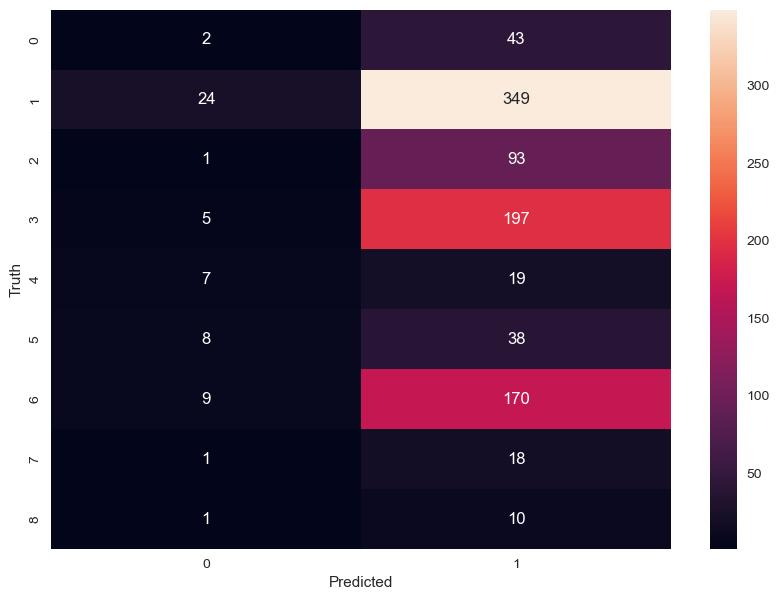

Clusters: 2, eps.: 1.1500000000000004


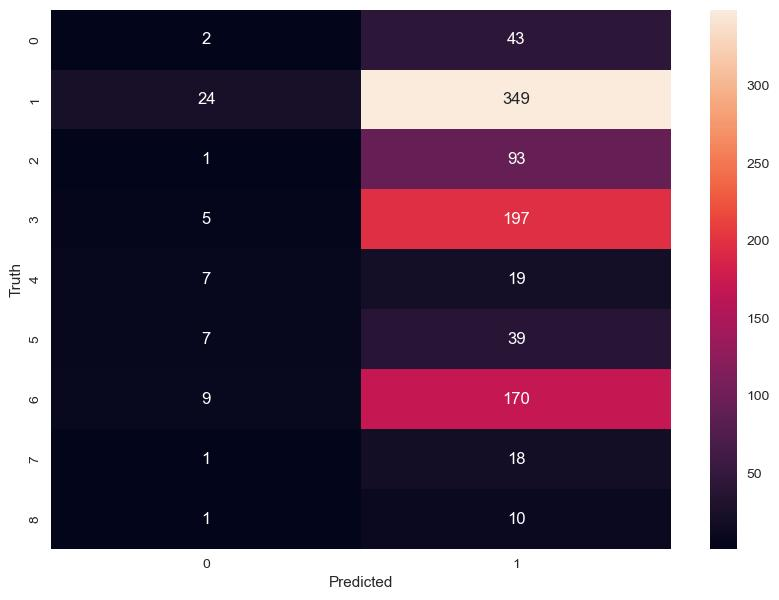

In [125]:
for contingency_matrix_result in contingency_matrices:
    print(f'Clusters: {contingency_matrix_result[2]}, eps.: {contingency_matrix_result[0]}')
    show_contingency_matrix(contingency_matrix_result[1])

Clusters: 10, eps.: 0.1


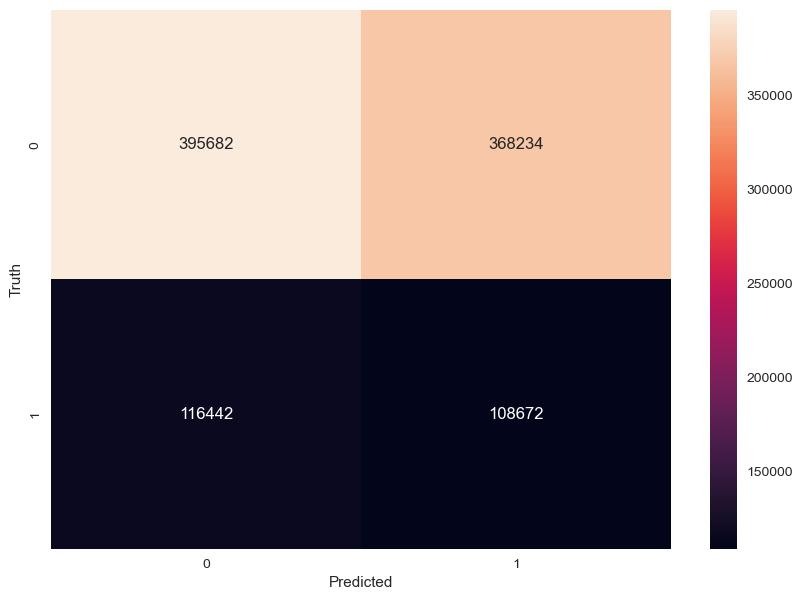

Clusters: 9, eps.: 0.15000000000000002


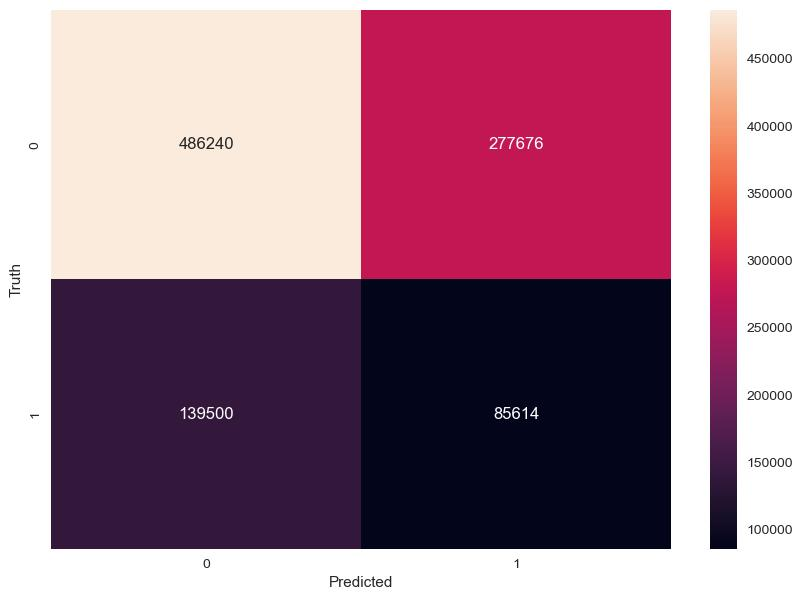

Clusters: 7, eps.: 0.20000000000000004


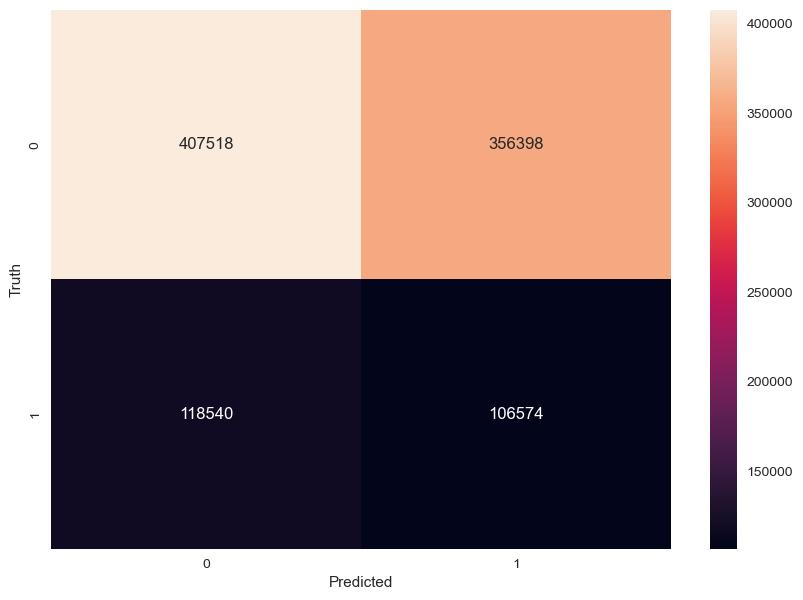

Clusters: 5, eps.: 0.25000000000000006


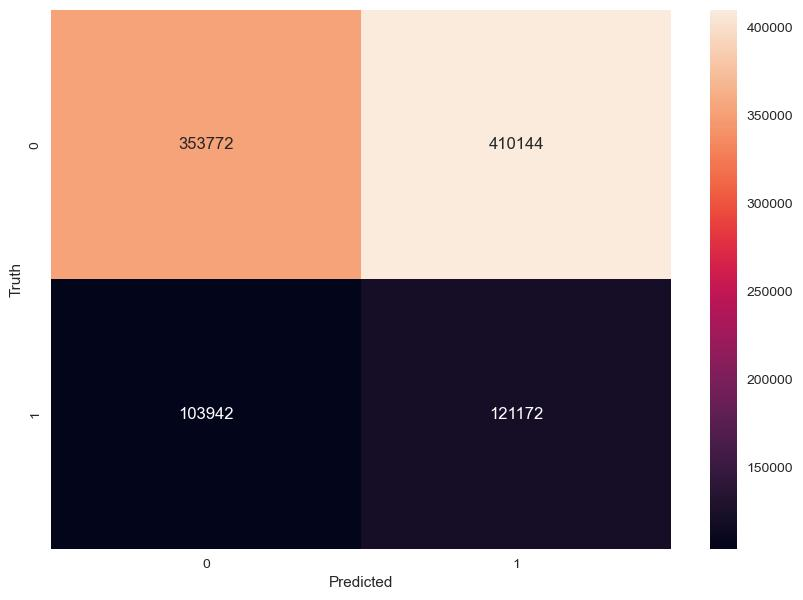

Clusters: 4, eps.: 0.30000000000000004


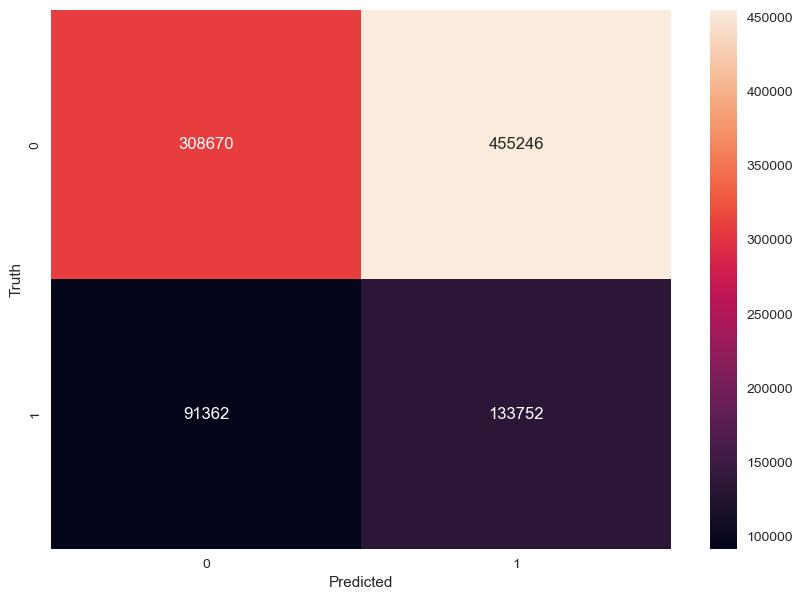

Clusters: 2, eps.: 0.3500000000000001


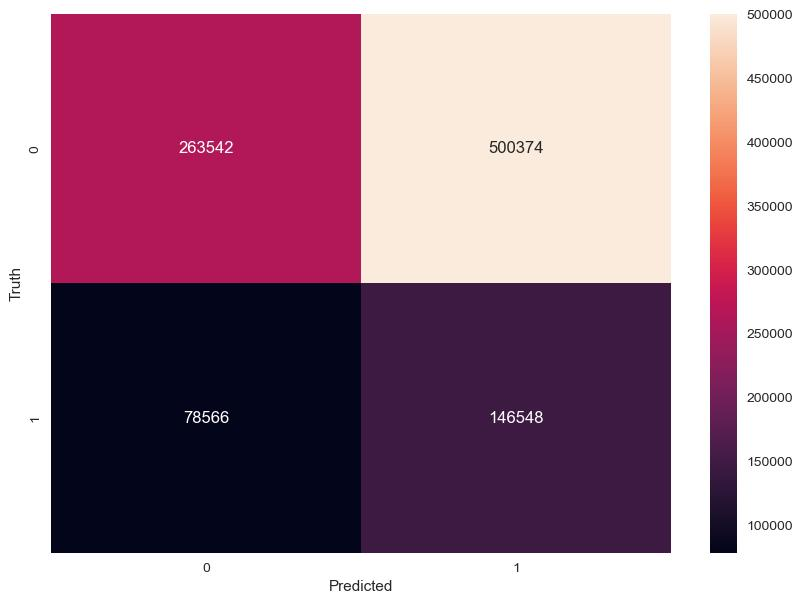

Clusters: 3, eps.: 0.40000000000000013


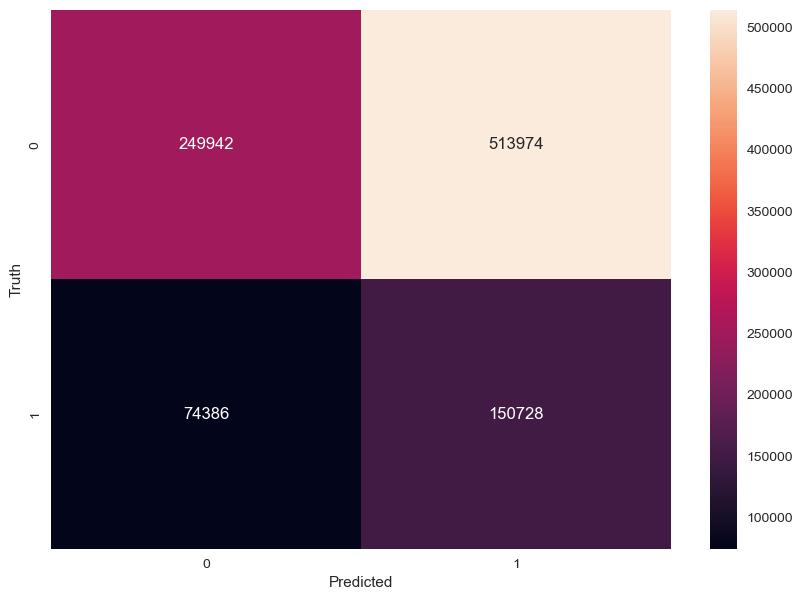

Clusters: 2, eps.: 0.45000000000000007


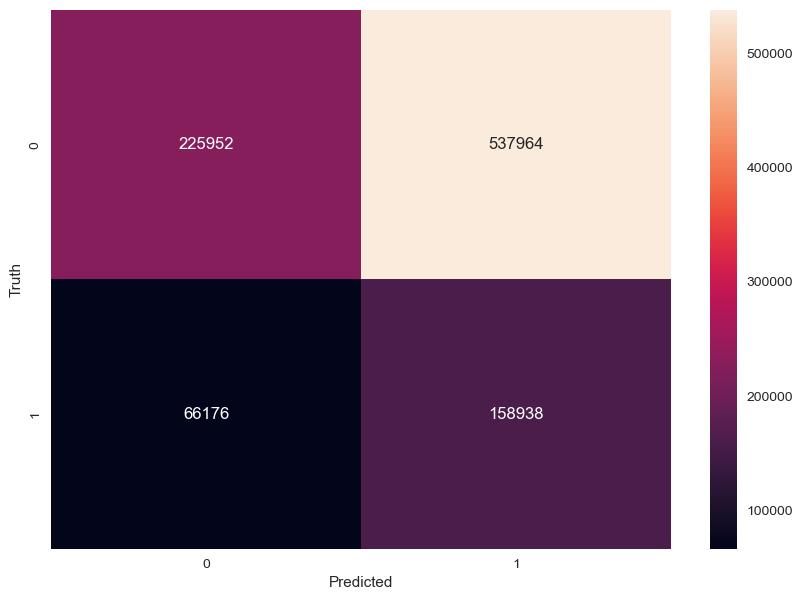

Clusters: 3, eps.: 0.5000000000000001


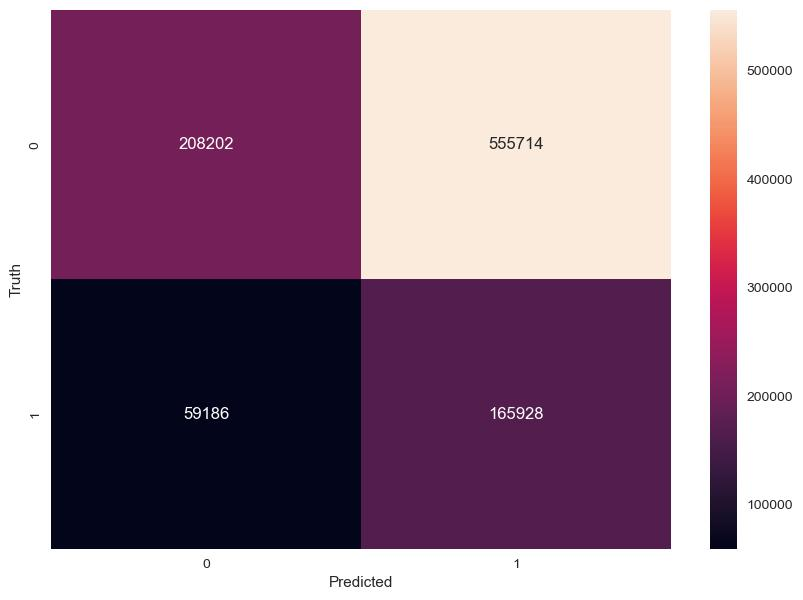

Clusters: 3, eps.: 0.5500000000000002


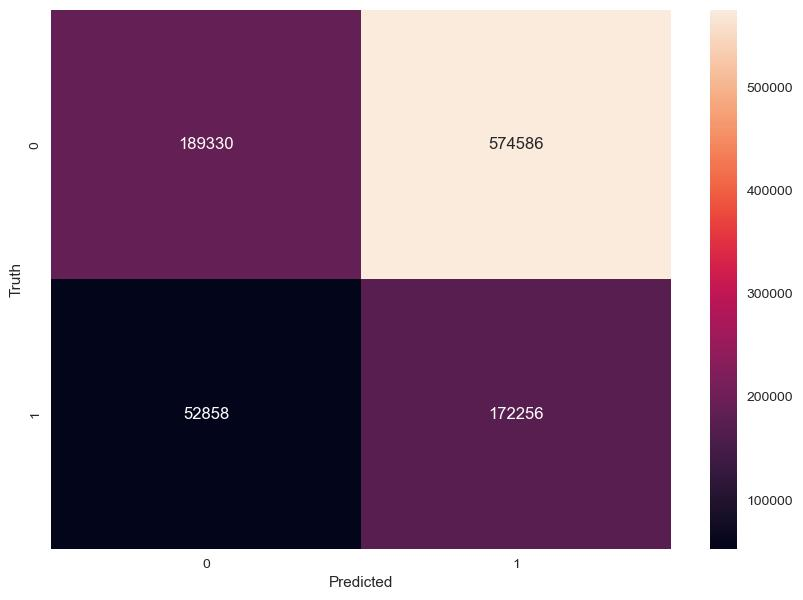

Clusters: 2, eps.: 0.6000000000000002


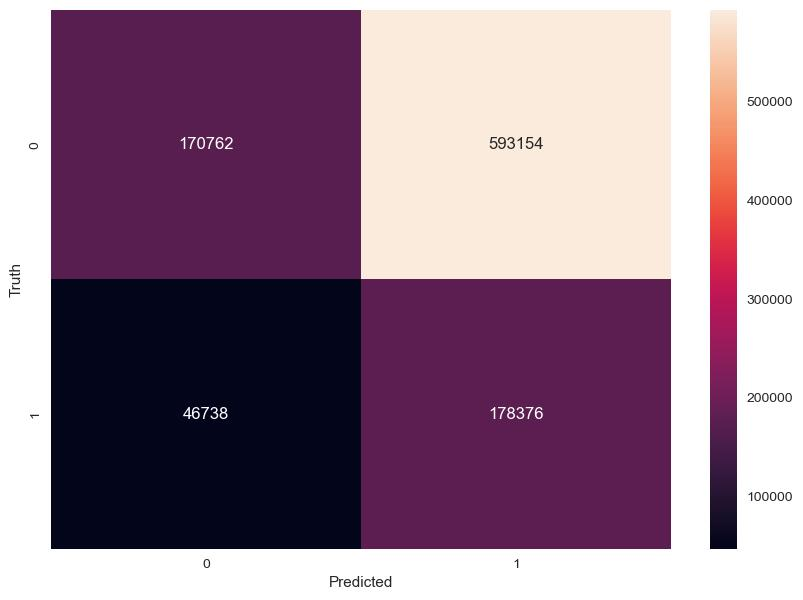

Clusters: 4, eps.: 0.6500000000000001


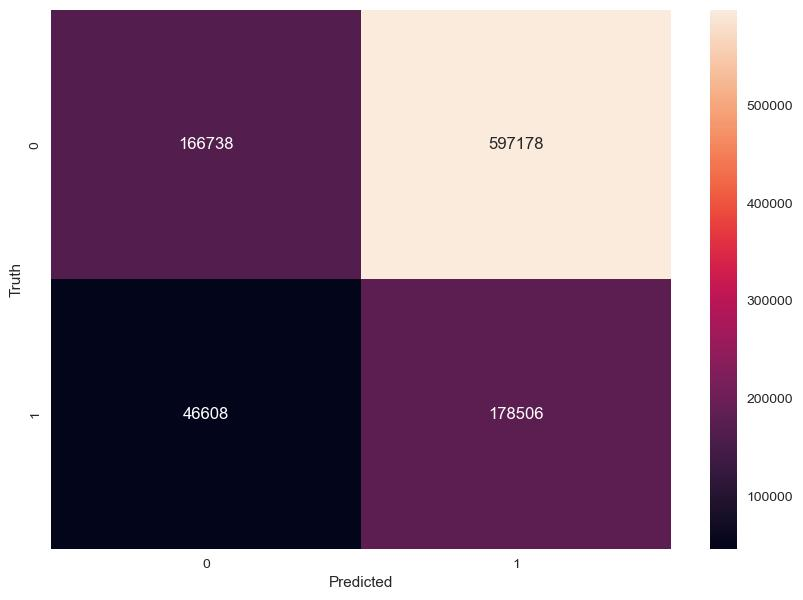

Clusters: 3, eps.: 0.7000000000000002


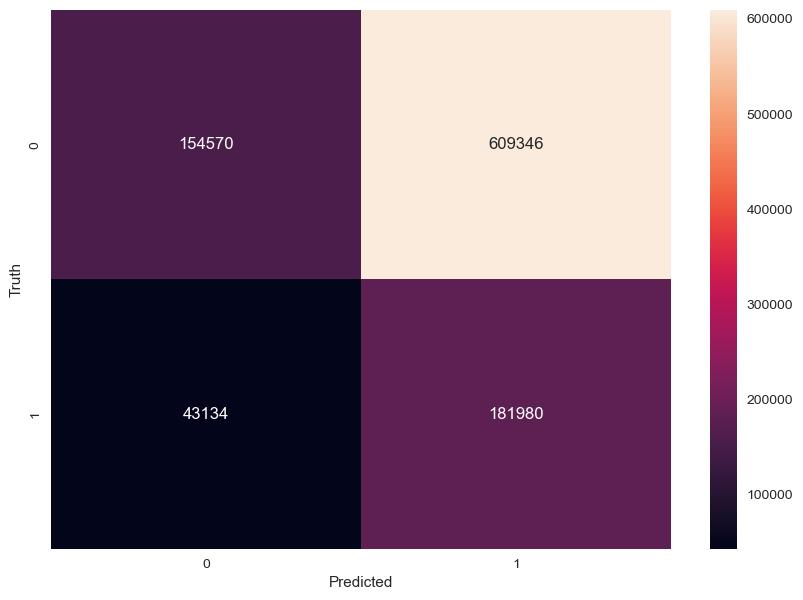

Clusters: 3, eps.: 0.7500000000000002


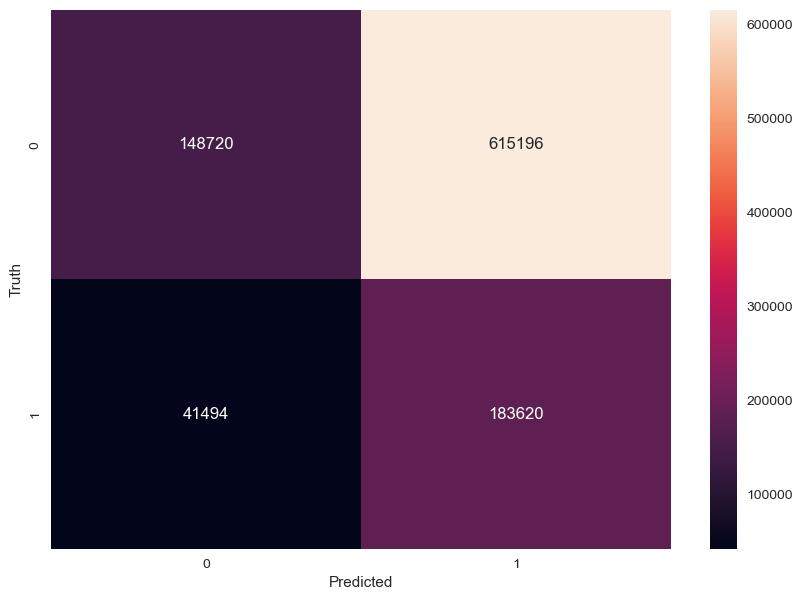

Clusters: 2, eps.: 0.8000000000000002


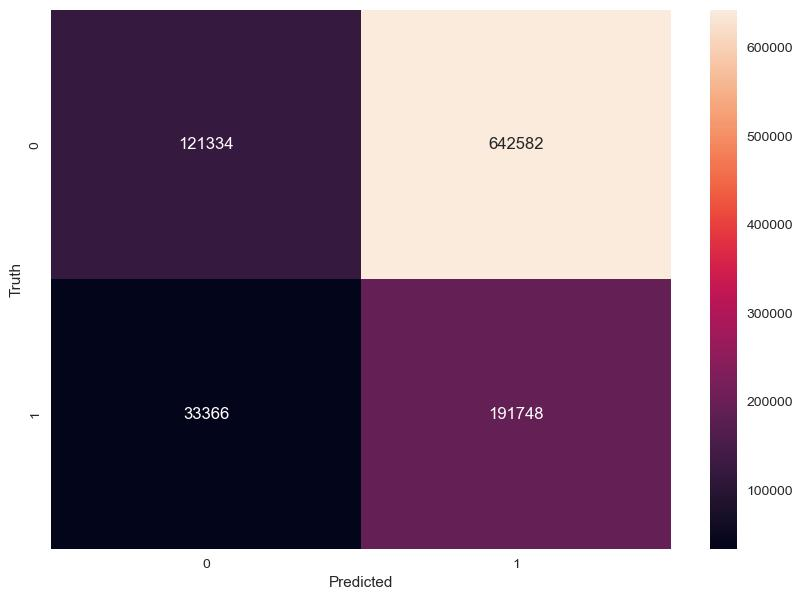

Clusters: 2, eps.: 0.8500000000000002


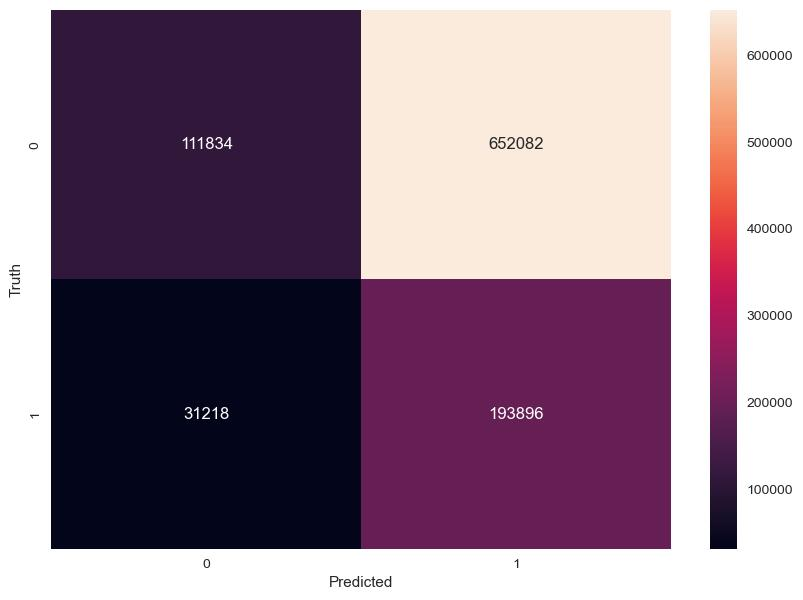

Clusters: 2, eps.: 0.9000000000000002


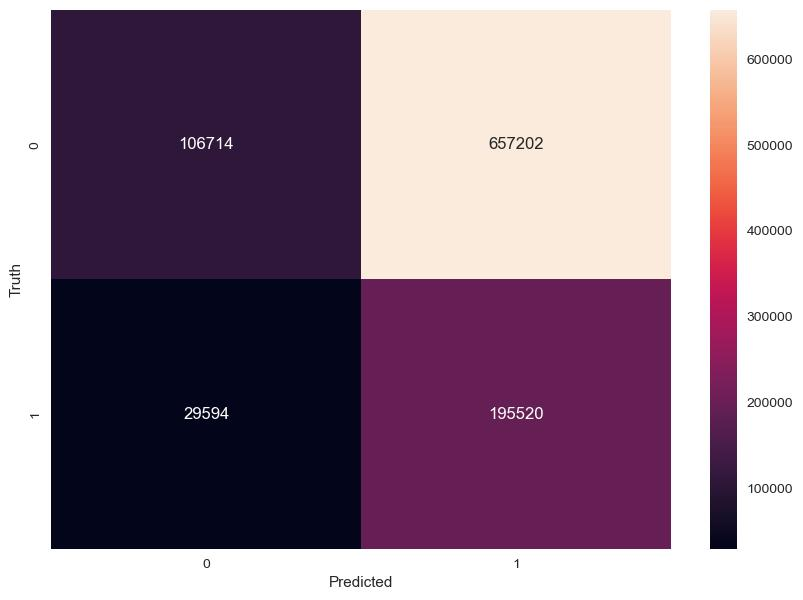

Clusters: 2, eps.: 0.9500000000000003


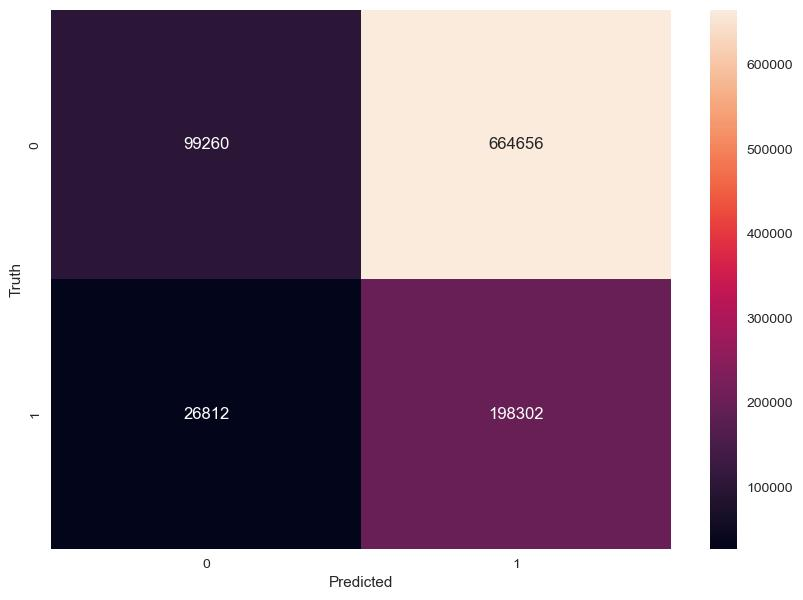

Clusters: 2, eps.: 1.0000000000000004


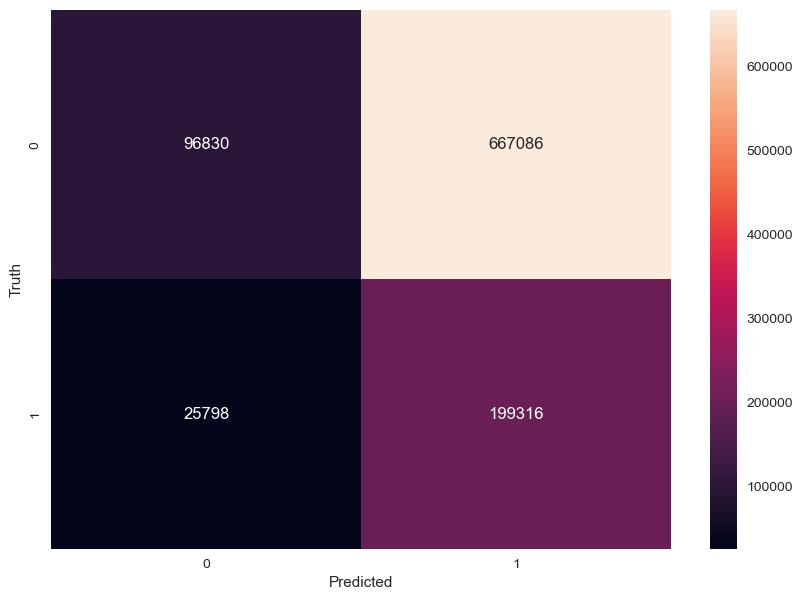

Clusters: 2, eps.: 1.0500000000000003


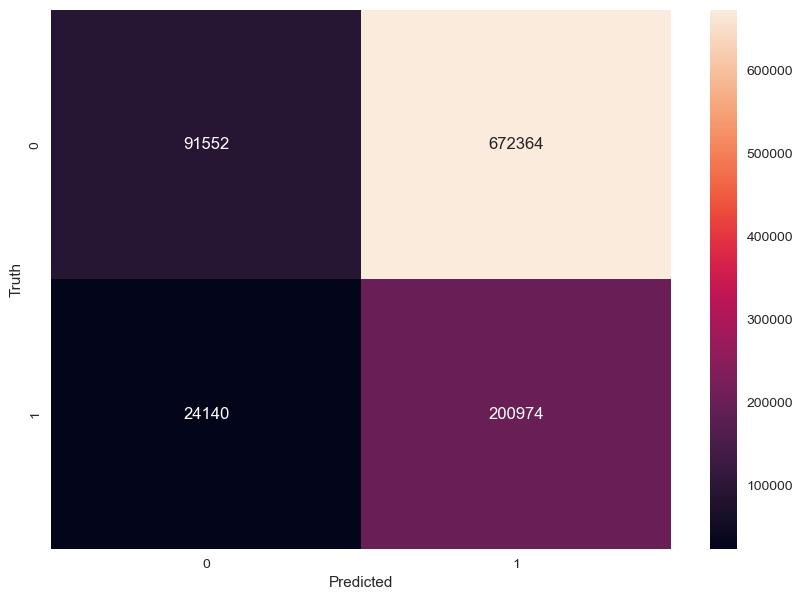

Clusters: 2, eps.: 1.1000000000000005


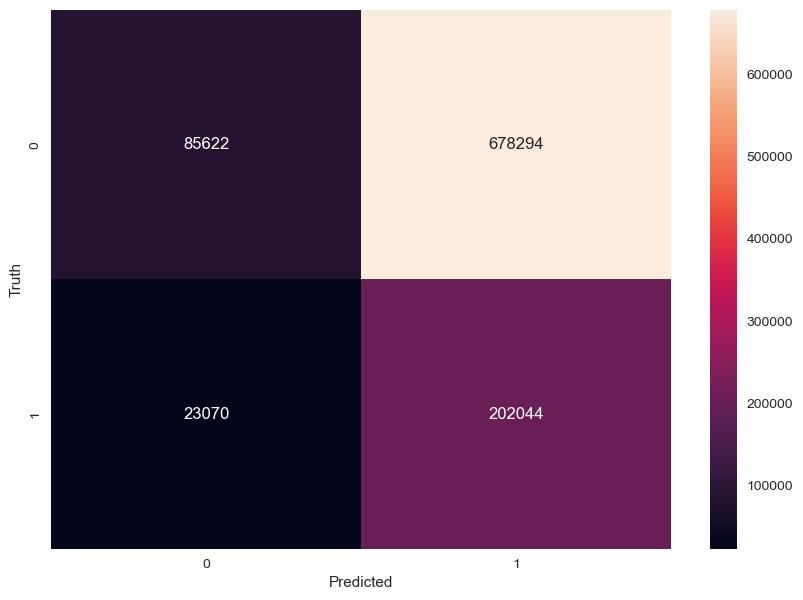

Clusters: 2, eps.: 1.1500000000000004


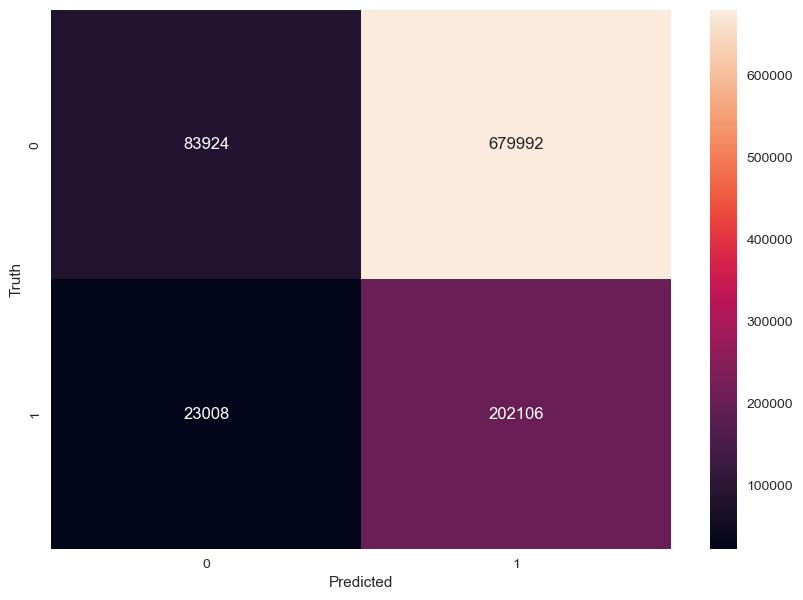

In [126]:
for pair_confusion_matrix_result in pair_confusion_matrices:
    print(f'Clusters: {pair_confusion_matrix_result[2]}, eps.: {pair_confusion_matrix_result[0]}')
    show_contingency_matrix(pair_confusion_matrix_result[1])

## Graphical description of clustered data (DBSCAN)

In [127]:
print_best_coefficients_dbscan('Silhouette', sil_scores)
print_best_coefficients_dbscan('Calinski-Harabasz', calinski_scores)
print_best_coefficients_dbscan('Davies-Bouldin', davies_scores, False)
print_best_coefficients_dbscan('Rand', rand_scores)
print_best_coefficients_dbscan('Adjusted Rand', adjusted_rand_scores)
print_best_coefficients_dbscan('Mutual info', mutual_info_scores)
print_best_coefficients_dbscan('Adjusted mutual info', adjusted_mutual_info_scores)
print_best_coefficients_dbscan('Normalized mutual info', normalized_mutual_info_scores)
print_best_coefficients_dbscan('Homogeneity', homogeneity_scores)
print_best_coefficients_dbscan('Completeness', completeness_scores)
print_best_coefficients_dbscan('V-measure', v_measure_scores)
print_best_coefficients_dbscan('Fowlkes-Mallows', fowlkes_mallows_scores)

Max. Silhouette score: 0.760 (clusters: 2, eps.: 1.1500000000000004)
Max. Calinski-Harabasz score: 298.278 (clusters: 2, eps.: 0.9500000000000003)
Min. Davies-Bouldin score: 1.357 (clusters: 3, eps.: 0.7000000000000002)
Max. Rand score: 0.578 (clusters: 9, eps.: 0.15000000000000002)
Max. Adjusted Rand score: 0.014 (clusters: 9, eps.: 0.15000000000000002)
Max. Mutual info score: 0.056 (clusters: 9, eps.: 0.15000000000000002)
Max. Adjusted mutual info score: 0.018 (clusters: 3, eps.: 0.5000000000000001)
Max. Normalized mutual info score: 0.038 (clusters: 9, eps.: 0.15000000000000002)
Max. Homogeneity score: 0.032 (clusters: 9, eps.: 0.15000000000000002)
Max. Completeness score: 0.081 (clusters: 2, eps.: 1.0500000000000003)
Max. V-measure score: 0.038 (clusters: 9, eps.: 0.15000000000000002)
Max. Fowlkes-Mallows score: 0.454 (clusters: 2, eps.: 1.1000000000000005)


Eps.: 0.15


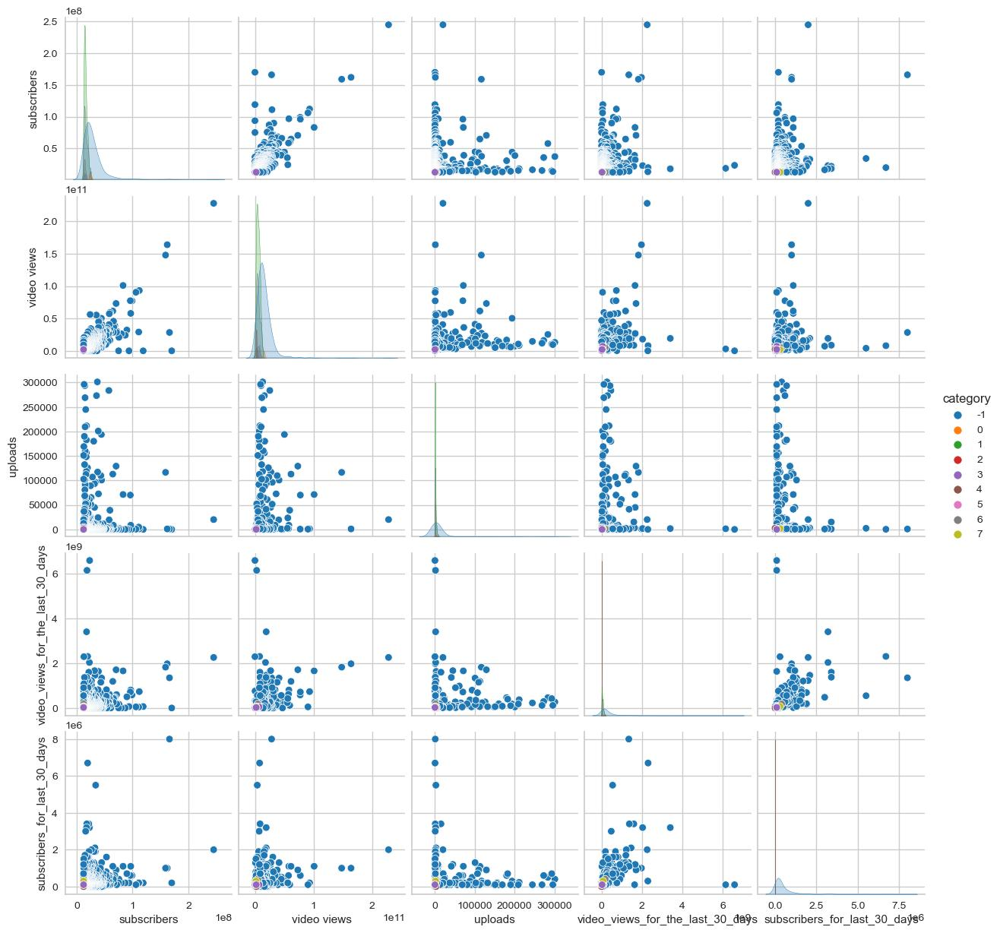

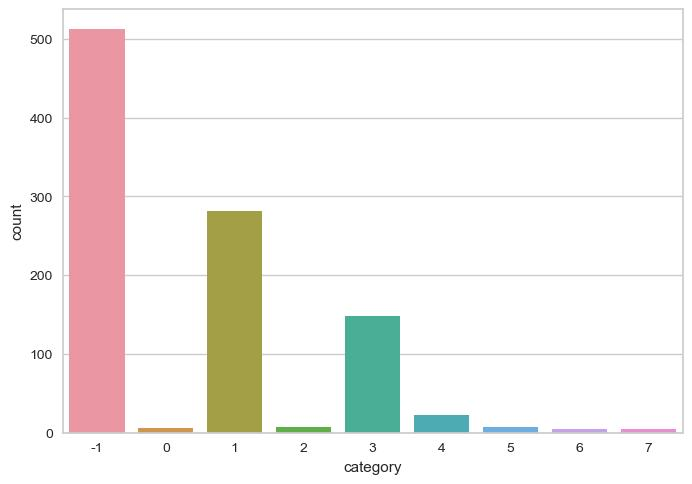

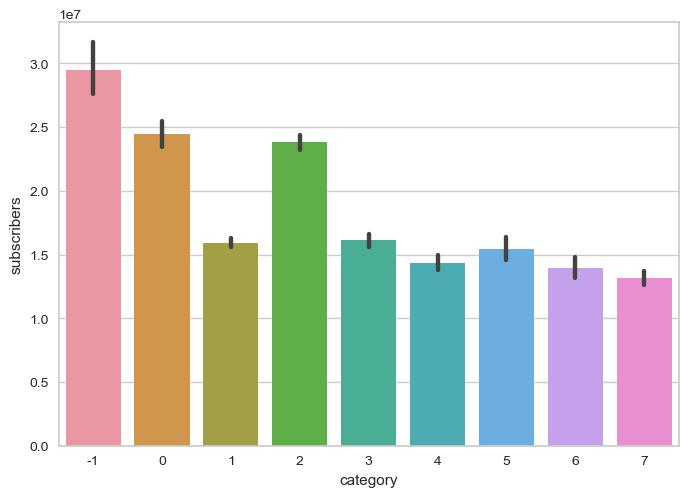

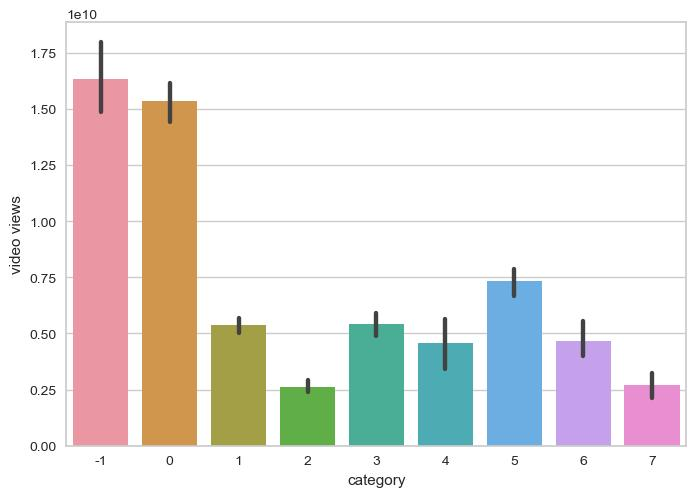

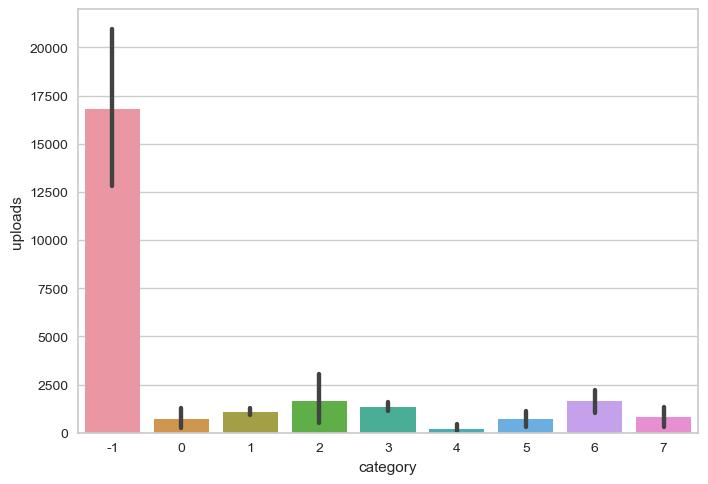

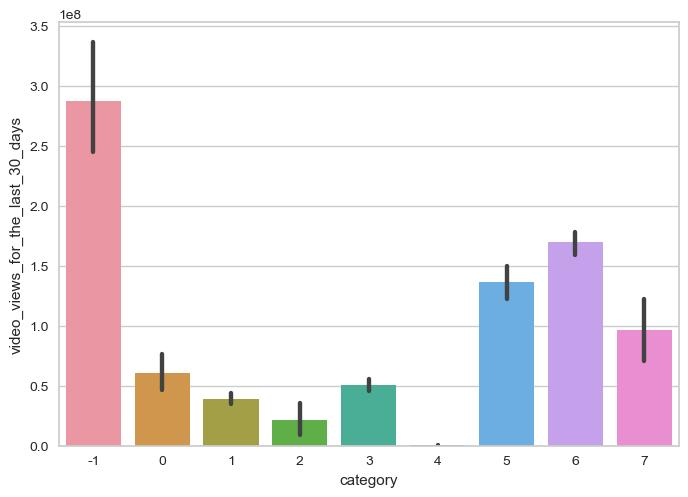

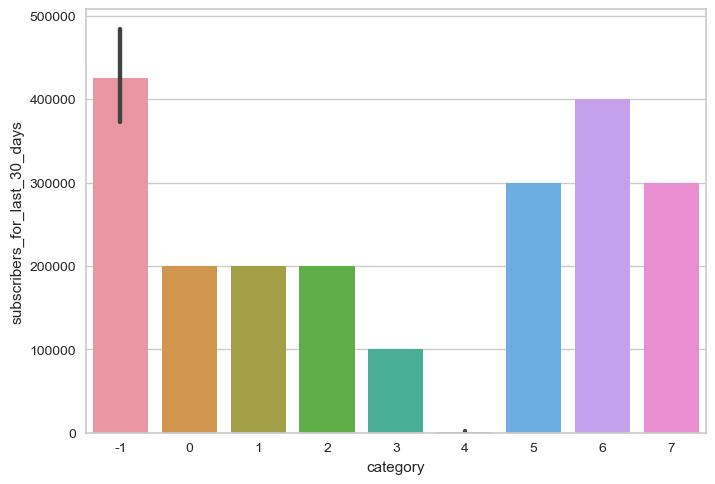


Eps.: 0.5


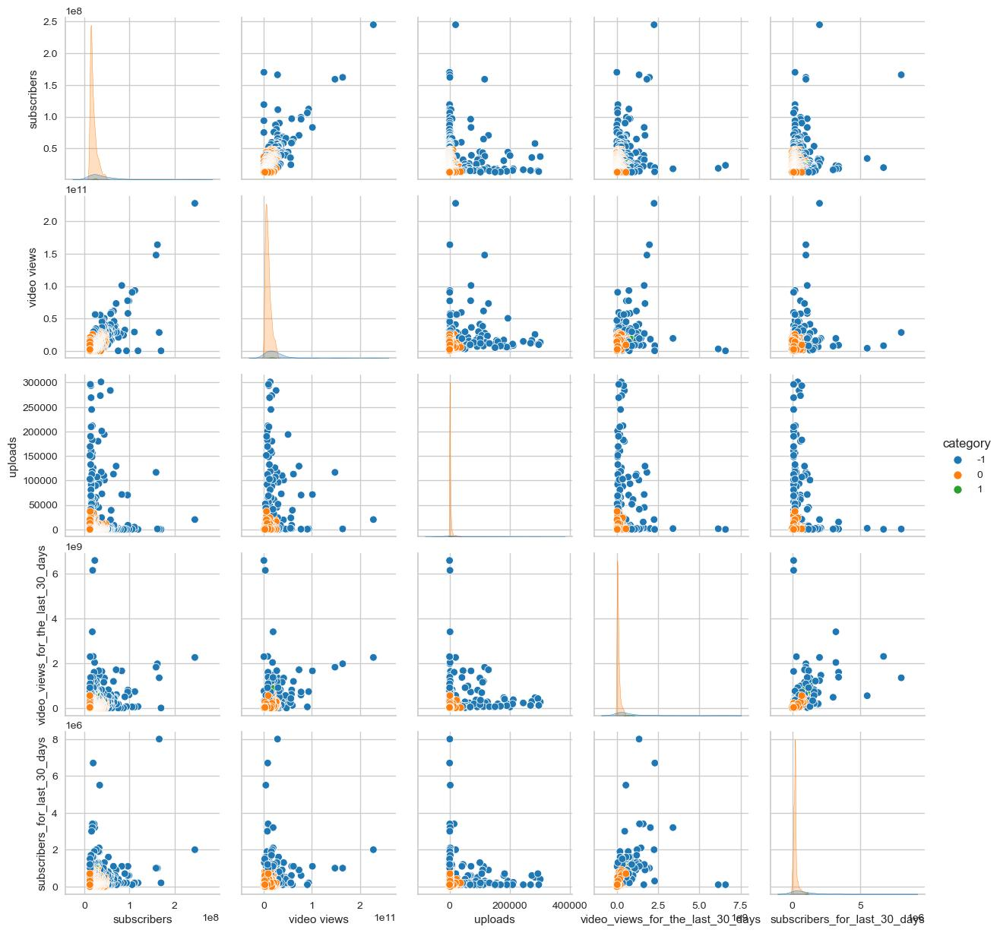

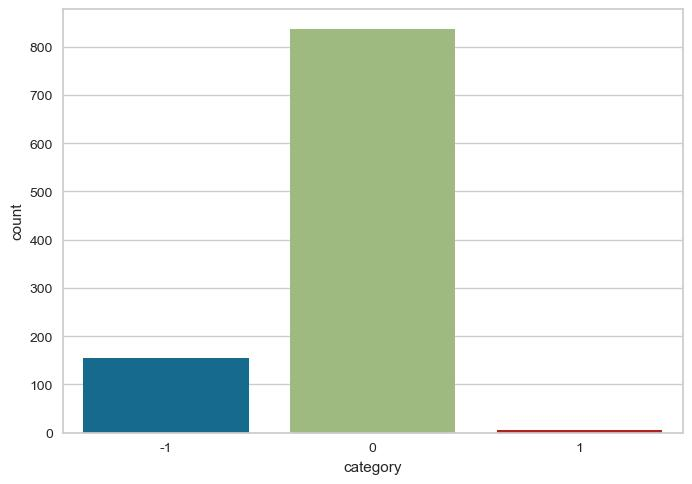

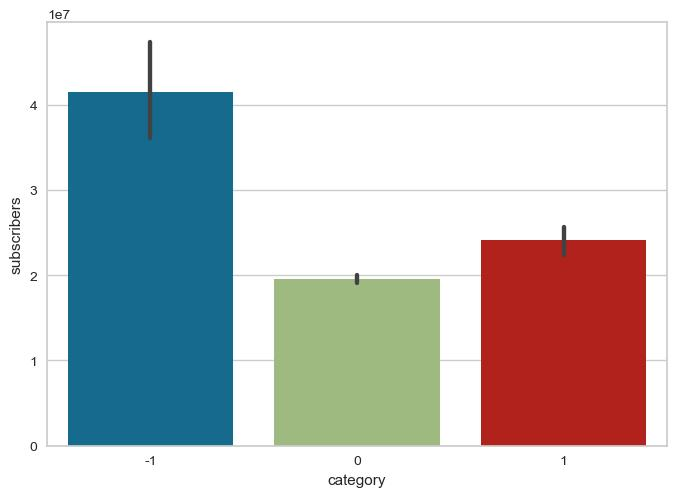

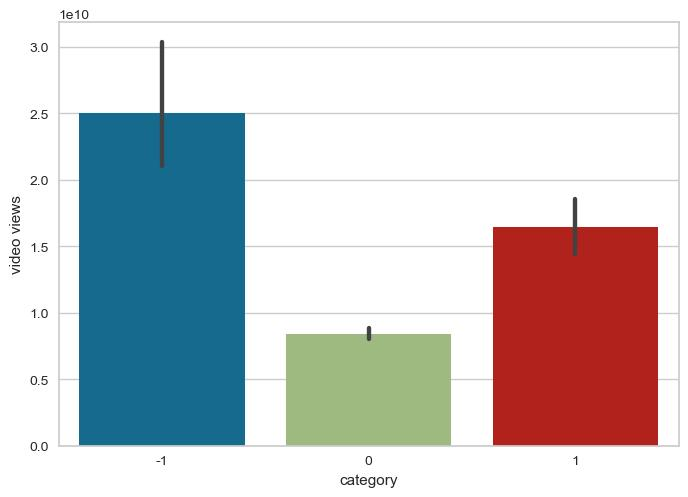

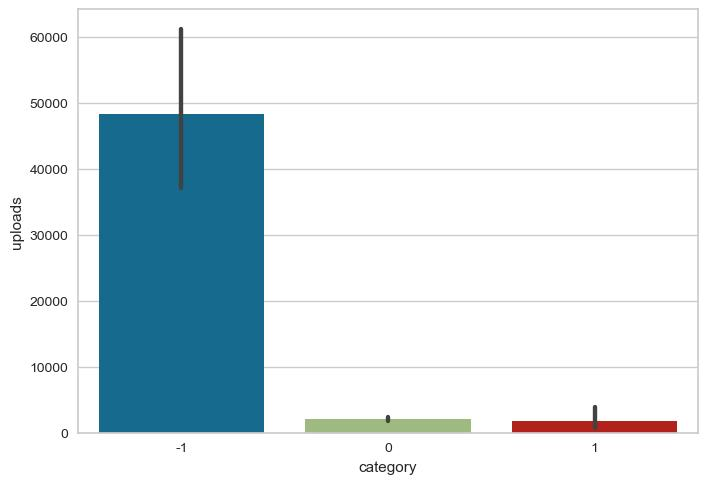

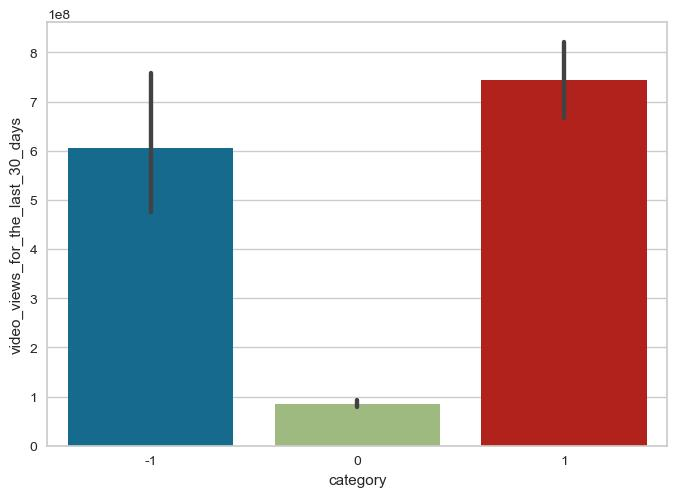

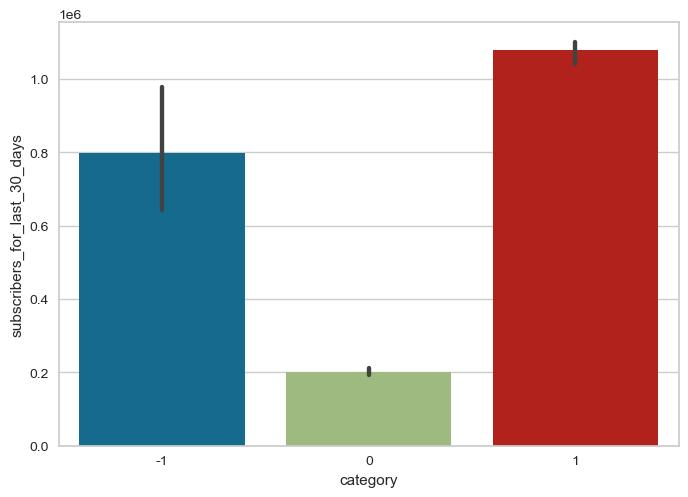


Eps.: 0.7


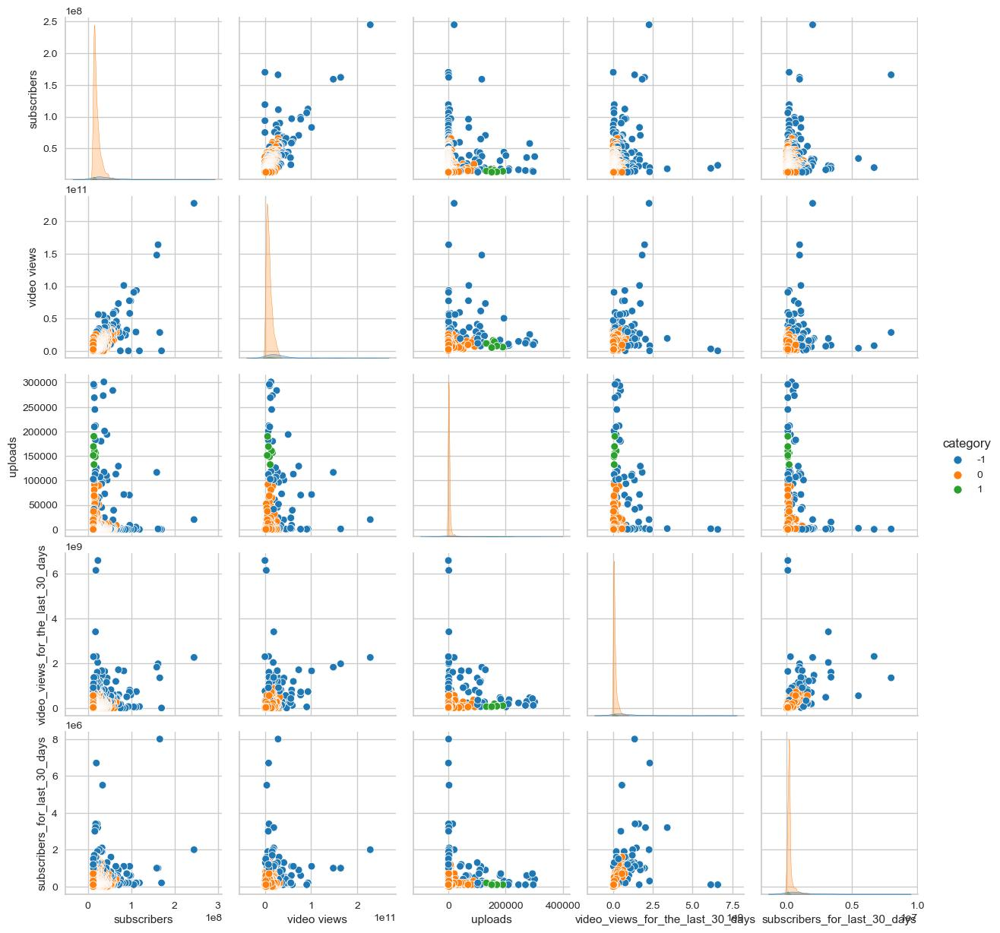

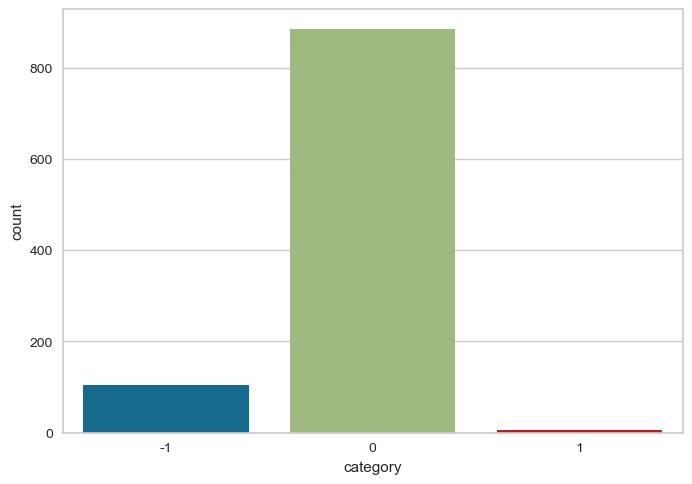

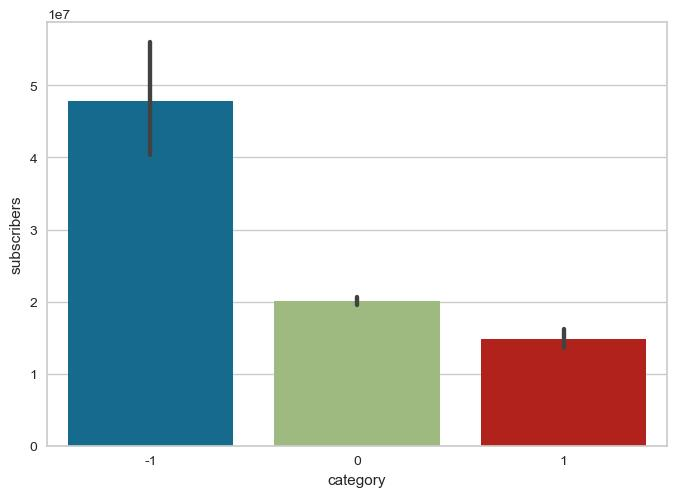

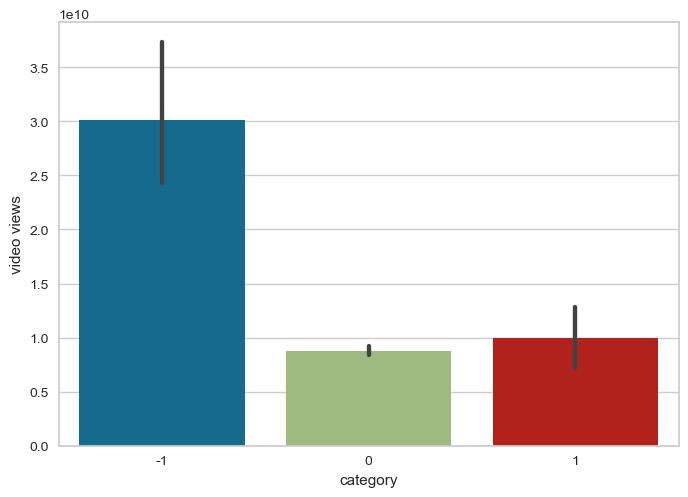

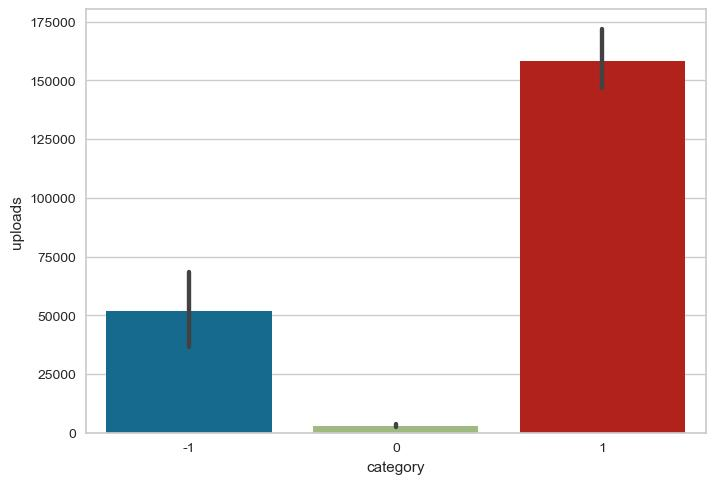

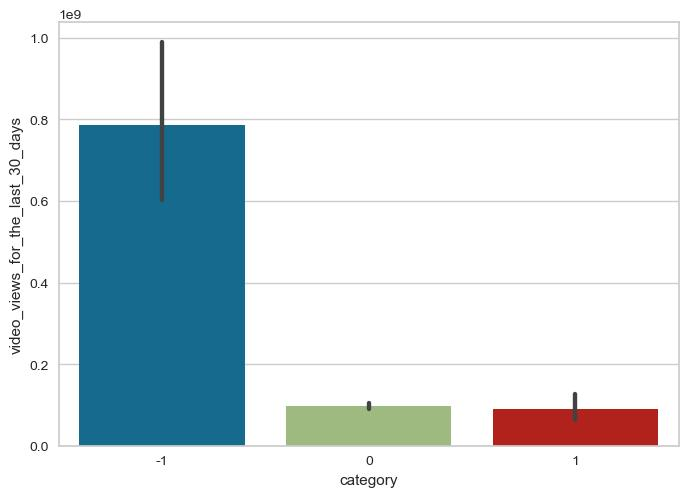

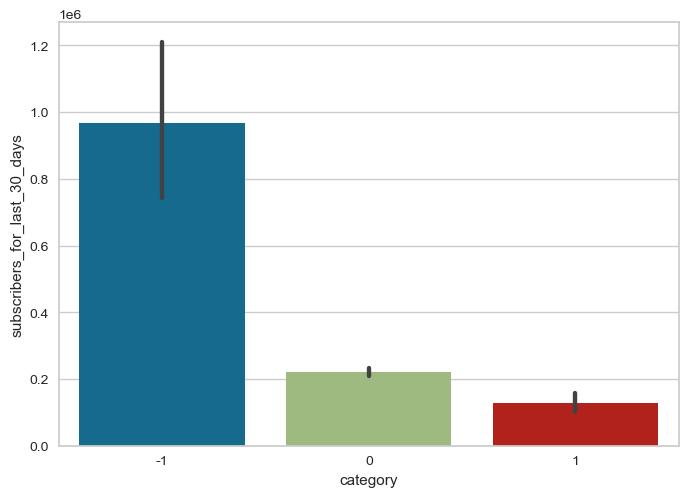


Eps.: 0.95


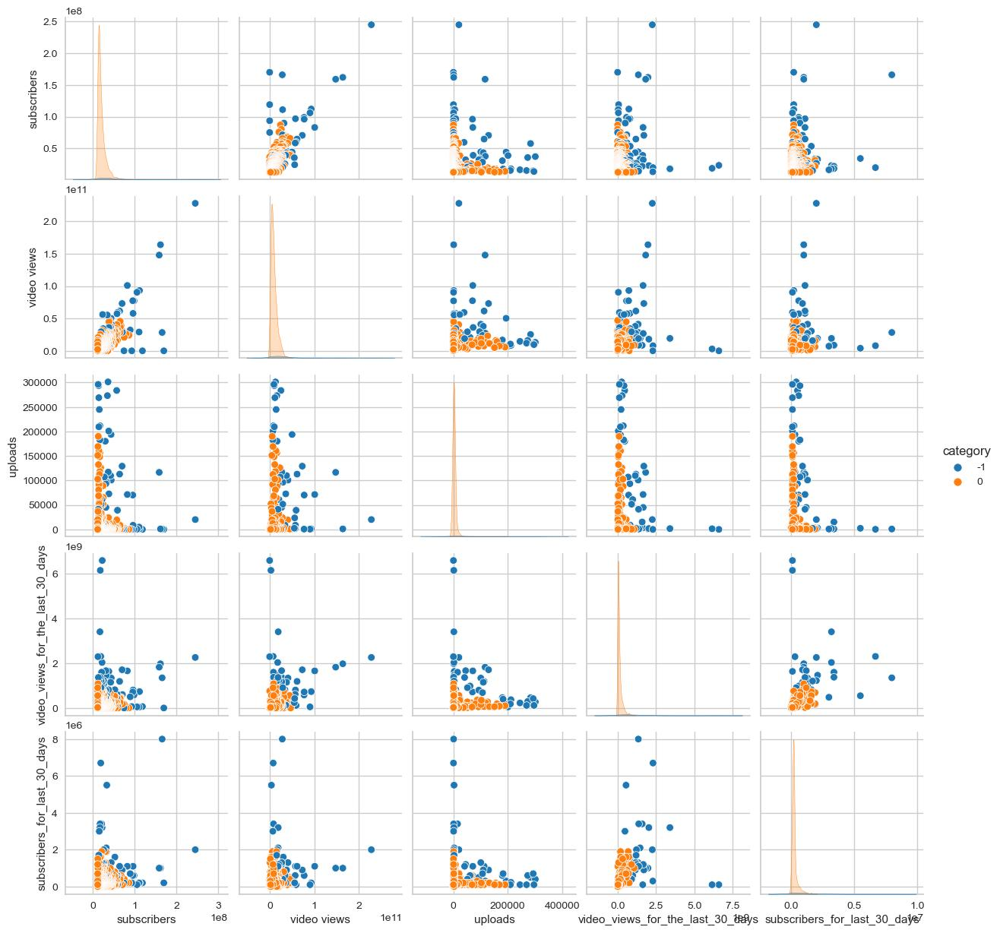

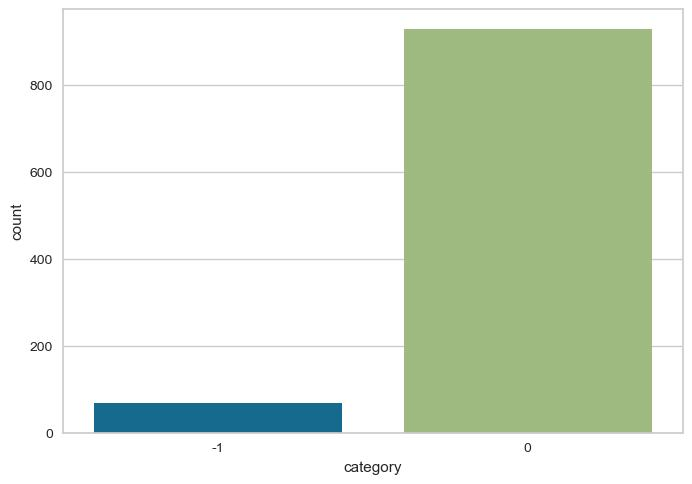

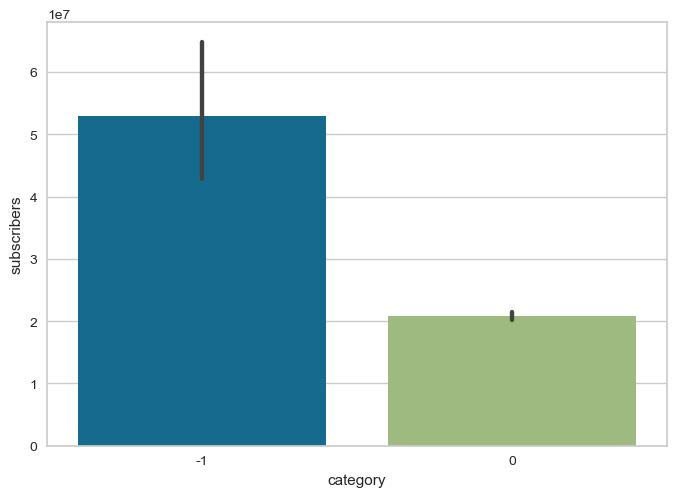

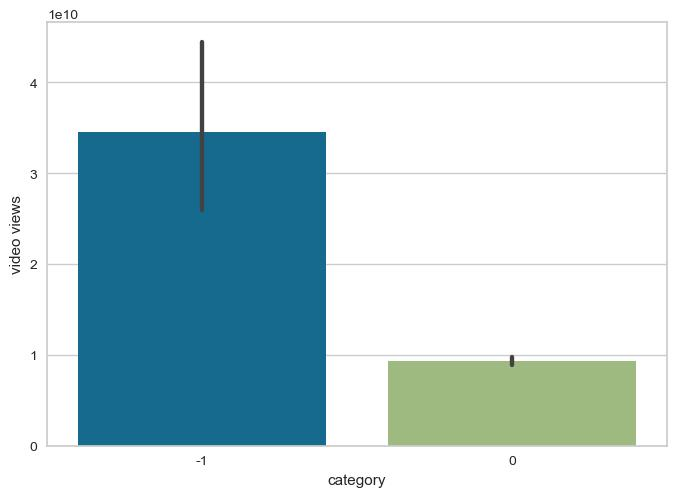

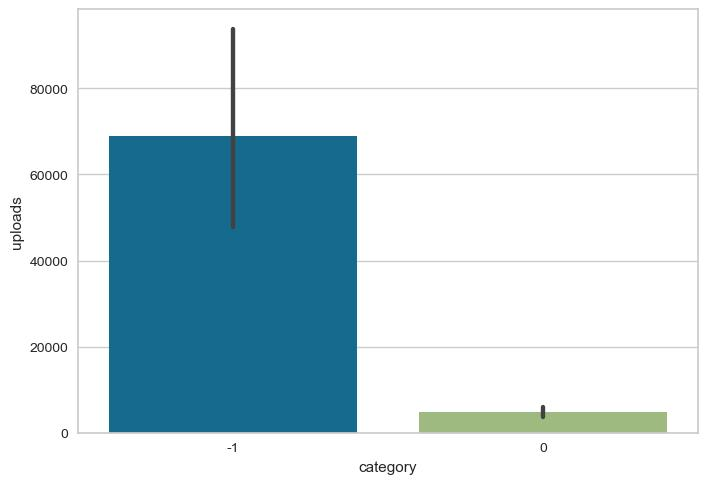

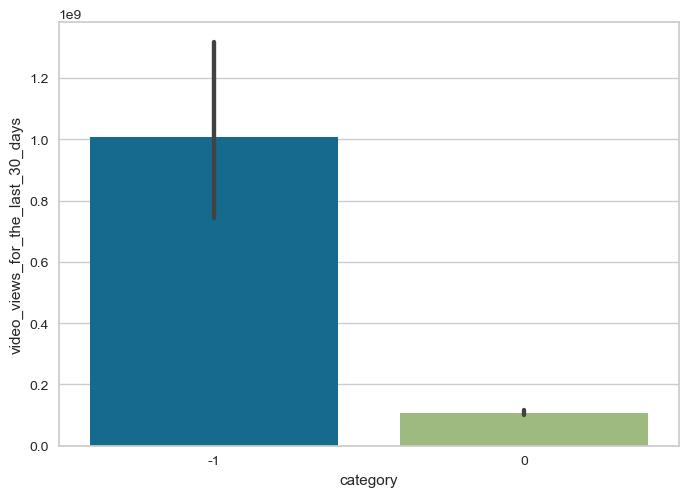

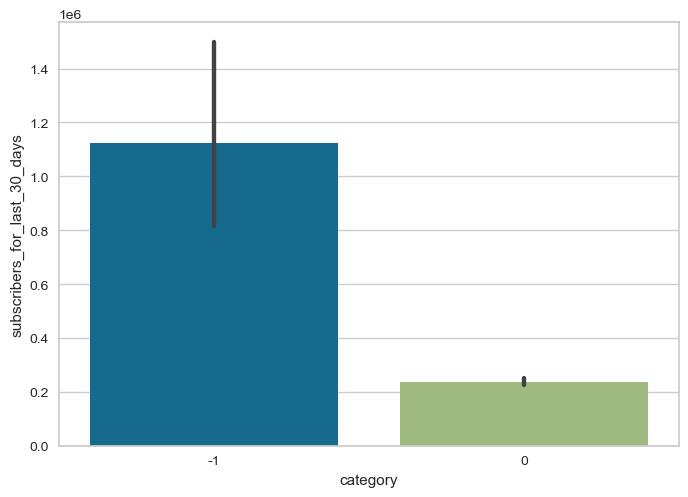


Eps.: 1.05


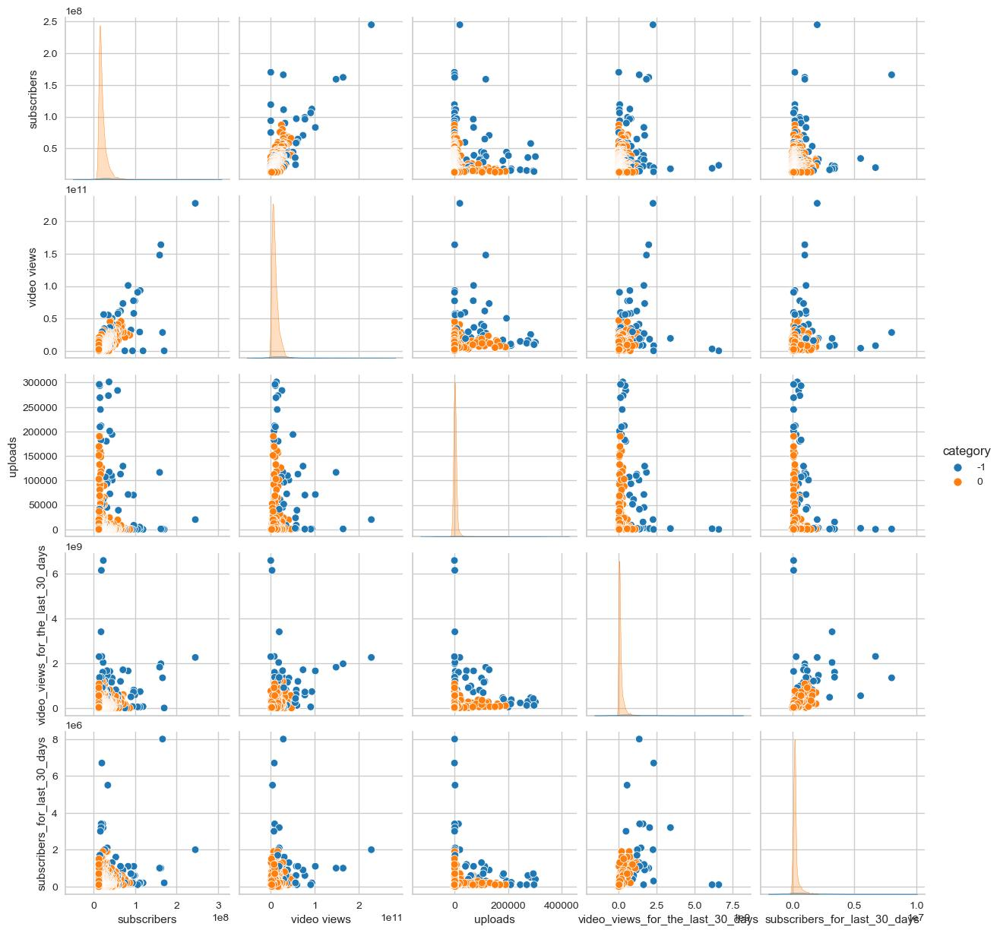

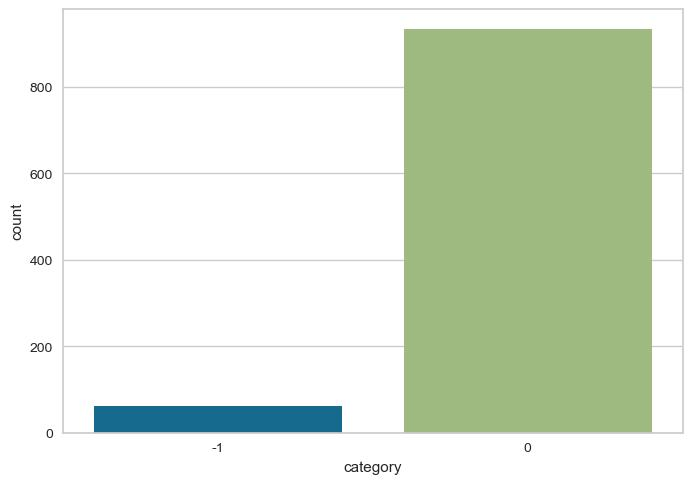

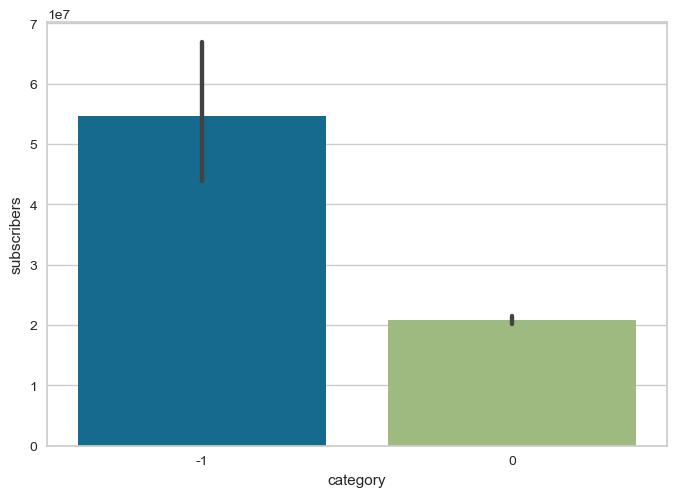

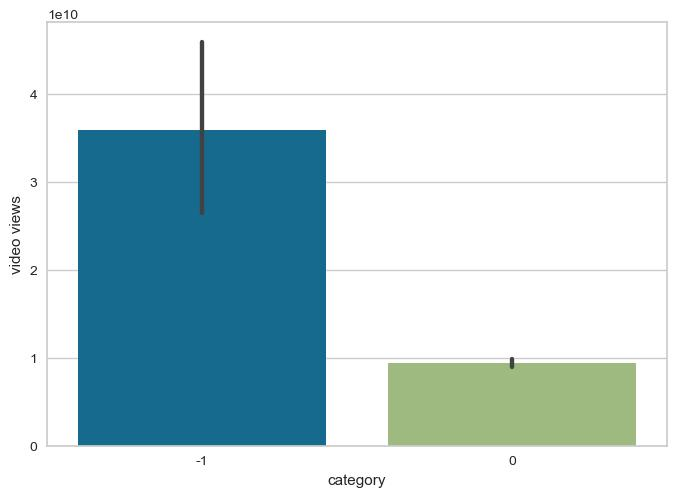

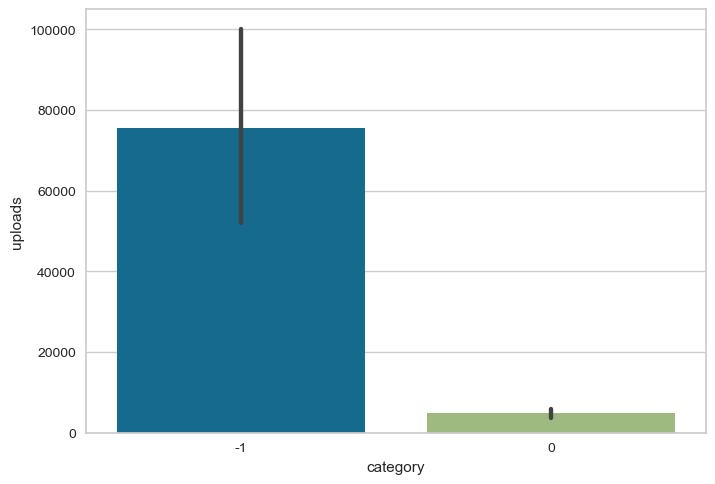

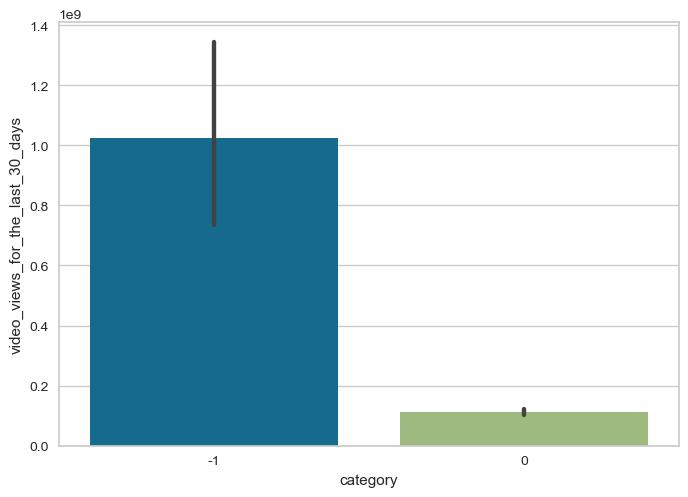

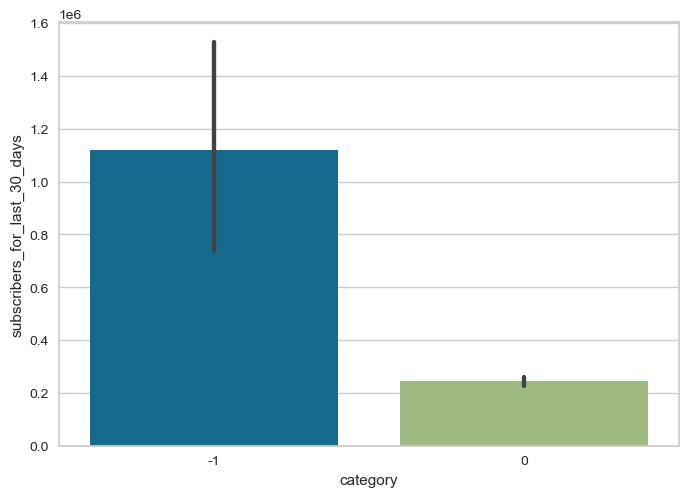


Eps.: 1.1


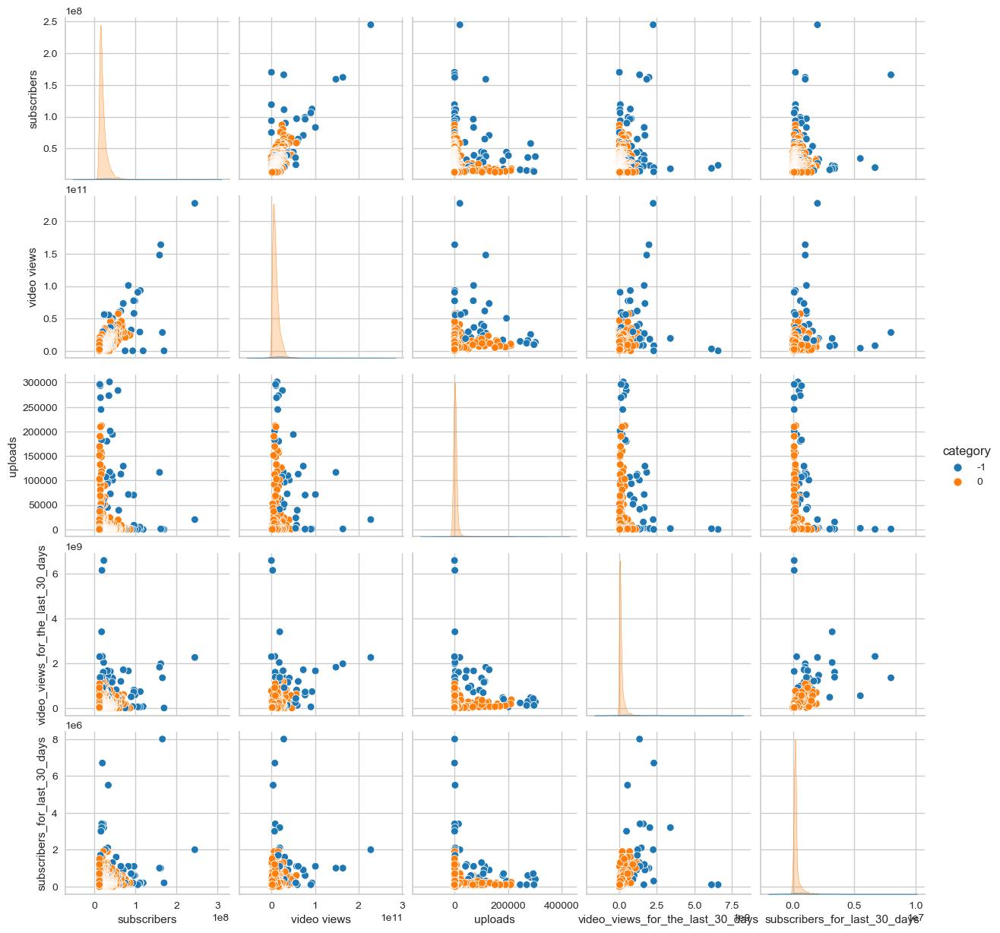

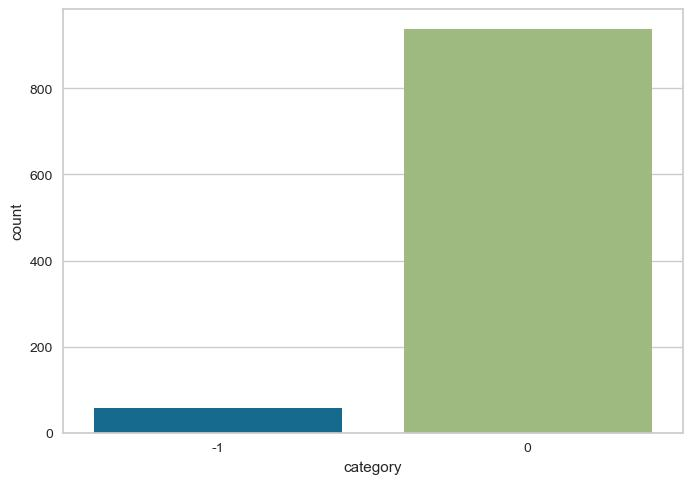

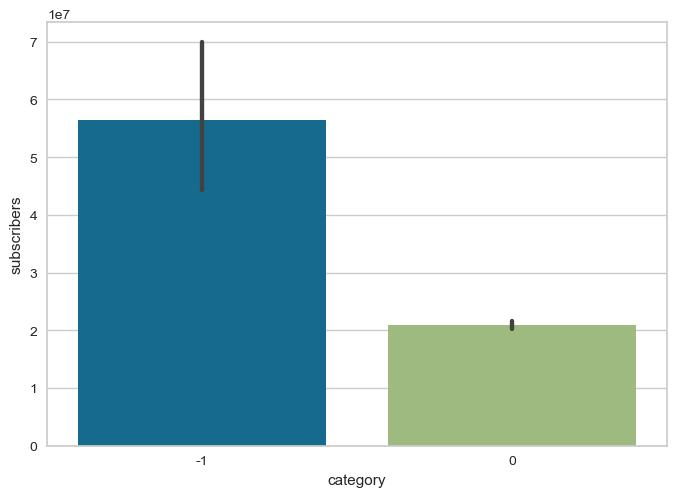

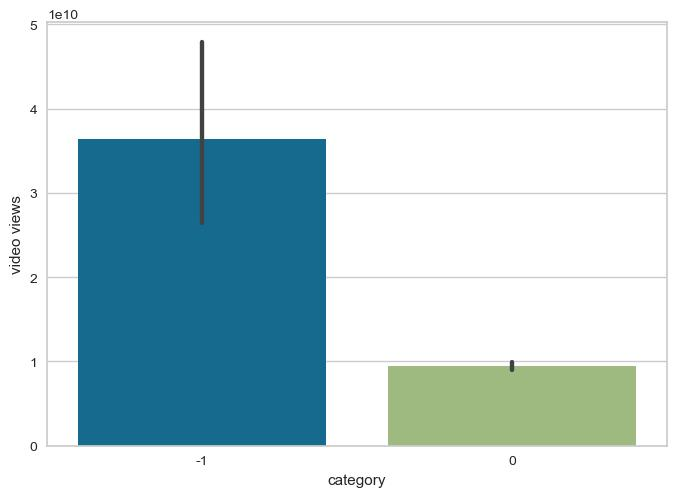

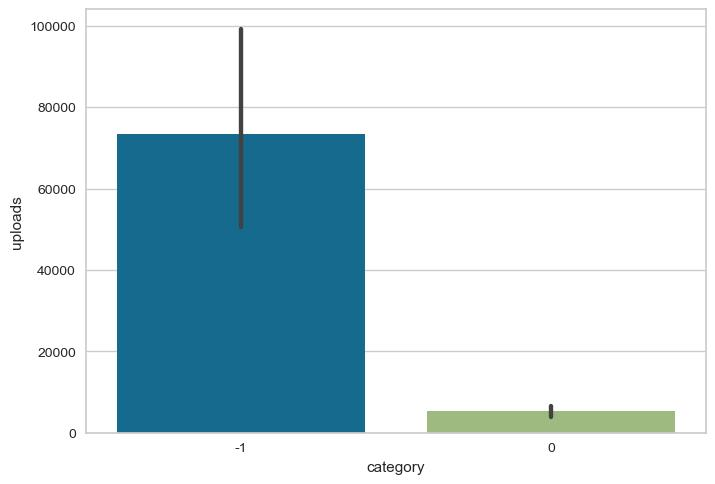

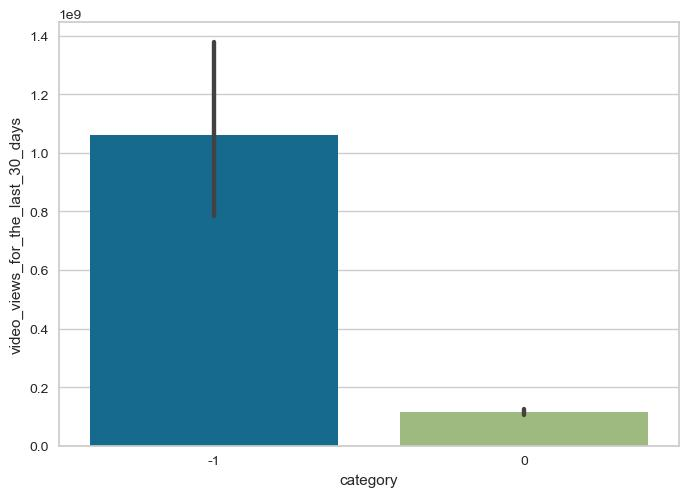

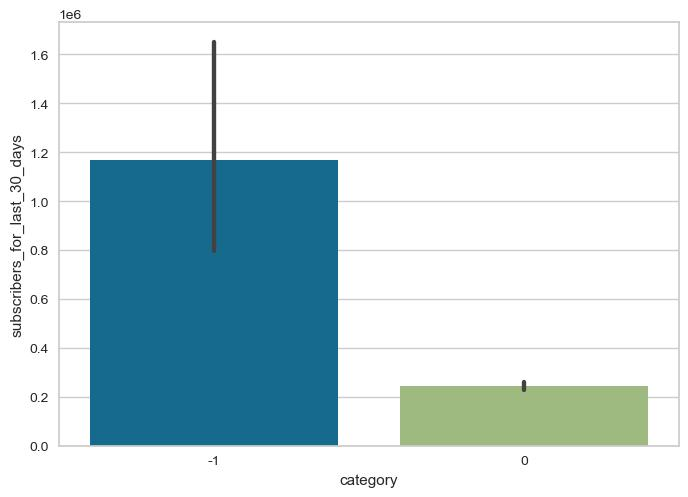


Eps.: 1.15


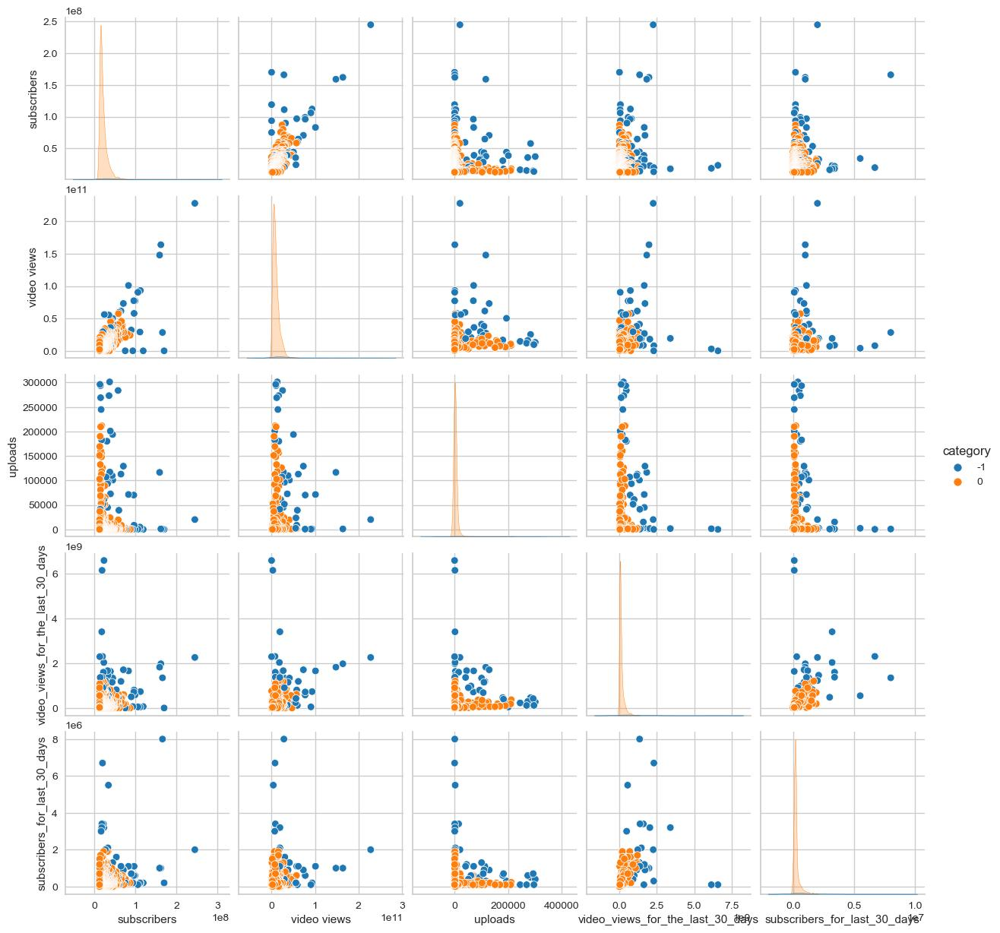

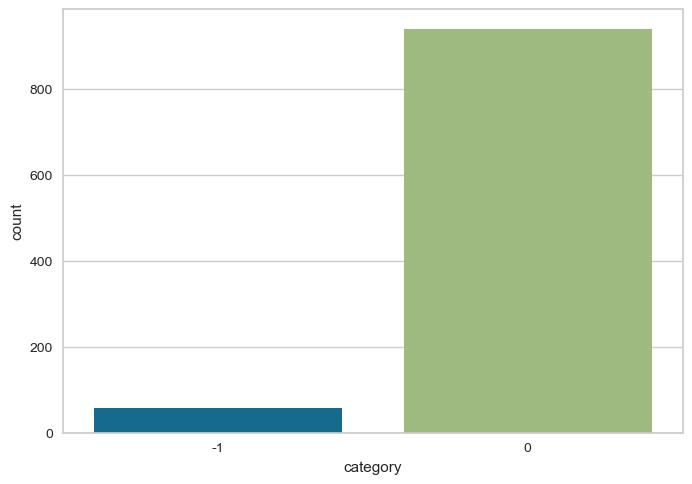

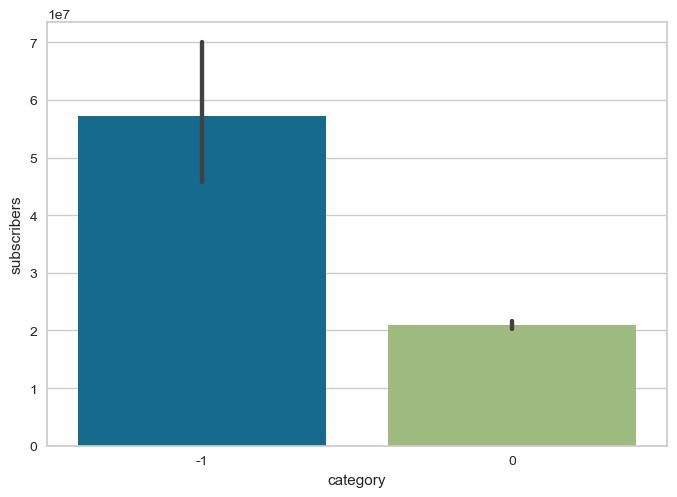

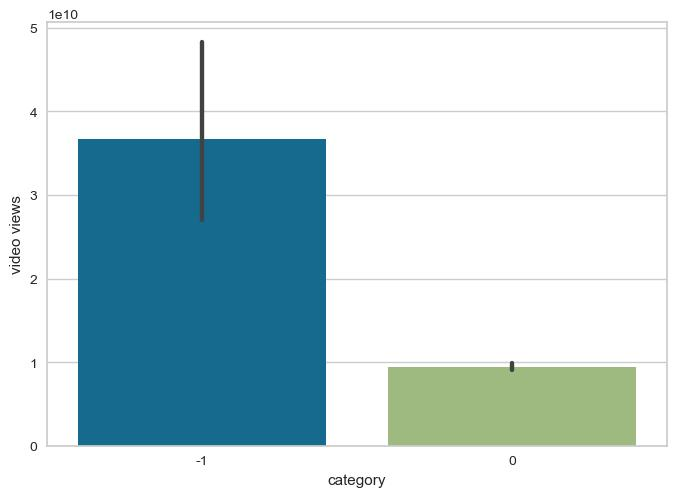

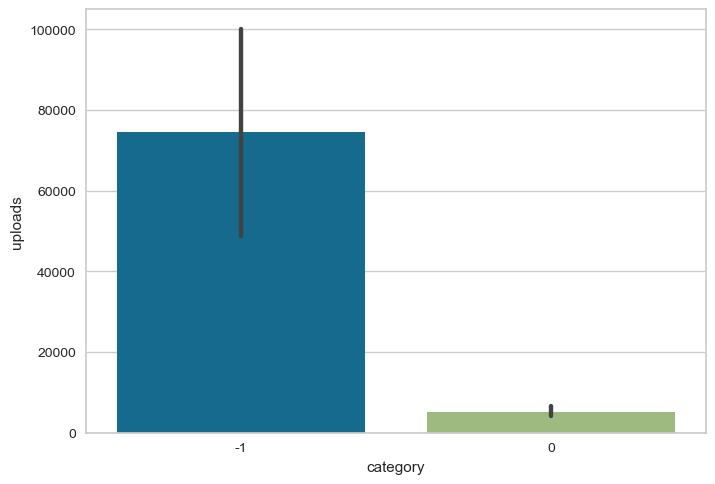

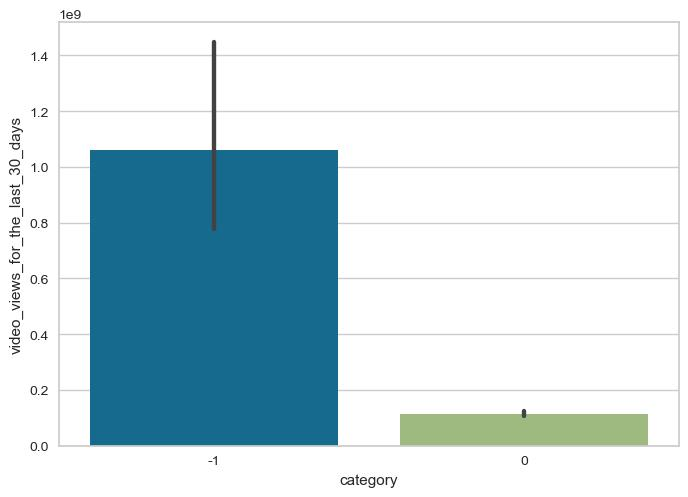

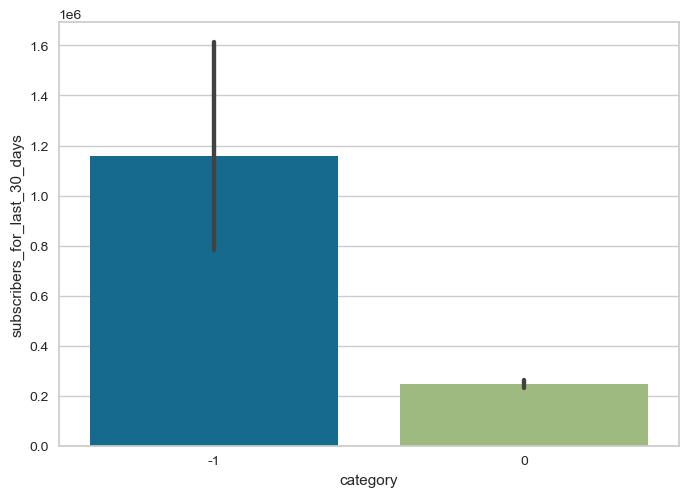

In [129]:
eps_list = sorted([1.15, 0.95, 0.7, 0.15, 0.5, 1.05, 1.1])
for eps in eps_list:
    print(f'Eps.: {eps}')
    dbscan = DBSCAN(eps = eps)
    dataset_after_clustering = dataset_clustering.copy()
    categories = dbscan.fit_predict(dataset_clustering.values)
    dataset_after_clustering = pd.DataFrame(
        scaler.inverse_transform(dataset_after_clustering),
        columns = dataset_clustering.columns
    )
    dataset_after_clustering['category'] = categories
    describe_clustered_data(dataset_after_clustering)
    print('')